# `Forecast of Egyptian Current Account`

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import warnings
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller
warnings.filterwarnings("ignore")


In [4]:
df=pd.read_excel('thesis data.xlsx')

In [5]:
df.head()

,FY,Quarters,Trade_Balance,Exports,Petroleum-Exports,Other_Exports,Imports,Petroleum-Imports,Other_Imports,Petroleum_Balance,...,CRUSE_OIL_PRICE_INDEX,EUO_AREA_GDP_growth,NATURAL_GAS_DOLLAR,NATURAL_GAS_INDEX,NON_FUEL_COMMODITY_PRICE_INDEX,TARDE_VOLUME_PCHANGE,UNITED_SATES_GDP,Exchange_rate_EG_US,EUO_AREA_GDP_bn,EGYPT_GDP_bn
0,1995,1,-1397.9,1137.8,284.450,853.350,2535.7,507.1,2028.56,-222.7,...,38.36550,2.69700,1.80950,58.13550,60.63150,9.603,3.35650,3.392,2179.21425,60.200000
1,1995,2,-2125.0,1237.7,309.425,928.275,3362.7,672.5,2690.16,-363.1,...,39.12075,2.79650,1.75675,58.48725,61.63675,9.603,3.02025,3.392,2200.73610,60.200000
2,1995,3,-2157.8,1379.4,344.850,1034.550,3537.2,707.4,2829.76,-362.6,...,39.87600,2.89600,1.70400,58.83900,62.64200,6.599,2.68400,3.392,2368.61184,63.409577
3,1995,4,-2172.8,1202.1,300.525,901.575,3374.9,675.0,2699.92,-374.5,...,41.74525,2.57925,1.95025,62.54475,62.74850,6.599,2.95600,3.392,2396.37760,65.167777
4,1996,1,-2285.6,1113.2,278.300,834.900,3398.8,679.8,2719.04,-401.5,...,43.61450,2.26250,2.19650,66.25050,62.85500,6.599,3.22800,3.391,2418.68592,66.168685


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   FY                              117 non-null    int64  
 1   Quarters                        117 non-null    int64  
 2   Trade_Balance                   117 non-null    float64
 3   Exports                         117 non-null    float64
 4   Petroleum-Exports               117 non-null    float64
 5   Other_Exports                   117 non-null    float64
 6   Imports                         117 non-null    float64
 7   Petroleum-Imports               117 non-null    float64
 8   Other_Imports                   117 non-null    float64
 9   Petroleum_Balance               117 non-null    float64
 10  Other_Balance                   117 non-null    float64
 11  Services_Balance                117 non-null    float64
 12  Receipts                        117 

In [7]:
# drop redundant variables
df.drop(
    columns=[
        'Services_Balance',
        'Receipts',
        'Transportation_reciepts',
        'Government_Receipts',
        'Other',
        'Payments',
        'Government_Expenditures',
        'of_which:_Interest_Paid',
        'Private_Transfers_(net)',
        'Income_Balance',
        'Other_services_Payments',
        'Petroleum_Balance',
        'Other_Balance'
    ], 
    inplace=True
)


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117 entries, 0 to 116
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   FY                              117 non-null    int64  
 1   Quarters                        117 non-null    int64  
 2   Trade_Balance                   117 non-null    float64
 3   Exports                         117 non-null    float64
 4   Petroleum-Exports               117 non-null    float64
 5   Other_Exports                   117 non-null    float64
 6   Imports                         117 non-null    float64
 7   Petroleum-Imports               117 non-null    float64
 8   Other_Imports                   117 non-null    float64
 9   Suez_Canal_dues                 117 non-null    float64
 10  Travel_reciepts                 117 non-null    float64
 11  Transportation_Payments         117 non-null    float64
 12  Travel_Payments                 117 

In [9]:
df.isnull().sum()

FY                                0
Quarters                          0
Trade_Balance                     0
Exports                           0
Petroleum-Exports                 0
Other_Exports                     0
Imports                           0
Petroleum-Imports                 0
Other_Imports                     0
Suez_Canal_dues                   0
Travel_reciepts                   0
Transportation_Payments           0
Travel_Payments                   0
Income_receipts                   0
Income_payments                   0
Transfers                         0
Worker_Remittances                0
Official_Transfers_(net)          0
Current_Account_Balance           0
EGYPT_INFLATION_PCHANGE           0
KUWAIT_GDP                        0
QATAR_GDP                         0
SAUDI_ARABIA_GDP                  0
UAE_GDP                           0
ADVANCED_ECONOMY_GDP              0
WORLD_GDP                         0
CRUDE_OIL_PRICE_DOLLAR            0
CRUSE_OIL_PRICE_INDEX       

In [10]:
df.duplicated().sum()

0

In [12]:

# Define function to convert fiscal year & quarter to actual start month
def fiscal_to_date(row):
    year = int(row['FY'])
    quarter = int(row['Quarters'])
    
    # Fiscal year starts in July, so:
    if quarter == 1:
        month = 7
        year = year - 1  # Q1 of FY1995 = July 1994
    elif quarter == 2:
        month = 10
        year = year - 1
    elif quarter == 3:
        month = 1
    elif quarter == 4:
        month = 4
    
    return pd.Timestamp(year=year, month=month, day=1)

# Apply the function
df['Date'] = df.apply(fiscal_to_date, axis=1)

# Optional: Drop FY and Quarters if no longer needed
# df.drop(columns=['FY', 'Quarters'], inplace=True)

# Confirm result
print(df.head())

df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)



     FY  Quarters  Trade_Balance  Exports  Petroleum-Exports  Other_Exports  \
0  1995         1        -1397.9   1137.8            284.450        853.350   
1  1995         2        -2125.0   1237.7            309.425        928.275   
2  1995         3        -2157.8   1379.4            344.850       1034.550   
3  1995         4        -2172.8   1202.1            300.525        901.575   
4  1996         1        -2285.6   1113.2            278.300        834.900   

   Imports  Petroleum-Imports  Other_Imports  Suez_Canal_dues  ...  \
0   2535.7              507.1        2028.56            497.8  ...   
1   3362.7              672.5        2690.16            542.9  ...   
2   3537.2              707.4        2829.76            520.8  ...   
3   3374.9              675.0        2699.92            496.9  ...   
4   3398.8              679.8        2719.04            475.1  ...   

   EUO_AREA_GDP_growth  NATURAL_GAS_DOLLAR  NATURAL_GAS_INDEX  \
0              2.69700             1.80

# Preparing the data

In [22]:
# converting data from million to billion dollars
# Identify the columns up to 'Current_Account'
columns_to_convert = df.loc[:, : 'Current_Account_Balance'].columns  # Select all columns up to 'Current_Account'

# Convert the values from millions to billions by dividing by 1,000
df[columns_to_convert] = df[columns_to_convert] / 1000

# Verify the changes
print(df[columns_to_convert].head())


               FY  Quarters  Trade_Balance  Exports  Petroleum-Exports  \
Date                                                                     
1994-07-01  1.995     0.001        -1.3979   1.1378           0.284450   
1994-10-01  1.995     0.002        -2.1250   1.2377           0.309425   
1995-01-01  1.995     0.003        -2.1578   1.3794           0.344850   
1995-04-01  1.995     0.004        -2.1728   1.2021           0.300525   
1995-07-01  1.996     0.001        -2.2856   1.1132           0.278300   

            Other_Exports  Imports  Petroleum-Imports  Other_Imports  \
Date                                                                   
1994-07-01       0.853350   2.5357             0.5071        2.02856   
1994-10-01       0.928275   3.3627             0.6725        2.69016   
1995-01-01       1.034550   3.5372             0.7074        2.82976   
1995-04-01       0.901575   3.3749             0.6750        2.69992   
1995-07-01       0.834900   3.3988             0.

In [24]:
#Calculating GCC GDP and transforming it to rescale
df['GCC_GDP'] = df[['KUWAIT_GDP', 'QATAR_GDP', 'SAUDI_ARABIA_GDP', 'UAE_GDP']].mean(axis=1)
df['LOG_GCC_GDP'] = np.log(df['GCC_GDP'])

#rescaling World and Egyptian GDP
df['Log_World_GDP']=np.log(df['WORLD_GDP'])
df['Log_EGYPT_GDP_bn']=np.log(df['EGYPT_GDP_bn'])
df['Log_EUO_AREA_GDP_bn']=np.log(df['EUO_AREA_GDP_bn'])
df.columns

Index(['FY', 'Quarters', 'Trade_Balance', 'Exports', 'Petroleum-Exports',
       'Other_Exports', 'Imports', 'Petroleum-Imports', 'Other_Imports',
       'Suez_Canal_dues', 'Travel_reciepts', 'Transportation_Payments',
       'Travel_Payments', 'Income_receipts', 'Income_payments', 'Transfers',
       'Worker_Remittances', 'Official_Transfers_(net)',
       'Current_Account_Balance', 'EGYPT_INFLATION_PCHANGE', 'KUWAIT_GDP',
       'QATAR_GDP', 'SAUDI_ARABIA_GDP', 'UAE_GDP', 'ADVANCED_ECONOMY_GDP',
       'WORLD_GDP', 'CRUDE_OIL_PRICE_DOLLAR', 'CRUSE_OIL_PRICE_INDEX',
       'EUO_AREA_GDP_growth', 'NATURAL_GAS_DOLLAR', 'NATURAL_GAS_INDEX',
       'NON_FUEL_COMMODITY_PRICE_INDEX', 'TARDE_VOLUME_PCHANGE',
       'UNITED_SATES_GDP', 'Exchange_rate_EG_US', 'EUO_AREA_GDP_bn',
       'EGYPT_GDP_bn', 'GCC_GDP', 'LOG_GCC_GDP', 'Log_World_GDP',
       'Log_EGYPT_GDP_bn', 'Log_EUO_AREA_GDP_bn'],
      dtype='object')

### Current account

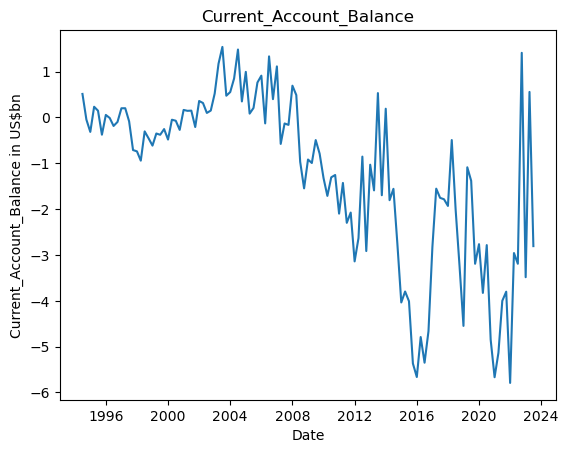

count    117.000000
mean      -1.216466
std        1.831539
min       -5.791700
25%       -2.299100
50%       -0.614400
75%        0.148700
max        1.538900
Name: Current_Account_Balance, dtype: float64


In [44]:
#Plot current account
plt.plot(df['Date'],df['Current_Account_Balance'].values)
plt.ylabel('Current_Account_Balance in US$bn')
plt.xlabel('Date')
plt.title('Current_Account_Balance')
plt.show()
print(df['Current_Account_Balance'].describe())

### Trade balance

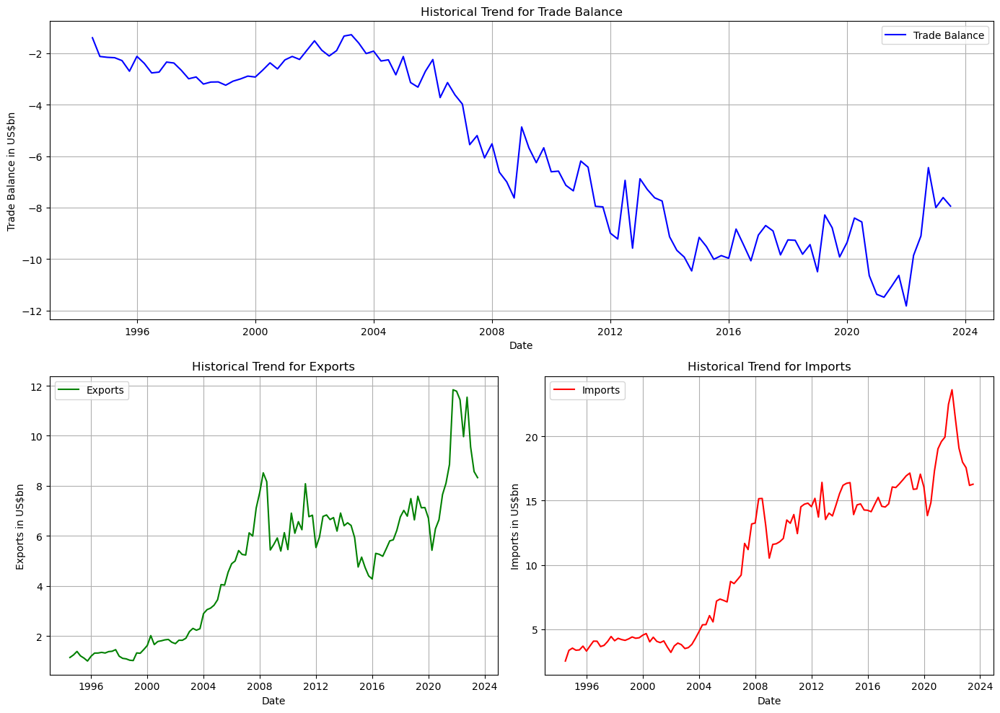

count    117.000000
mean      -5.850418
std        3.241853
min      -11.825200
25%       -9.069200
50%       -6.191100
75%       -2.659100
max       -1.279100
Name: Trade_Balance, dtype: float64 count    117.000000
mean       4.832615
std        2.779252
min        0.995800
25%        1.826600
50%        5.390300
75%        6.729600
max       11.837400
Name: Exports, dtype: float64 count    117.000000
mean      10.683032
std        5.710197
min        2.535700
25%        4.298700
50%       12.434400
75%       15.162900
max       23.605000
Name: Imports, dtype: float64


In [46]:

# Create a grid layout for the subplots
fig = plt.figure(figsize=(14, 10))

# Add Trade_Balance at the top
ax1 = fig.add_subplot(2, 1, 1)
ax1.plot(df['Date'], df['Trade_Balance'], label='Trade Balance', color='blue')
ax1.set_title("Historical Trend for Trade Balance")
ax1.set_xlabel("Date")
ax1.set_ylabel("Trade Balance in US$bn")
ax1.legend()
ax1.grid(True)

# Add Exports and Imports side by side in the second row
ax2 = fig.add_subplot(2, 2, 3)
ax2.plot(df['Date'], df['Exports'], label='Exports', color='green')
ax2.set_title("Historical Trend for Exports")
ax2.set_xlabel("Date")
ax2.set_ylabel("Exports in US$bn")
ax2.legend()
ax2.grid(True)

ax3 = fig.add_subplot(2, 2, 4)
ax3.plot(df['Date'], df['Imports'].abs(), label='Imports', color='red')
ax3.set_title("Historical Trend for Imports")
ax3.set_xlabel("Date")
ax3.set_ylabel("Imports in US$bn")
ax3.legend()
ax3.grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
print(df['Trade_Balance'].describe(),df['Exports'].describe(),df['Imports'].describe() )

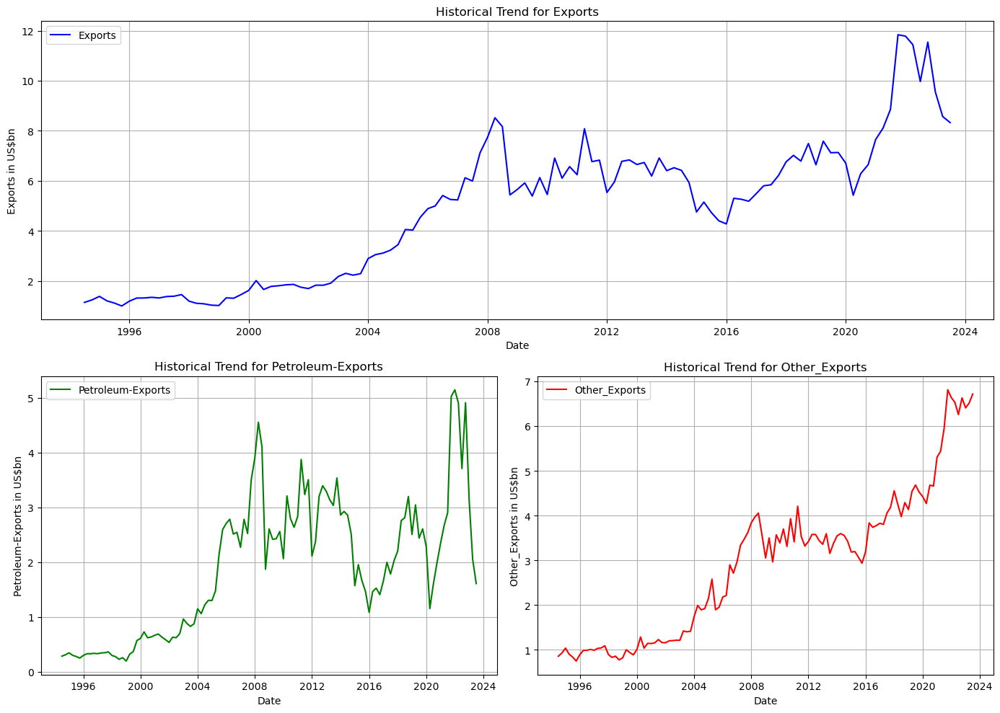

In [50]:

# Create a grid layout for the subplots
fig = plt.figure(figsize=(14, 10))

# Add Trade_Balance at the top
ax1 = fig.add_subplot(2, 1, 1)
ax1.plot(df['Date'], df['Exports'], label='Exports', color='blue')
ax1.set_title("Historical Trend for Exports")
ax1.set_xlabel("Date")
ax1.set_ylabel("Exports in US$bn")
ax1.legend()
ax1.grid(True)

# Add Exports and Imports side by side in the second row
ax2 = fig.add_subplot(2, 2, 3)
ax2.plot(df['Date'], df['Petroleum-Exports'], label='Petroleum-Exports', color='green')
ax2.set_title("Historical Trend for Petroleum-Exports")
ax2.set_xlabel("Date")
ax2.set_ylabel("Petroleum-Exports in US$bn")
ax2.legend()
ax2.grid(True)


ax3 = fig.add_subplot(2, 2, 4)
ax3.plot(df['Date'], df['Other_Exports'], label='Other_Exports', color='red')
ax3.set_title("Historical Trend for Other_Exports")
ax3.set_xlabel("Date")
ax3.set_ylabel("Other_Exports in US$bn")
ax3.legend()
ax3.grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


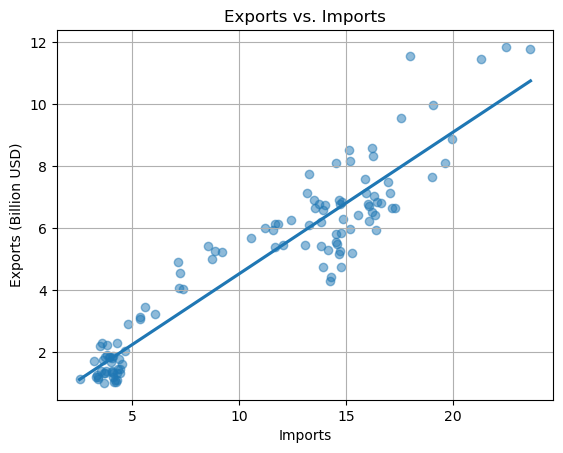

Correlation between Exports and Imports: 0.94, P-value: 0.0000


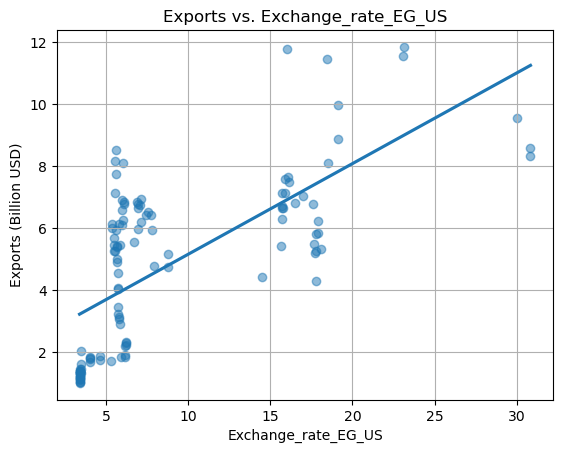

Correlation between Exports and Exchange_rate_EG_US: 0.68, P-value: 0.0000


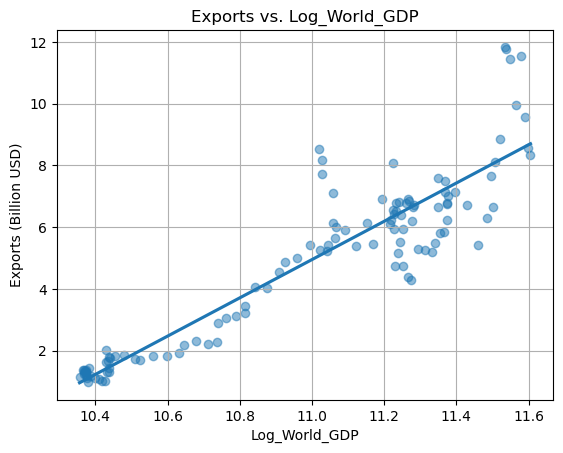

Correlation between Exports and Log_World_GDP: 0.92, P-value: 0.0000


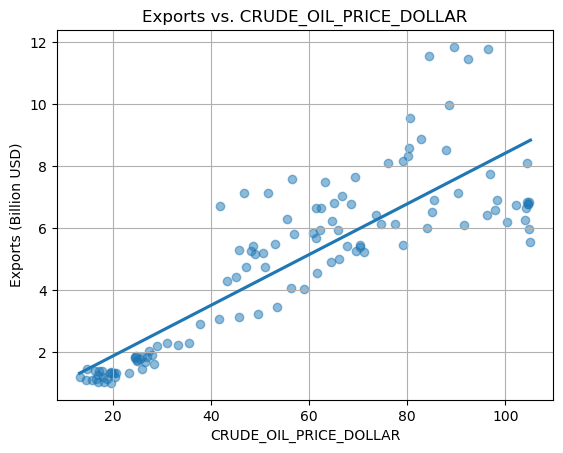

Correlation between Exports and CRUDE_OIL_PRICE_DOLLAR: 0.85, P-value: 0.0000


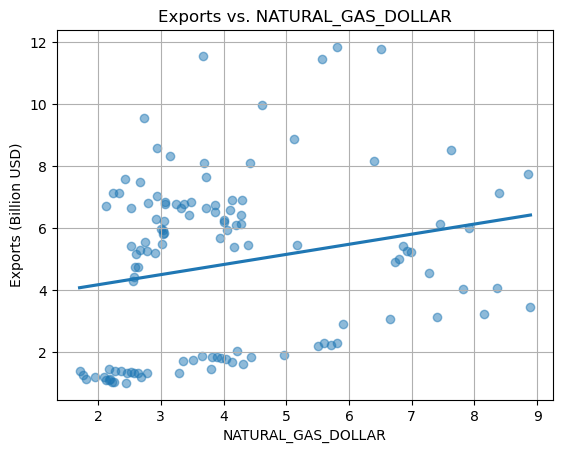

Correlation between Exports and NATURAL_GAS_DOLLAR: 0.21, P-value: 0.0214


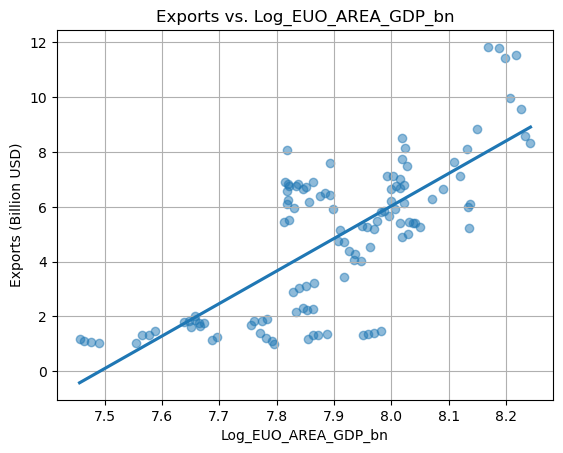

Correlation between Exports and Log_EUO_AREA_GDP_bn: 0.75, P-value: 0.0000


In [22]:
# Scatter plots and correlation analysis for Exports

# Analyze relationships with potential influencing variables
exports_features = ["Imports", "Exchange_rate_EG_US", "Log_World_GDP",'CRUDE_OIL_PRICE_DOLLAR', 'NATURAL_GAS_DOLLAR', 
                    'Log_EUO_AREA_GDP_bn']
for feature in exports_features:
    # Scatter plot
    sns.regplot(x=df[feature], y=df["Exports"], ci=None, scatter_kws={'alpha': 0.5})
    plt.title(f"Exports vs. {feature}")
    plt.xlabel(feature)
    plt.ylabel("Exports (Billion USD)")
    plt.grid()
    plt.show()

    # Correlation coefficient
    corr, p_value = pearsonr(df[feature], df["Exports"])
    print(f"Correlation between Exports and {feature}: {corr:.2f}, P-value: {p_value:.4f}")


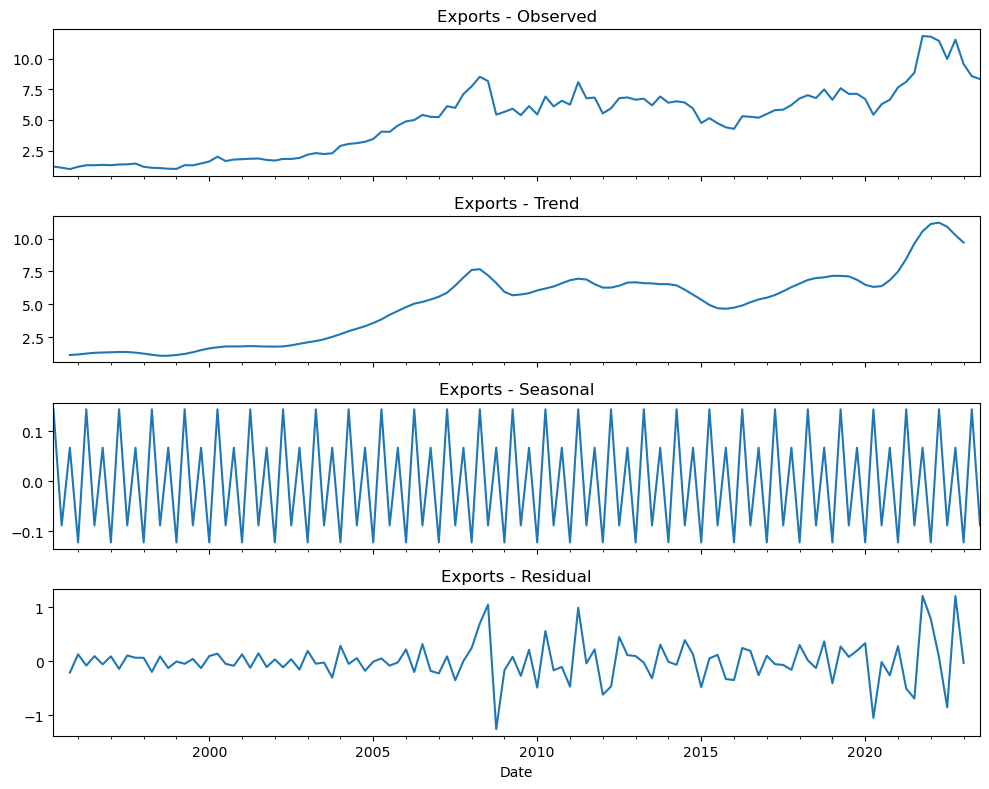

Ljung-Box Test Results for Exports:
       lb_stat  lb_pvalue
4   12.264303   0.015490
8   20.052562   0.010139
12  22.065746   0.036790


In [337]:
# Perform Seasonal Decomposition for Exports
result_exports = seasonal_decompose(df["Exports"], model="additive", period=4)

# Plot Seasonal Decomposition for Exports
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_exports.observed.plot(ax=axes[0], title="Exports - Observed", legend=False)
result_exports.trend.plot(ax=axes[1], title="Exports - Trend", legend=False)
result_exports.seasonal.plot(ax=axes[2], title="Exports - Seasonal", legend=False)
result_exports.resid.plot(ax=axes[3], title="Exports - Residual", legend=False)
plt.tight_layout()
plt.show()

# Perform Ljung-Box Test for Exports
ljung_box_exports = acorr_ljungbox(result_exports.resid.dropna(), lags=[4, 8, 12], return_df=True)
print("Ljung-Box Test Results for Exports:\n", ljung_box_exports)


ADF Test for Exports:
ADF Statistic: -0.6575
p-value: 0.8574
Critical Values: {'1%': -3.492995948509562, '5%': -2.888954648057252, '10%': -2.58139291903223}
--> Exports is **non-stationary** (p > 0.05)

ADF Test for Exports (After Differencing):
ADF Statistic: -5.4782
p-value: 0.0000
Critical Values: {'1%': -3.4936021509366793, '5%': -2.8892174239808703, '10%': -2.58153320754717}
--> Exports is **stationary** after differencing


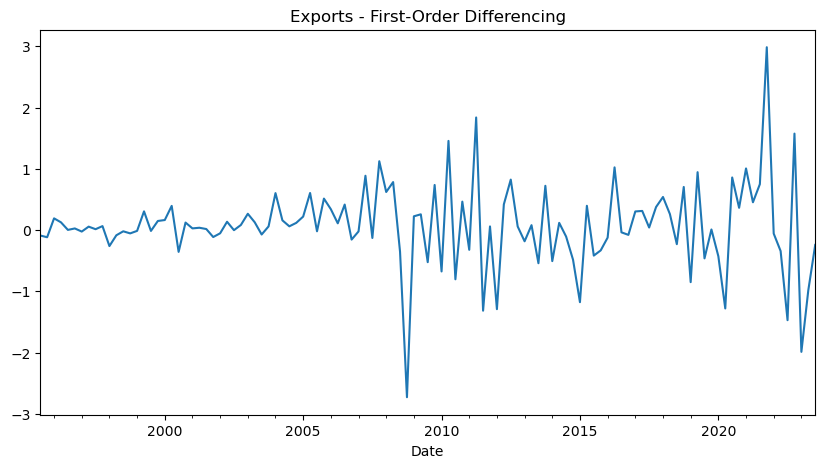

In [335]:

# Perform ADF Test for Exports
adf_test = adfuller(df["Exports"].dropna())

print("ADF Test for Exports:")
print(f"ADF Statistic: {adf_test[0]:.4f}")
print(f"p-value: {adf_test[1]:.4f}")
print("Critical Values:", adf_test[4])
if adf_test[1] > 0.05:
    print("--> Exports is **non-stationary** (p > 0.05)")
else:
    print("--> Exports is **stationary** (p <= 0.05)")

# Apply first-order differencing
df["Exports_diff"] = df["Exports"].diff()

# Perform ADF Test after Differencing
adf_test_diff = adfuller(df["Exports_diff"].dropna())

print("\nADF Test for Exports (After Differencing):")
print(f"ADF Statistic: {adf_test_diff[0]:.4f}")
print(f"p-value: {adf_test_diff[1]:.4f}")
print("Critical Values:", adf_test_diff[4])
if adf_test_diff[1] > 0.05:
    print("--> Exports is still **non-stationary** after differencing")
else:
    print("--> Exports is **stationary** after differencing")

# Plot Exports after Differencing
df["Exports_diff"].dropna().plot(title="Exports - First-Order Differencing", figsize=(10, 5))
plt.show()


## Imports

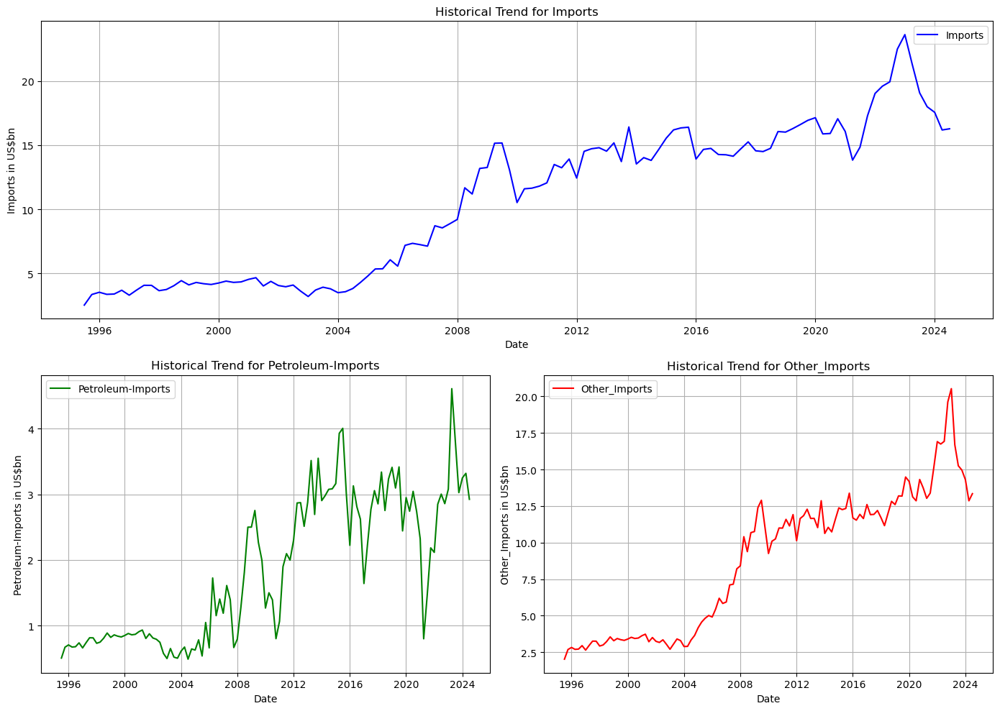

In [28]:

# Create a grid layout for the subplots
fig = plt.figure(figsize=(14, 10))

# Add Trade_Balance at the top
ax1 = fig.add_subplot(2, 1, 1)
ax1.plot(df['Date'], df['Imports'].abs(), label='Imports', color='blue')
ax1.set_title("Historical Trend for Imports")
ax1.set_xlabel("Date")
ax1.set_ylabel("Imports in US$bn")
ax1.legend()
ax1.grid(True)

# Add Exports and Imports side by side in the second row
ax2 = fig.add_subplot(2, 2, 3)
ax2.plot(df['Date'], df['Petroleum-Imports'].abs(), label='Petroleum-Imports', color='green')
ax2.set_title("Historical Trend for Petroleum-Imports")
ax2.set_xlabel("Date")
ax2.set_ylabel("Petroleum-Imports in US$bn")
ax2.legend()
ax2.grid(True)


ax3 = fig.add_subplot(2, 2, 4)
ax3.plot(df['Date'], df['Other_Imports'].abs(), label='Other_Imports', color='red')
ax3.set_title("Historical Trend for Other_Imports")
ax3.set_xlabel("Date")
ax3.set_ylabel("Other_Imports in US$bn")
ax3.legend()
ax3.grid(True)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


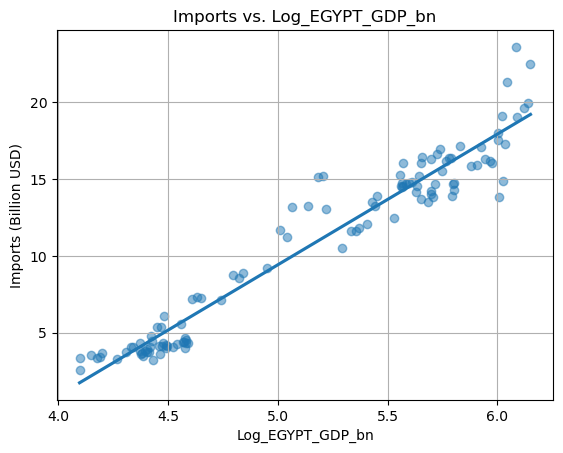

Correlation between Imports and Log_EGYPT_GDP_bn: 0.97, P-value: 0.0000


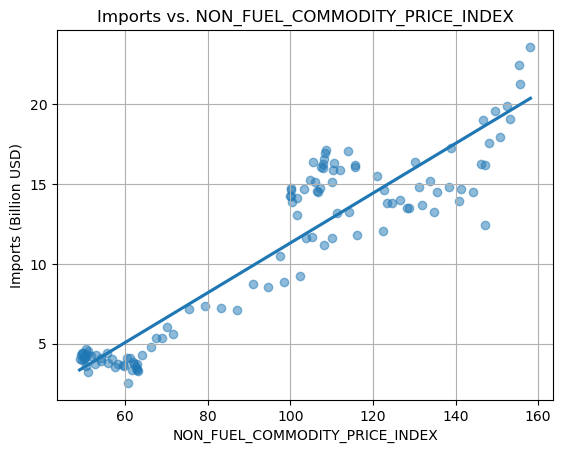

Correlation between Imports and NON_FUEL_COMMODITY_PRICE_INDEX: 0.93, P-value: 0.0000


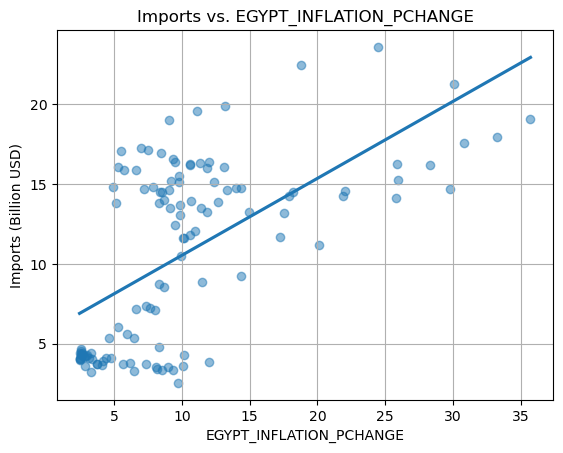

Correlation between Imports and EGYPT_INFLATION_PCHANGE: 0.61, P-value: 0.0000


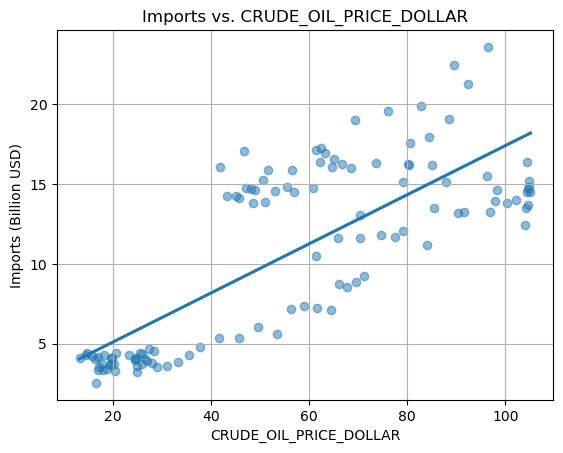

Correlation between Imports and CRUDE_OIL_PRICE_DOLLAR: 0.78, P-value: 0.0000


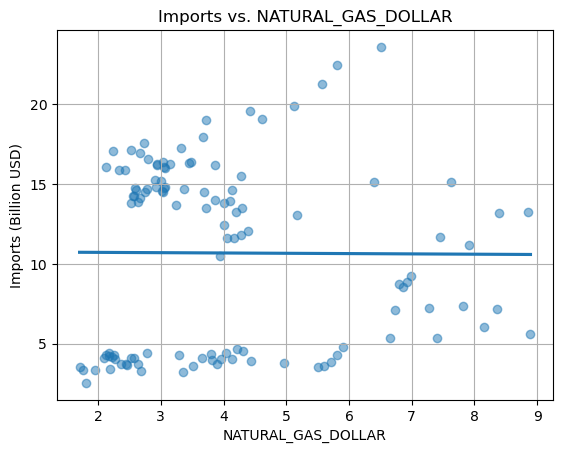

Correlation between Imports and NATURAL_GAS_DOLLAR: -0.01, P-value: 0.9483


In [30]:
# Scatter plots and correlation analysis for Imports
imports_features = ["Log_EGYPT_GDP_bn", "NON_FUEL_COMMODITY_PRICE_INDEX", 'EGYPT_INFLATION_PCHANGE','CRUDE_OIL_PRICE_DOLLAR',
                  'NATURAL_GAS_DOLLAR' ]
for feature in imports_features:
    # Scatter plot
    sns.regplot(x=df[feature], y=df["Imports"], ci=None, scatter_kws={'alpha': 0.5})
    plt.title(f"Imports vs. {feature}")
    plt.xlabel(feature)
    plt.ylabel("Imports (Billion USD)")
    plt.grid()
    plt.show()

    # Correlation coefficient
    corr, p_value = pearsonr(df[feature], df["Imports"])
    print(f"Correlation between Imports and {feature}: {corr:.2f}, P-value: {p_value:.4f}")


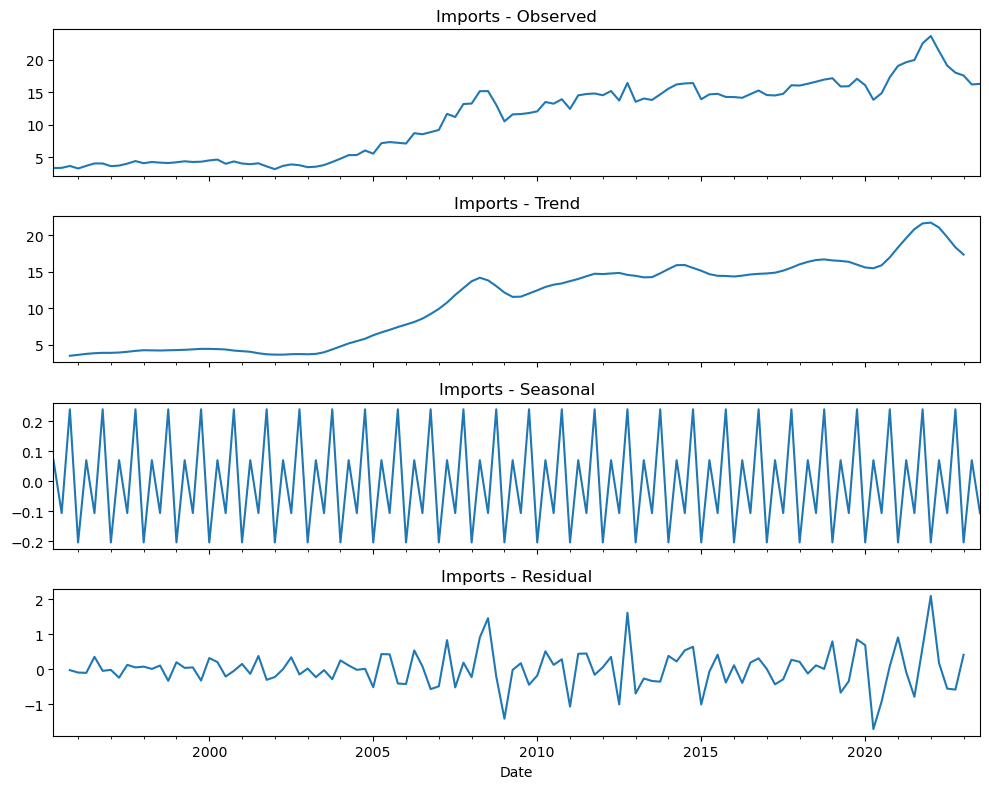

Ljung-Box Test Results for Imports:
       lb_stat     lb_pvalue
4   25.871389  3.359138e-05
8   57.280297  1.587615e-09
12  65.008008  2.716997e-09


In [321]:
# Perform Seasonal Decomposition for Imports
result_imports = seasonal_decompose(df["Imports"], model="additive", period=4)

# Plot Seasonal Decomposition for Imports
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_imports.observed.plot(ax=axes[0], title="Imports - Observed", legend=False)
result_imports.trend.plot(ax=axes[1], title="Imports - Trend", legend=False)
result_imports.seasonal.plot(ax=axes[2], title="Imports - Seasonal", legend=False)
result_imports.resid.plot(ax=axes[3], title="Imports - Residual", legend=False)
plt.tight_layout()
plt.show()

# Perform Ljung-Box Test for Imports
ljung_box_imports = acorr_ljungbox(result_imports.resid.dropna(), lags=[4, 8, 12], return_df=True)
print("Ljung-Box Test Results for Imports:\n", ljung_box_imports)


ADF Test for Imports:
ADF Statistic: -0.4662
p-value: 0.8984
Critical Values: {'1%': -3.4942202045135513, '5%': -2.889485291005291, '10%': -2.5816762131519275}
--> Imports is **non-stationary** (p > 0.05)

ADF Test for Imports (After Differencing):
ADF Statistic: -4.3842
p-value: 0.0003
Critical Values: {'1%': -3.4942202045135513, '5%': -2.889485291005291, '10%': -2.5816762131519275}
--> Imports is **stationary** after differencing


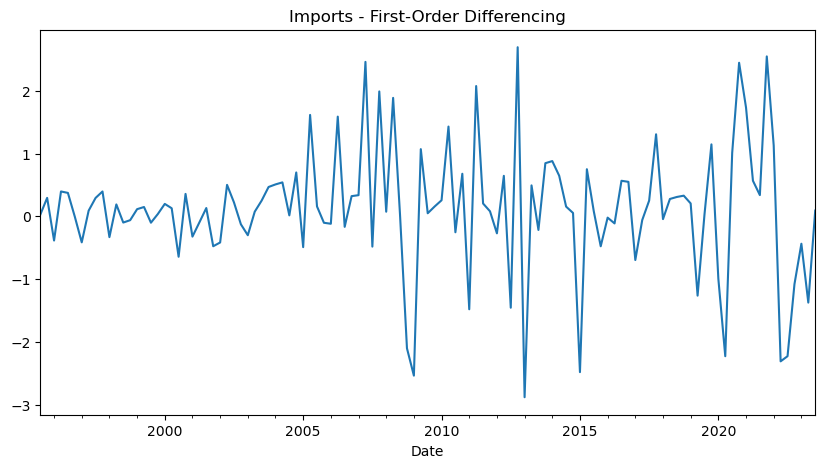

In [319]:
# Perform ADF Test for Imports
adf_test = adfuller(df["Imports"].dropna())

print("ADF Test for Imports:")
print(f"ADF Statistic: {adf_test[0]:.4f}")
print(f"p-value: {adf_test[1]:.4f}")
print("Critical Values:", adf_test[4])
if adf_test[1] > 0.05:
    print("--> Imports is **non-stationary** (p > 0.05)")
else:
    print("--> Imports is **stationary** (p <= 0.05)")

# Apply first-order differencing
df["Imports_diff"] = df["Imports"].diff()

# Perform ADF Test after Differencing
adf_test_diff = adfuller(df["Imports_diff"].dropna())

print("\nADF Test for Imports (After Differencing):")
print(f"ADF Statistic: {adf_test_diff[0]:.4f}")
print(f"p-value: {adf_test_diff[1]:.4f}")
print("Critical Values:", adf_test_diff[4])
if adf_test_diff[1] > 0.05:
    print("--> Imports is still **non-stationary** after differencing")
else:
    print("--> Imports is **stationary** after differencing")

# Plot Imports after Differencing
df["Imports_diff"].dropna().plot(title="Imports - First-Order Differencing", figsize=(10, 5))
plt.show()


## **Suez Canal Dues & Travel Receipts**

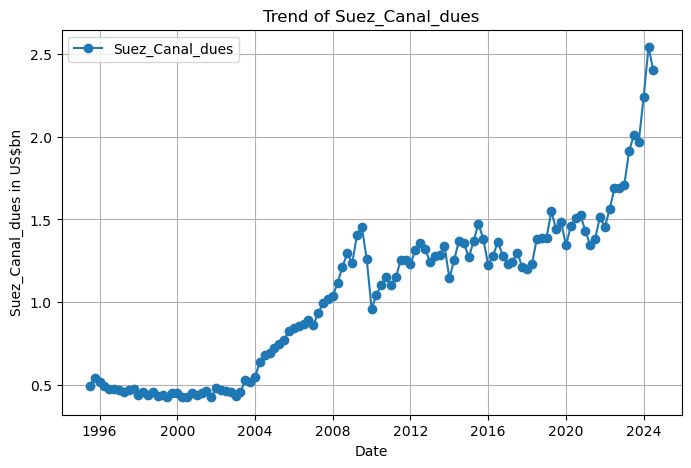

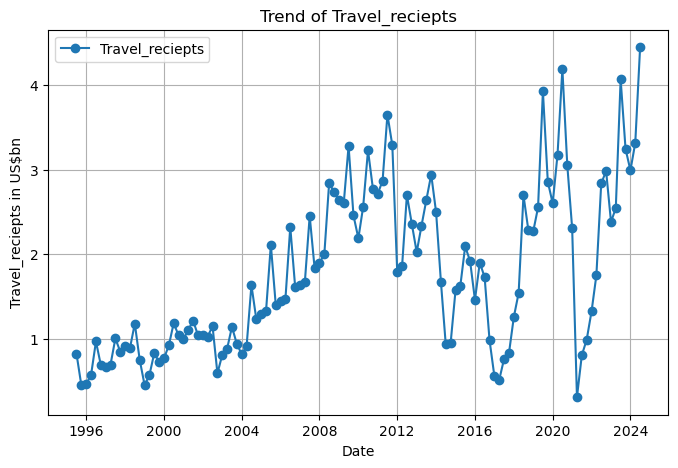

count    117.000000
mean       1.048676
std        0.481374
min        0.427700
25%        0.497800
50%        1.155200
75%        1.366400
max        2.539200
Name: Suez_Canal_dues, dtype: float64 count    117.000000
mean       1.773353
std        0.964659
min        0.305000
25%        0.935600
50%        1.623500
75%        2.553700
max        4.451000
Name: Travel_reciepts, dtype: float64


In [36]:
##ploting main component of Services account 
# List of columns to plot
columns = ['Suez_Canal_dues', 'Travel_reciepts']

# Create a plot for each column
for col in columns:
    plt.figure(figsize=(8, 5))  # Create a new figure for each chart
    plt.plot(df['Date'], df[col], marker='o', label=col)
    plt.title(f"Trend of {col}")
    plt.xlabel("Date")
    plt.ylabel(f"{col} in US$bn")
    plt.legend()
    plt.grid()
    plt.show()

print(df['Suez_Canal_dues'].describe(),df['Travel_reciepts'].describe())

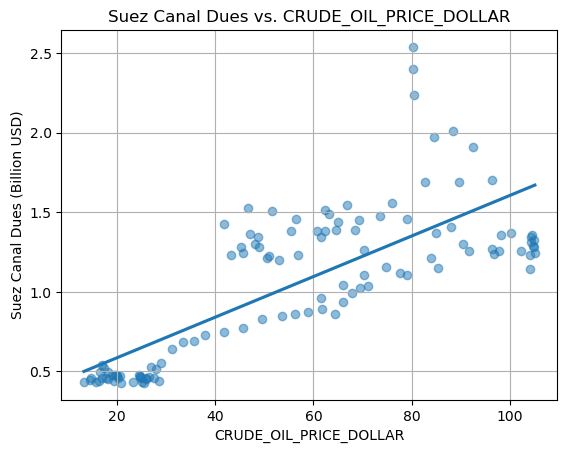

Correlation between Suez Canal Dues and CRUDE_OIL_PRICE_DOLLAR: 0.77, P-value: 0.0000


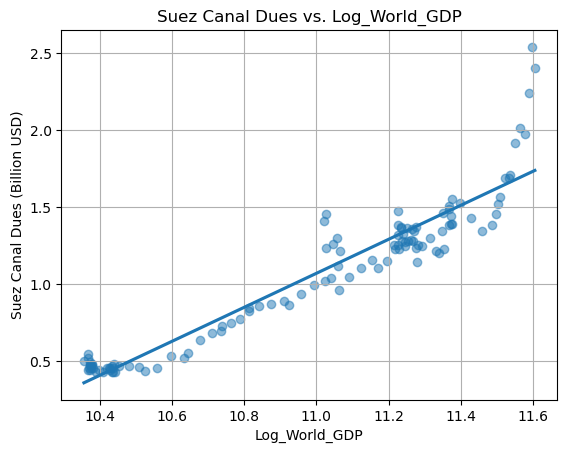

Correlation between Suez Canal Dues and Log_World_GDP: 0.94, P-value: 0.0000


In [38]:
# Scatter plots and correlation analysis for Suez Canal Dues
suez_features = ["CRUDE_OIL_PRICE_DOLLAR", "Log_World_GDP"]
for feature in suez_features:
    # Scatter plot
    sns.regplot(x=df[feature], y=df["Suez_Canal_dues"], ci=None, scatter_kws={'alpha': 0.5})
    plt.title(f"Suez Canal Dues vs. {feature}")
    plt.xlabel(feature)
    plt.ylabel("Suez Canal Dues (Billion USD)")
    plt.grid()
    plt.show()

    # Correlation coefficient
    corr, p_value = pearsonr(df[feature], df["Suez_Canal_dues"])
    print(f"Correlation between Suez Canal Dues and {feature}: {corr:.2f}, P-value: {p_value:.4f}")


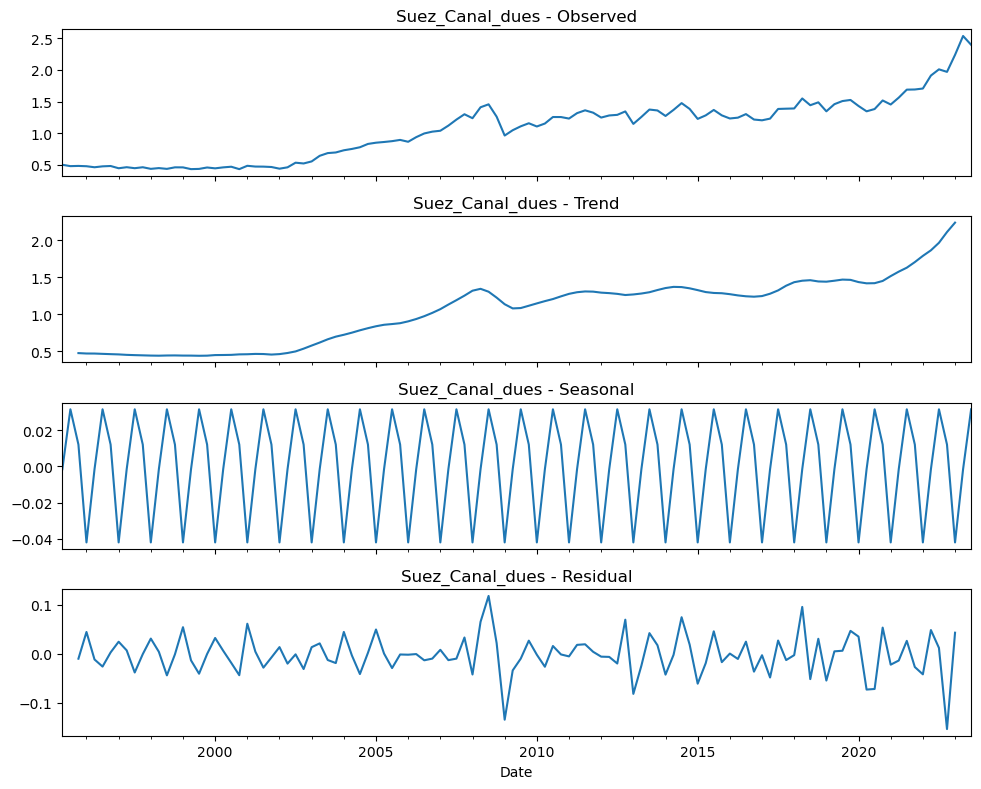

Ljung-Box Test Results for Suez Canal Traffic:
       lb_stat  lb_pvalue
4   24.431969   0.000065
8   26.641878   0.000815
12  28.842772   0.004157


In [323]:
# Perform Seasonal Decomposition for Suez Canal Traffic
result_suez = seasonal_decompose(df["Suez_Canal_dues"], model="additive", period=4)

# Plot Seasonal Decomposition for Suez Canal Traffic
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_suez.observed.plot(ax=axes[0], title="Suez_Canal_dues - Observed", legend=False)
result_suez.trend.plot(ax=axes[1], title="Suez_Canal_dues - Trend", legend=False)
result_suez.seasonal.plot(ax=axes[2], title="Suez_Canal_dues - Seasonal", legend=False)
result_suez.resid.plot(ax=axes[3], title="Suez_Canal_dues - Residual", legend=False)
plt.tight_layout()
plt.show()

# Perform Ljung-Box Test for Suez Canal Traffic
ljung_box_suez = acorr_ljungbox(result_suez.resid.dropna(), lags=[4, 8, 12], return_df=True)
print("Ljung-Box Test Results for Suez Canal Traffic:\n", ljung_box_suez)


ADF Test for Suez Canal Dues:
ADF Statistic: 0.8026
p-value: 0.9917
Critical Values: {'1%': -3.4924012594942333, '5%': -2.8886968193364835, '10%': -2.5812552709190673}
--> Suez Canal Dues is **non-stationary** (p > 0.05)

ADF Test for Suez Canal Dues (After Differencing):
ADF Statistic: -3.4092
p-value: 0.0106
Critical Values: {'1%': -3.49181775886872, '5%': -2.8884437992971588, '10%': -2.5811201893779985}
--> Suez Canal Dues is **stationary** after differencing


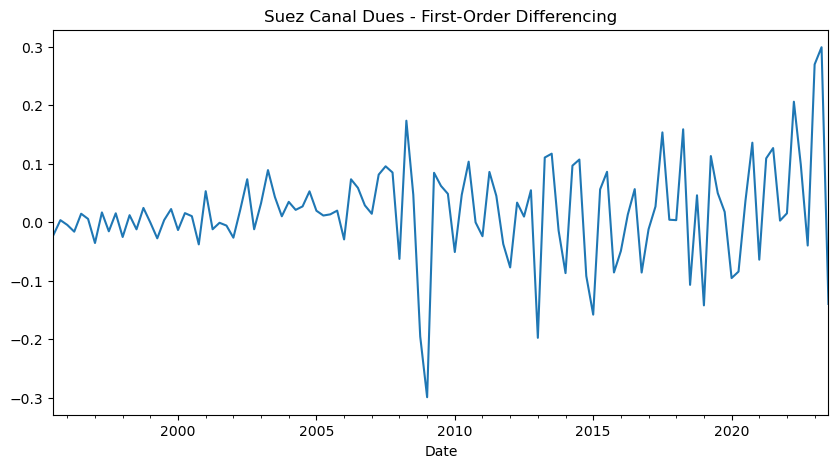

In [325]:
# Perform ADF Test for Suez Canal Dues
adf_test = adfuller(df["Suez_Canal_dues"].dropna())

print("ADF Test for Suez Canal Dues:")
print(f"ADF Statistic: {adf_test[0]:.4f}")
print(f"p-value: {adf_test[1]:.4f}")
print("Critical Values:", adf_test[4])
if adf_test[1] > 0.05:
    print("--> Suez Canal Dues is **non-stationary** (p > 0.05)")
else:
    print("--> Suez Canal Dues is **stationary** (p <= 0.05)")

# Apply first-order differencing
df["Suez_Canal_dues_diff"] = df["Suez_Canal_dues"].diff()

# Perform ADF Test after Differencing
adf_test_diff = adfuller(df["Suez_Canal_dues_diff"].dropna())

print("\nADF Test for Suez Canal Dues (After Differencing):")
print(f"ADF Statistic: {adf_test_diff[0]:.4f}")
print(f"p-value: {adf_test_diff[1]:.4f}")
print("Critical Values:", adf_test_diff[4])
if adf_test_diff[1] > 0.05:
    print("--> Suez Canal Dues is still **non-stationary** after differencing")
else:
    print("--> Suez Canal Dues is **stationary** after differencing")

# Plot Suez Canal Dues after Differencing
df["Suez_Canal_dues_diff"].dropna().plot(title="Suez Canal Dues - First-Order Differencing", figsize=(10, 5))
plt.show()


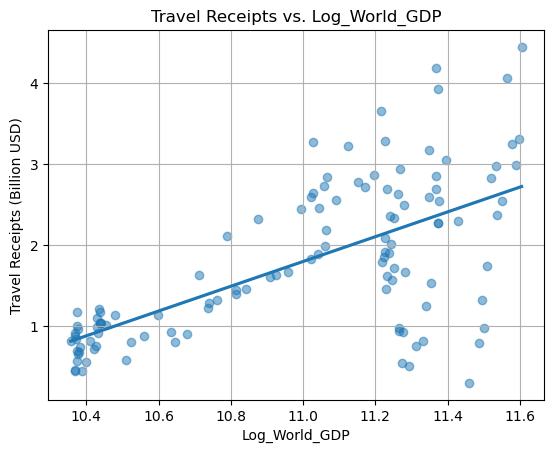

Correlation between Travel Receipts and Log_World_GDP: 0.65, P-value: 0.0000


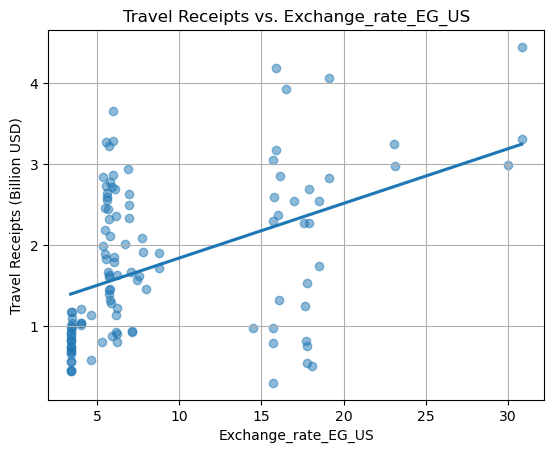

Correlation between Travel Receipts and Exchange_rate_EG_US: 0.45, P-value: 0.0000


In [44]:
# Scatter plots and correlation analysis for Travel Receipts
travel_features = ["Log_World_GDP", "Exchange_rate_EG_US"]
for feature in travel_features:
    # Scatter plot
    sns.regplot(x=df[feature], y=df["Travel_reciepts"], ci=None, scatter_kws={'alpha': 0.5})
    plt.title(f"Travel Receipts vs. {feature}")
    plt.xlabel(feature)
    plt.ylabel("Travel Receipts (Billion USD)")
    plt.grid()
    plt.show()

    # Correlation coefficient
    corr, p_value = pearsonr(df[feature], df["Travel_reciepts"])
    print(f"Correlation between Travel Receipts and {feature}: {corr:.2f}, P-value: {p_value:.4f}")


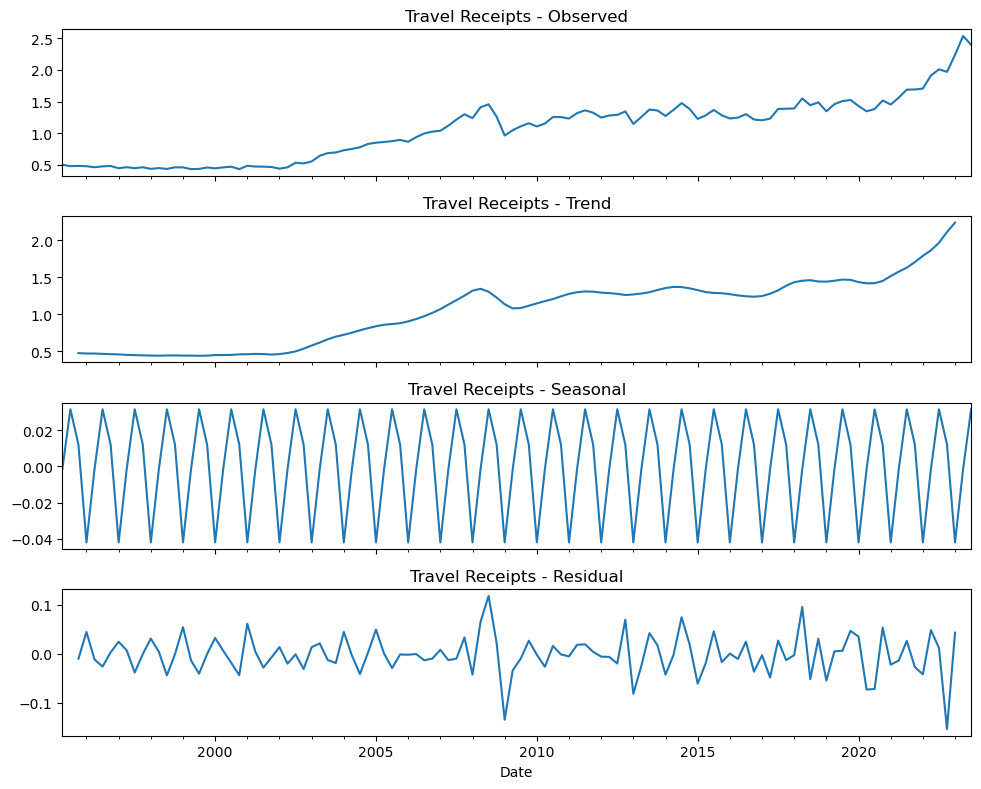

Ljung-Box Test Results for Travel reciepts:
       lb_stat  lb_pvalue
4   24.587074   0.000061
8   29.112833   0.000303
12  39.704822   0.000080


In [327]:
# Perform Seasonal Decomposition for Travel
result_Travel = seasonal_decompose(df["Travel_reciepts"], model="additive", period=4)

# Plot Seasonal Decomposition for Suez Canal Traffic
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_suez.observed.plot(ax=axes[0], title="Travel Receipts - Observed", legend=False)
result_suez.trend.plot(ax=axes[1], title="Travel Receipts - Trend", legend=False)
result_suez.seasonal.plot(ax=axes[2], title="Travel Receipts - Seasonal", legend=False)
result_suez.resid.plot(ax=axes[3], title="Travel Receipts - Residual", legend=False)
plt.tight_layout()
plt.show()

# Perform Ljung-Box Test for Travel Receipts
ljung_box_suez = acorr_ljungbox(result_Travel.resid.dropna(), lags=[4, 8, 12], return_df=True)
print("Ljung-Box Test Results for Travel reciepts:\n", ljung_box_suez)


ADF Test for Travel reciepts:
ADF Statistic: -1.5500
p-value: 0.5086
Critical Values: {'1%': -3.4942202045135513, '5%': -2.889485291005291, '10%': -2.5816762131519275}
--> Travel reciepts is **non-stationary** (p > 0.05)

ADF Test for Travel reciepts (After Differencing):
ADF Statistic: -5.0157
p-value: 0.0000
Critical Values: {'1%': -3.498198082189098, '5%': -2.891208211860468, '10%': -2.5825959973472097}
--> Travel reciepts is **stationary** after differencing


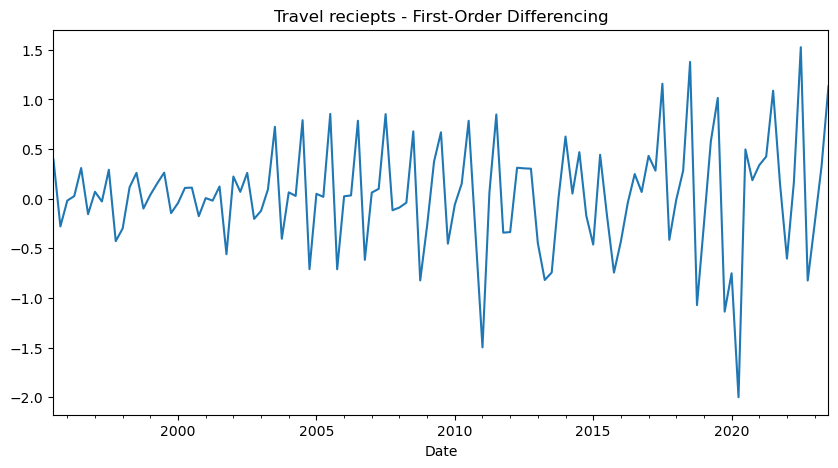

In [329]:
# Perform ADF Test for Travel reciepts
adf_test = adfuller(df["Travel_reciepts"].dropna())

print("ADF Test for Travel reciepts:")
print(f"ADF Statistic: {adf_test[0]:.4f}")
print(f"p-value: {adf_test[1]:.4f}")
print("Critical Values:", adf_test[4])
if adf_test[1] > 0.05:
    print("--> Travel reciepts is **non-stationary** (p > 0.05)")
else:
    print("--> Travel reciepts is **stationary** (p <= 0.05)")

# Apply first-order differencing
df["Travel_reciepts_diff"] = df["Travel_reciepts"].diff()

# Perform ADF Test after Differencing
adf_test_diff = adfuller(df["Travel_reciepts_diff"].dropna())

print("\nADF Test for Travel reciepts (After Differencing):")
print(f"ADF Statistic: {adf_test_diff[0]:.4f}")
print(f"p-value: {adf_test_diff[1]:.4f}")
print("Critical Values:", adf_test_diff[4])
if adf_test_diff[1] > 0.05:
    print("--> Travel reciepts is still **non-stationary** after differencing")
else:
    print("--> Travel reciepts is **stationary** after differencing")

# Plot Suez Canal Dues after Differencing
df["Travel_reciepts_diff"].dropna().plot(title="Travel reciepts - First-Order Differencing", figsize=(10, 5))
plt.show()


## Worker Remittances

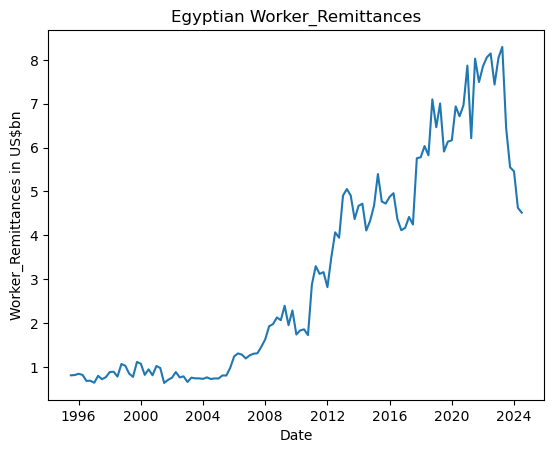

count    117.000000
mean       3.157924
std        2.453030
min        0.633900
25%        0.841700
50%        2.064800
75%        4.906700
max        8.294700
Name: Worker_Remittances, dtype: float64


In [50]:
#Plot worker remitences
plt.plot(df['Date'], df['Worker_Remittances'].values)
plt.ylabel('Worker_Remittances in US$bn')
plt.xlabel('Date')
plt.title('Egyptian Worker_Remittances')
plt.show()
print(df['Worker_Remittances'].describe())

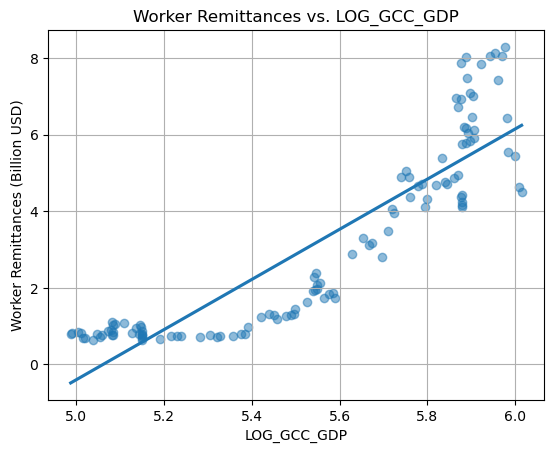

Correlation between Worker Remittances and LOG_GCC_GDP: 0.89, P-value: 0.0000


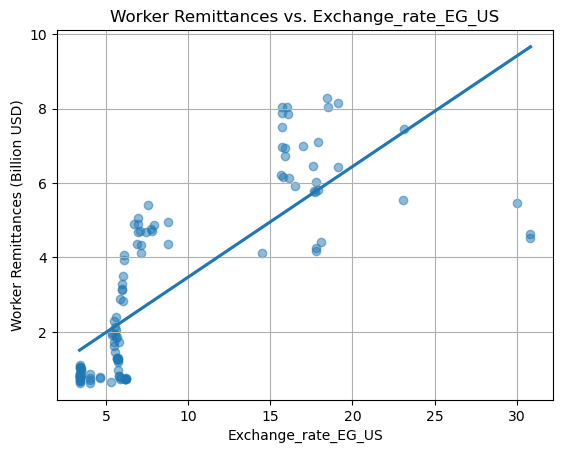

Correlation between Worker Remittances and Exchange_rate_EG_US: 0.79, P-value: 0.0000


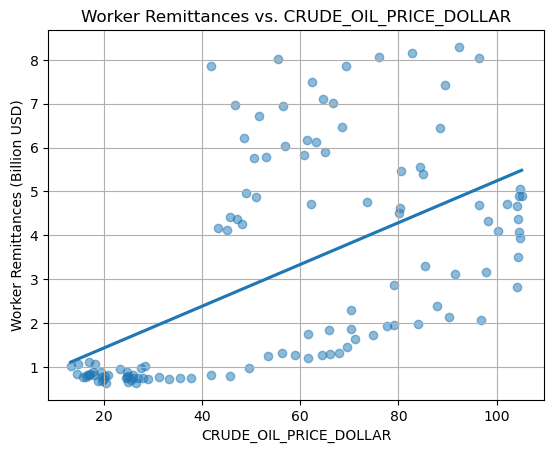

Correlation between Worker Remittances and CRUDE_OIL_PRICE_DOLLAR: 0.56, P-value: 0.0000


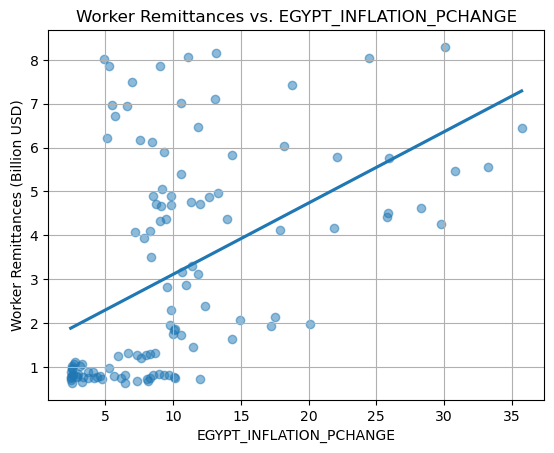

Correlation between Worker Remittances and EGYPT_INFLATION_PCHANGE: 0.48, P-value: 0.0000


In [52]:
# Scatter plots and correlation analysis for Worker Remittances
remittance_features = ["LOG_GCC_GDP", "Exchange_rate_EG_US",'CRUDE_OIL_PRICE_DOLLAR','EGYPT_INFLATION_PCHANGE' ]
for feature in remittance_features:
    # Scatter plot
    sns.regplot(x=df[feature], y=df["Worker_Remittances"], ci=None, scatter_kws={'alpha': 0.5})
    plt.title(f"Worker Remittances vs. {feature}")
    plt.xlabel(feature)
    plt.ylabel("Worker Remittances (Billion USD)")
    plt.grid()
    plt.show()

    # Correlation coefficient
    corr, p_value = pearsonr(df[feature], df["Worker_Remittances"])
    print(f"Correlation between Worker Remittances and {feature}: {corr:.2f}, P-value: {p_value:.4f}")


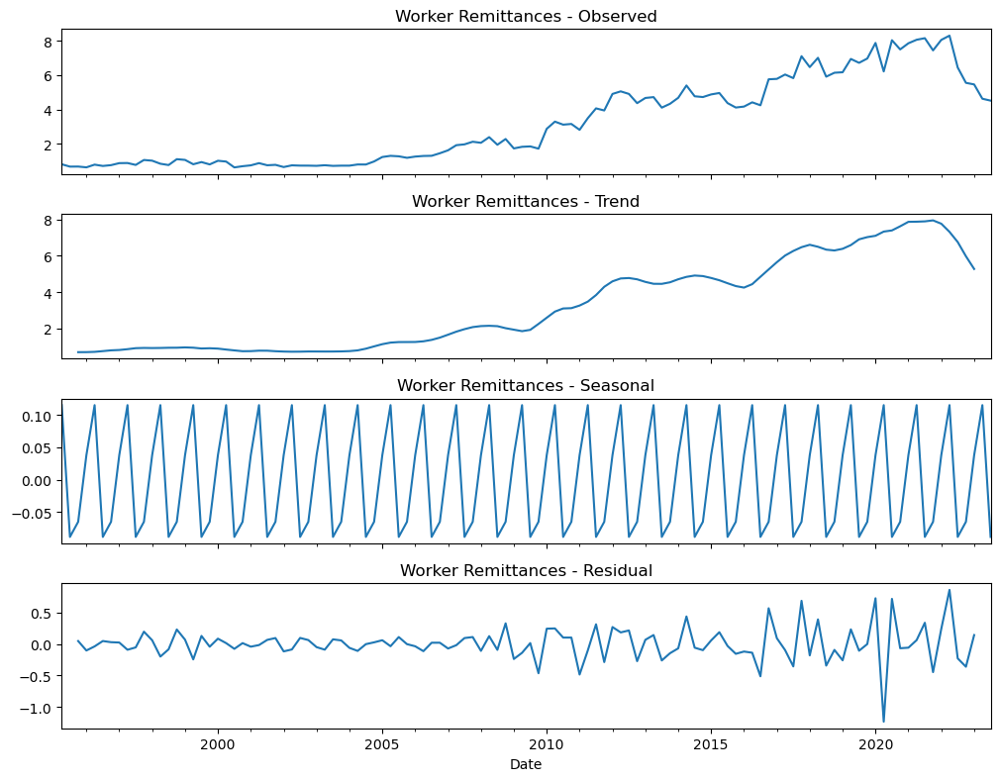

Ljung-Box Test Results for Worker Remittances:
       lb_stat  lb_pvalue
4   20.164963   0.000463
8   28.482228   0.000391
12  34.129666   0.000643


In [331]:
# Perform Seasonal Decomposition for Worker Remittances
result_remittances = seasonal_decompose(df["Worker_Remittances"], model="additive", period=4)

# Plot Seasonal Decomposition for Worker Remittances
fig, axes = plt.subplots(4, 1, figsize=(10, 8), sharex=True)
result_remittances.observed.plot(ax=axes[0], title="Worker Remittances - Observed", legend=False)
result_remittances.trend.plot(ax=axes[1], title="Worker Remittances - Trend", legend=False)
result_remittances.seasonal.plot(ax=axes[2], title="Worker Remittances - Seasonal", legend=False)
result_remittances.resid.plot(ax=axes[3], title="Worker Remittances - Residual", legend=False)
plt.tight_layout()
plt.show()

# Perform Ljung-Box Test for Worker Remittances
ljung_box_remittances = acorr_ljungbox(result_remittances.resid.dropna(), lags=[4, 8, 12], return_df=True)
print("Ljung-Box Test Results for Worker Remittances:\n", ljung_box_remittances)


ADF Test for Worker Remittances:
ADF Statistic: -1.0366
p-value: 0.7397
Critical Values: {'1%': -3.4901313156261384, '5%': -2.8877122815688776, '10%': -2.5807296460459184}
--> Worker Remittances is **non-stationary** (p > 0.05)

ADF Test for Worker Remittances (After Differencing):
ADF Statistic: -14.0035
p-value: 0.0000
Critical Values: {'1%': -3.4901313156261384, '5%': -2.8877122815688776, '10%': -2.5807296460459184}
--> Worker Remittances is **stationary** after differencing


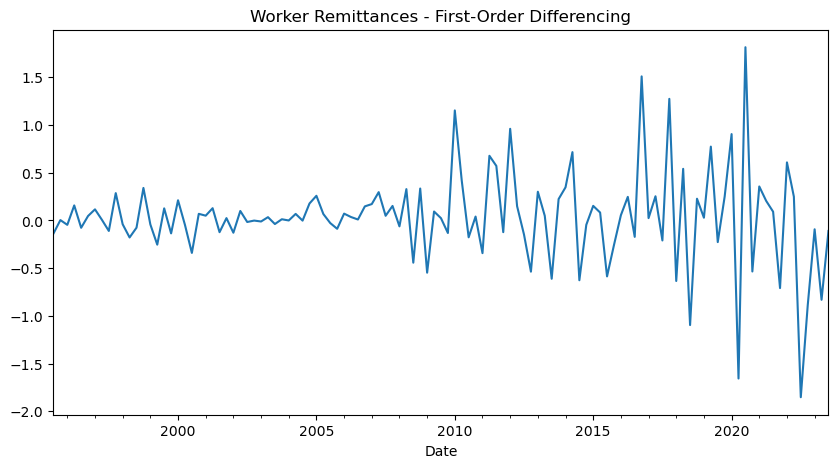

In [333]:
# Perform ADF Test for Worker Remittances
adf_test = adfuller(df["Worker_Remittances"].dropna())

print("ADF Test for Worker Remittances:")
print(f"ADF Statistic: {adf_test[0]:.4f}")
print(f"p-value: {adf_test[1]:.4f}")
print("Critical Values:", adf_test[4])
if adf_test[1] > 0.05:
    print("--> Worker Remittances is **non-stationary** (p > 0.05)")
else:
    print("--> Worker Remittances is **stationary** (p <= 0.05)")

# Apply first-order differencing
df["Worker_Remittances_diff"] = df["Worker_Remittances"].diff()

# Perform ADF Test after Differencing
adf_test_diff = adfuller(df["Worker_Remittances_diff"].dropna())

print("\nADF Test for Worker Remittances (After Differencing):")
print(f"ADF Statistic: {adf_test_diff[0]:.4f}")
print(f"p-value: {adf_test_diff[1]:.4f}")
print("Critical Values:", adf_test_diff[4])
if adf_test_diff[1] > 0.05:
    print("--> Worker Remittances is still **non-stationary** after differencing")
else:
    print("--> Worker Remittances is **stationary** after differencing")

# Plot Worker Remittances after Differencing
df["Worker_Remittances_diff"].dropna().plot(title="Worker Remittances - First-Order Differencing", figsize=(10, 5))
plt.show()

# Modeling

## Exports

In [50]:
# downloading required packages 
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.api import VAR
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, SimpleRNN, Dense
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import scipy.stats as stats
from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.metrics import mean_squared_error, r2_score

# Traditional Models 

## SARIMAX/ARIMA-x

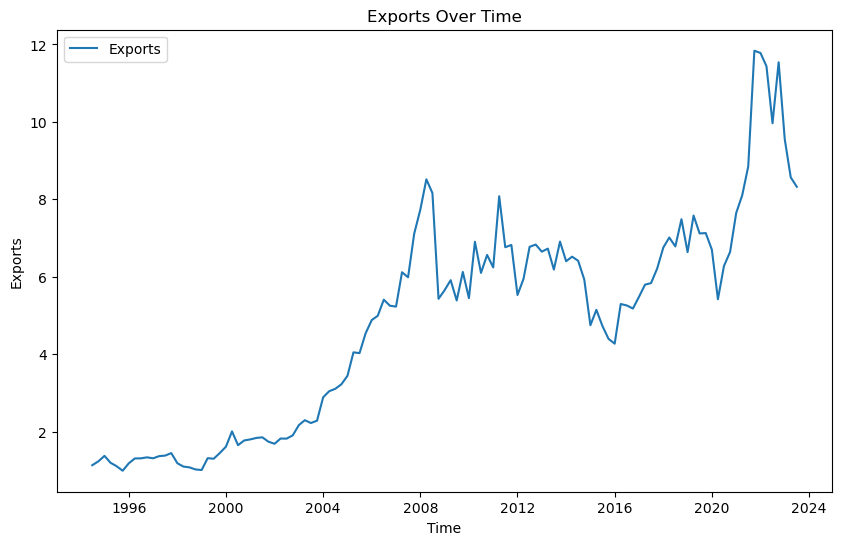

Outliers:
Empty DataFrame
Columns: [FY, Quarters, Trade_Balance, Exports, Petroleum-Exports, Other_Exports, Imports, Petroleum-Imports, Other_Imports, Suez_Canal_dues, Travel_reciepts, Transportation_Payments, Travel_Payments, Income_receipts, Income_payments, Transfers, Worker_Remittances, Official_Transfers_(net), Current_Account_Balance, EGYPT_INFLATION_PCHANGE, KUWAIT_GDP, QATAR_GDP, SAUDI_ARABIA_GDP, UAE_GDP, ADVANCED_ECONOMY_GDP, WORLD_GDP, CRUDE_OIL_PRICE_DOLLAR, CRUSE_OIL_PRICE_INDEX, EUO_AREA_GDP_growth, NATURAL_GAS_DOLLAR, NATURAL_GAS_INDEX, NON_FUEL_COMMODITY_PRICE_INDEX, TARDE_VOLUME_PCHANGE, UNITED_SATES_GDP, Exchange_rate_EG_US, EUO_AREA_GDP_bn, EGYPT_GDP_bn, Date, GCC_GDP, LOG_GCC_GDP, Log_World_GDP, Log_EGYPT_GDP_bn, Log_EUO_AREA_GDP_bn]
Index: []

[0 rows x 43 columns]


In [54]:
#checking for outliers in exports 
plt.figure(figsize=(10, 6))
plt.plot(df['Date'],df["Exports"], label="Exports")
plt.title("Exports Over Time")
plt.xlabel("Time")
plt.ylabel("Exports")
plt.legend()
plt.show()

Q1 = df["Exports"].quantile(0.25)
Q3 = df["Exports"].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df[(df["Exports"] < lower_bound) | (df["Exports"] > upper_bound)]
print("Outliers:")
print(outliers)

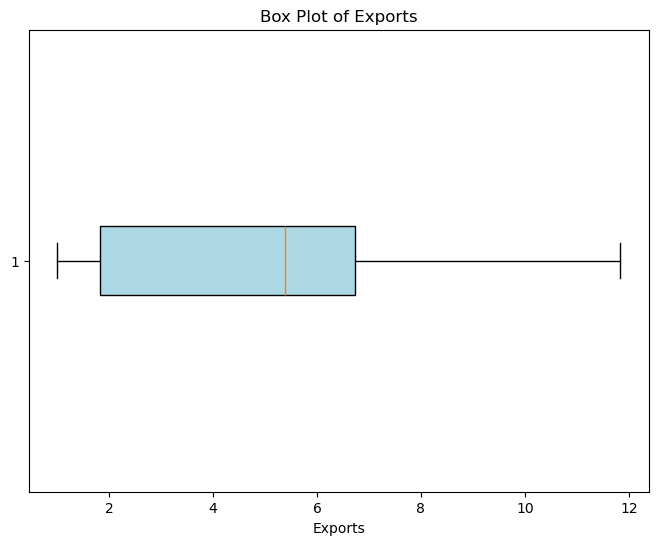

In [56]:
import matplotlib.pyplot as plt

# Draw a box plot for exports
plt.figure(figsize=(8, 6))
plt.boxplot(df["Exports"], vert=False, patch_artist=True, boxprops=dict(facecolor="lightblue"))
plt.title("Box Plot of Exports")
plt.xlabel("Exports")
plt.show()


In [78]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Define features and target
features = ["Exchange_rate_EG_US", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EUO_AREA_GDP_bn", 'Imports', 'Log_World_GDP']
target = "Exports"

# Extract full dataset
y = df[target]
X = df[features]

# Fit Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predictions on the same dataset
y_pred = model.predict(X)

# Performance metrics
print(f"RMSE: {np.sqrt(mean_squared_error(y, y_pred))}")
print(f"R2: {r2_score(y, y_pred)}")

# OLS model with statsmodels
X_sm = sm.add_constant(X)  # Add intercept manually
ols_model = sm.OLS(y, X_sm).fit()

# Display regression summary
print(ols_model.summary())


RMSE: 0.6201386631669056
R2: 0.9497831475530126
                            OLS Regression Results                            
Dep. Variable:                Exports   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.948
Method:                 Least Squares   F-statistic:                     419.9
Date:                Sat, 09 Aug 2025   Prob (F-statistic):           2.35e-70
Time:                        11:13:55   Log-Likelihood:                -110.11
No. Observations:                 117   AIC:                             232.2
Df Residuals:                     111   BIC:                             248.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [80]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define features (same as used in OLS)
features = ["Exchange_rate_EG_US", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EUO_AREA_GDP_bn", 'Imports', 'Log_World_GDP']

# Extract features
X = df[features]

# Add constant for intercept (required for VIF)
X_const = sm.add_constant(X)

# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i)
                   for i in range(X_const.shape[1])]

print(vif_data)


                 Variable           VIF
0                   const  13863.159587
1     Exchange_rate_EG_US      4.832521
2  CRUDE_OIL_PRICE_DOLLAR      5.111176
3     Log_EUO_AREA_GDP_bn      2.222472
4                 Imports     11.401603
5           Log_World_GDP     18.785200


In [82]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Define features and target
features = ["CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn", "Imports"]
target = "Exports"

# Extract full dataset
y = df[target]
X = df[features]

# Fit Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predictions on the same dataset
y_pred = model.predict(X)

# Performance metrics
print(f"RMSE: {np.sqrt(mean_squared_error(y, y_pred))}")
print(f"R2: {r2_score(y, y_pred)}")

# OLS model with statsmodels
X_sm = sm.add_constant(X)  # Add intercept
ols_model = sm.OLS(y, X_sm).fit()

# Display regression summary
print(ols_model.summary())


RMSE: 0.6691892714707067
R2: 0.9415250566257585
                            OLS Regression Results                            
Dep. Variable:                Exports   R-squared:                       0.942
Model:                            OLS   Adj. R-squared:                  0.940
Method:                 Least Squares   F-statistic:                     606.5
Date:                Sat, 09 Aug 2025   Prob (F-statistic):           1.79e-69
Time:                        11:18:10   Log-Likelihood:                -119.02
No. Observations:                 117   AIC:                             246.0
Df Residuals:                     113   BIC:                             257.1
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [76]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Your exogenous variables
features = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]

# Subset DataFrame to only the exogenous variables
X = df[features].copy()

# Add constant for intercept (required for VIF)
X_const = sm.add_constant(X)

# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i)
                   for i in range(X_const.shape[1])]

print(vif_data)


                 Variable          VIF
0                   const  3571.058071
1                 Imports     3.366771
2  CRUDE_OIL_PRICE_DOLLAR     2.568870
3     Log_EUO_AREA_GDP_bn     1.831850


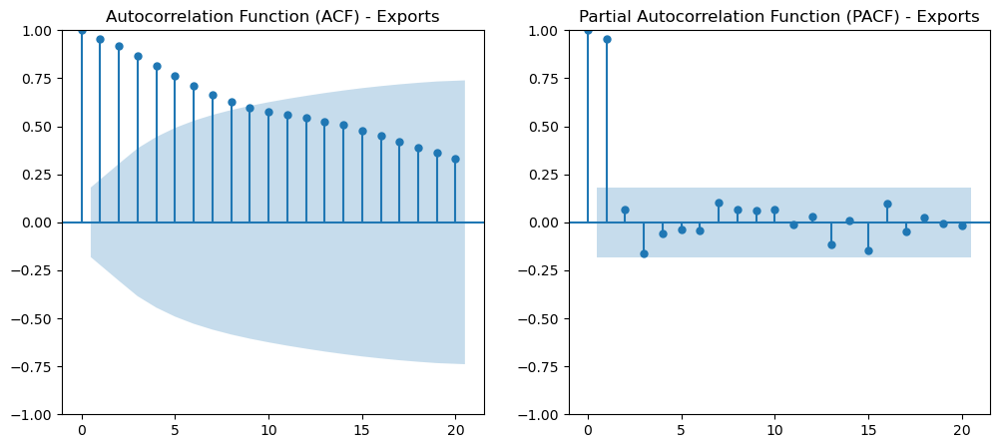

In [66]:
# Model specification: ACF & PACF Plots for Exports
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(df[target], ax=axes[0], lags=20)
axes[0].set_title("Autocorrelation Function (ACF) - Exports")

plot_pacf(df[target], ax=axes[1], lags=20)
axes[1].set_title("Partial Autocorrelation Function (PACF) - Exports")

plt.show()

In [70]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Define features and target
features = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]
target = "Exports"

# Split data into training and testing sets
train_size = int(len(df) * 0.8)  # Use 80% of data for training
train, test = df.iloc[:train_size], df.iloc[train_size:]

# Extract training and testing data
y_train, X_train = train[target], train[features]
y_test, X_test = test[target], test[features]

# Define the seasonal order and non-seasonal orders to test
seasonal_order = (1, 1, 1, 4)  # Seasonal parameters (P, D, Q, s) with quarterly seasonality
orders_to_test = [(1, 1, 0), (1, 1, 1), (2, 1, 1), (2, 1, 2)]  # Non-seasonal parameters (p, d, q)

# Create a dictionary to store model performance
model_performance = {}

# Loop through the different orders and fit the SARIMAX model
for order in orders_to_test:
    try:
        # Fit the SARIMAX model on the training data
        model = SARIMAX(y_train, exog=X_train, order=order, seasonal_order=seasonal_order)
        model_fit = model.fit(disp=False)
        
        # Training Performance
        y_train_pred = model_fit.fittedvalues
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        train_r2 = r2_score(y_train, y_train_pred)
        train_f_stat = model_fit.llf  # Log-likelihood as a proxy for F-statistic
        
        # Forecast on the test data
        y_test_pred = model_fit.forecast(steps=len(y_test), exog=X_test)
        
        # Test Performance
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        test_r2 = r2_score(y_test, y_test_pred)
        
        # Check parameter significance
        p_values = model_fit.pvalues
        significant_params = (p_values < 0.05).sum()  # Count significant parameters
        
        # Store model performance metrics
        model_performance[order] = {
            "AIC": model_fit.aic,
            "Train RMSE": train_rmse,
            "Train R2": train_r2,
            "Test RMSE": test_rmse,
            "Test R2": test_r2,
            "Significant Parameters": significant_params,
            "Total Parameters": len(p_values),
            "Model Fit": model_fit  # Store the trained model for later use
        }
        
        # Print performance metrics for the current model
        print(f"Model SARIMAX{order} x {seasonal_order}")
        print(f"AIC: {model_fit.aic}")
        print(f"Train RMSE: {train_rmse}, Train R2: {train_r2}")
        print(f"Test RMSE: {test_rmse}, Test R2: {test_r2}")
        print(f"Significant Parameters: {significant_params}/{len(p_values)}")
        print("\n")
    
    except Exception as e:
        print(f"Model SARIMAX{order} x {seasonal_order} failed: {e}")

# Identify the best model based on the lowest AIC
best_order = min(model_performance, key=lambda x: model_performance[x]["AIC"])
best_model_metrics = model_performance[best_order]
best_model_fit = best_model_metrics["Model Fit"]

# Display the best model summary
print("\nBest SARIMAX Model:")
print(f"Order: {best_order} x {seasonal_order}")
print(f"AIC: {best_model_metrics['AIC']}")
print(f"Train RMSE: {best_model_metrics['Train RMSE']}, Train R2: {best_model_metrics['Train R2']}")
print(f"Test RMSE: {best_model_metrics['Test RMSE']}, Test R2: {best_model_metrics['Test R2']}")
print(f"Significant Parameters: {best_model_metrics['Significant Parameters']}/{best_model_metrics['Total Parameters']}")

# Print the full summary of the best model
print("\nBest Model Summary:\n")
print(best_model_fit.summary())


Model SARIMAX(1, 1, 0) x (1, 1, 1, 4)
AIC: 116.01105859252897
Train RMSE: 0.538783030298707, Train R2: 0.9438649113609705
Test RMSE: 1.5465311913414175, Test R2: 0.3210998780786005
Significant Parameters: 5/7


Model SARIMAX(1, 1, 1) x (1, 1, 1, 4)
AIC: 112.35320326023918
Train RMSE: 0.8152999524535869, Train R2: 0.8714590724074874
Test RMSE: 1.6256784043980141, Test R2: 0.24983328115620973
Significant Parameters: 5/8


Model SARIMAX(2, 1, 1) x (1, 1, 1, 4)
AIC: 119.29759360899368
Train RMSE: 0.5928462977675455, Train R2: 0.9320341394924212
Test RMSE: 1.5199362074956044, Test R2: 0.3442485778476313
Significant Parameters: 7/9


Model SARIMAX(2, 1, 2) x (1, 1, 1, 4)
AIC: 115.97273805171129
Train RMSE: 0.8304843733938475, Train R2: 0.8666265068735701
Test RMSE: 1.6500452650867912, Test R2: 0.22717664873544807
Significant Parameters: 4/10



Best SARIMAX Model:
Order: (1, 1, 1) x (1, 1, 1, 4)
AIC: 112.35320326023918
Train RMSE: 0.8152999524535869, Train R2: 0.8714590724074874
Test RMSE: 1

In [74]:
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target
features = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]
target = "Log_Exports"

# Split data into training and testing sets
train_size = int(len(df) * 0.8)  # Use 80% of data for training
train, test = df.iloc[:train_size], df.iloc[train_size:]

# Extract training and testing data
y_train, X_train = train[target], train[features]
y_test, X_test = test[target], test[features]

# Define the seasonal order and non-seasonal orders to test
seasonal_order = (1, 1, 1, 4)  # Seasonal parameters (P, D, Q, s) with quarterly seasonality
orders_to_test = [(1, 1, 0), (1, 1, 1), (2, 1, 1), (2, 1, 2)]  # Non-seasonal parameters (p, d, q)

# Create a dictionary to store model performance
model_performance = {}

# Loop through the different orders and fit the SARIMAX model
for order in orders_to_test:
    try:
        # Fit the SARIMAX model on the training data
        model = SARIMAX(y_train, exog=X_train, order=order, seasonal_order=seasonal_order)
        model_fit = model.fit(disp=False)
        
        # Training Performance
        y_train_pred = model_fit.fittedvalues  # <-- Corrected this line
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        train_r2 = r2_score(y_train, y_train_pred)
        
        # Forecast on the test data
        y_test_pred = model_fit.forecast(steps=len(y_test), exog=X_test)
        
        # Test Performance
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        test_r2 = r2_score(y_test, y_test_pred)
        
        # Check parameter significance
        p_values = model_fit.pvalues
        significant_params = (p_values < 0.05).sum()  # Count significant parameters
        
        # Store model performance metrics
        model_performance[order] = {
            "AIC": model_fit.aic,
            "Train RMSE": train_rmse,
            "Train R2": train_r2,
            "Test RMSE": test_rmse,
            "Test R2": test_r2,
            "Significant Parameters": significant_params,
            "Total Parameters": len(p_values),
            "Model Fit": model_fit  # Store the trained model for later use
        }
        
        # Print performance metrics for the current model
        print(f"Model SARIMAX{order} x {seasonal_order}")
        print(f"AIC: {model_fit.aic}")
        print(f"Train RMSE: {train_rmse}, Train R2: {train_r2}")
        print(f"Test RMSE: {test_rmse}, Test R2: {test_r2}")
        print(f"Significant Parameters: {significant_params}/{len(p_values)}")
        print("\n")
    
    except Exception as e:
        print(f"Model SARIMAX{order} x {seasonal_order} failed: {e}")

# Identify the best model based on the lowest AIC
best_order = min(model_performance, key=lambda x: model_performance[x]["AIC"])
best_model_metrics = model_performance[best_order]
best_model_fit = best_model_metrics["Model Fit"]

# Display the best model summary
print("\nBest SARIMAX Model:")
print(f"Order: {best_order} x {seasonal_order}")
print(f"AIC: {best_model_metrics['AIC']}")
print(f"Train RMSE: {best_model_metrics['Train RMSE']}, Train R2: {best_model_metrics['Train R2']}")
print(f"Test RMSE: {best_model_metrics['Test RMSE']}, Test R2: {best_model_metrics['Test R2']}")
print(f"Significant Parameters: {best_model_metrics['Significant Parameters']}/{best_model_metrics['Total Parameters']}")

# Print the full summary of the best model
print("\nBest Model Summary:\n")
print(best_model_fit.summary())


Model SARIMAX(1, 1, 0) x (1, 1, 1, 4)
AIC: -159.00010977024561
Train RMSE: 0.39442580927331544, Train R2: 0.6754179082165692
Test RMSE: 0.11391874708168832, Test R2: 0.7276146077098055
Significant Parameters: 5/7


Model SARIMAX(1, 1, 1) x (1, 1, 1, 4)
AIC: -157.33317788491087
Train RMSE: 0.3961937629675649, Train R2: 0.6725016071851442
Test RMSE: 0.1085973177593178, Test R2: 0.7524678516668991
Significant Parameters: 5/8


Model SARIMAX(2, 1, 1) x (1, 1, 1, 4)
AIC: -155.42179689755758
Train RMSE: 0.41157879567403777, Train R2: 0.6465728665548346
Test RMSE: 0.10967368073161331, Test R2: 0.747536701842574
Significant Parameters: 5/9


Model SARIMAX(2, 1, 2) x (1, 1, 1, 4)
AIC: -153.41506908902556
Train RMSE: 0.4493561478385991, Train R2: 0.5787156948609439
Test RMSE: 0.10693267197278909, Test R2: 0.7599983368378113
Significant Parameters: 5/10



Best SARIMAX Model:
Order: (1, 1, 0) x (1, 1, 1, 4)
AIC: -159.00010977024561
Train RMSE: 0.39442580927331544, Train R2: 0.6754179082165692
Tes

In [104]:
import numpy as np
import pandas as pd
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch, normal_ad

# Define features and target
features = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]
target = "Log_Exports"

# Split data into training and testing sets
train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]
y_train, X_train = train[target], train[features]
y_test, X_test = test[target], test[features]

# Model orders to test
seasonal_order = (0, 0, 0, 0)
orders_to_test = [(1, 1, 0), (1, 1, 1), (2, 1, 1), (2, 1, 2)]

model_performance = {}

for order in orders_to_test:
    try:
        model = SARIMAX(y_train, exog=X_train, order=order, seasonal_order=seasonal_order)
        model_fit = model.fit(disp=False)
        
        # Predictions
        y_train_pred = model_fit.fittedvalues
        y_test_pred = model_fit.forecast(steps=len(y_test), exog=X_test)
        
        # Performance metrics
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        train_r2 = r2_score(y_train, y_train_pred)
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        test_r2 = r2_score(y_test, y_test_pred)
        
        # Parameter significance
        p_values = model_fit.pvalues
        significant_params = (p_values < 0.05).sum()
        
        model_performance[order] = {
            "AIC": model_fit.aic,
            "Train RMSE": train_rmse,
            "Train R2": train_r2,
            "Test RMSE": test_rmse,
            "Test R2": test_r2,
            "Significant Parameters": significant_params,
            "Total Parameters": len(p_values),
            "Model Fit": model_fit
        }
        
        print(f"Model ARIMAX{order} | AIC: {model_fit.aic:.3f} | Train R2: {train_r2:.3f} | Test R2: {test_r2:.3f}")
    
    except Exception as e:
        print(f"Model ARIMAX{order} failed: {e}")

# Best model based on AIC
best_order = min(model_performance, key=lambda x: model_performance[x]["AIC"])
best_model_metrics = model_performance[best_order]
best_model_fit_A = best_model_metrics["Model Fit"]

print("\nBest ARIMAX Model:")
print(f"Order: {best_order} x {seasonal_order}")
print(f"AIC: {best_model_metrics['AIC']}")
print(f"Train RMSE: {best_model_metrics['Train RMSE']}, Train R2: {best_model_metrics['Train R2']}")
print(f"Test RMSE: {best_model_metrics['Test RMSE']}, Test R2: {best_model_metrics['Test R2']}")
print(f"Significant Parameters: {best_model_metrics['Significant Parameters']}/{best_model_metrics['Total Parameters']}")
print(best_model_fit_A.summary())

# Residual Diagnostics for Best Model
residuals = best_model_fit_A.resid




Model ARIMAX(1, 1, 0) | AIC: -171.712 | Train R2: 0.782 | Test R2: 0.733
Model ARIMAX(1, 1, 1) | AIC: -172.546 | Train R2: 0.709 | Test R2: 0.733
Model ARIMAX(2, 1, 1) | AIC: -170.442 | Train R2: 0.709 | Test R2: 0.728
Model ARIMAX(2, 1, 2) | AIC: -168.546 | Train R2: 0.709 | Test R2: 0.733

Best ARIMAX Model:
Order: (1, 1, 1) x (0, 0, 0, 0)
AIC: -172.5455342466747
Train RMSE: 0.3734589250217217, Train R2: 0.7090089780401513
Test RMSE: 0.11273221870120381, Test R2: 0.7332591550279639
Significant Parameters: 5/6
                               SARIMAX Results                                
Dep. Variable:            Log_Exports   No. Observations:                   93
Model:               SARIMAX(1, 1, 1)   Log Likelihood                  92.273
Date:                Sat, 09 Aug 2025   AIC                           -172.546
Time:                        14:06:47   BIC                           -157.415
Sample:                             0   HQIC                          -166.439
         

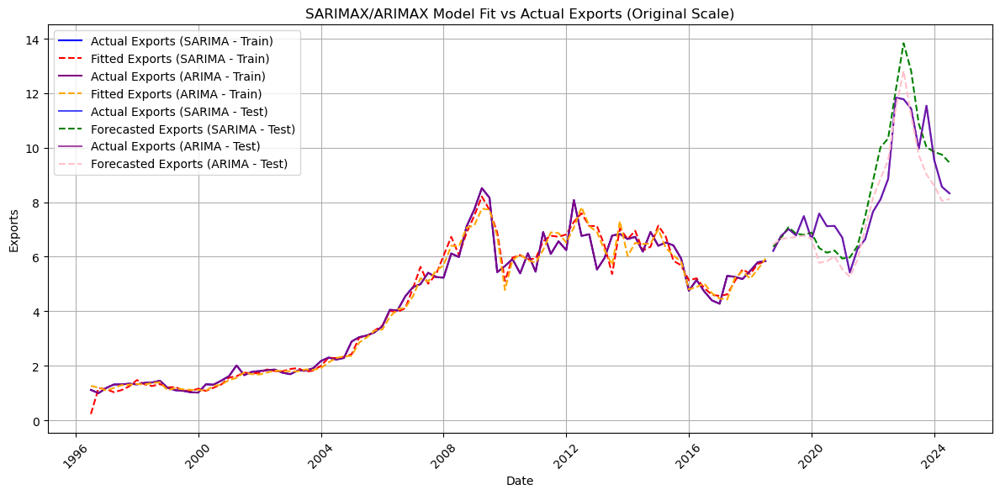

In [76]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure 'Date' column is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Generate predictions for training and test data (log-transformed)
# SARIMA_x
y_train_pred_log_s = best_model_fit_s.fittedvalues  # In-sample predictions for training data
y_test_pred_log_s = best_model_fit_s.forecast(steps=len(test), exog=test[features])  # Out-of-sample forecast for test data

# ARIMA_X
y_train_pred_log_A = best_model_fit_A.fittedvalues  # In-sample predictions for training data
y_test_pred_log_A = best_model_fit_A.forecast(steps=len(test), exog=test[features])  # Out-of-sample forecast for test data

# Convert predictions and actual values back to the original scale (exponentiation)
# SARIMA_x
y_train_actual_s = np.exp(train['Log_Exports'])  # Actual exports (training data)
y_train_pred_actual_s = np.exp(y_train_pred_log_s)  # Fitted values (training data)
y_test_actual_s = np.exp(test['Log_Exports'])  # Actual exports (test data)
y_test_pred_actual_s = np.exp(y_test_pred_log_s)  # Forecasted exports (test data)

# ARIMA_X
y_train_actual_A = np.exp(train['Log_Exports'])  # Actual exports (training data)
y_train_pred_actual_A = np.exp(y_train_pred_log_A)  # Fitted values (training data)
y_test_actual_A = np.exp(test['Log_Exports'])  # Actual exports (test data)
y_test_pred_actual_A = np.exp(y_test_pred_log_A)  # Forecasted exports (test data)

# Exclude the first few initial fitted values to avoid instability
initial_exclusions = 4  # Number of initial observations to exclude
# SARIMA_x
y_train_pred_actual_s = y_train_pred_actual_s.iloc[initial_exclusions:]
y_train_actual_s = y_train_actual_s.iloc[initial_exclusions:]

# ARIMA_X
y_train_pred_actual_A = y_train_pred_actual_A.iloc[initial_exclusions:]
y_train_actual_A = y_train_actual_A.iloc[initial_exclusions:]

# Make sure the lengths match before plotting
min_length = min(len(y_train_actual_s), len(y_train_pred_actual_s),
                 len(y_train_actual_A), len(y_train_pred_actual_A))

# Trim all to match the shortest length
train_dates = train['Date'].iloc[initial_exclusions:initial_exclusions + min_length]
y_train_actual_s = y_train_actual_s.iloc[:min_length]
y_train_pred_actual_s = y_train_pred_actual_s.iloc[:min_length]
y_train_actual_A = y_train_actual_A.iloc[:min_length]
y_train_pred_actual_A = y_train_pred_actual_A.iloc[:min_length]

# Plot actual vs. predicted values using the date index
plt.figure(figsize=(12, 6))

# Plot training actual and fitted values separately
plt.plot(train_dates, y_train_actual_s, label="Actual Exports (SARIMA - Train)", color="blue", linestyle="solid")
plt.plot(train_dates, y_train_pred_actual_s, label="Fitted Exports (SARIMA - Train)", color="red", linestyle="dashed")

plt.plot(train_dates, y_train_actual_A, label="Actual Exports (ARIMA - Train)", color="purple", linestyle="solid")
plt.plot(train_dates, y_train_pred_actual_A, label="Fitted Exports (ARIMA - Train)", color="orange", linestyle="dashed")

# Plot test actual and forecasted values
plt.plot(test['Date'], y_test_actual_s, label="Actual Exports (SARIMA - Test)", color="blue", linestyle="solid", alpha=0.7)
plt.plot(test['Date'], y_test_pred_actual_s, label="Forecasted Exports (SARIMA - Test)", color="green", linestyle="dashed")

plt.plot(test['Date'], y_test_actual_A, label="Actual Exports (ARIMA - Test)", color="purple", linestyle="solid", alpha=0.7)
plt.plot(test['Date'], y_test_pred_actual_A, label="Forecasted Exports (ARIMA - Test)", color="pink", linestyle="dashed")

# Formatting
plt.xlabel("Date")
plt.ylabel("Exports")
plt.title("SARIMAX/ARIMAX Model Fit vs Actual Exports (Original Scale)")
plt.legend()
plt.grid(True)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

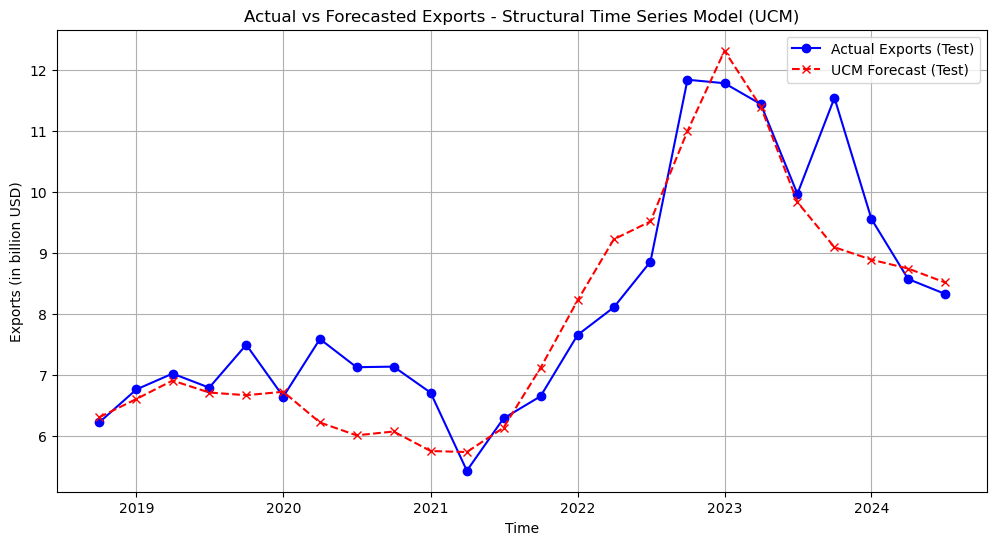


==== UCM Model Evaluation ====
R² Score (Train Data): 0.756
R² Score (Test Data): 0.813
Mean Absolute Error (MAE - Test Data): 0.590
Mean Absolute Error (MAE - Train Data): 0.447
AIC: -206.775
BIC: -189.514

UCM Model Summary:
                            Unobserved Components Results                            
Dep. Variable:                  Log_Exports   No. Observations:                   92
Model:                   local linear trend   Log Likelihood                 110.388
                   + stochastic seasonal(4)   AIC                           -206.775
Date:                      Thu, 06 Mar 2025   BIC                           -189.514
Time:                              15:11:09   HQIC                          -199.824
Sample:                          10-01-1995                                         
                               - 07-01-2018                                         
Covariance Type:                        opg                                         
      

In [79]:
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score

# Define target variable (log-transformed) and exogenous variables
df["Log_Exports"] = np.log(df["Exports"] + 1)  # Log transformation to avoid log(0)
exog_vars = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]
df['Date_1']=df['Date']
# Handle missing values
df = df.dropna()
df.set_index('Date_1',inplace=True)
# Step 1: Train-Test Split (80% Train, 20% Test)
split_index = int(len(df) * 0.8)
train_data, test_data = df.iloc[:split_index], df.iloc[split_index:]

# Step 2: Define the Structural Time Series Model (UCM)
ucm_model = sm.tsa.UnobservedComponents(
    train_data["Log_Exports"],
    level="local linear trend",  # Trend component
    seasonal=4,  # Quarterly seasonality
    exog=train_data[exog_vars]  # Exogenous variables
)

# Step 3: Fit the Model
ucm_results = ucm_model.fit()

# Step 4: Generate Forecasts for Train and Test Data
train_forecast_ucm = ucm_results.predict(start=0, end=len(train_data) - 1, exog=train_data[exog_vars])
test_forecast_ucm = ucm_results.predict(start=len(train_data), end=len(df) - 1, exog=test_data[exog_vars])

# Convert forecasts back from log scale
train_forecast_ucm_exp = np.exp(train_forecast_ucm) - 1
test_forecast_ucm_exp = np.exp(test_forecast_ucm) - 1
actual_train_exports = np.exp(train_data["Log_Exports"]) - 1
actual_test_exports = np.exp(test_data["Log_Exports"]) - 1

# Step 5: Model Evaluation (Train & Test R²)
r2_train_ucm = r2_score(actual_train_exports, train_forecast_ucm_exp)
r2_test_ucm = r2_score(actual_test_exports, test_forecast_ucm_exp)
mae_test_ucm = mean_absolute_error(actual_test_exports, test_forecast_ucm_exp)
mae_train_ucm = mean_absolute_error(actual_train_exports, train_forecast_ucm_exp)

aic_ucm = ucm_results.aic
bic_ucm = ucm_results.bic

# Step 6: Plot Forecast vs Actual (Test Data)
plt.figure(figsize=(12, 6))
plt.plot(actual_test_exports.index, actual_test_exports, label="Actual Exports (Test)", color="blue", marker="o")
plt.plot(actual_test_exports.index, test_forecast_ucm_exp, label="UCM Forecast (Test)", color="red", linestyle="dashed", marker="x")
plt.xlabel("Time")
plt.ylabel("Exports (in billion USD)")
plt.title("Actual vs Forecasted Exports - Structural Time Series Model (UCM)")
plt.legend()
plt.grid(True)
plt.show()

# Step 7: Print Model Results
print("\n==== UCM Model Evaluation ====")
print(f"R² Score (Train Data): {r2_train_ucm:.3f}")
print(f"R² Score (Test Data): {r2_test_ucm:.3f}")
print(f"Mean Absolute Error (MAE - Test Data): {mae_test_ucm:.3f}")
print(f"Mean Absolute Error (MAE - Train Data): {mae_train_ucm:.3f}")

print(f"AIC: {aic_ucm:.3f}")
print(f"BIC: {bic_ucm:.3f}")
print("\nUCM Model Summary:\n", ucm_results.summary())



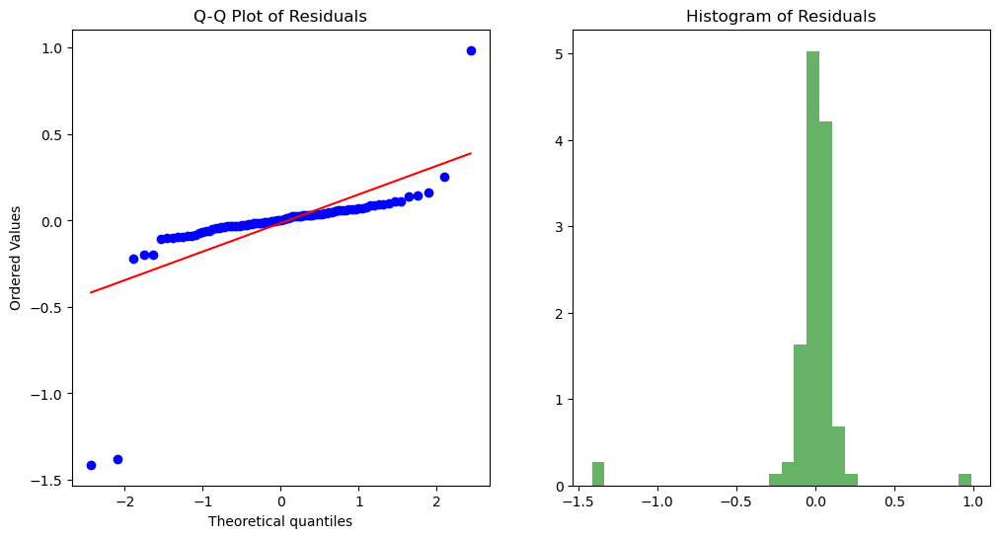

Shapiro-Wilk Test p-value: 0.0000

Ljung-Box Test p-values:
1     5.909015e-06
2     3.488780e-05
3     2.406671e-06
4     3.840691e-07
5     1.139303e-06
6     2.794914e-06
7     6.939294e-06
8     1.683010e-05
9     3.801027e-05
10    7.857700e-05
Name: lb_pvalue, dtype: float64

Breusch-Pagan Test p-value: 0.2445


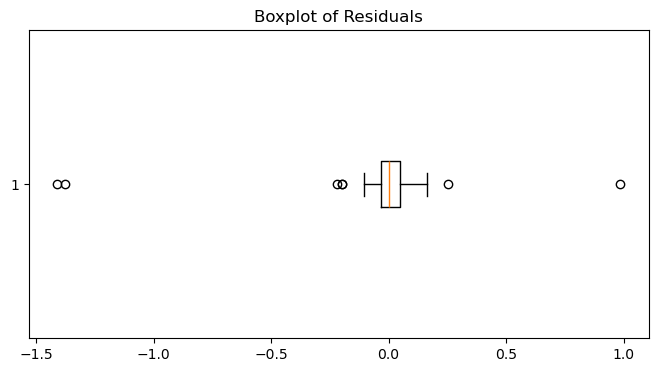

In [83]:
from scipy.stats import probplot, shapiro

# Step 6: Residual Diagnostics
residuals = ucm_results.resid

# Normality Test (Q-Q Plot and Shapiro-Wilk Test)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")

plt.subplot(1, 2, 2)
plt.hist(residuals, bins=30, density=True, alpha=0.6, color='g')
plt.title("Histogram of Residuals")
plt.show()

shapiro_test = shapiro(residuals)
print(f"Shapiro-Wilk Test p-value: {shapiro_test[1]:.4f}")

# Autocorrelation Test (Ljung-Box Test)
ljung_box_test = acorr_ljungbox(residuals, lags=10)
print("\nLjung-Box Test p-values:")
print(ljung_box_test.iloc[:, 1])

# Heteroscedasticity Test (Breusch-Pagan Test)
# Add a constant to the exogenous variables
exog_with_const = sm.add_constant(ucm_results.model.exog)
bp_test = het_breuschpagan(residuals, exog_with_const)
print(f"\nBreusch-Pagan Test p-value: {bp_test[1]:.4f}")

# Outlier Detection (Boxplot)
plt.figure(figsize=(8, 4))
plt.boxplot(residuals, vert=False)
plt.title("Boxplot of Residuals")
plt.show()

# XGboost

In [111]:
#reading data again 
df=pd.read_excel('thesis data.xlsx')
# Combine 'FY' and 'Quarters' into a single 'Date' column

df['Date']=df['FY'].astype(str) + 'Q' + df['Quarters'].astype(str)
df['Date'] = pd.to_datetime(df['Date'])

# Drop the now redundant 'FY' and 'Quarters' columns
df.drop(columns=['FY', 'Quarters'], inplace=True)


# Display the first few rows to confirm the changes
print(df.head())

print(df.info())

# converting data from million to billion dollars
# Identify the columns up to 'Current_Account'
columns_to_convert = df.loc[:, : 'Current_Account_Balance'].columns  # Select all columns up to 'Current_Account'

# Convert the values from millions to billions by dividing by 1,000
df[columns_to_convert] = df[columns_to_convert] / 1000

# Verify the changes
print(df[columns_to_convert].tail())

#Calculating GCC GDP and transforming it to rescale
df['GCC_GDP'] = df[['KUWAIT_GDP', 'QATAR_GDP', 'SAUDI_ARABIA_GDP', 'UAE_GDP']].mean(axis=1)
df['LOG_GCC_GDP'] = np.log(df['GCC_GDP'])

#rescaling World and Egyptian GDP
df['Log_World_GDP']=np.log(df['WORLD_GDP'])
df['Log_EGYPT_GDP_bn']=np.log(df['EGYPT_GDP_bn'])
df['Log_EUO_AREA_GDP_bn']=np.log(df['EUO_AREA_GDP_bn'])
df.columns

df['Date_1']=df['Date']
df.set_index('Date',inplace=True)
df["Log_Exports"]=np.log(df['Exports'])


   Trade_Balance  Exports  Petroleum-Exports  Other_Exports  Imports  \
0        -1397.9   1137.8            284.450        853.350   2535.7   
1        -2125.0   1237.7            309.425        928.275   3362.7   
2        -2157.8   1379.4            344.850       1034.550   3537.2   
3        -2172.8   1202.1            300.525        901.575   3374.9   
4        -2285.6   1113.2            278.300        834.900   3398.8   

   Petroleum-Imports  Other_Imports  Petroleum_Balance  Other_Balance  \
0              507.1        2028.56             -222.7        -1175.2   
1              672.5        2690.16             -363.1        -1761.9   
2              707.4        2829.76             -362.6        -1795.2   
3              675.0        2699.92             -374.5        -1798.3   
4              679.8        2719.04             -401.5        -1884.1   

   Services_Balance  ...  EUO_AREA_GDP_growth  NATURAL_GAS_DOLLAR  \
0             948.5  ...              2.69700             1

XGBoost (Train) Evaluation:
RMSE: 0.0214
MAE: 0.0172
R²: 0.9629


XGBoost (Test) Evaluation:
RMSE: 0.1234
MAE: 0.0927
R²: 0.0139




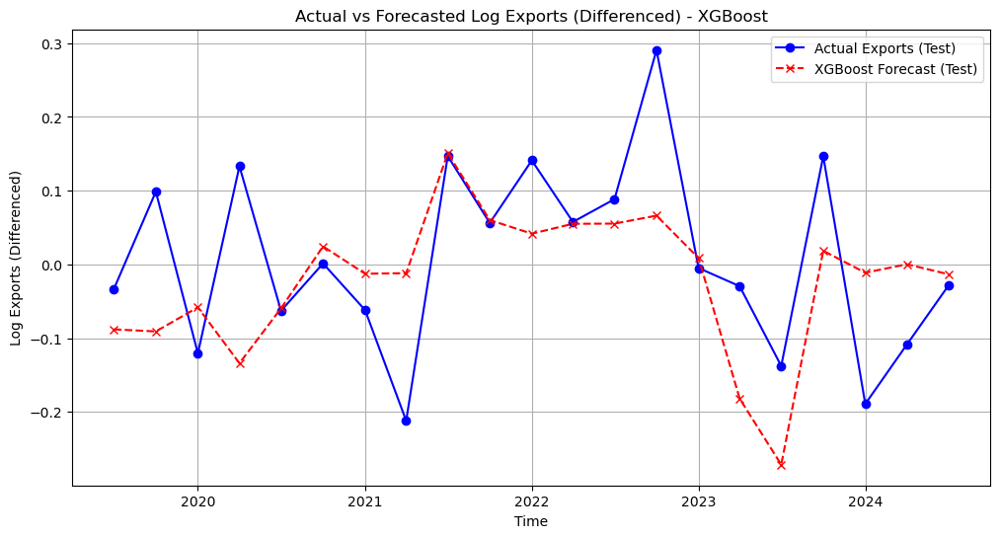

In [111]:
import numpy as np
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
import matplotlib.pyplot as plt

exog_vars = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]

# Apply differencing to make all variables stationary
df["Log_Exports"]=np.log(df['Exports'])
df["Log_Exports_Diff"] = df["Log_Exports"].diff().dropna()  # First-order differencing for target variable
for var in exog_vars:
    df[f"{var}_Diff"] = df[var].diff().dropna()  # First-order differencing for explanatory variables

# Drop the first row (NaN after differencing)
df = df.dropna()

# Train-Test Split (80% Train, 20% Test)
split_index = int(len(df) * 0.8)
train_data, test_data = df.iloc[:split_index], df.iloc[split_index:]

# Feature Engineering (Create Lagged Features)
lags = 3  # Number of lagged features to create
for lag in range(1, lags + 1):
    train_data[f"Log_Exports_Diff_lag{lag}"] = train_data["Log_Exports_Diff"].shift(lag)
    test_data[f"Log_Exports_Diff_lag{lag}"] = test_data["Log_Exports_Diff"].shift(lag)

# Drop rows with NaN values (due to lag creation)
train_data = train_data.dropna()
test_data = test_data.dropna()

# Prepare Features and Target
X_train = train_data[[f"{var}_Diff" for var in exog_vars] + [f"Log_Exports_Diff_lag{lag}" for lag in range(1, lags + 1)]]
y_train = train_data["Log_Exports_Diff"]
X_test = test_data[[f"{var}_Diff" for var in exog_vars] + [f"Log_Exports_Diff_lag{lag}" for lag in range(1, lags + 1)]]
y_test = test_data["Log_Exports_Diff"]

# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train XGBoost Model
xgb_model = xgb.XGBRegressor(objective="reg:squarederror", n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
xgb_model.fit(X_train_scaled, y_train)

# Generate Predictions
y_train_pred_xgb = xgb_model.predict(X_train_scaled)
y_test_pred_xgb = xgb_model.predict(X_test_scaled)

# Evaluate XGBoost
def evaluate_model(y_true, y_pred, model_name):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f"{model_name} Evaluation:")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R²: {r2:.4f}")
    print("\n")

evaluate_model(y_train, y_train_pred_xgb, "XGBoost (Train)")
evaluate_model(y_test, y_test_pred_xgb, "XGBoost (Test)")

# Plot Predictions vs Actual (Test Data)
plt.figure(figsize=(12, 6))
plt.plot(test_data.index, y_test, label="Actual Exports (Test)", color="blue", marker="o")
plt.plot(test_data.index, y_test_pred_xgb, label="XGBoost Forecast (Test)", color="red", linestyle="dashed", marker="x")
plt.xlabel("Time")
plt.ylabel("Log Exports (Differenced)")
plt.title("Actual vs Forecasted Log Exports (Differenced) - XGBoost")
plt.legend()
plt.grid(True)
plt.show()

   Lags                                        Best_Params  Train_RMSE  \
0     1  {'colsample_bytree': 1.0, 'gamma': 0, 'learnin...    0.053001   
1     2  {'colsample_bytree': 1.0, 'gamma': 0, 'learnin...    0.047399   
2     3  {'colsample_bytree': 1.0, 'gamma': 0, 'learnin...    0.060218   
3     6  {'colsample_bytree': 0.8, 'gamma': 0, 'learnin...    0.038964   
4    12  {'colsample_bytree': 0.8, 'gamma': 0, 'learnin...    0.032442   

   Train_MAE  Train_R2  Test_RMSE  Test_MAE   Test_R2  
0   0.038691  0.773954   0.096796  0.073490  0.324419  
1   0.034661  0.819853   0.109820  0.081052  0.130379  
2   0.044913  0.706219   0.113522  0.083551  0.070771  
3   0.027490  0.875414   0.106918  0.076310  0.175729  
4   0.019944  0.918956   0.107519  0.083173  0.166442  

Best lag length: 1 lags with Test R² = 0.3244


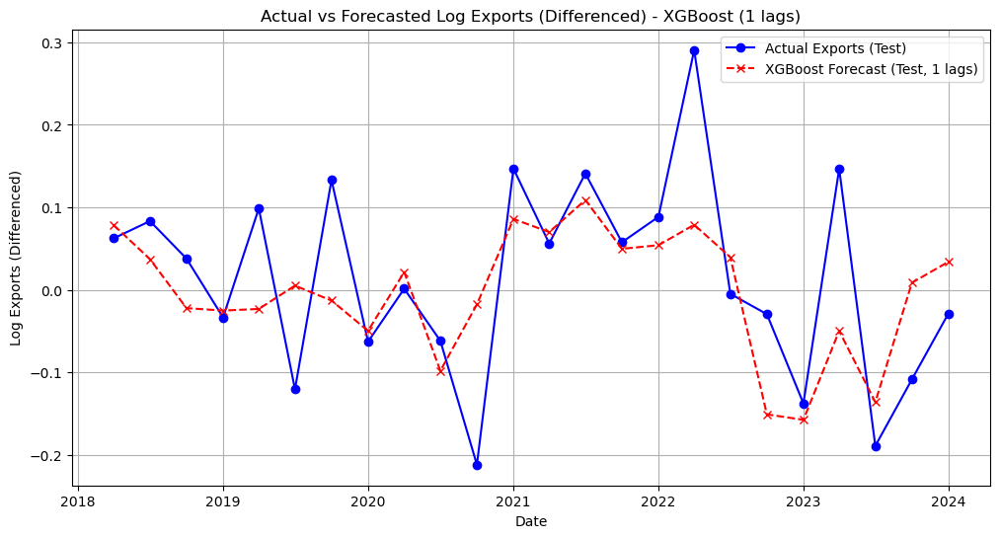

In [119]:

# searching for the best lagges and parameter tuning

import numpy as np
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor
import matplotlib.pyplot as plt

# ============================
# 1. Prepare Data
# ============================
# Copy your original dataset to avoid overwriting
df_exports = df.copy()

# Ensure Date is datetime and set as index
df_exports["Date_1"] = pd.to_datetime(df_exports["Date_1"])
df_exports = df_exports.set_index("Date_1")

# List of original explanatory variables
exog_vars = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]

# Apply differencing for stationarity
df_exports["Log_Exports"] = np.log(df_exports["Exports"])
df_exports["Log_Exports_Diff"] = df_exports["Log_Exports"].diff()
for var in exog_vars:
    df_exports[f"{var}_Diff"] = df_exports[var].diff()

# Drop missing after differencing
df_exports = df_exports.dropna()

# Train-Test Split (80% train, 20% test)
split_index = int(len(df_exports) * 0.8)
train_data, test_data = df_exports.iloc[:split_index], df_exports.iloc[split_index:]

# Extract y and X base (no lags yet)
y_train_base = train_data["Log_Exports_Diff"]
y_test_base = test_data["Log_Exports_Diff"]
X_train_base = train_data[[f"{var}_Diff" for var in exog_vars]].copy()
X_test_base = test_data[[f"{var}_Diff" for var in exog_vars]].copy()

# ============================
# 2. Parameter Grid (smaller for smoothing)
# ============================
param_grid = {
    "n_estimators": [50, 100],
    "max_depth": [3, 5],
    "learning_rate": [0.05, 0.1],
    "min_child_weight": [1, 3],
    "gamma": [0, 0.1],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
}

# ============================
# 3. Test different lag lengths
# ============================
lags_to_test = [1, 2, 3, 6, 12]
results = []

for lags in lags_to_test:
    # Add lag features
    X_train_lag = X_train_base.copy()
    X_test_lag = X_test_base.copy()

    y_full = pd.concat([y_train_base, y_test_base])
    for lag in range(1, lags + 1):
        lag_name = f"lag_Exports_{lag}"
        X_train_lag[lag_name] = y_full.shift(lag).loc[X_train_lag.index]
        X_test_lag[lag_name] = y_full.shift(lag).loc[X_test_lag.index]

    # Drop NA from train set after lag creation
    mask = X_train_lag.notna().all(axis=1)
    X_train_lag = X_train_lag.loc[mask]
    y_train = y_train_base.loc[mask]

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_lag)
    X_test_scaled = scaler.transform(X_test_lag)

    # Time series CV
    tscv = TimeSeriesSplit(n_splits=5)

    # Grid search for best params
    xgb_model = XGBRegressor(objective="reg:squarederror", random_state=42)
    grid_search = GridSearchCV(
        estimator=xgb_model,
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        n_jobs=-1,
        verbose=0
    )
    grid_search.fit(X_train_scaled, y_train)
    best_params = grid_search.best_params_

    # Refit final model
    best_model = XGBRegressor(objective="reg:squarederror", **best_params, random_state=42)
    best_model.fit(X_train_scaled, y_train)

    # Predictions
    y_train_pred = best_model.predict(X_train_scaled)
    y_test_pred = best_model.predict(X_test_scaled)

    # Evaluation
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    rmse_test = np.sqrt(mean_squared_error(y_test_base, y_test_pred))
    mae_test = mean_absolute_error(y_test_base, y_test_pred)
    r2_test = r2_score(y_test_base, y_test_pred)

    results.append({
        "Lags": lags,
        "Best_Params": best_params,
        "Train_RMSE": rmse_train,
        "Train_MAE": mae_train,
        "Train_R2": r2_train,
        "Test_RMSE": rmse_test,
        "Test_MAE": mae_test,
        "Test_R2": r2_test
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# ============================
# 4. Pick best lag based on Test_R2
# ============================
best_row = results_df.loc[results_df["Test_R2"].idxmax()]
best_lag = best_row["Lags"]
print(f"\nBest lag length: {best_lag} lags with Test R² = {best_row['Test_R2']:.4f}")

# ============================
# 5. Refit using best lag for final plot
# ============================
X_train_lag = X_train_base.copy()
X_test_lag = X_test_base.copy()
y_full = pd.concat([y_train_base, y_test_base])

for lag in range(1, best_lag + 1):
    X_train_lag[f"lag_Exports_{lag}"] = y_full.shift(lag).loc[X_train_lag.index]
    X_test_lag[f"lag_Exports_{lag}"] = y_full.shift(lag).loc[X_test_lag.index]

mask = X_train_lag.notna().all(axis=1)
X_train_lag = X_train_lag.loc[mask]
y_train = y_train_base.loc[mask]

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_lag)
X_test_scaled = scaler.transform(X_test_lag)

best_model = XGBRegressor(objective="reg:squarederror", **best_row["Best_Params"], random_state=42)
best_model.fit(X_train_scaled, y_train)

y_test_pred = best_model.predict(X_test_scaled)

# ============================
# 6. Plot with proper date axis
# ============================
plt.figure(figsize=(12, 6))
plt.plot(y_test_base.index, y_test_base, label="Actual Exports (Test)", marker="o", color="blue")
plt.plot(y_test_base.index, y_test_pred, label=f"XGBoost Forecast (Test, {best_lag} lags)", linestyle="--", marker="x", color="red")
plt.xlabel("Date")
plt.ylabel("Log Exports (Differenced)")
plt.title(f"Actual vs Forecasted Log Exports (Differenced) - XGBoost ({best_lag} lags)")
plt.legend()
plt.grid(True)
plt.show()


# Light GBOOST

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000095 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 91, number of used features: 4
[LightGBM] [Info] Start training from score 0.017048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

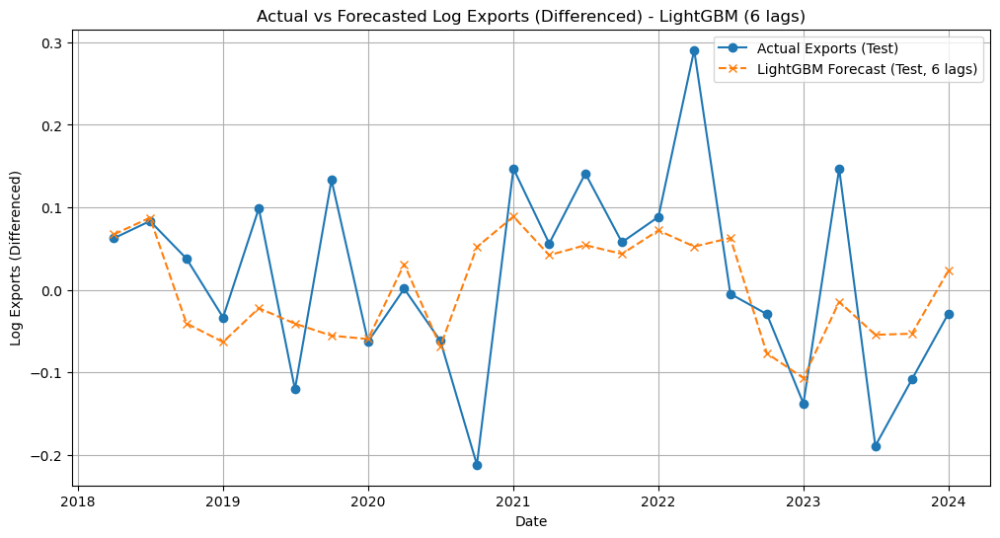

In [129]:
# ==========================================
# searching for the best lagges and parameter tuning (LightGBM)
# ==========================================

import numpy as np
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from lightgbm import LGBMRegressor

# ============================
# 1. Prepare Data
# ============================
# Copy your original dataset to avoid overwriting
df_exports_lgb = df.copy()

# Ensure Date is datetime and set as index
df_exports_lgb["Date_1"] = pd.to_datetime(df_exports_lgb["Date_1"])
df_exports_lgb = df_exports_lgb.set_index("Date_1")

# List of original explanatory variables
exog_vars = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]

# Apply differencing for stationarity
df_exports_lgb["Log_Exports"] = np.log(df_exports_lgb["Exports"])
df_exports_lgb["Log_Exports_Diff"] = df_exports_lgb["Log_Exports"].diff()
for var in exog_vars:
    df_exports_lgb[f"{var}_Diff"] = df_exports_lgb[var].diff()

# Drop missing after differencing
df_exports_lgb = df_exports_lgb.dropna()

# Train-Test Split (80% train, 20% test)
split_index = int(len(df_exports_lgb) * 0.8)
train_data, test_data = df_exports_lgb.iloc[:split_index], df_exports_lgb.iloc[split_index:]

# Extract y and X base (no lags yet)
y_train_base = train_data["Log_Exports_Diff"]
y_test_base = test_data["Log_Exports_Diff"]
X_train_base = train_data[[f"{var}_Diff" for var in exog_vars]].copy()
X_test_base = test_data[[f"{var}_Diff" for var in exog_vars]].copy()

# ============================
# 2. Parameter Grid (compact, time-series friendly)
# ============================
param_grid = {
    "n_estimators": [50, 100, 200],
    "learning_rate": [0.05, 0.1],
    "max_depth": [-1, 3, 5],
    "num_leaves": [15, 31, 63],
    "min_child_samples": [10, 20, 30],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
    "reg_alpha": [0.0, 0.1],
    "reg_lambda": [0.0, 0.1],
}

# ============================
# 3. Test different lag lengths
# ============================
lags_to_test = [1, 2, 3, 6, 12]
results = []

for lags in lags_to_test:
    # Add lag features
    X_train_lag = X_train_base.copy()
    X_test_lag = X_test_base.copy()

    y_full = pd.concat([y_train_base, y_test_base])
    for lag in range(1, lags + 1):
        lag_name = f"lag_Exports_{lag}"
        X_train_lag[lag_name] = y_full.shift(lag).loc[X_train_lag.index]
        X_test_lag[lag_name] = y_full.shift(lag).loc[X_test_lag.index]

    # Drop NA from train set after lag creation
    mask = X_train_lag.notna().all(axis=1)
    X_train_lag = X_train_lag.loc[mask]
    y_train = y_train_base.loc[mask]

    # Scale features (kept for parity with your XGBoost pipeline)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_lag)
    X_test_scaled = scaler.transform(X_test_lag)

    # Time series CV
    tscv = TimeSeriesSplit(n_splits=5)

    # Grid search for best params
    lgbm_model = LGBMRegressor(
        objective="regression",
        boosting_type="gbdt",
        random_state=42,
        n_jobs=-1
    )

    grid_search = GridSearchCV(
        estimator=lgbm_model,
        param_grid=param_grid,
        scoring="neg_mean_squared_error",
        cv=tscv,
        n_jobs=-1,
        verbose=0
    )
    grid_search.fit(X_train_scaled, y_train)
    best_params = grid_search.best_params_

    # Refit final model
    best_model = LGBMRegressor(
        objective="regression",
        boosting_type="gbdt",
        random_state=42,
        n_jobs=-1,
        **best_params
    )
    best_model.fit(X_train_scaled, y_train)

    # Predictions
    y_train_pred = best_model.predict(X_train_scaled)
    y_test_pred = best_model.predict(X_test_scaled)

    # Evaluation
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    rmse_test = np.sqrt(mean_squared_error(y_test_base, y_test_pred))
    mae_test = mean_absolute_error(y_test_base, y_test_pred)
    r2_test = r2_score(y_test_base, y_test_pred)

    results.append({
        "Lags": lags,
        "Best_Params": best_params,
        "Train_RMSE": rmse_train,
        "Train_MAE": mae_train,
        "Train_R2": r2_train,
        "Test_RMSE": rmse_test,
        "Test_MAE": mae_test,
        "Test_R2": r2_test
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print(results_df)

# ============================
# 4. Pick best lag based on Test_R2
# ============================
best_row = results_df.loc[results_df["Test_R2"].idxmax()]
best_lag = int(best_row["Lags"])
print(f"\nBest lag length: {best_lag} lags with Test R² = {best_row['Test_R2']:.4f}")

# ============================
# 5. Refit using best lag for final plot
# ============================
X_train_lag = X_train_base.copy()
X_test_lag = X_test_base.copy()
y_full = pd.concat([y_train_base, y_test_base])

for lag in range(1, best_lag + 1):
    X_train_lag[f"lag_Exports_{lag}"] = y_full.shift(lag).loc[X_train_lag.index]
    X_test_lag[f"lag_Exports_{lag}"] = y_full.shift(lag).loc[X_test_lag.index]

mask = X_train_lag.notna().all(axis=1)
X_train_lag = X_train_lag.loc[mask]
y_train = y_train_base.loc[mask]

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_lag)
X_test_scaled = scaler.transform(X_test_lag)

best_model = LGBMRegressor(
    objective="regression",
    boosting_type="gbdt",
    random_state=42,
    n_jobs=-1,
    **best_row["Best_Params"]
)
best_model.fit(X_train_scaled, y_train)

y_test_pred = best_model.predict(X_test_scaled)

# ============================
# 6. Plot with proper date axis
# ============================
plt.figure(figsize=(12, 6))
plt.plot(y_test_base.index, y_test_base, label="Actual Exports (Test)", marker="o")
plt.plot(y_test_base.index, y_test_pred, label=f"LightGBM Forecast (Test, {best_lag} lags)", linestyle="--", marker="x")
plt.xlabel("Date")
plt.ylabel("Log Exports (Differenced)")
plt.title(f"Actual vs Forecasted Log Exports (Differenced) - LightGBM ({best_lag} lags)")
plt.legend()
plt.grid(True)
plt.show()


# RNN


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Load the dataset
df = pd.read_excel('thesis data.xlsx')

# Combine 'FY' and 'Quarters' into a single 'Date' column
df['Date'] = df['FY'].astype(str) + 'Q' + df['Quarters'].astype(str)
df['Date'] = pd.to_datetime(df['Date'])

# Drop the now redundant 'FY' and 'Quarters' columns
df.drop(columns=['FY', 'Quarters'], inplace=True)

# Convert values from millions to billions
columns_to_convert = df.loc[:, : 'Current_Account_Balance'].columns
df[columns_to_convert] = df[columns_to_convert] / 1000

# Calculate GCC GDP and transform it to log scale
df['GCC_GDP'] = df[['KUWAIT_GDP', 'QATAR_GDP', 'SAUDI_ARABIA_GDP', 'UAE_GDP']].mean(axis=1)
df['LOG_GCC_GDP'] = np.log(df['GCC_GDP'])

# Rescale World and Egyptian GDP
df['Log_World_GDP'] = np.log(df['WORLD_GDP'])
df['Log_EGYPT_GDP_bn'] = np.log(df['EGYPT_GDP_bn'])
df['Log_EUO_AREA_GDP_bn'] = np.log(df['EUO_AREA_GDP_bn'])

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# Create the target variable (Log_Exports)
df['Log_Exports'] = np.log(df['Exports'])

Total number of combinations: 384
Starting grid search...
Testing combination 1/384: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'SimpleRNN', 'timesteps': 5, 'units': 20}
  Train RMSE: 0.0443, Test RMSE: 0.1665
  Train R²: 0.8409, Test R²: -0.6745
Testing combination 2/384: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'SimpleRNN', 'timesteps': 5, 'units': 40}
  Train RMSE: 0.0837, Test RMSE: 0.1210
  Train R²: 0.4316, Test R²: 0.1156
Testing combination 3/384: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'SimpleRNN', 'timesteps': 10, 'units': 20}
  Train RMSE: 0.0691, Test RMSE: 0.2450
  Train R²: 0.6235, Test R²: -2.0956
Testing combination 4/384: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'SimpleRNN', 'timesteps': 10, 'units': 40}
  Train RMSE: 0.0927, 

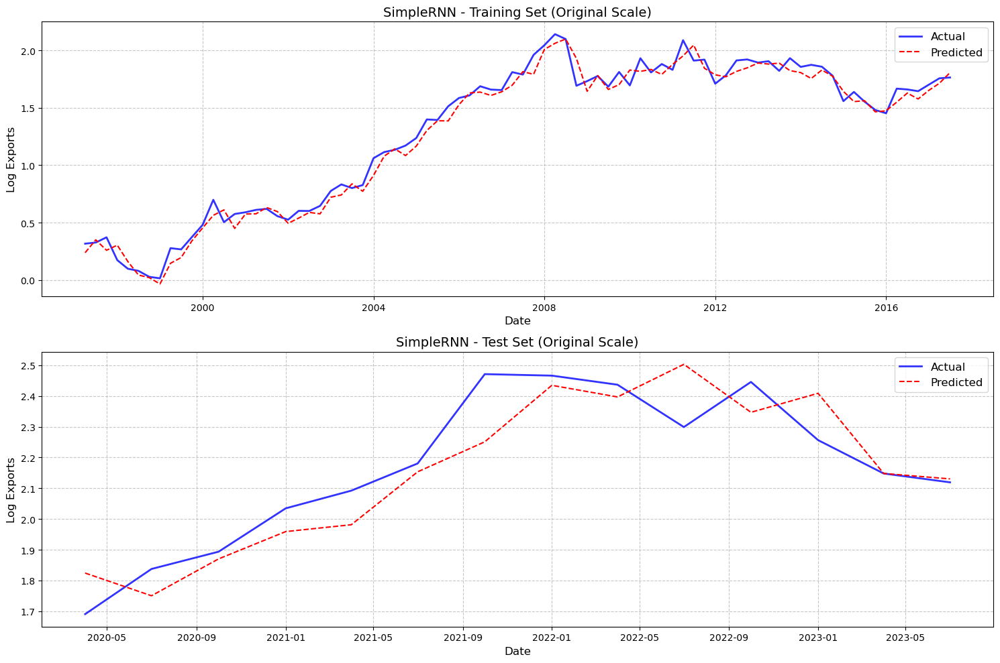

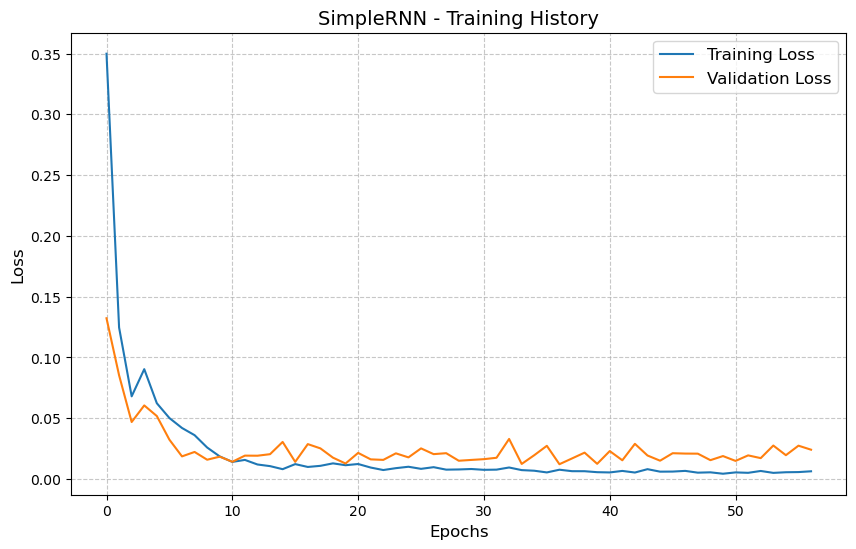


SimpleRNN Performance (Original Scale):
Train RMSE: 0.0798 | Test RMSE: 0.1103
Train R²: 0.9841 | Test R²: 0.7854

Training and evaluating best LSTM model
Parameters: {'batch_size': 16, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'rmsprop', 'rnn_type': 'LSTM', 'timesteps': 10, 'units': 40}

Training LSTM model...
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 6s 200ms/step - loss: 0.0613 - val_loss: 0.0213
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0207 - val_loss: 0.0200
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0139 - val_loss: 0.0234
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 0.0092 - val_loss: 0.0301
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.0178 - val_loss: 0.0402
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0166 - val_loss: 0.0145
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0096 - val_loss: 0.0274
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0123 - val_los

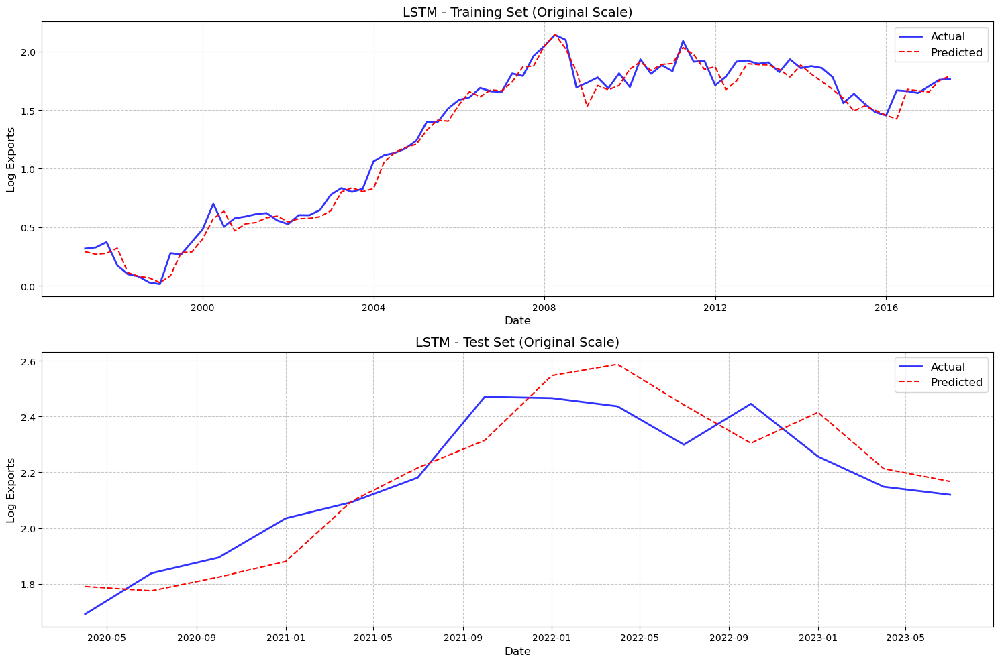

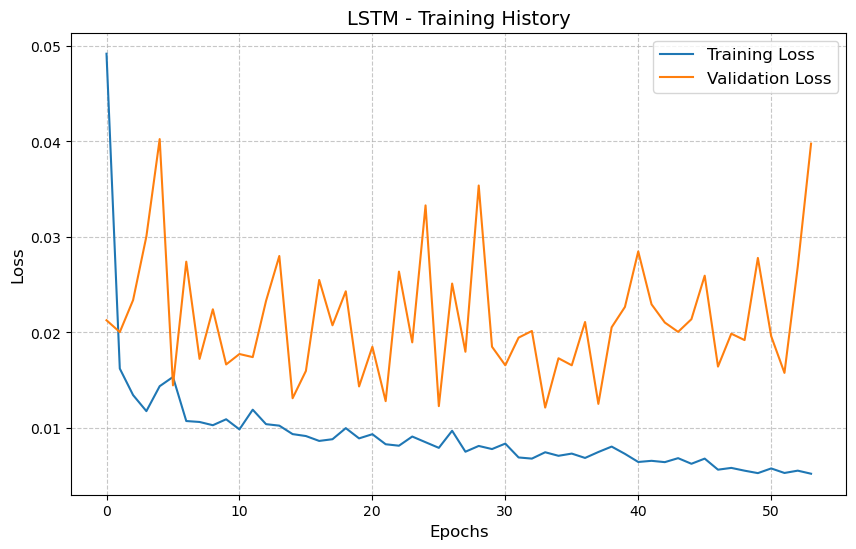


LSTM Performance (Original Scale):
Train RMSE: 0.0859 | Test RMSE: 0.1102
Train R²: 0.9816 | Test R²: 0.7861

Training and evaluating best GRU model
Parameters: {'batch_size': 16, 'dropout': 0.0, 'layers': 2, 'learning_rate': 0.01, 'optimizer': 'rmsprop', 'rnn_type': 'GRU', 'timesteps': 10, 'units': 20}

Training GRU model...
Epoch 1/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 413ms/step - loss: 0.0599 - val_loss: 0.0354
Epoch 2/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0132 - val_loss: 0.0238
Epoch 3/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0121 - val_loss: 0.0153
Epoch 4/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0174 - val_loss: 0.0343
Epoch 5/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 0.0101 - val_loss: 0.0207
Epoch 6/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0125 - val_loss: 0.0161
Epoch 7/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0104 - val_loss: 0.0107
Epoch 8/200
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0185 - val_loss: 0.01

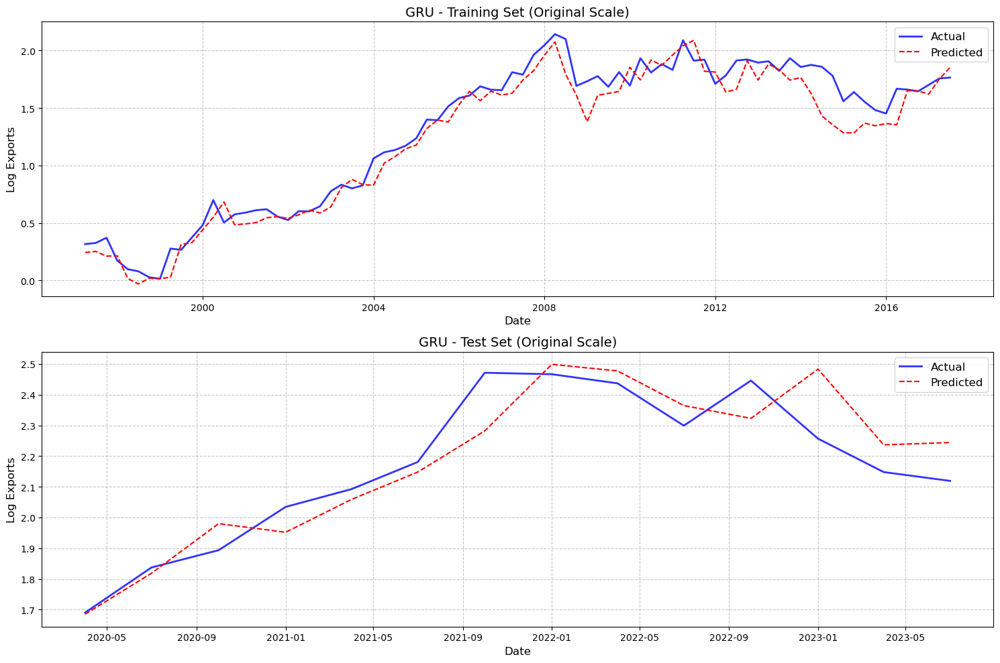

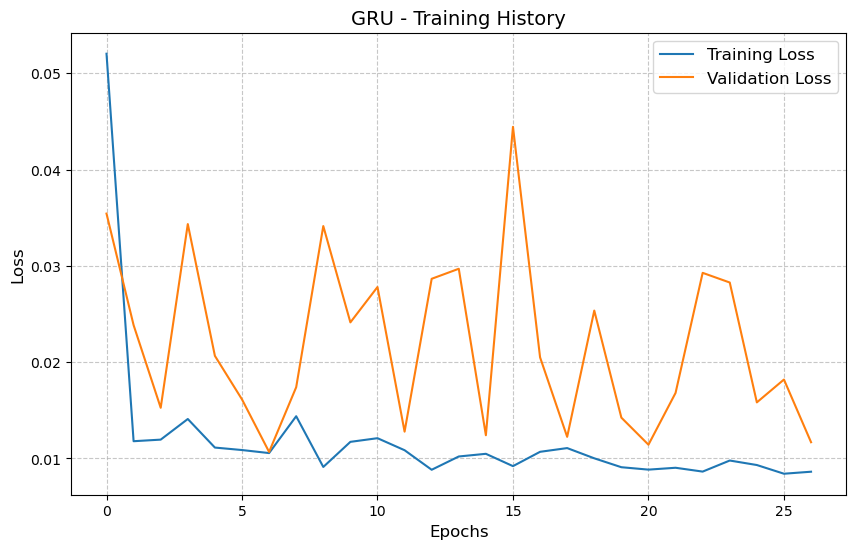


GRU Performance (Original Scale):
Train RMSE: 0.1484 | Test RMSE: 0.1033
Train R²: 0.9450 | Test R²: 0.8119

Model Comparison (Original Scale):
       Model  Train RMSE  Test RMSE  Train R²   Test R²
0  SimpleRNN    0.079789   0.110348  0.984096  0.785417
1       LSTM    0.085924   0.110171  0.981557  0.786106
2        GRU    0.148444   0.103315  0.944953  0.811897

Model comparison saved to 'model_comparison.csv'

Process completed successfully!


In [24]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout, LSTM, GRU
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import ParameterGrid
import time
import os
import json
import ast

# Load your data
# df = pd.read_csv('your_data.csv', index_col=0, parse_dates=True)
df["Log_Exports"]=np.log(df["Exports"])
df['Date'] = pd.to_datetime(df['Date'])  # convert column to datetime
df.set_index('Date', inplace=True)       # set as datetime index

# Define variables
exog_vars = ["Imports", "CRUDE_OIL_PRICE_DOLLAR", "Log_EUO_AREA_GDP_bn"]
target = "Log_Exports"

# Step 1: Prepare the data
original_target = df[target].copy()

for var in exog_vars:
    df[f'{var}_diff'] = df[var].diff()

df[target + "_diff"] = df[target].diff()

# Drop the NaN values after differencing
df_diff = df.dropna().copy()

# Update the exogenous variables to differenced versions
exog_vars_diff = [f'{var}_diff' for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Step 2: Split the data into training and testing sets
train_size = int(len(X) * 0.8)  # 80% for training
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

train_indices = X_train.index
test_indices = X_test.index

# Step 3: Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Define the grid search parameters
param_grid = {
    'rnn_type': ['SimpleRNN', 'LSTM', 'GRU'],
    'units': [20, 40],
    'layers': [1, 2],
    'dropout': [0.0, 0.2],
    'timesteps': [5, 10],
    'batch_size': [8, 16],
    'learning_rate': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop']
}

# Generate all combinations of parameters
all_params = list(ParameterGrid(param_grid))
print(f"Total number of combinations: {len(all_params)}")

# Checkpoint setup
checkpoint_file = 'grid_search_checkpoint.csv'
results = []

# Load existing results if checkpoint exists
if os.path.exists(checkpoint_file):
    try:
        checkpoint_df = pd.read_csv(checkpoint_file)
        results = checkpoint_df.to_dict('records')
        print(f"Loaded {len(results)} previous results from checkpoint")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")
        results = []
else:
    results = []

# Function to save checkpoint
def save_checkpoint(result):
    """Save results incrementally to checkpoint file"""
    df = pd.DataFrame([result])
    if not os.path.exists(checkpoint_file):
        df.to_csv(checkpoint_file, index=False)
    else:
        df.to_csv(checkpoint_file, mode='a', header=False, index=False)

# Step 5: Define function to build and evaluate models
def build_and_evaluate_model(params, X_train, y_train, X_test, y_test, train_indices, test_indices):
    timesteps = params['timesteps']
    
    # Reshape data according to timesteps
    X_train_rnn = []
    y_train_rnn = []
    train_indices_used = []
    
    for i in range(timesteps, len(X_train_scaled)):
        X_train_rnn.append(X_train_scaled[i-timesteps:i])
        y_train_rnn.append(y_train.iloc[i])
        train_indices_used.append(train_indices[i])
    
    X_train_rnn, y_train_rnn = np.array(X_train_rnn), np.array(y_train_rnn)
    train_indices_used = pd.Index(train_indices_used)
    
    X_test_rnn = []
    y_test_rnn = []
    test_indices_used = []
    
    for i in range(timesteps, len(X_test_scaled)):
        X_test_rnn.append(X_test_scaled[i-timesteps:i])
        y_test_rnn.append(y_test.iloc[i])
        test_indices_used.append(test_indices[i])
    
    X_test_rnn, y_test_rnn = np.array(X_test_rnn), np.array(y_test_rnn)
    test_indices_used = pd.Index(test_indices_used)
    
    # Build model according to parameters
    model = Sequential()
    
    # First recurrent layer
    if params['rnn_type'] == 'SimpleRNN':
        model.add(SimpleRNN(
            params['units'], 
            input_shape=(timesteps, X_train_rnn.shape[2]), 
            return_sequences=params['layers'] > 1
        ))
    elif params['rnn_type'] == 'LSTM':
        model.add(LSTM(
            params['units'], 
            input_shape=(timesteps, X_train_rnn.shape[2]), 
            return_sequences=params['layers'] > 1
        ))
    else:  # GRU
        model.add(GRU(
            params['units'], 
            input_shape=(timesteps, X_train_rnn.shape[2]), 
            return_sequences=params['layers'] > 1
        ))
    
    # Add dropout if specified
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    
    # Add second layer if specified
    if params['layers'] > 1:
        if params['rnn_type'] == 'SimpleRNN':
            model.add(SimpleRNN(params['units'] // 2))
        elif params['rnn_type'] == 'LSTM':
            model.add(LSTM(params['units'] // 2))
        else:  # GRU
            model.add(GRU(params['units'] // 2))
        
        # Add dropout for second layer if specified
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    
    # Output layer
    model.add(Dense(1))
    
    # Compile model
    if params['optimizer'] == 'adam':
        optimizer = Adam(learning_rate=params['learning_rate'])
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=params['learning_rate'])
    
    model.compile(optimizer=optimizer, loss='mse')
    
    # Early stopping to prevent overfitting
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=20,
        restore_best_weights=True
    )
    
    # Train model
    start_time = time.time()
    history = model.fit(
        X_train_rnn, y_train_rnn,
        epochs=200,
        batch_size=params['batch_size'],
        validation_data=(X_test_rnn, y_test_rnn),
        callbacks=[early_stopping],
        verbose=0
    )
    training_time = time.time() - start_time
    
    # Predict
    y_train_pred_diff = model.predict(X_train_rnn, verbose=0).flatten()
    y_test_pred_diff = model.predict(X_test_rnn, verbose=0).flatten()
    
    # Evaluate on differenced data
    train_rmse_diff = np.sqrt(mean_squared_error(y_train_rnn, y_train_pred_diff))
    train_mae_diff = mean_absolute_error(y_train_rnn, y_train_pred_diff)
    train_r2_diff = r2_score(y_train_rnn, y_train_pred_diff)
    
    test_rmse_diff = np.sqrt(mean_squared_error(y_test_rnn, y_test_pred_diff))
    test_mae_diff = mean_absolute_error(y_test_rnn, y_test_pred_diff)
    test_r2_diff = r2_score(y_test_rnn, y_test_pred_diff)
    
    # Calculate average validation loss from the last 5 epochs
    final_val_loss = np.mean(history.history['val_loss'][-5:]) if len(history.history['val_loss']) >= 5 else history.history['val_loss'][-1]
    
    # Return all relevant metrics
    return {
        'train_rmse_diff': train_rmse_diff,
        'train_mae_diff': train_mae_diff,
        'train_r2_diff': train_r2_diff,
        'test_rmse_diff': test_rmse_diff,
        'test_mae_diff': test_mae_diff,
        'test_r2_diff': test_r2_diff,
        'val_loss': final_val_loss,
        'epochs_used': len(history.history['loss']),
        'training_time': training_time
    }

# Step 6: Run the grid search with checkpointing
print("Starting grid search...")
completed_count = len(results)
total_combinations = len(all_params)

for i, params in enumerate(all_params):
    # Skip already completed combinations
    if any(str(params) == str(r['params']) for r in results):
        print(f"Skipping combination {i+1}/{total_combinations} (already completed)")
        continue
        
    print(f"Testing combination {i+1}/{total_combinations}: {params}")
    try:
        metrics = build_and_evaluate_model(
            params, X_train, y_train, X_test, y_test, train_indices, test_indices
        )
        
        # Create full result record
        result = {'params': params, **metrics}
        results.append(result)
        
        # Save to checkpoint
        save_checkpoint(result)
        
        print(f"  Train RMSE: {result['train_rmse_diff']:.4f}, Test RMSE: {result['test_rmse_diff']:.4f}")
        print(f"  Train R²: {result['train_r2_diff']:.4f}, Test R²: {result['test_r2_diff']:.4f}")
    except Exception as e:
        print(f"Error with parameters {params}: {str(e)}")
        # Save error information to checkpoint
        error_result = {
            'params': params,
            'error': str(e),
            'train_rmse_diff': np.nan,
            'test_rmse_diff': np.nan,
            'train_r2_diff': np.nan,
            'test_r2_diff': np.nan
        }
        results.append(error_result)
        save_checkpoint(error_result)

# Convert results to DataFrame for analysis
results_df = pd.DataFrame(results)

# Add a combined score column
results_df['combined_score'] = results_df['val_loss'] - results_df['test_r2_diff']

# Save all results to CSV
results_df.to_csv('grid_search_results.csv', index=False)
print("Grid search results saved to 'grid_search_results.csv'")

# Step 7: Identify best model for each type
best_models_by_type = {}

# Check if we have results
if len(results_df) == 0:
    print("No results from grid search. Cannot identify best models.")
    exit()

# Ensure we have the required columns
if 'test_r2_diff' not in results_df.columns:
    print("Using validation loss for model selection")
    results_df['test_r2_diff'] = -results_df['val_loss']  # Convert loss to pseudo-R²

# Identify best model for each type
for rnn_type in ['SimpleRNN', 'LSTM', 'GRU']:
    # Filter results for current RNN type
    type_mask = results_df['params'].apply(lambda x: x['rnn_type'] == rnn_type)
    type_results = results_df[type_mask]
    
    # Filter out failed runs
    type_results = type_results.dropna(subset=['test_r2_diff'])
    
    if len(type_results) > 0:
        # Select best model based on test R² (differenced data)
        best_idx = type_results['test_r2_diff'].idxmax()
        best_model = type_results.loc[best_idx]
        best_models_by_type[rnn_type] = best_model
        print(f"\nBest {rnn_type} model found:")
        print(f"Parameters: {best_model['params']}")
        print(f"Test R² (diff): {best_model['test_r2_diff']:.4f}")
    else:
        print(f"\nNo valid results found for {rnn_type} models")

# Step 8: Function to train and plot models
def inverse_differencing(original_series, diff_predictions, indices):
    """Convert differenced predictions back to original scale"""
    reconstructed = []
    for i, idx in enumerate(indices):
        # Find the position of the current index in the original DataFrame
        pos = df.index.get_loc(idx)
        if pos > 0:
            # Get the previous index and its value
            prev_idx = df.index[pos-1]
            prev_value = original_series.loc[prev_idx]
            # Reconstruct current value
            reconstructed.append(prev_value + diff_predictions[i])
        else:
            # If it's the first element, use the original value
            reconstructed.append(original_series.loc[idx])
    return pd.Series(reconstructed, index=indices)

def train_and_plot_model(params, model_name):
    """Train a single model and plot results"""
    timesteps = params['timesteps']
    
    # Reshape data
    X_train_rnn, y_train_rnn, train_indices_used = [], [], []
    for i in range(timesteps, len(X_train_scaled)):
        X_train_rnn.append(X_train_scaled[i-timesteps:i])
        y_train_rnn.append(y_train.iloc[i])
        train_indices_used.append(train_indices[i])
    X_train_rnn, y_train_rnn = np.array(X_train_rnn), np.array(y_train_rnn)
    train_indices_used = pd.Index(train_indices_used)
    
    X_test_rnn, y_test_rnn, test_indices_used = [], [], []
    for i in range(timesteps, len(X_test_scaled)):
        X_test_rnn.append(X_test_scaled[i-timesteps:i])
        y_test_rnn.append(y_test.iloc[i])
        test_indices_used.append(test_indices[i])
    X_test_rnn, y_test_rnn = np.array(X_test_rnn), np.array(y_test_rnn)
    test_indices_used = pd.Index(test_indices_used)
    
    # Build model
    model = Sequential()
    if params['rnn_type'] == 'SimpleRNN':
        layer_func = SimpleRNN
    elif params['rnn_type'] == 'LSTM':
        layer_func = LSTM
    else:  # GRU
        layer_func = GRU

    model.add(layer_func(
        params['units'],
        input_shape=(timesteps, X_train_rnn.shape[2]),
        return_sequences=params['layers'] > 1
    ))
    
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    
    if params['layers'] > 1:
        model.add(layer_func(params['units'] // 2))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    
    model.add(Dense(1))
    
    # Compile and train
    if params['optimizer'] == 'adam':
        optimizer = Adam(learning_rate=params['learning_rate'])
    else:  # rmsprop
        optimizer = RMSprop(learning_rate=params['learning_rate'])
    
    model.compile(optimizer=optimizer, loss='mse')
    
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=20,
        restore_best_weights=True
    )
    
    print(f"\nTraining {model_name} model...")
    history = model.fit(
        X_train_rnn, y_train_rnn,
        epochs=200,
        batch_size=params['batch_size'],
        validation_data=(X_test_rnn, y_test_rnn),
        callbacks=[early_stopping],
        verbose=1
    )
    
    # Generate predictions
    y_train_pred_diff = model.predict(X_train_rnn).flatten()
    y_test_pred_diff = model.predict(X_test_rnn).flatten()
    
    # Reconstruct original scale predictions
    y_train_pred_orig = inverse_differencing(original_target, y_train_pred_diff, train_indices_used)
    y_test_pred_orig = inverse_differencing(original_target, y_test_pred_diff, test_indices_used)
    
    # Get true values
    y_train_true = original_target.loc[train_indices_used]
    y_test_true = original_target.loc[test_indices_used]
    
    # Calculate metrics on original scale
    train_rmse_orig = np.sqrt(mean_squared_error(y_train_true, y_train_pred_orig))
    test_rmse_orig = np.sqrt(mean_squared_error(y_test_true, y_test_pred_orig))
    train_r2_orig = r2_score(y_train_true, y_train_pred_orig)
    test_r2_orig = r2_score(y_test_true, y_test_pred_orig)
    
    # Plotting
    plt.figure(figsize=(15, 10))
    
    # Training data plot
    plt.subplot(2, 1, 1)
    plt.plot(y_train_true.index, y_train_true, 'b-', label='Actual', linewidth=2, alpha=0.8)
    plt.plot(y_train_true.index, y_train_pred_orig, 'r--', label='Predicted', linewidth=1.5)
    plt.title(f'{model_name} - Training Set (Original Scale)', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Log Exports', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Test data plot
    plt.subplot(2, 1, 2)
    plt.plot(y_test_true.index, y_test_true, 'b-', label='Actual', linewidth=2, alpha=0.8)
    plt.plot(y_test_true.index, y_test_pred_orig, 'r--', label='Predicted', linewidth=1.5)
    plt.title(f'{model_name} - Test Set (Original Scale)', fontsize=14)
    plt.xlabel('Date', fontsize=12)
    plt.ylabel('Log Exports', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.savefig(f'{model_name}_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot loss history
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} - Training History', fontsize=14)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Loss', fontsize=12)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.savefig(f'{model_name}_training_history.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return {
        'train_rmse_orig': train_rmse_orig,
        'test_rmse_orig': test_rmse_orig,
        'train_r2_orig': train_r2_orig,
        'test_r2_orig': test_r2_orig,
        'params': params
    }

# Step 9: Train and plot each best model type
if best_models_by_type:
    metrics_results = {}
    for rnn_type, model_info in best_models_by_type.items():
        print(f"\n{'='*50}")
        print(f"Training and evaluating best {rnn_type} model")
        print(f"Parameters: {model_info['params']}")
        
        metrics = train_and_plot_model(model_info['params'], rnn_type)
        metrics_results[rnn_type] = metrics
        
        # Print metrics
        print(f"\n{rnn_type} Performance (Original Scale):")
        print(f"Train RMSE: {metrics['train_rmse_orig']:.4f} | Test RMSE: {metrics['test_rmse_orig']:.4f}")
        print(f"Train R²: {metrics['train_r2_orig']:.4f} | Test R²: {metrics['test_r2_orig']:.4f}")
    
    # Create comparison table
    comparison_data = []
    for model_type, metrics in metrics_results.items():
        row = {
            'Model': model_type,
            'Train RMSE': metrics['train_rmse_orig'],
            'Test RMSE': metrics['test_rmse_orig'],
            'Train R²': metrics['train_r2_orig'],
            'Test R²': metrics['test_r2_orig'],
            'Parameters': str(metrics['params'])
        }
        comparison_data.append(row)
    
    comparison_df = pd.DataFrame(comparison_data)
    print("\nModel Comparison (Original Scale):")
    print(comparison_df[['Model', 'Train RMSE', 'Test RMSE', 'Train R²', 'Test R²']])
    
    # Save comparison results
    comparison_df.to_csv('model_comparison.csv', index=False)
    print("\nModel comparison saved to 'model_comparison.csv'")
    
else:
    print("No best models found to evaluate.")

print("\nProcess completed successfully!")

# Imports

## OLS

In [55]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Define features and target
features = ["EGYPT_INFLATION_PCHANGE", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EGYPT_GDP_bn","NON_FUEL_COMMODITY_PRICE_INDEX"]
target = "Imports"

# Extract full dataset
y = df[target]
X = df[features]

# Fit Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predictions on the same dataset
y_pred = model.predict(X)

# Performance metrics
print(f"RMSE: {np.sqrt(mean_squared_error(y, y_pred))}")
print(f"R2: {r2_score(y, y_pred)}")

# OLS model with statsmodels
X_sm = sm.add_constant(X)  # Add intercept manually
ols_model = sm.OLS(y, X_sm).fit()

# Display regression summary
print(ols_model.summary())


RMSE: 1.1622617542895957
R2: 0.9582137352432736
                            OLS Regression Results                            
Dep. Variable:                Imports   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     642.1
Date:                Thu, 14 Aug 2025   Prob (F-statistic):           3.28e-76
Time:                        20:06:17   Log-Likelihood:                -183.61
No. Observations:                 117   AIC:                             377.2
Df Residuals:                     112   BIC:                             391.0
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

In [59]:

import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define features (same as used in OLS)
features = ["EGYPT_INFLATION_PCHANGE", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EGYPT_GDP_bn","NON_FUEL_COMMODITY_PRICE_INDEX"]

# Extract features
X = df[features]

# Add constant for intercept (required for VIF)
X_const = sm.add_constant(X)

# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i)
                   for i in range(X_const.shape[1])]

print(vif_data)


                         Variable         VIF
0                           const  182.300096
1         EGYPT_INFLATION_PCHANGE    1.683604
2          CRUDE_OIL_PRICE_DOLLAR    5.842340
3                Log_EGYPT_GDP_bn    6.413548
4  NON_FUEL_COMMODITY_PRICE_INDEX   16.372224


In [67]:

import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define features (same as used in OLS)
features = ["EGYPT_INFLATION_PCHANGE", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EGYPT_GDP_bn"]

# Extract features
X = df[features]

# Add constant for intercept (required for VIF)
X_const = sm.add_constant(X)

# Compute VIF for each feature
vif_data = pd.DataFrame()
vif_data["Variable"] = X_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i)
                   for i in range(X_const.shape[1])]

print(vif_data)


                  Variable         VIF
0                    const  105.054800
1  EGYPT_INFLATION_PCHANGE    1.447268
2   CRUDE_OIL_PRICE_DOLLAR    2.171901
3         Log_EGYPT_GDP_bn    2.448094


In [69]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Define features and target
features = ["EGYPT_INFLATION_PCHANGE", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EGYPT_GDP_bn"]
target = "Imports"

# Extract full dataset
y = df[target]
X = df[features]

# Fit Linear Regression model
model = LinearRegression()
model.fit(X, y)

# Predictions on the same dataset
y_pred = model.predict(X)

# Performance metrics
print(f"RMSE: {np.sqrt(mean_squared_error(y, y_pred))}")
print(f"R2: {r2_score(y, y_pred)}")

# OLS model with statsmodels
X_sm = sm.add_constant(X)  # Add intercept manually
ols_model = sm.OLS(y, X_sm).fit()

# Display regression summary
print(ols_model.summary())


RMSE: 1.1745043336093384
R2: 0.9573287952444702
                            OLS Regression Results                            
Dep. Variable:                Imports   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.956
Method:                 Least Squares   F-statistic:                     845.1
Date:                Thu, 14 Aug 2025   Prob (F-statistic):           3.35e-77
Time:                        20:12:03   Log-Likelihood:                -184.83
No. Observations:                 117   AIC:                             377.7
Df Residuals:                     113   BIC:                             388.7
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------

## Sarimax

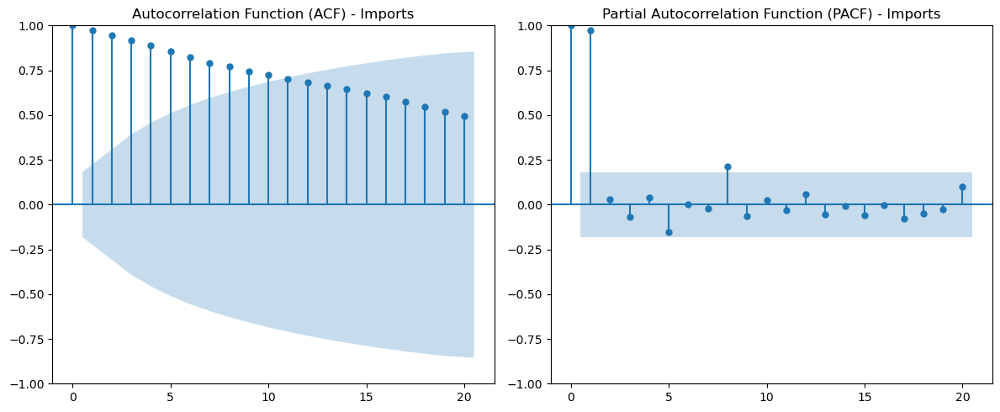

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Ensure 'Date' column is datetime and set as index
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Plot ACF and PACF for Imports (raw, untransformed)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(df['Imports'].dropna(), lags=20, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF) - Imports')

plot_pacf(df['Imports'].dropna(), lags=20, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF) - Imports')

plt.tight_layout()
plt.show()


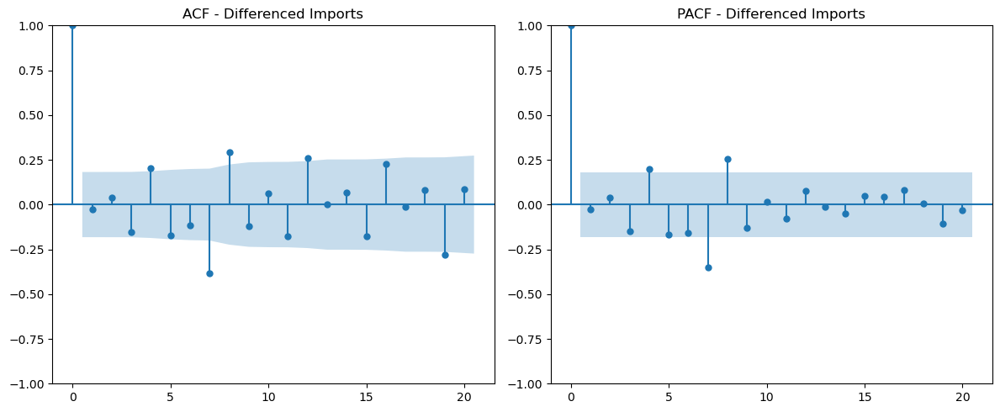

In [520]:
# Compute first difference and drop NaNs
diff_imports = df['Imports'].diff().dropna()

# Plot ACF and PACF for differenced Imports
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(diff_imports, lags=20, ax=ax[0], title='ACF - Differenced Imports')
plot_pacf(diff_imports, lags=20, ax=ax[1], title='PACF - Differenced Imports')

plt.tight_layout()
plt.show()

In [76]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Define new features and target
features = ["EGYPT_INFLATION_PCHANGE", "CRUDE_OIL_PRICE_DOLLAR", "Log_EGYPT_GDP_bn"]
target = "Imports"

# Split data into training and testing sets
train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]

# Extract training and testing data
y_train, X_train = train[target], train[features]
y_test, X_test = test[target], test[features]

# Define seasonal and non-seasonal SARIMAX parameters
seasonal_order = (1, 1, 1, 4)  # Quarterly seasonality
orders_to_test = [(1, 1, 0), (1, 1, 1), (2, 1, 1), (2, 1, 2)]

# Store model performance
model_performance = {}

# Loop over each order configuration
for order in orders_to_test:
    try:
        model = SARIMAX(y_train, exog=X_train, order=order, seasonal_order=seasonal_order)
        model_fit = model.fit(disp=False)
        
        # In-sample predictions
        y_train_pred = model_fit.fittedvalues
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        train_r2 = r2_score(y_train, y_train_pred)

        # Out-of-sample forecast
        y_test_pred = model_fit.forecast(steps=len(y_test), exog=X_test)
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        test_r2 = r2_score(y_test, y_test_pred)

        # Count significant parameters
        p_values = model_fit.pvalues
        significant_params = (p_values < 0.05).sum()

        # Save performance
        model_performance[order] = {
            "AIC": model_fit.aic,
            "Train RMSE": train_rmse,
            "Train R2": train_r2,
            "Test RMSE": test_rmse,
            "Test R2": test_r2,
            "Significant Parameters": significant_params,
            "Total Parameters": len(p_values),
            "Model Fit": model_fit
        }

        # Print result summary
        print(f"Model SARIMAX{order} x {seasonal_order}")
        print(f"AIC: {model_fit.aic}")
        print(f"Train RMSE: {train_rmse:.4f}, Train R2: {train_r2:.4f}")
        print(f"Test RMSE: {test_rmse:.4f}, Test R2: {test_r2:.4f}")
        print(f"Significant Parameters: {significant_params}/{len(p_values)}\n")

    except Exception as e:
        print(f"Model SARIMAX{order} x {seasonal_order} failed: {e}")

# Identify best model
best_order = min(model_performance, key=lambda x: model_performance[x]["AIC"])
best_model = model_performance[best_order]
best_model_fit = best_model["Model Fit"]

# Print best model info
print("\nBest SARIMAX Model:")
print(f"Order: {best_order} x {seasonal_order}")
print(f"AIC: {best_model['AIC']:.2f}")
print(f"Train RMSE: {best_model['Train RMSE']:.4f}, Train R2: {best_model['Train R2']:.4f}")
print(f"Test RMSE: {best_model['Test RMSE']:.4f}, Test R2: {best_model['Test R2']:.4f}")
print(f"Significant Parameters: {best_model['Significant Parameters']}/{best_model['Total Parameters']}")

# Full model summary
print("\nBest Model Summary:\n")
print(best_model_fit.summary())


Model SARIMAX(1, 1, 0) x (1, 1, 1, 4)
AIC: 215.93996667404434
Train RMSE: 2.1553, Train R2: 0.8037
Test RMSE: 1.7729, Test R2: 0.4186
Significant Parameters: 5/7

Model SARIMAX(1, 1, 1) x (1, 1, 1, 4)
AIC: 217.9605158392404
Train RMSE: 2.1449, Train R2: 0.8056
Test RMSE: 1.7557, Test R2: 0.4298
Significant Parameters: 4/8

Model SARIMAX(2, 1, 1) x (1, 1, 1, 4)
AIC: 220.06105608836197
Train RMSE: 2.4098, Train R2: 0.7546
Test RMSE: 1.8753, Test R2: 0.3495
Significant Parameters: 5/9

Model SARIMAX(2, 1, 2) x (1, 1, 1, 4)
AIC: 225.28013103463755
Train RMSE: 1.5663, Train R2: 0.8963
Test RMSE: 1.7315, Test R2: 0.4454
Significant Parameters: 7/10


Best SARIMAX Model:
Order: (1, 1, 0) x (1, 1, 1, 4)
AIC: 215.94
Train RMSE: 2.1553, Train R2: 0.8037
Test RMSE: 1.7729, Test R2: 0.4186
Significant Parameters: 5/7

Best Model Summary:

                                      SARIMAX Results                                      
Dep. Variable:                             Imports   No. Observations

### Transforming imports

In [103]:
from scipy.stats import boxcox
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd

# === 1. Apply Box-Cox Transformation ===

df = df.copy()  # to avoid modifying original
df['BoxCox_Imports'], boxcox_lambda = boxcox(df['Imports'])
print(f"Box-Cox optimal λ: {boxcox_lambda:.4f}")

# === 2. Set target and feature set ===
target = "BoxCox_Imports"
features = ["EGYPT_INFLATION_PCHANGE", "CRUDE_OIL_PRICE_DOLLAR", 
            "Log_EGYPT_GDP_bn", "NON_FUEL_COMMODITY_PRICE_INDEX"]

# === 3. Split into training and testing ===
train_size = int(len(df) * 0.8)
train, test = df.iloc[:train_size], df.iloc[train_size:]

y_train, X_train = train[target], train[features]
y_test, X_test = test[target], test[features]

# === 4. SARIMAX Configuration ===
seasonal_order = (0, 0, 0, 0)
orders_to_test = [(1, 1, 0), (1, 1, 1), (2,1,1),(2,1,0)]

# === 5. Run models ===
model_performance = {}

for order in orders_to_test:
    try:
        model = SARIMAX(y_train, exog=X_train, order=order, seasonal_order=seasonal_order)
        model_fit = model.fit(disp=False)

        # In-sample predictions
        y_train_pred = model_fit.fittedvalues
        train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
        train_r2 = r2_score(y_train, y_train_pred)

        # Forecast on test set
        y_test_pred = model_fit.forecast(steps=len(y_test), exog=X_test)
        test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
        test_r2 = r2_score(y_test, y_test_pred)

        # Count significant parameters
        p_values = model_fit.pvalues
        significant_params = (p_values < 0.05).sum()

        model_performance[order] = {
            "AIC": model_fit.aic,
            "Train RMSE": train_rmse,
            "Train R2": train_r2,
            "Test RMSE": test_rmse,
            "Test R2": test_r2,
            "Significant Parameters": significant_params,
            "Total Parameters": len(p_values),
            "Model Fit": model_fit
        }

        print(f"Model SARIMAX{order} x {seasonal_order}")
        print(f"AIC: {model_fit.aic:.2f}")
        print(f"Train RMSE: {train_rmse:.4f}, Train R2: {train_r2:.4f}")
        print(f"Test RMSE: {test_rmse:.4f}, Test R2: {test_r2:.4f}")
        print(f"Significant Parameters: {significant_params}/{len(p_values)}\n")

    except Exception as e:
        print(f"Model SARIMAX{order} failed: {e}")

# === 6. Select best model ===
best_order = min(model_performance, key=lambda x: model_performance[x]["AIC"])
best_model = model_performance[best_order]
best_model_fit = best_model["Model Fit"]

print("\nBest SARIMAX Model (Box-Cox):")
print(f"Order: {best_order} x {seasonal_order}")
print(f"AIC: {best_model['AIC']:.2f}")
print(f"Train RMSE: {best_model['Train RMSE']:.4f}, Train R2: {best_model['Train R2']:.4f}")
print(f"Test RMSE: {best_model['Test RMSE']:.4f}, Test R2: {best_model['Test R2']:.4f}")
print(f"Significant Parameters: {best_model['Significant Parameters']}/{best_model['Total Parameters']}")
print("\nModel Summary:\n")
print(best_model_fit.summary())


Box-Cox optimal λ: 0.5289
Model SARIMAX(1, 1, 0) x (0, 0, 0, 0)
AIC: 24.56
Train RMSE: 0.6064, Train R2: 0.8848
Test RMSE: 0.3667, Test R2: 0.6104
Significant Parameters: 3/6

Model SARIMAX(1, 1, 1) x (0, 0, 0, 0)
AIC: 17.47
Train RMSE: 0.4903, Train R2: 0.9247
Test RMSE: 0.3636, Test R2: 0.6169
Significant Parameters: 3/7

Model SARIMAX(2, 1, 1) x (0, 0, 0, 0)
AIC: 26.24
Train RMSE: 0.8320, Train R2: 0.7831
Test RMSE: 0.4112, Test R2: 0.5101
Significant Parameters: 5/8

Model SARIMAX(2, 1, 0) x (0, 0, 0, 0)
AIC: 26.56
Train RMSE: 0.6060, Train R2: 0.8850
Test RMSE: 0.3667, Test R2: 0.6104
Significant Parameters: 3/7


Best SARIMAX Model (Box-Cox):
Order: (1, 1, 1) x (0, 0, 0, 0)
AIC: 17.47
Train RMSE: 0.4903, Train R2: 0.9247
Test RMSE: 0.3636, Test R2: 0.6169
Significant Parameters: 3/7

Model Summary:

                               SARIMAX Results                                
Dep. Variable:         BoxCox_Imports   No. Observations:                   93
Model:               SARI

### First trial to select best features model is good but hetero and r2 around 60

In [201]:
from scipy.stats import boxcox
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import itertools

# =========================
# 0. Configuration
# =========================
R2_THRESHOLD = 0.50
seasonal_order = (0, 0, 0, 0)
orders_to_test = [(1, 1, 0), (1, 1, 1), (2, 1, 1), (2, 1, 0)]

# Candidate exogenous features to search over (edit this list if needed)
CANDIDATE_FEATURES = [
    "EGYPT_INFLATION_PCHANGE",
    "CRUDE_OIL_PRICE_DOLLAR",
    "Log_EGYPT_GDP_bn",
    "NON_FUEL_COMMODITY_PRICE_INDEX",
]

# =========================
# 1. Box-Cox transform
# =========================
df1 = df.copy()
df1['BoxCox_Imports'], boxcox_lambda = boxcox(df1['Imports'])
print(f"Box-Cox optimal λ: {boxcox_lambda:.4f}")

# =========================
# 2. Target
# =========================
target = "BoxCox_Imports"

# =========================
# 3. Train/test split
# =========================
train_size = int(len(df1) * 0.8)
train, test = df1.iloc[:train_size], df1.iloc[train_size:]

y_train = train[target]
y_test  = test[target]

# =========================
# 4. Helper: evaluate & store
# =========================
model_performance = {}

def evaluate_and_store(family, order, model_fit, feat_tuple, has_exog):
    # In-sample
    y_train_pred = model_fit.fittedvalues
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    train_r2   = r2_score(y_train, y_train_pred)

    # Out-of-sample
    if has_exog:
        X_test = test[list(feat_tuple)] if feat_tuple else None
        y_test_pred = model_fit.forecast(steps=len(y_test), exog=X_test)
    else:
        y_test_pred = model_fit.forecast(steps=len(y_test))

    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    test_r2   = r2_score(y_test, y_test_pred)

    p_values = model_fit.pvalues
    significant_params = int((p_values < 0.05).sum())

    key = (family, order, seasonal_order, feat_tuple)
    model_performance[key] = {
        "AIC": model_fit.aic,
        "Train RMSE": train_rmse,
        "Train R2": train_r2,
        "Test RMSE": test_rmse,
        "Test R2": test_r2,
        "Significant Parameters": significant_params,
        "Total Parameters": len(p_values),
        "Model Fit": model_fit,
        "Features": feat_tuple,
    }

    feat_str = "None" if not feat_tuple else ", ".join(feat_tuple)
    print(f"{family}{order} x {seasonal_order} | Feats=[{feat_str}] | "
          f"AIC={model_fit.aic:.2f} | "
          f"Train RMSE={train_rmse:.4f}, R2={train_r2:.4f} | "
          f"Test RMSE={test_rmse:.4f}, R2={test_r2:.4f} | "
          f"Signif={significant_params}/{len(p_values)}")

# =========================
# 5A. SARIMAX over ALL feature subsets
# =========================
print("\n=== SARIMAX with exogenous features: feature subset search ===")
all_subsets = []
for r in range(1, len(CANDIDATE_FEATURES) + 1):
    all_subsets.extend(itertools.combinations(CANDIDATE_FEATURES, r))

for feat_tuple in all_subsets:
    X_train = train[list(feat_tuple)].copy()
    X_test  = test[list(feat_tuple)].copy()
    for order in orders_to_test:
        try:
            m = SARIMAX(
                y_train, exog=X_train, order=order, seasonal_order=seasonal_order,
                enforce_stationarity=False, enforce_invertibility=False
            )
            fit = m.fit(disp=False)
            evaluate_and_store("SARIMAX", order, fit, feat_tuple, has_exog=True)
        except Exception as e:
            print(f"SARIMAX{order} with feats {feat_tuple} failed: {e}")

# =========================
# 5B. ARIMA (no exogenous) for comparison
# =========================
print("\n=== ARIMA without exogenous features ===")
for order in orders_to_test:
    try:
        m = SARIMAX(
            y_train, order=order, seasonal_order=seasonal_order,
            enforce_stationarity=False, enforce_invertibility=False
        )
        fit = m.fit(disp=False)
        evaluate_and_store("ARIMA", order, fit, tuple(), has_exog=False)
    except Exception as e:
        print(f"ARIMA{order} failed: {e}")

# =========================
# 6. Selection with R² constraints
# =========================
if not model_performance:
    raise RuntimeError("No models were successfully estimated.")

# Best OVERALL by AIC (for diagnostics)
best_key_overall = min(model_performance, key=lambda k: model_performance[k]["AIC"])
best_overall = model_performance[best_key_overall]

# Filter by R² thresholds
eligible_keys = [
    k for k, v in model_performance.items()
    if (v["Train R2"] >= R2_THRESHOLD) and (v["Test R2"] >= R2_THRESHOLD)
]

print("\n=== Models meeting R² thresholds (Train ≥ 0.50 and Test ≥ 0.50) ===")
if eligible_keys:
    for k in sorted(eligible_keys, key=lambda kk: model_performance[kk]["AIC"]):
        v = model_performance[k]
        feat_str = "None" if not v["Features"] else ", ".join(v["Features"])
        print(f"{k[0]}{k[1]} x {k[2]} | Feats=[{feat_str}] | "
              f"AIC={v['AIC']:.2f} | Train R²={v['Train R2']:.3f} | Test R²={v['Test R2']:.3f}")
else:
    print("None")

if eligible_keys:
    # Choose best-by-AIC among eligible only
    best_key_constrained = min(eligible_keys, key=lambda k: model_performance[k]["AIC"])
    best_constrained = model_performance[best_key_constrained]
    best_model_fit = best_constrained["Model Fit"]

    feat_str = "None" if not best_constrained["Features"] else ", ".join(best_constrained["Features"])
    print("\n=== Best Model (meets R² constraints) ===")
    print(f"Family: {best_key_constrained[0]}")
    print(f"Order:  {best_key_constrained[1]} x {best_key_constrained[2]}")
    print(f"Feats:  [{feat_str}]")
    print(f"AIC:    {best_constrained['AIC']:.2f}")
    print(f"Train:  RMSE={best_constrained['Train RMSE']:.4f}, R2={best_constrained['Train R2']:.4f}")
    print(f"Test:   RMSE={best_constrained['Test RMSE']:.4f}, R2={best_constrained['Test R2']:.4f}")
    print(f"Signif: {best_constrained['Significant Parameters']}/{best_constrained['Total Parameters']}\n")
    print(best_model_fit.summary())
else:
    # No model passes the threshold: report top AIC for diagnostics
    feat_str = "None" if not best_overall["Features"] else ", ".join(best_overall["Features"])
    print("\n*** No model achieved Train R² ≥ 0.50 AND Test R² ≥ 0.50. ***")
    print("For diagnostics, here is the top model by AIC (not meeting the R² constraints):")
    print(f"Family: {best_key_overall[0]}")
    print(f"Order:  {best_key_overall[1]} x {best_key_overall[2]}")
    print(f"Feats:  [{feat_str}]")
    print(f"AIC:    {best_overall['AIC']:.2f}")
    print(f"Train:  RMSE={best_overall['Train RMSE']:.4f}, R2={best_overall['Train R2']:.4f}")
    print(f"Test:   RMSE={best_overall['Test RMSE']:.4f}, R2={best_overall['Test R2']:.4f}")
    print(f"Signif: {best_overall['Significant Parameters']}/{best_overall['Total Parameters']}\n")
    print(model_performance[best_key_overall]["Model Fit"].summary())


Box-Cox optimal λ: 0.5289

=== SARIMAX with exogenous features: feature subset search ===
SARIMAX(1, 1, 0) x (0, 0, 0, 0) | Feats=[EGYPT_INFLATION_PCHANGE] | AIC=32.89 | Train RMSE=0.3130, R2=0.9693 | Test RMSE=0.9826, R2=-1.7979 | Signif=2/3
SARIMAX(1, 1, 1) x (0, 0, 0, 0) | Feats=[EGYPT_INFLATION_PCHANGE] | AIC=23.05 | Train RMSE=0.3190, R2=0.9681 | Test RMSE=0.9574, R2=-1.6562 | Signif=3/4
SARIMAX(2, 1, 1) x (0, 0, 0, 0) | Feats=[EGYPT_INFLATION_PCHANGE] | AIC=25.40 | Train RMSE=0.3176, R2=0.9684 | Test RMSE=0.9635, R2=-1.6902 | Signif=3/5
SARIMAX(2, 1, 0) x (0, 0, 0, 0) | Feats=[EGYPT_INFLATION_PCHANGE] | AIC=33.31 | Train RMSE=0.3113, R2=0.9696 | Test RMSE=0.9953, R2=-1.8706 | Signif=2/4
SARIMAX(1, 1, 0) x (0, 0, 0, 0) | Feats=[CRUDE_OIL_PRICE_DOLLAR] | AIC=21.19 | Train RMSE=0.2826, R2=0.9750 | Test RMSE=0.7005, R2=-0.4221 | Signif=3/3
SARIMAX(1, 1, 1) x (0, 0, 0, 0) | Feats=[CRUDE_OIL_PRICE_DOLLAR] | AIC=13.37 | Train RMSE=0.2839, R2=0.9748 | Test RMSE=0.6727, R2=-0.3115 | Signi

### Second trial with dummies with external and internal shocks and Garch 

Box-Cox optimal λ: 0.5289
Training period: 1994-07-01 to 2017-07-01
Testing  period: 2017-10-01 to 2023-07-01
Train size: 93, Test size: 24
✅ 1-OPT1-SARIMA(1, 1, 2)x(0, 0, 0, 0) | Test R²: 0.637 | Test MAE: 1.08 | AIC: 12.6
✅ 2-OPT1-SARIMA(1, 1, 2)x(0, 0, 1, 4) | Test R²: 0.637 | Test MAE: 1.08 | AIC: 17.5
✅ 3-OPT1-SARIMA(2, 1, 1)x(0, 0, 0, 0) | Test R²: 0.631 | Test MAE: 1.11 | AIC: 13.7
✅ 4-OPT1-SARIMA(2, 1, 1)x(0, 0, 1, 4) | Test R²: 0.638 | Test MAE: 1.10 | AIC: 17.5
✅ 5-OPT1-SARIMA(3, 1, 1)x(0, 0, 0, 0) | Test R²: 0.635 | Test MAE: 1.08 | AIC: 11.8
✅ 6-OPT1-SARIMA(3, 1, 1)x(0, 0, 1, 4) | Test R²: 0.600 | Test MAE: 1.12 | AIC: 14.5
✅ 7-OPT2-SARIMA(1, 1, 2)x(0, 0, 0, 0) | Test R²: 0.369 | Test MAE: 1.41 | AIC: 13.9
✅ 8-OPT2-SARIMA(1, 1, 2)x(0, 0, 1, 4) | Test R²: 0.357 | Test MAE: 1.42 | AIC: 19.2
❌ 9-OPT2-SARIMA(2, 1, 1)x(0, 0, 0, 0) failed: Input contains NaN.
❌ 10-OPT2-SARIMA(2, 1, 1)x(0, 0, 1, 4) failed: Input contains NaN.
✅ 11-OPT2-SARIMA(3, 1, 1)x(0, 0, 0, 0) | Test R²: 0.337

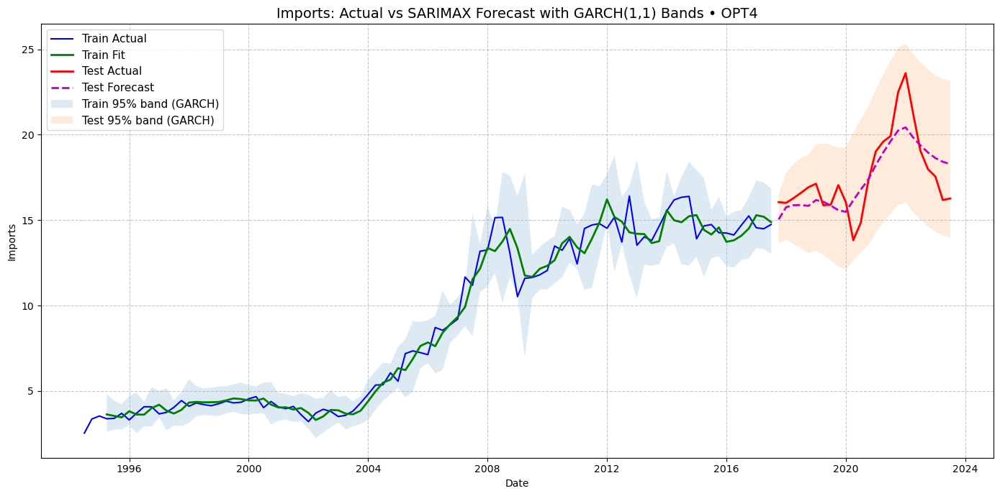


GARCH(1,1) ON SARIMAX RESIDUALS (BOX–COX SCALE)
                       Zero Mean - GARCH Model Results                        
Dep. Variable:                   None   R-squared:                       0.000
Mean Model:                 Zero Mean   Adj. R-squared:                  0.011
Vol Model:                      GARCH   Log-Likelihood:               -15.1929
Distribution:                  Normal   AIC:                           36.3857
Method:            Maximum Likelihood   BIC:                           43.9835
                                        No. Observations:                   93
Date:                Sun, Aug 31 2025   Df Residuals:                       93
Time:                        10:06:07   Df Model:                            0
                               Volatility Model                              
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
omega 

In [532]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import boxcox
from scipy.special import inv_boxcox
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

# ================================
# 1) DATA PREPARATION
# ================================
# Assumes `df` is already loaded with a DatetimeIndex and columns:
# ['Imports','CRUDE_OIL_PRICE_DOLLAR','Log_EGYPT_GDP_bn', ...]
df1 = df.copy()
df1.index = pd.to_datetime(df1.index)
df1 = df1.sort_index()

# Year dummies (kept if you still want to compare)
df1['Dummy_2008'] = (df1.index.year == 2008).astype(int)
df1['Dummy_2011'] = (df1.index.year == 2011).astype(int)
df1['Dummy_2016'] = (df1.index.year == 2016).astype(int)
df1['Dummy_2020'] = (df1.index.year == 2020).astype(int)

# Composite dummies
df1['External_Shocks'] = df1.index.year.isin([2008, 2020, 2022]).astype(int)
df1['Internal_Shocks'] = df1.index.year.isin([2011, 2013]).astype(int)

# Interaction (optional)
df1['Oil_GDP_Interaction'] = df1['CRUDE_OIL_PRICE_DOLLAR'] * df1['Log_EGYPT_GDP_bn']

# Target transform
df1['BoxCox_Imports'], boxcox_lambda = boxcox(df1['Imports'])
print(f"Box-Cox optimal λ: {boxcox_lambda:.4f}")

# ================================
# 2) TRAIN / TEST SPLIT
# ================================
train_size = int(len(df1) * 0.8)
train = df1.iloc[:train_size]
test  = df1.iloc[train_size:]
y_train, y_test = train['BoxCox_Imports'], test['BoxCox_Imports']

print(f"Training period: {train.index.min().date()} to {train.index.max().date()}")
print(f"Testing  period: {test.index.min().date()} to {test.index.max().date()}")
print(f"Train size: {len(train)}, Test size: {len(test)}")

# ================================
# 3) FEATURE SETS & MODEL CONFIG
# ================================
feature_sets = {
    'OPT1': ["CRUDE_OIL_PRICE_DOLLAR", "Log_EGYPT_GDP_bn"],
    'OPT2': ["CRUDE_OIL_PRICE_DOLLAR", "Log_EGYPT_GDP_bn", "Oil_GDP_Interaction"],
    'OPT3': ["CRUDE_OIL_PRICE_DOLLAR", "Log_EGYPT_GDP_bn", 'External_Shocks'],
    'OPT4': ["CRUDE_OIL_PRICE_DOLLAR", "Log_EGYPT_GDP_bn", 'Internal_Shocks'],
    'OPT5': ["CRUDE_OIL_PRICE_DOLLAR", "Log_EGYPT_GDP_bn",'External_Shocks','Internal_Shocks']
}

orders = [(1,1,2), (2,1,1), (3,1,1)]
seasonal_orders = [(0,0,0,0), (0,0,1,4)]

# ================================
# 4) ESTIMATION & EVALUATION
# ================================
results = []
model_counter = 0

for fs_name, features in feature_sets.items():
    missing = [f for f in features if f not in train.columns]
    if missing:
        print(f"Skipping {fs_name} - Missing features: {missing}")
        continue

    X_train_fs = train[features]
    X_test_fs  = test[features]

    for order in orders:
        for s_order in seasonal_orders:
            model_counter += 1
            model_id = f"{model_counter}-{fs_name}-SARIMA{order}x{s_order}"
            try:
                model = SARIMAX(
                    y_train, exog=X_train_fs,
                    order=order, seasonal_order=s_order,
                    enforce_stationarity=False, enforce_invertibility=False
                )
                model_fit = model.fit(disp=0, maxiter=500)

                # Train metrics (invert Box–Cox)
                train_fitted_bc = model_fit.fittedvalues
                train_fitted    = inv_boxcox(train_fitted_bc, boxcox_lambda)
                train_fitted    = np.maximum(train_fitted, 1e-6)

                train_rmse = np.sqrt(mean_squared_error(train['Imports'], train_fitted))
                train_mae  = mean_absolute_error(train['Imports'], train_fitted)
                train_r2   = r2_score(train['Imports'], train_fitted)

                # Test metrics (invert Box–Cox)
                forecast_obj = model_fit.get_forecast(steps=len(y_test), exog=X_test_fs)
                y_test_pred_bc = forecast_obj.predicted_mean
                y_test_pred    = inv_boxcox(y_test_pred_bc, boxcox_lambda)
                y_test_pred    = np.maximum(y_test_pred, 1e-6)

                test_rmse = np.sqrt(mean_squared_error(test['Imports'], y_test_pred))
                test_mae  = mean_absolute_error(test['Imports'], y_test_pred)
                test_r2   = r2_score(test['Imports'], y_test_pred)

                results.append({
                    'Model ID': model_id,
                    'Features': fs_name,
                    'Order': order,
                    'Seasonal Order': s_order,
                    'AIC': model_fit.aic,
                    'BIC': model_fit.bic,
                    'Train RMSE': train_rmse,
                    'Train MAE': train_mae,
                    'Train R2': train_r2,
                    'Test RMSE': test_rmse,
                    'Test MAE': test_mae,
                    'Test R2': test_r2,
                    'Params': len(model_fit.params),
                    'Significant Params': (model_fit.pvalues < 0.05).sum(),
                    'Model': model_fit
                })
                print(f"✅ {model_id} | Test R²: {test_r2:.3f} | Test MAE: {test_mae:.2f} | AIC: {model_fit.aic:.1f}")

            except Exception as e:
                print(f"❌ {model_id} failed: {e}")

# ================================
# 5) SELECT BEST MODEL
# ================================
if not results:
    raise RuntimeError("No valid models produced. Check data and model configurations.")

results_df = pd.DataFrame(results)
R2_THRESHOLD = 0.60
eligible = results_df[(results_df['Test R2'] >= R2_THRESHOLD) & (results_df['Train R2'] >= 0.80)]

if eligible.empty:
    print("\nNo models meet thresholds. Showing top 10 by Test R²")
    top_models = results_df.sort_values('Test R2', ascending=False).head(10)
else:
    print(f"\nModels meeting thresholds (Test R² ≥ {R2_THRESHOLD}):")
    top_models = eligible.sort_values(['Test R2', 'Test RMSE'], ascending=[False, True])

print(top_models[['Model ID','Features','Test R2','Test RMSE','AIC']])

best_model = top_models.iloc[0] if not top_models.empty else results_df.loc[results_df['Test R2'].idxmax()]
print("\n" + "="*50)
print("🏆 BEST MODEL")
print("="*50)
print(f"Model ID: {best_model['Model ID']}")
print(f"Features: {best_model['Features']} - {feature_sets[best_model['Features']]}")
print(f"Order: SARIMA{best_model['Order']}{best_model['Seasonal Order']}")
print(f"AIC: {best_model['AIC']:.1f} | BIC: {best_model['BIC']:.1f}")
print(f"Train R²: {best_model['Train R2']:.4f} | Test R²: {best_model['Test R2']:.4f}")
print(f"Test RMSE: {best_model['Test RMSE']:.2f} | Test MAE: {best_model['Test MAE']:.2f}")
print(f"Significant Parameters: {best_model['Significant Params']}/{best_model['Params']}")

# ================================
# 6) FORECAST VISUALIZATION + GARCH BANDS
# ================================
# Helper: inverse Box–Cox with floor
def inv_bc(x, lam):
    out = inv_boxcox(x, lam)
    return np.clip(out, 1e-6, np.inf)

# Burn-in to avoid initial diffuse spikes
p, d, q = best_model['Order']
burn = max(p + q, 1)

# In-sample predicted mean on Box–Cox scale (aligned)
pred_in_bc = best_model['Model'].get_prediction(
    start=train.index[0], end=train.index[-1],
    exog=train[feature_sets[best_model['Features']]]
).predicted_mean

# Out-of-sample predicted mean on Box–Cox scale
pred_out_bc = best_model['Model'].get_forecast(
    steps=len(test),
    exog=test[feature_sets[best_model['Features']]]
).predicted_mean

# Convert means to original scale
train_fit_orig = inv_bc(pred_in_bc, boxcox_lambda).iloc[burn:]
train_actual_al = train['Imports'].iloc[burn:]
test_forecast_orig = inv_bc(pred_out_bc, boxcox_lambda)

# ----- GARCH(1,1) on SARIMAX residuals (Box–Cox scale) -----
try:
    from arch import arch_model

    # Residuals on Box–Cox scale (align indices)
    y_train_bc = y_train.loc[pred_in_bc.index]
    resid_train = (y_train_bc - pred_in_bc).astype(float)

    # Fit GARCH with zero-mean (mean handled by SARIMAX)
    am = arch_model(resid_train, mean='Zero', vol='Garch', p=1, q=1, dist='normal')
    garch_fit = am.fit(disp='off')

    # In-sample conditional st.dev. (σ_t) on Box–Cox scale
    sigma_in = pd.Series(garch_fit.conditional_volatility, index=resid_train.index)

    # Out-of-sample volatility forecast over the test horizon
    h = len(test)
    fc = garch_fit.forecast(horizon=h, reindex=True)
    var_out = fc.variance.iloc[-1].values  # last row, horizons 1..h
    sigma_out = pd.Series(np.sqrt(var_out), index=test.index)

    z = 1.96  # ~95% intervals

    # Bands on Box–Cox scale
    lower_in_bc  = (pred_in_bc - z*sigma_in)
    upper_in_bc  = (pred_in_bc + z*sigma_in)
    lower_out_bc = (pred_out_bc - z*sigma_out)
    upper_out_bc = (pred_out_bc + z*sigma_out)

    # Invert to original scale and apply burn-in
    train_lo = inv_bc(lower_in_bc,  boxcox_lambda).iloc[burn:]
    train_hi = inv_bc(upper_in_bc,  boxcox_lambda).iloc[burn:]
    test_lo  = inv_bc(lower_out_bc, boxcox_lambda)
    test_hi  = inv_bc(upper_out_bc, boxcox_lambda)

    # ---- Plot with GARCH time-varying bands ----
    plt.figure(figsize=(14,7))
    plt.plot(train.index, train['Imports'], 'b-', label='Train Actual')
    plt.plot(train_fit_orig.index, train_fit_orig, 'g-', label='Train Fit', linewidth=2)
    plt.plot(test.index, test['Imports'], 'r-', label='Test Actual', linewidth=2)
    plt.plot(test.index, test_forecast_orig, 'm--', label='Test Forecast', linewidth=2)

    # Shaded 95% bands
    plt.fill_between(train_lo.index, train_lo.values, train_hi.values,
                     alpha=0.15, label='Train 95% band (GARCH)')
    plt.fill_between(test.index, test_lo.values,  test_hi.values,
                     alpha=0.15, label='Test 95% band (GARCH)')

    plt.title(f"Imports: Actual vs SARIMAX Forecast with GARCH(1,1) Bands • {best_model['Features']}", fontsize=14)
    plt.xlabel('Date'); plt.ylabel('Imports')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=11)
    plt.tight_layout()
    plt.show()

    # Optional: print GARCH summary
    print("\n" + "="*50)
    print("GARCH(1,1) ON SARIMAX RESIDUALS (BOX–COX SCALE)")
    print("="*50)
    print(garch_fit.summary())

except ImportError:
    # If arch is not installed, draw homoskedastic 95% bands from SARIMAX only (constant variance)
    print("arch package not installed: install with `pip install arch` for time-varying GARCH bands.")
    # Fallback to SARIMAX's own conf_int on Box–Cox scale
    ci = best_model['Model'].get_forecast(steps=len(test), exog=test[feature_sets[best_model['Features']]]).conf_int()
    # If the conf_int is on the observed (Box–Cox) state:
    if {'lower BoxCox_Imports','upper BoxCox_Imports'}.issubset(ci.columns):
        test_lo = inv_bc(ci['lower BoxCox_Imports'], boxcox_lambda)
        test_hi = inv_bc(ci['upper BoxCox_Imports'], boxcox_lambda)
        plt.figure(figsize=(14,7))
        plt.plot(train.index, train['Imports'], 'b-', label='Train Actual')
        plt.plot(train_fit_orig.index, train_fit_orig, 'g-', label='Train Fit', linewidth=2)
        plt.plot(test.index, test['Imports'], 'r-', label='Test Actual', linewidth=2)
        plt.plot(test.index, test_forecast_orig, 'm--', label='Test Forecast', linewidth=2)
        plt.fill_between(test.index, test_lo.values, test_hi.values, alpha=0.15,
                         label='Test 95% band (SARIMAX)')
        plt.title(f"Imports: Actual vs SARIMAX Forecast with Bands (No GARCH) • {best_model['Features']}", fontsize=14)
        plt.xlabel('Date'); plt.ylabel('Imports')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.legend(fontsize=11)
        plt.tight_layout()
        plt.show()
    else:
        print("Could not construct fallback bands from SARIMAX conf_int; column names differ.")

except Exception as e:
    print(f"GARCH band construction failed: {e}")

# ================================
# 7) MODEL SUMMARY & FEATURE STATS
# ================================
print("\n" + "="*50)
print("MODEL SUMMARY")
print("="*50)
print(best_model['Model'].summary())

print("\n" + "="*50)
print("FEATURE IMPORTANCE")
print("="*50)
params  = best_model['Model'].params
pvalues = best_model['Model'].pvalues
imp_rows = []
for f in feature_sets[best_model['Features']]:
    if f in params.index:
        imp_rows.append({
            'Feature': f,
            'Coefficient': params[f],
            'P-value': pvalues[f],
            'Significant (5%)': pvalues[f] < 0.05
        })
if imp_rows:
    print(pd.DataFrame(imp_rows).sort_values('P-value'))
else:
    print("No exogenous features found in the final model.")


## Gru 

Total number of combinations: 128
Starting grid search...
Testing combination 1/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 5, 'units': 20}
  Diff Test R²: -0.0147 | Orig Test R²: 0.6379
Testing combination 2/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 5, 'units': 40}
  Diff Test R²: -0.1379 | Orig Test R²: 0.5940
Testing combination 3/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 10, 'units': 20}
  Diff Test R²: -0.0988 | Orig Test R²: 0.5949
Testing combination 4/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 10, 'units': 40}
  Diff Test R²: 0.3494 | Orig Test R²: 0.7602
Testing combination 5/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate'

Predictions saved: 
  → best_gru_train_preds.csv 
  → best_gru_test_preds.csv 
  → best_gru_predictions.csv
Best best_gru model saved → best_gru_imports_model.h5


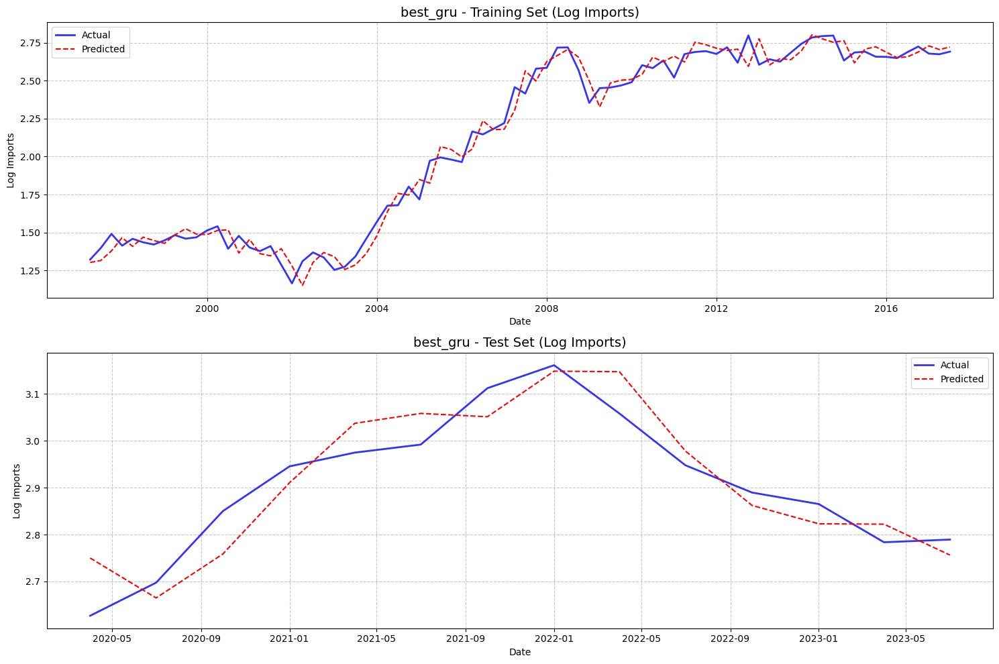


GRU Performance (Original Scale):
Train RMSE: 0.0781 | Test RMSE: 0.0609
Train R²: 0.9814 | Test R²: 0.8277

Model comparison saved to 'model_comparison.csv'

Process completed successfully!


In [39]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import os, time, ast, json
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense, Dropout, LSTM, GRU
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import ParameterGrid

# =============== Determinism =================
SEED = 123
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
# (Optional: for full determinism you can try)
# os.environ["TF_DETERMINISTIC_OPS"] = "1"

# =============== Load & prep ================
# df = pd.read_csv('your_data.csv', index_col=0, parse_dates=True)
df["Log_Imports"] = np.log(df["Imports"])
df['Internal_Shocks'] = df.index.year.isin([2011, 2013]).astype(int)

exog_vars = ['CRUDE_OIL_PRICE_DOLLAR', 'Log_EGYPT_GDP_bn', 'Internal_Shocks']
target = "Log_Imports"

original_target = df[target].copy()

# Make first differences
for var in exog_vars:
    df[f'{var}_diff'] = df[var].diff()
df[target + "_diff"] = df[target].diff()

df_diff = df.dropna().copy()
exog_vars_diff = [f'{var}_diff' for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-aware split
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# Scale on train only
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# =============== Helpers ====================
def make_sequences(X_scaled, y_series, idx, timesteps):
    X_seq, y_seq, idx_used = [], [], []
    for i in range(timesteps, len(X_scaled)):
        X_seq.append(X_scaled[i - timesteps:i])
        y_seq.append(y_series.iloc[i])
        idx_used.append(idx[i])
    return np.array(X_seq), np.array(y_seq), pd.Index(idx_used)

def inverse_differencing(original_series, diff_predictions, indices):
    """
    Safe 1-step inverse differencing:
    y_t_hat = y_{t-1, actual} + diff_hat_t
    Uses only the previous **actual** value, so no future leakage.
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def build_model(params, input_dim, timesteps):
    model = Sequential()
    Layer = GRU if params['rnn_type'] == 'GRU' else (LSTM if params['rnn_type']=='LSTM' else SimpleRNN)
    return_sequences = params['layers'] > 1
    model.add(Layer(params['units'], input_shape=(timesteps, input_dim),
                    return_sequences=return_sequences, activation='tanh'))
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    if params['layers'] > 1:
        # simple halving pattern for the second layer
        model.add(Layer(params['units'] // 2, return_sequences=False, activation='tanh'))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    model.add(Dense(1))

    opt = Adam(learning_rate=params['learning_rate']) if params['optimizer']=='adam' \
          else RMSprop(learning_rate=params['learning_rate'])
    model.compile(optimizer=opt, loss='mse')
    return model

def evaluate_on_both_scales(model, X_train_seq, y_train_seq, idx_train_used,
                            X_test_seq, y_test_seq, idx_test_used):
    # predictions in diff space
    ytr_pred_d = model.predict(X_train_seq, verbose=0).flatten()
    yte_pred_d = model.predict(X_test_seq, verbose=0).flatten()

    # diff metrics
    train_rmse_diff = np.sqrt(mean_squared_error(y_train_seq, ytr_pred_d))
    test_rmse_diff  = np.sqrt(mean_squared_error(y_test_seq,  yte_pred_d))
    train_mae_diff  = mean_absolute_error(y_train_seq, ytr_pred_d)
    test_mae_diff   = mean_absolute_error(y_test_seq,  yte_pred_d)
    train_r2_diff   = r2_score(y_train_seq, ytr_pred_d)
    test_r2_diff    = r2_score(y_test_seq,  yte_pred_d)

    # back to original scale (using true y_{t-1})
    ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_train_used)
    yte_hat = inverse_differencing(original_target, yte_pred_d, idx_test_used)
    ytr_true = original_target.loc[idx_train_used]
    yte_true = original_target.loc[idx_test_used]

    train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
    test_rmse_orig  = np.sqrt(mean_squared_error(yte_true, yte_hat))
    train_r2_orig   = r2_score(ytr_true, ytr_hat)
    test_r2_orig    = r2_score(yte_true, yte_hat)

    return {
        'train_rmse_diff': train_rmse_diff, 'test_rmse_diff': test_rmse_diff,
        'train_mae_diff': train_mae_diff,   'test_mae_diff': test_mae_diff,
        'train_r2_diff': train_r2_diff,     'test_r2_diff': test_r2_diff,
        'train_rmse_orig': train_rmse_orig, 'test_rmse_orig': test_rmse_orig,
        'train_r2_orig': train_r2_orig,     'test_r2_orig': test_r2_orig
    }

# =============== Grid =======================
param_grid = {
    'rnn_type': ['GRU'],            # keep GRU only
    'units': [20, 40],
    'layers': [1, 2],
    'dropout': [0.0, 0.2],
    'timesteps': [5, 10],
    'batch_size': [8, 16],
    'learning_rate': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop']
}
all_params = list(ParameterGrid(param_grid))
print(f"Total number of combinations: {len(all_params)}")

checkpoint_file = 'grid_search_checkpoint.csv'
results = []

# Load checkpoint if exists (and coerce 'params' back to dict if needed)
if os.path.exists(checkpoint_file):
    try:
        checkpoint_df = pd.read_csv(checkpoint_file)
        if 'params' in checkpoint_df.columns:
            def _fix(p):
                try:
                    return ast.literal_eval(p) if isinstance(p, str) else p
                except:
                    return p
            checkpoint_df['params'] = checkpoint_df['params'].apply(_fix)
        results = checkpoint_df.to_dict('records')
        print(f"Loaded {len(results)} previous results from checkpoint")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")

def save_checkpoint_row(row):
    df_row = pd.DataFrame([row]).copy()
    # store params as string for CSV
    if 'params' in df_row.columns:
        df_row['params'] = df_row['params'].astype(str)
    if not os.path.exists(checkpoint_file):
        df_row.to_csv(checkpoint_file, index=False)
    else:
        df_row.to_csv(checkpoint_file, mode='a', header=False, index=False)

# Track best by ORIGINAL Test R² during the sweep; save weights immediately
BEST_WEIGHTS_PATH = 'best_gru_from_sweep.weights.h5'
best_original_test_r2 = -np.inf
best_row_for_later = None

print("Starting grid search...")
for i, params in enumerate(all_params, start=1):
    if any(str(params) == str(r.get('params')) for r in results):
        print(f"Skipping combination {i}/{len(all_params)} (already completed)")
        continue

    print(f"Testing combination {i}/{len(all_params)}: {params}")
    timesteps = params['timesteps']

    # sequences
    Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
    Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled,  y_test,  test_indices,  timesteps)

    model = build_model(params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)

    # patience consistent & restore_best_weights=True
    early = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    # temp checkpoint for this combo (not the global best)
    tmp_ckpt = f"_tmp_{i}.weights.h5"
    ckpt = ModelCheckpoint(tmp_ckpt, monitor='val_loss', save_best_only=True, save_weights_only=True, verbose=0)

    t0 = time.time()
    hist = model.fit(
        Xtr_seq, ytr_seq,
        validation_data=(Xte_seq, yte_seq),   # like your previous sweep
        epochs=200,
        batch_size=params['batch_size'],
        callbacks=[early, ckpt],
        verbose=0
    )
    train_time = time.time() - t0
    # load *this* combo's best val weights before evaluating
    if os.path.exists(tmp_ckpt):
        model.load_weights(tmp_ckpt)

    # average of last 5 val losses
    val_loss = np.mean(hist.history['val_loss'][-5:]) if len(hist.history['val_loss']) >= 5 else hist.history['val_loss'][-1]

    # Evaluate on both scales
    metrics = evaluate_on_both_scales(model, Xtr_seq, ytr_seq, idx_tr_used, Xte_seq, yte_seq, idx_te_used)

    # record row
    row = {
        'params': params,
        'val_loss': val_loss,
        'epochs_used': len(hist.history['loss']),
        'training_time': train_time,
        **metrics
    }
    results.append(row)
    save_checkpoint_row(row)

    print(f"  Diff Test R²: {metrics['test_r2_diff']:.4f} | Orig Test R²: {metrics['test_r2_orig']:.4f}")

    # if this is the best ORIGINAL Test R² so far, persist its weights for later reuse
    if metrics['test_r2_orig'] > best_original_test_r2:
        best_original_test_r2 = metrics['test_r2_orig']
        best_row_for_later = row.copy()
        # Save this exact trained model weights (not just tmp)
        model.save_weights(BEST_WEIGHTS_PATH)
    # cleanup tmp per-combo checkpoint
    try:
        if os.path.exists(tmp_ckpt):
            os.remove(tmp_ckpt)
    except:
        pass

# Save full sweep
results_df = pd.DataFrame(results)
# also keep a convenience score (not used for selection anymore)
results_df['combined_score'] = results_df['val_loss'] - results_df['test_r2_diff']
results_df.to_csv('grid_search_results.csv', index=False)
print("Grid search results saved to 'grid_search_results.csv'")

# =============== Pick best by ORIGINAL Test R² =================
if (results_df.shape[0] == 0) or (best_row_for_later is None):
    raise SystemExit("No valid results from grid search.")

best_params = best_row_for_later['params'] if isinstance(best_row_for_later['params'], dict) \
              else ast.literal_eval(best_row_for_later['params'])
print("\nBest GRU model found (by ORIGINAL Test R²):")
print("Parameters:", best_params)
print(f"Test R² (original): {best_row_for_later['test_r2_orig']:.4f}")

# =============== Rebuild same model & load exact best weights ===============
def train_and_plot_model_with_loaded_weights(params, model_name):
    timesteps = params['timesteps']
    Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
    Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled,  y_test,  test_indices,  timesteps)

    model = build_model(params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
    # Load the weights saved during sweep for the best run
    model.load_weights(BEST_WEIGHTS_PATH)

    # Predict and evaluate (no retraining)
    ytr_pred_d = model.predict(Xtr_seq, verbose=0).flatten()
    yte_pred_d = model.predict(Xte_seq, verbose=0).flatten()

    ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_tr_used)
    yte_hat = inverse_differencing(original_target, yte_pred_d, idx_te_used)
    ytr_true = original_target.loc[idx_tr_used]
    yte_true = original_target.loc[idx_te_used]

    train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
    test_rmse_orig  = np.sqrt(mean_squared_error(yte_true, yte_hat))
    train_r2_orig   = r2_score(ytr_true, ytr_hat)
    test_r2_orig    = r2_score(yte_true, yte_hat)

    # Save predictions
    train_df = pd.DataFrame({'date': ytr_true.index, 'actual': ytr_true.values, 'predicted': ytr_hat.values, 'split': 'train'})
    test_df  = pd.DataFrame({'date': yte_true.index, 'actual': yte_true.values, 'predicted': yte_hat.values, 'split': 'test'})
    all_preds = pd.concat([train_df, test_df])
    train_df.to_csv(f"{model_name}_train_preds.csv", index=False)
    test_df.to_csv(f"{model_name}_test_preds.csv", index=False)
    all_preds.to_csv(f"{model_name}_predictions.csv", index=False)
    print("Predictions saved:",
          f"\n  → {model_name}_train_preds.csv",
          f"\n  → {model_name}_test_preds.csv",
          f"\n  → {model_name}_predictions.csv")

    # Save model in Keras native format or H5 (matching your first script’s behavior)
    model.save(f"{model_name}_imports_model.h5")
    print(f"Best {model_name} model saved → {model_name}_imports_model.h5")

    # Plots
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 1, 1)
    plt.plot(ytr_true.index, ytr_true, 'b-', label='Actual', linewidth=2, alpha=0.8)
    plt.plot(ytr_true.index, ytr_hat,  'r--', label='Predicted', linewidth=1.5)
    plt.title(f'{model_name} - Training Set (Log Imports)', fontsize=14)
    plt.xlabel('Date'); plt.ylabel('Log Imports'); plt.legend(); plt.grid(True, linestyle='--', alpha=0.7)

    plt.subplot(2, 1, 2)
    plt.plot(yte_true.index, yte_true, 'b-', label='Actual', linewidth=2, alpha=0.8)
    plt.plot(yte_true.index, yte_hat,  'r--', label='Predicted', linewidth=1.5)
    plt.title(f'{model_name} - Test Set (Log Imports)', fontsize=14)
    plt.xlabel('Date'); plt.ylabel('Log Imports'); plt.legend(); plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f'{model_name}_predictions.png', dpi=300, bbox_inches='tight')
    plt.show()

    # No training history here (we reused weights). If you want, you can also save the best history’s curve
    # during the sweep by storing hist.history per combo; omitted for brevity.

    return {
        'train_rmse_orig': train_rmse_orig,
        'test_rmse_orig': test_rmse_orig,
        'train_r2_orig': train_r2_orig,
        'test_r2_orig': test_r2_orig,
        'params': params
    }

print(f"\n{'='*50}")
print(f"Training and evaluating best GRU model (reloading sweep weights)")
metrics = train_and_plot_model_with_loaded_weights(best_params, "best_gru")

print("\nGRU Performance (Original Scale):")
print(f"Train RMSE: {metrics['train_rmse_orig']:.4f} | Test RMSE: {metrics['test_rmse_orig']:.4f}")
print(f"Train R²: {metrics['train_r2_orig']:.4f} | Test R²: {metrics['test_r2_orig']:.4f}")

# Comparison table (mirrors your first script’s artifact)
comparison_df = pd.DataFrame([{
    'Model': 'GRU',
    'Train RMSE': metrics['train_rmse_orig'],
    'Test RMSE': metrics['test_rmse_orig'],
    'Train R²': metrics['train_r2_orig'],
    'Test R²': metrics['test_r2_orig'],
    'Parameters': str(metrics['params'])
}])
comparison_df.to_csv('model_comparison.csv', index=False)
print("\nModel comparison saved to 'model_comparison.csv'")

print("\nProcess completed successfully!")


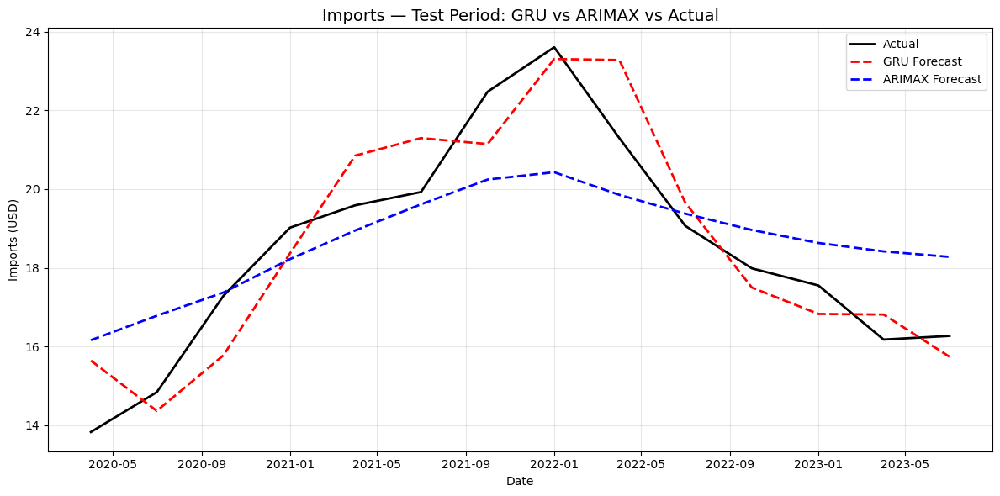

In [540]:
# ============================================
# Imports — Test Period: GRU vs ARIMAX vs Actual (Chart only, robust to log files)
# ============================================
import os, glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- Actual + ARIMAX from your SARIMAX run (ORIGINAL scale) ----
# 'test' must contain the test slice and column 'Imports' (original scale)
# 'test_forecast_orig' is ARIMAX forecast on original scale
imports_y_test_actual = test["Imports"].copy()
imports_arimax_test_pred = test_forecast_orig.copy()

# Ensure DateTimeIndex
imports_y_test_actual.index = pd.to_datetime(imports_y_test_actual.index)
imports_arimax_test_pred.index = pd.to_datetime(imports_arimax_test_pred.index)

# ---- Load GRU test predictions (may be LOG or ORIGINAL scale) ----
gru_dir = r"C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\imports results"
# Prefer a fixed filename; fall back to latest CSV in folder
preferred = os.path.join(gru_dir, "best_gru_test_preds.csv")
if os.path.exists(preferred):
    gru_df = pd.read_csv(preferred)
else:
    files = sorted(glob.glob(os.path.join(gru_dir, "*.csv")), key=os.path.getmtime)
    if not files:
        raise FileNotFoundError(f"No CSV files found in {gru_dir}")
    gru_df = pd.read_csv(files[-1])

# Parse dates whether stored as a 'date' column or as the first unnamed column
if "date" in gru_df.columns:
    gru_df["date"] = pd.to_datetime(gru_df["date"])
    gru_df = gru_df.set_index("date").sort_index()
else:
    # first column is the datetime index
    first_col = gru_df.columns[0]
    gru_df[first_col] = pd.to_datetime(gru_df[first_col])
    gru_df = gru_df.set_index(first_col).sort_index()

# Pick the forecast column; common names are 'predicted' or 'forecast'
pred_col = "predicted" if "predicted" in gru_df.columns else \
           ("forecast" if "forecast" in gru_df.columns else gru_df.columns[-1])

imports_gru_test_pred = gru_df[pred_col].astype(float)

# ---- If GRU file is on log scale, convert to original scale ----
# Heuristic: if median of GRU series is small (< 10) while actual imports median is much larger,
# then GRU is likely in log units -> exponentiate.
if imports_gru_test_pred.median() < 10 and imports_y_test_actual.median() > 10:
    imports_gru_test_pred = np.exp(imports_gru_test_pred)

# ---- Align the three series on the same dates ----
common_idx = imports_y_test_actual.index\
    .intersection(imports_arimax_test_pred.index)\
    .intersection(imports_gru_test_pred.index)

y_true  = imports_y_test_actual.loc[common_idx]
y_gru   = imports_gru_test_pred.loc[common_idx]
y_arima = imports_arimax_test_pred.loc[common_idx]

# ---- Plot: Actual vs GRU vs ARIMAX (TEST period) ----
plt.figure(figsize=(12,6))
plt.plot(common_idx, y_true,  label="Actual", linewidth=2, color="black")
plt.plot(common_idx, y_gru,   "--", label="GRU Forecast", linewidth=2, color="red")
plt.plot(common_idx, y_arima, "--", label="ARIMAX Forecast", linewidth=2, color="blue")

plt.title("Imports — Test Period: GRU vs ARIMAX vs Actual", fontsize=14)
plt.xlabel("Date")
plt.ylabel("Imports (USD)")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# Suez Canal 

## OLS

                            OLS Regression Results                            
Dep. Variable:               Log_Suez   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     1377.
Date:                Sun, 24 Aug 2025   Prob (F-statistic):           1.46e-80
Time:                        16:06:12   Log-Likelihood:                 102.56
No. Observations:                 117   AIC:                            -199.1
Df Residuals:                     114   BIC:                            -190.8
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -11

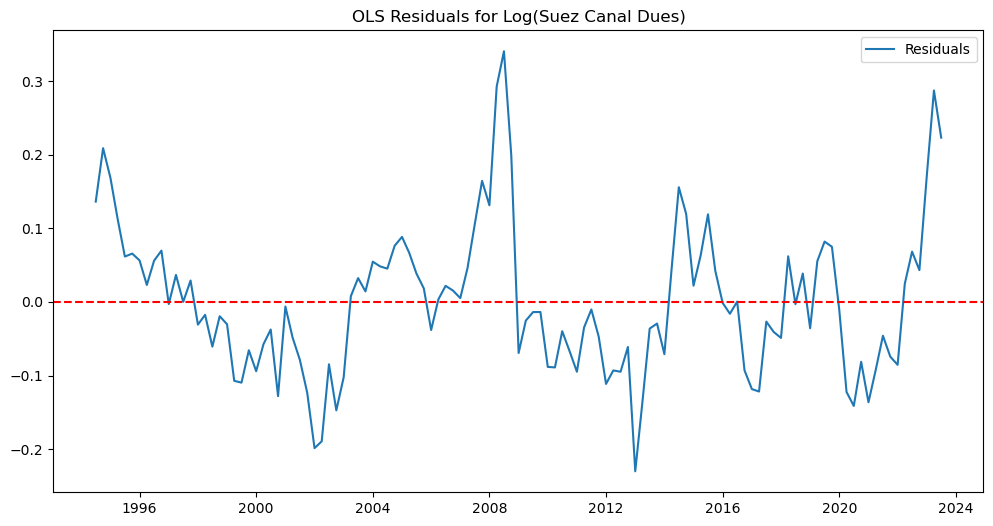

In [432]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ========================
# 0. DATA PREP
# ========================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index).sort_values()

# Target: log of Suez Canal dues
df1["Log_Suez"] = np.log(df1["Suez_Canal_dues"])


# ========================
# 1. OLS MODEL
# ========================
exog_vars = [
    "CRUDE_OIL_PRICE_DOLLAR", "Log_World_GDP"]
X = sm.add_constant(df1[exog_vars])
y = df1["Log_Suez"]

ols_model = sm.OLS(y, X).fit()

print(ols_model.summary())

# ========================
# 2. Residual Diagnostics
# ========================
fig = plt.figure(figsize=(12,6))
plt.plot(ols_model.resid, label="Residuals")
plt.axhline(0, color="red", linestyle="--")
plt.title("OLS Residuals for Log(Suez Canal Dues)")
plt.legend(); plt.show()


In [434]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Prepare data for VIF
X_vif = df1[["CRUDE_OIL_PRICE_DOLLAR", "Log_World_GDP"]].copy()
X_vif = add_constant(X_vif)

# Calculate VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]

print(vif_data)


                 Variable          VIF
0                   const  1709.600053
1  CRUDE_OIL_PRICE_DOLLAR     2.679106
2           Log_World_GDP     2.679106


## Arima X

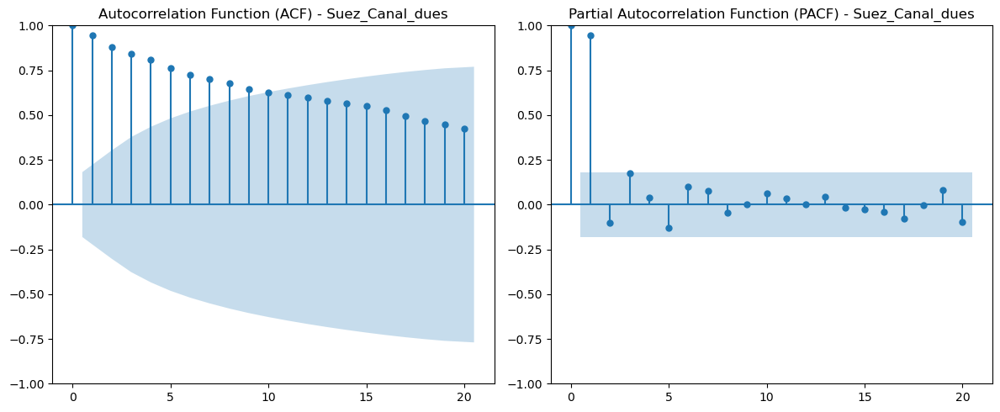

In [333]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Plot ACF and PACF for Imports (raw, untransformed)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(df['Suez_Canal_dues'].dropna(), lags=20, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF) - Suez_Canal_dues')

plot_pacf(df['Suez_Canal_dues'].dropna(), lags=20, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF) - Suez_Canal_dues')

plt.tight_layout()
plt.show()


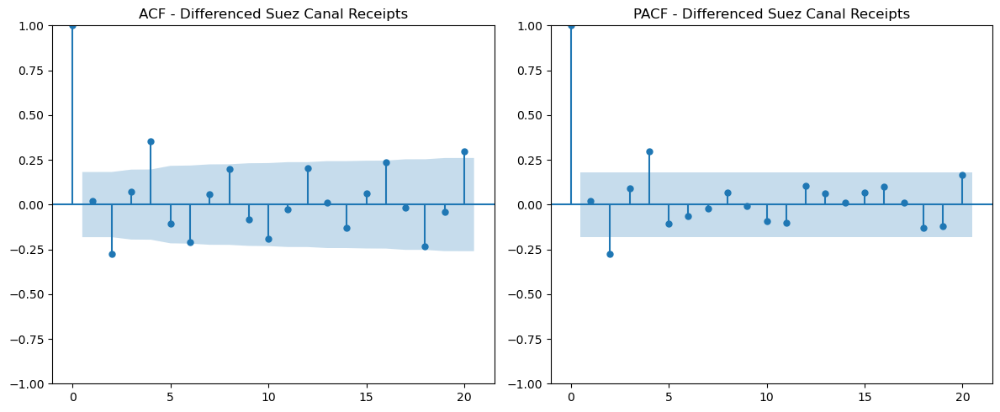

In [522]:
# Compute first difference and drop NaNs
diff_Suez_Canal_dues = df['Suez_Canal_dues'].diff().dropna()

# Plot ACF and PACF for differenced Imports
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(diff_Suez_Canal_dues, lags=20, ax=ax[0], title='ACF - Differenced Suez Canal Receipts')
plot_pacf(diff_Suez_Canal_dues, lags=20, ax=ax[1], title='PACF - Differenced Suez Canal Receipts')

plt.tight_layout()
plt.show()

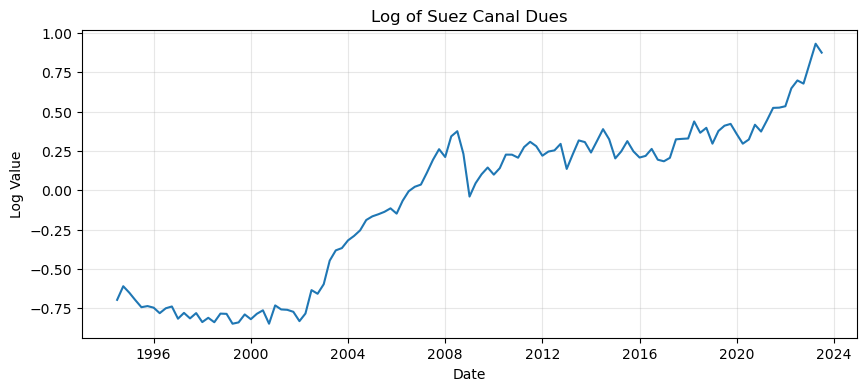

ADF Statistic: -0.2340
p-value: 0.9343
Used lag: 4, N obs: 112
Critical Value 1%: -3.4901
Critical Value 5%: -2.8877
Critical Value 10%: -2.5807

❌ Non-stationary (fail to reject H0) — consider differencing.
ADF with trend p-value: 0.5018376030806562


In [386]:
# Make sure we're using ONE frame
df_model = df.copy()
df_model.index = pd.to_datetime(df_model.index)
df_model = df_model.sort_index()

# Safe log (avoid -inf if there are zeros/negatives)
suez = df_model["Suez_Canal_dues"].astype(float)
suez = suez.where(suez > 0)                 # set nonpositive to NaN
df_model["Log_Suez_Canal_dues"] = np.log(suez)

# Clean series for plotting/tests
y_log = df_model["Log_Suez_Canal_dues"].dropna()

# ---- Plot (x and y now same length) ----
plt.figure(figsize=(10,4))
plt.plot(y_log.index, y_log.values)
plt.title("Log of Suez Canal Dues")
plt.xlabel("Date"); plt.ylabel("Log Value")
plt.grid(True, alpha=0.3)
plt.show()

from statsmodels.tsa.stattools import adfuller

# Run ADF on the cleaned log series
result = adfuller(y_log, autolag="AIC")

adf_stat, pval, usedlag, nobs, crit_vals, icbest = result
print(f"ADF Statistic: {adf_stat:.4f}")
print(f"p-value: {pval:.4g}")
print(f"Used lag: {usedlag}, N obs: {nobs}")
for level, cv in crit_vals.items():
    print(f"Critical Value {level}: {cv:.4f}")

print("\n✅ Stationary (reject H0)." if pval < 0.05
      else "\n❌ Non-stationary (fail to reject H0) — consider differencing.")


adf_stat, pval, _, _, crit, _ = adfuller(y_log, regression='ct')
print("ADF with trend p-value:", pval)




Train: 1994-10-01 00:00:00 → 2017-07-01 00:00:00  (n=92)
Test : 2017-10-01 00:00:00 → 2023-07-01 00:00:00  (n=24)

=== ALL MODELS TRIED (sorted by Test RMSE then AIC) ===
   model            order       use_exog  aic       train_r2  test_r2  rmse   mae    mape  
0   ARIMAX(1, 0, 2)  (1, 0, 2)   True    -227.9264  0.9221    0.6884  0.1017 0.0822 17.4497
1   ARIMAX(1, 0, 0)  (1, 0, 0)   True    -231.5721  0.9460    0.6881  0.1018 0.0794 16.5432
2   ARIMAX(2, 0, 2)  (2, 0, 2)   True    -224.5750 -0.1628    0.6690  0.1048 0.0801 15.8143
3   ARIMAX(1, 1, 1)  (1, 1, 1)   True    -232.6398 -6.5398    0.6191  0.1125 0.0870 16.8970
4   ARIMAX(2, 0, 1)  (2, 0, 1)   True    -226.3873 -1.6100    0.5811  0.1179 0.0866 16.1742
5   ARIMAX(1, 0, 1)  (1, 0, 1)   True    -229.2542 -0.0872    0.5663  0.1200 0.0858 15.6753
6   ARIMAX(1, 1, 0)  (1, 1, 0)   True    -230.6005 -1.7357    0.4385  0.1366 0.0935 16.4893
7   ARIMAX(2, 1, 1)  (2, 1, 1)   True    -232.4201 -1.0978    0.2327  0.1596 0.1086 18.5790


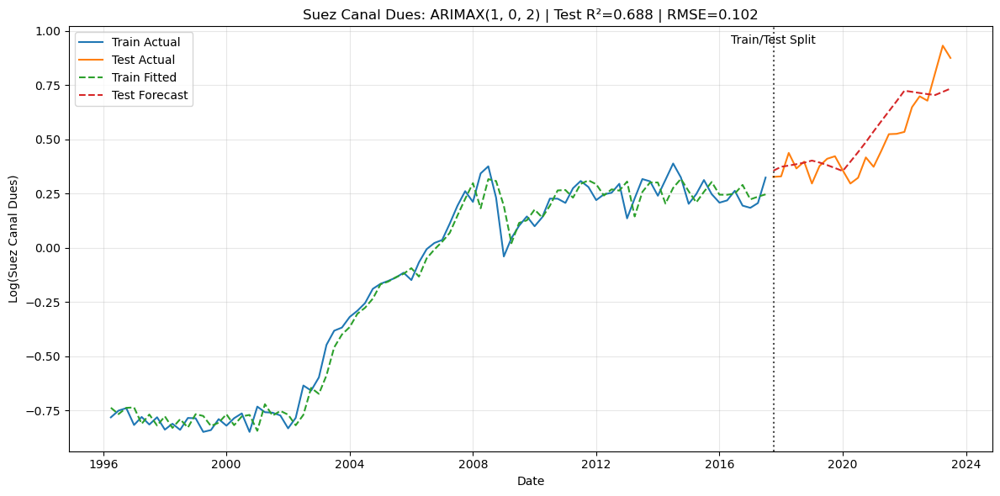


MODEL SUMMARY: ARIMAX(1, 0, 2)
                                SARIMAX Results                                
Dep. Variable:     Log_Suez_Canal_dues   No. Observations:                   92
Model:                SARIMAX(1, 0, 2)   Log Likelihood                 119.963
Date:                 Sun, 24 Aug 2025   AIC                           -227.926
Time:                         15:52:41   BIC                           -212.995
Sample:                     10-01-1994   HQIC                          -221.908
                          - 07-01-2017                                         
Covariance Type:                   opg                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Log_World_GDP             -0.1700      0.308     -0.552      0.581      -0.773       0.433
CRUDE_OIL_PRICE_DOLLAR     0.0048      0.001      4.034

In [412]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# ================================
# 0) DATA PREP
# ================================
df_model = df.copy()

# Ensure DateTimeIndex sorted
df_model.index = pd.to_datetime(df_model.index)
df_model = df_model.sort_index()

# Target + exogenous (RAW, no scaling)
df_model["Log_Suez_Canal_dues"] = np.log(df_model["Suez_Canal_dues"])


exog_cols = ["Log_World_GDP", "CRUDE_OIL_PRICE_DOLLAR"]

# Drop first row to avoid initialization spike
df_model = df_model.iloc[1:].copy()

y = df_model["Log_Suez_Canal_dues"]
X = df_model[exog_cols]

# ================================
# 1) TRAIN/TEST SPLIT
# ================================
split_idx = int(len(df_model) * 0.8)
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]

print(f"\nTrain: {y_train.index[0]} → {y_train.index[-1]}  (n={len(y_train)})")
print(f"Test : {y_test.index[0]} → {y_test.index[-1]}  (n={len(y_test)})")

# ================================
# 2) HELPER: fit/evaluate
# ================================
def eval_model(order, use_exog=True):
    try:
        if use_exog:
            m = SARIMAX(y_train, exog=X_train, order=order,
                        enforce_stationarity=False, enforce_invertibility=False)
        else:
            m = SARIMAX(y_train, order=order,
                        enforce_stationarity=False, enforce_invertibility=False)

        res = m.fit(disp=False)

        if use_exog:
            yhat_train = res.get_prediction(exog=X_train).predicted_mean
            yhat_test  = res.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        else:
            yhat_train = res.get_prediction().predicted_mean
            yhat_test  = res.get_forecast(steps=len(y_test)).predicted_mean
            yhat_test.index = y_test.index

        train_r2 = r2_score(y_train, yhat_train)
        test_r2  = r2_score(y_test,  yhat_test)
        rmse     = np.sqrt(mean_squared_error(y_test, yhat_test))
        mae      = mean_absolute_error(y_test, yhat_test)
        mape     = (np.abs((y_test - yhat_test) / y_test)
                    .replace([np.inf, -np.inf], np.nan)).dropna().mean() * 100

        return {
            "model": f"{'ARIMAX' if use_exog else 'ARIMA'}{order}",
            "order": order,
            "use_exog": use_exog,
            "aic": res.aic,
            "train_r2": train_r2,
            "test_r2": test_r2,
            "rmse": rmse,
            "mae": mae,
            "mape": mape,
            "res": res,
            "train_pred": yhat_train,
            "test_pred": yhat_test
        }
    except Exception as e:
        return {"model": f"{'ARIMAX' if use_exog else 'ARIMA'}{order}",
                "order": order, "use_exog": use_exog, "error": str(e)}

# ================================
# 3) RUN CANDIDATE ORDERS
# ================================
orders_d0 = [(1,0,0), (1,0,1), (2,0,1), (1,0,2), (2,0,2)]
orders_d1 = [(1,1,0), (1,1,1), (2,1,1)]
candidates = orders_d0 + orders_d1

results = []
for od in candidates:
    results.append(eval_model(od, use_exog=True))   # ARIMAX
    results.append(eval_model(od, use_exog=False))  # ARIMA

# ================================
# 4) SHOW ALL RESULTS + PICK BEST
# ================================
ok   = [r for r in results if "error" not in r]
fail = [r for r in results if "error" in r]

if fail:
    print("\nModels that failed to converge:")
    for r in fail:
        print(f"- {r['model']}: {r['error']}")

if not ok:
    raise RuntimeError("No models converged.")

tbl = (pd.DataFrame([{k:v for k,v in r.items() if k in
         ["model","use_exog","order","aic","train_r2","test_r2","rmse","mae","mape"]} for r in ok])
       .sort_values(["rmse","aic"]).reset_index(drop=True))

print("\n=== ALL MODELS TRIED (sorted by Test RMSE then AIC) ===")
print(tbl.to_string(index=True, justify="left", float_format=lambda x: f"{x:,.4f}"))

best = min(ok, key=lambda r: r["rmse"])
print("\n=== BEST MODEL (by Test RMSE) ===")
print(f"{best['model']} | RMSE={best['rmse']:.4f} | MAE={best['mae']:.4f} | "
      f"MAPE={best['mape']:.2f}% | Test R²={best['test_r2']:.3f} | "
      f"Train R²={best['train_r2']:.3f} | AIC={best['aic']:.1f} | "
      f"Exog={'Yes' if best['use_exog'] else 'No'}")

# ================================
# 5) PLOT BEST (skip early unstable points)
# ================================
plt.figure(figsize=(12,6))

# Choose a start date (adjust as needed: "1996-01-01" or "2000-01-01")
start_date = "1996-04-01"

# Filter series after the chosen start date
y_train_plot = y_train[y_train.index >= start_date]
y_test_plot  = y_test[y_test.index >= start_date]
train_pred_plot = best["train_pred"][best["train_pred"].index >= start_date]
test_pred_plot  = best["test_pred"][best["test_pred"].index >= start_date]

# Plot after filtering
plt.plot(y_train_plot.index, y_train_plot, label="Train Actual")
plt.plot(y_test_plot.index,  y_test_plot,  label="Test Actual")
plt.plot(train_pred_plot.index, train_pred_plot, linestyle="--", label="Train Fitted")
plt.plot(test_pred_plot.index, test_pred_plot, linestyle="--", label="Test Forecast")

# Add train/test split line (if it’s still within the visible period)
split_date = y_test.index[0]
if split_date >= pd.to_datetime(start_date):
    plt.axvline(x=split_date, color="black", linestyle=":", alpha=0.7)
    plt.text(split_date, plt.ylim()[1]*0.92, "Train/Test Split", ha="center")

plt.title(f"Suez Canal Dues: {best['model']} | Test R²={best['test_r2']:.3f} | RMSE={best['rmse']:.3f}")
plt.xlabel("Date"); plt.ylabel("Log(Suez Canal Dues)")
plt.legend(); plt.grid(True, alpha=0.3); plt.tight_layout()
plt.show()


# ================================
# 6) SUMMARY OF BEST
# ================================
print("\n" + "="*60)
print(f"MODEL SUMMARY: {best['model']}")
print("="*60)
print(best["res"].summary())


### Second trail For Arimax


Train: 1994-10-01 00:00:00 → 2017-07-01 00:00:00  (n=92)
Test : 2017-10-01 00:00:00 → 2023-07-01 00:00:00  (n=24)

=== ALL MODELS (metrics on ORIGINAL log series) ===
  order       aic       train_r2  test_r2  rmse   mae    mape  
0  (1, 0, 1) -235.6719 0.8851     0.6288  0.1110 0.0866 16.9520
1  (1, 0, 0) -233.8744 0.8928     0.4587  0.1341 0.0924 16.4109
2  (1, 0, 2) -229.7737 0.7873     0.3659  0.1451 0.0987 17.2233
3  (2, 0, 1) -235.8718 0.6512     0.2250  0.1604 0.1092 18.6717
4  (2, 0, 2) -244.7108 0.7355    -0.1158  0.1925 0.1506 28.5018

=== BEST MODEL ===
ARIMAX(1, 0, 1) | RMSE=0.1110 | MAE=0.0866 | MAPE=16.95% | Test R²=0.629 | Train R²=0.885 | AIC=-235.7


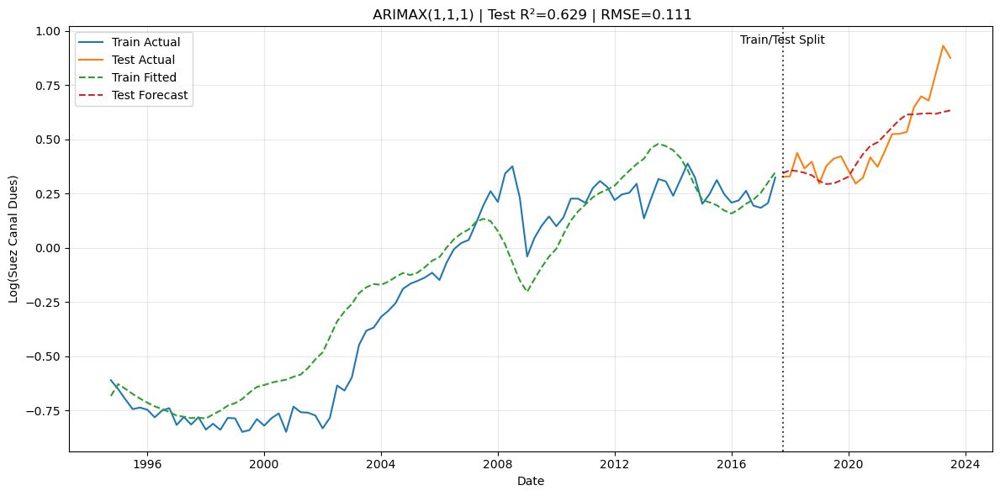


MODEL SUMMARY: ARIMAX(1, 0, 1)
                                SARIMAX Results                                
Dep. Variable:     Log_Suez_Canal_dues   No. Observations:                   92
Model:                SARIMAX(1, 0, 1)   Log Likelihood                 122.836
Date:                 Sun, 31 Aug 2025   AIC                           -235.672
Time:                         09:58:22   BIC                           -223.173
Sample:                     10-01-1994   HQIC                          -230.632
                          - 07-01-2017                                         
Covariance Type:                   opg                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Log_World_GDP              1.0312      0.101     10.190      0.000       0.833       1.230
CRUDE_OIL_PRICE_DOLLAR     0.0032      0.001      2.513

In [524]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# ================================
# 0) DATA PREP & DIFFERENCING
# ================================
df_model = df.copy()
df_model.index = pd.to_datetime(df_model.index)
df_model = df_model.sort_index()

# Log transform target
df_model["Log_Suez_Canal_dues"] = np.log(df_model["Suez_Canal_dues"])

# Exogenous variables
exog_cols = ["Log_World_GDP", "CRUDE_OIL_PRICE_DOLLAR"]

# Differencing (target + exogenous)
y_diff = df_model["Log_Suez_Canal_dues"].diff().dropna()
X_diff = df_model[exog_cols].diff().dropna()

# Align after differencing
df_diff = pd.concat([y_diff, X_diff], axis=1).dropna()
y = df_diff["Log_Suez_Canal_dues"]
X = df_diff[exog_cols]

# ================================
# 1) TRAIN/TEST SPLIT
# ================================
split_idx = int(len(df_diff) * 0.8)
y_train, y_test = y.iloc[:split_idx], y.iloc[split_idx:]
X_train, X_test = X.iloc[:split_idx], X.iloc[split_idx:]

print(f"\nTrain: {y_train.index[0]} → {y_train.index[-1]}  (n={len(y_train)})")
print(f"Test : {y_test.index[0]} → {y_test.index[-1]}  (n={len(y_test)})")

# ================================
# 2) HELPER: fit/evaluate on ORIGINAL SCALE
# ================================
def eval_model(order):
    try:
        m = SARIMAX(y_train, exog=X_train, order=order,
                    enforce_stationarity=False, enforce_invertibility=False)
        res = m.fit(disp=False)

        # Predictions in differenced space
        yhat_train_diff = res.get_prediction(exog=X_train).predicted_mean
        yhat_test_diff  = res.get_forecast(steps=len(y_test), exog=X_test).predicted_mean

        # --- Reconstruct to log-level ---
        # Train reconstruction
        start_value_train = df_model["Log_Suez_Canal_dues"].iloc[0]
        yhat_train_level = yhat_train_diff.cumsum() + start_value_train

        # Test reconstruction
        start_value_test = df_model["Log_Suez_Canal_dues"].iloc[split_idx]
        yhat_test_level = yhat_test_diff.cumsum() + start_value_test

        # True values in log-level
        y_train_level = df_model["Log_Suez_Canal_dues"].iloc[1:split_idx+1]
        y_test_level  = df_model["Log_Suez_Canal_dues"].iloc[split_idx+1:]

        # --- Metrics on log-level ---
        train_r2 = r2_score(y_train_level, yhat_train_level)
        test_r2  = r2_score(y_test_level,  yhat_test_level)
        rmse     = np.sqrt(mean_squared_error(y_test_level, yhat_test_level))
        mae      = mean_absolute_error(y_test_level, yhat_test_level)
        mape     = (np.abs((y_test_level - yhat_test_level) / y_test_level)
                    .replace([np.inf, -np.inf], np.nan)).dropna().mean() * 100

        return {
            "order": order,
            "aic": res.aic,
            "train_r2": train_r2,
            "test_r2": test_r2,
            "rmse": rmse,
            "mae": mae,
            "mape": mape,
            "res": res,
            "train_pred": yhat_train_level,
            "test_pred": yhat_test_level
        }
    except Exception as e:
        return {"order": order, "error": str(e)}

# ================================
# 3) RUN CANDIDATE ORDERS
# ================================
orders = [(1,0,0), (1,0,1), (2,0,1), (1,0,2), (2,0,2)]
results = [eval_model(od) for od in orders]

# Filter successful fits
ok   = [r for r in results if "error" not in r]
fail = [r for r in results if "error" in r]

if fail:
    print("\nModels that failed:")
    for r in fail:
        print(f"- {r['order']}: {r['error']}")

if not ok:
    raise RuntimeError("No models converged.")

# ================================
# 4) RESULTS TABLE
# ================================
tbl = (pd.DataFrame([{k:v for k,v in r.items() if k in
         ["order","aic","train_r2","test_r2","rmse","mae","mape"]} for r in ok])
       .sort_values(["rmse","aic"]).reset_index(drop=True))

print("\n=== ALL MODELS (metrics on ORIGINAL log series) ===")
print(tbl.to_string(index=True, justify="left", float_format=lambda x: f"{x:,.4f}"))

# Pick best by RMSE
best = min(ok, key=lambda r: r["rmse"])

print("\n=== BEST MODEL ===")
print(f"ARIMAX{best['order']} | RMSE={best['rmse']:.4f} | MAE={best['mae']:.4f} | "
      f"MAPE={best['mape']:.2f}% | Test R²={best['test_r2']:.3f} | "
      f"Train R²={best['train_r2']:.3f} | AIC={best['aic']:.1f}")

# ================================
# 5) PLOT BEST (on original log scale)
# ================================
plt.figure(figsize=(12,6))
plt.plot(df_model.index[1:split_idx+1], df_model["Log_Suez_Canal_dues"].iloc[1:split_idx+1], label="Train Actual")
plt.plot(df_model.index[split_idx+1:], df_model["Log_Suez_Canal_dues"].iloc[split_idx+1:], label="Test Actual")
plt.plot(best["train_pred"].index, best["train_pred"], '--', label="Train Fitted")
plt.plot(best["test_pred"].index, best["test_pred"], '--', label="Test Forecast")

split_date = y_test.index[0]
plt.axvline(x=split_date, color="black", linestyle=":", alpha=0.7)
plt.text(split_date, plt.ylim()[1]*0.92, "Train/Test Split", ha="center")

plt.title(f" ARIMAX(1,1,1) | Test R²={best['test_r2']:.3f} | RMSE={best['rmse']:.3f}")
plt.xlabel("Date"); plt.ylabel("Log(Suez Canal Dues)")
plt.legend(); plt.grid(True, alpha=0.3); plt.tight_layout()
plt.show()

# ================================
# 6) SUMMARY OF BEST
# ================================
print("\n" + "="*60)
print(f"MODEL SUMMARY: ARIMAX{best['order']}")
print("="*60)
print(best["res"].summary())


## GRU

Total number of parameter combinations: 128
Loaded 35 previous results from checkpoint
Starting grid search for Suez Canal dues prediction...
Skipping combination 1/128 (already completed)
Skipping combination 2/128 (already completed)
Skipping combination 3/128 (already completed)
Skipping combination 4/128 (already completed)
Skipping combination 5/128 (already completed)
Skipping combination 6/128 (already completed)
Skipping combination 7/128 (already completed)
Skipping combination 8/128 (already completed)
Skipping combination 9/128 (already completed)
Skipping combination 10/128 (already completed)
Skipping combination 11/128 (already completed)
Skipping combination 12/128 (already completed)
Skipping combination 13/128 (already completed)
Skipping combination 14/128 (already completed)
Skipping combination 15/128 (already completed)
Skipping combination 16/128 (already completed)
Skipping combination 17/128 (already completed)
Skipping combination 18/128 (already completed)
Ski

Model saved as 'suez_gru_model.h5'


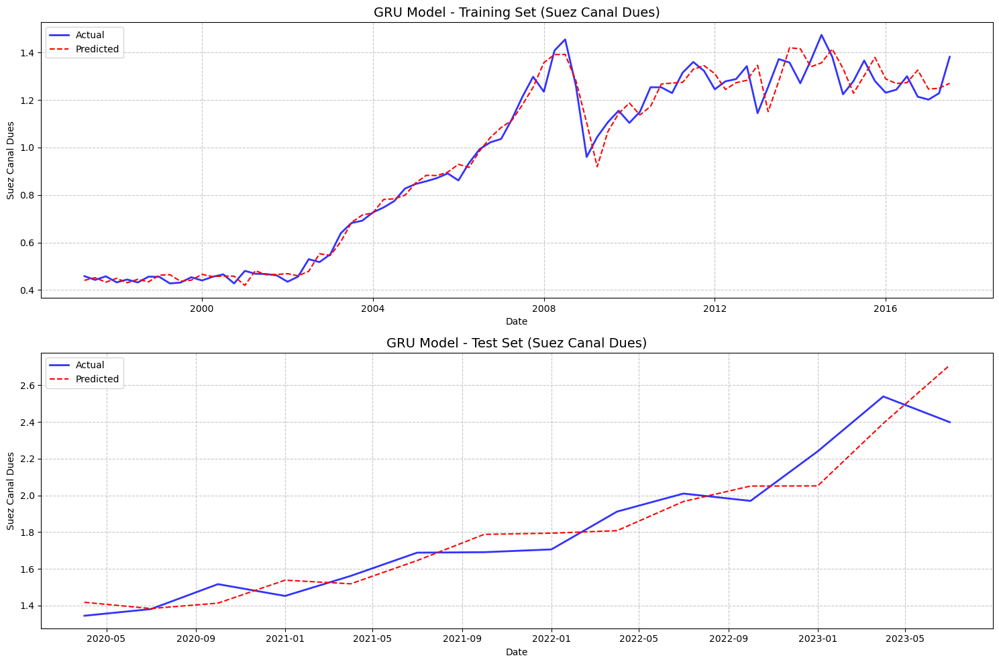


GRU Model Performance (Original Scale - Suez Canal Dues):
Train RMSE: 0.0552 | Test RMSE: 0.0594
Train R²: 0.9846 | Test R²: 0.9072

Model comparison saved to 'suez_model_comparison.csv'

Suez Canal dues prediction completed successfully!


In [25]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import os, time, ast
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import ParameterGrid

# =============== Set Random Seeds for Reproducibility =================
SEED = 123
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["Log_Suez_Canal_dues"] = np.log(df_model["Suez_Canal_dues"])

# Define exogenous variables
exog_vars = ["Log_World_GDP", "CRUDE_OIL_PRICE_DOLLAR"]
target = "Log_Suez_Canal_dues"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables
for var in exog_vars:
    df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# Scale features using training data only
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# =============== Helper Functions ====================
def make_sequences(X_scaled, y_series, idx, timesteps):
    """Create sequences for RNN training"""
    X_seq, y_seq, idx_used = [], [], []
    for i in range(timesteps, len(X_scaled)):
        X_seq.append(X_scaled[i - timesteps:i])
        y_seq.append(y_series.iloc[i])
        idx_used.append(idx[i])
    return np.array(X_seq), np.array(y_seq), pd.Index(idx_used)

def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def build_model(params, input_dim, timesteps):
    """Build GRU model with specified parameters"""
    model = Sequential()
    return_sequences = params['layers'] > 1
    
    # First GRU layer
    model.add(GRU(params['units'], input_shape=(timesteps, input_dim),
                  return_sequences=return_sequences, activation='tanh'))
    
    # Add dropout if specified
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    
    # Add second GRU layer if specified
    if params['layers'] > 1:
        model.add(GRU(params['units'] // 2, return_sequences=False, activation='tanh'))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    
    # Output layer
    model.add(Dense(1))
    
    # Compile model
    opt = Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=opt, loss='mse')
    return model

def evaluate_on_both_scales(model, X_train_seq, y_train_seq, idx_train_used,
                            X_test_seq, y_test_seq, idx_test_used):
    """Evaluate model performance on both differenced and original scales"""
    # Predictions in differenced space
    ytr_pred_d = model.predict(X_train_seq, verbose=0).flatten()
    yte_pred_d = model.predict(X_test_seq, verbose=0).flatten()

    # Metrics for differenced data
    train_rmse_diff = np.sqrt(mean_squared_error(y_train_seq, ytr_pred_d))
    test_rmse_diff = np.sqrt(mean_squared_error(y_test_seq, yte_pred_d))
    train_mae_diff = mean_absolute_error(y_train_seq, ytr_pred_d)
    test_mae_diff = mean_absolute_error(y_test_seq, yte_pred_d)
    train_r2_diff = r2_score(y_train_seq, ytr_pred_d)
    test_r2_diff = r2_score(y_test_seq, yte_pred_d)

    # Convert back to original scale
    ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_train_used)
    yte_hat = inverse_differencing(original_target, yte_pred_d, idx_test_used)
    ytr_true = original_target.loc[idx_train_used]
    yte_true = original_target.loc[idx_test_used]

    # Metrics for original scale
    train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
    test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
    train_r2_orig = r2_score(ytr_true, ytr_hat)
    test_r2_orig = r2_score(yte_true, yte_hat)

    return {
        'train_rmse_diff': train_rmse_diff, 'test_rmse_diff': test_rmse_diff,
        'train_mae_diff': train_mae_diff, 'test_mae_diff': test_mae_diff,
        'train_r2_diff': train_r2_diff, 'test_r2_diff': test_r2_diff,
        'train_rmse_orig': train_rmse_orig, 'test_rmse_orig': test_rmse_orig,
        'train_r2_orig': train_r2_orig, 'test_r2_orig': test_r2_orig
    }

# =============== Hyperparameter Grid =======================
param_grid = {
    'rnn_type': ['GRU'],            # keep GRU only
    'units': [20, 40],
    'layers': [1, 2],
    'dropout': [0.0, 0.2],
    'timesteps': [5, 10],
    'batch_size': [8, 16],
    'learning_rate': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop']
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
checkpoint_file = 'suez_gru_grid_search_checkpoint.csv'
results = []

# Load previous results if available
if os.path.exists(checkpoint_file):
    try:
        checkpoint_df = pd.read_csv(checkpoint_file)
        if 'params' in checkpoint_df.columns:
            checkpoint_df['params'] = checkpoint_df['params'].apply(
                lambda x: ast.literal_eval(x) if isinstance(x, str) else x
            )
        results = checkpoint_df.to_dict('records')
        print(f"Loaded {len(results)} previous results from checkpoint")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")

def save_checkpoint_row(row):
    """Save a row of results to checkpoint file"""
    df_row = pd.DataFrame([row]).copy()
    if 'params' in df_row.columns:
        df_row['params'] = df_row['params'].astype(str)
    if not os.path.exists(checkpoint_file):
        df_row.to_csv(checkpoint_file, index=False)
    else:
        df_row.to_csv(checkpoint_file, mode='a', header=False, index=False)

# Track best model during grid search
BEST_WEIGHTS_PATH = 'best_gru_suez_model.weights.h5'
best_original_test_r2 = -np.inf
best_row = None

print("Starting grid search for Suez Canal dues prediction...")
for i, params in enumerate(all_params, start=1):
    # Skip already completed parameter combinations
    if any(str(params) == str(r.get('params')) for r in results):
        print(f"Skipping combination {i}/{len(all_params)} (already completed)")
        continue

    print(f"Testing combination {i}/{len(all_params)}: {params}")
    timesteps = params['timesteps']

    # Create sequences
    Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
    Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled, y_test, test_indices, timesteps)

    # Build and train model
    model = build_model(params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
    
    # Callbacks
    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    tmp_ckpt = f"_tmp_suez_{i}.weights.h5"
    checkpoint = ModelCheckpoint(tmp_ckpt, monitor='val_loss', save_best_only=True, 
                                save_weights_only=True, verbose=0)

    # Train model
    t0 = time.time()
    history = model.fit(
        Xtr_seq, ytr_seq,
        validation_data=(Xte_seq, yte_seq),
        epochs=200,
        batch_size=params['batch_size'],
        callbacks=[early_stop, checkpoint],
        verbose=0
    )
    train_time = time.time() - t0
    
    # Load best weights for this parameter combination
    if os.path.exists(tmp_ckpt):
        model.load_weights(tmp_ckpt)

    # Calculate validation loss (average of last 5 epochs)
    val_loss = np.mean(history.history['val_loss'][-5:]) if len(history.history['val_loss']) >= 5 else history.history['val_loss'][-1]

    # Evaluate model
    metrics = evaluate_on_both_scales(model, Xtr_seq, ytr_seq, idx_tr_used, Xte_seq, yte_seq, idx_te_used)

    # Store results
    row = {
        'params': params,
        'val_loss': val_loss,
        'epochs_used': len(history.history['loss']),
        'training_time': train_time,
        **metrics
    }
    results.append(row)
    save_checkpoint_row(row)

    print(f"  Diff Test R²: {metrics['test_r2_diff']:.4f} | Orig Test R²: {metrics['test_r2_orig']:.4f}")

    # Update best model if this one is better
    if metrics['test_r2_orig'] > best_original_test_r2:
        best_original_test_r2 = metrics['test_r2_orig']
        best_row = row.copy()
        model.save_weights(BEST_WEIGHTS_PATH)
    
    # Clean up temporary checkpoint
    try:
        if os.path.exists(tmp_ckpt):
            os.remove(tmp_ckpt)
    except:
        pass

# Save full results
results_df = pd.DataFrame(results)
results_df.to_csv('suez_gru_grid_search_results.csv', index=False)
print("Grid search results saved to 'suez_gru_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_row is None:
    raise SystemExit("No valid results from grid search.")

best_params = best_row['params']
print("\nBest GRU model for Suez Canal dues prediction:")
print("Parameters:", best_params)
print(f"Test R² (original): {best_row['test_r2_orig']:.4f}")

# Rebuild and evaluate the best model
timesteps = best_params['timesteps']
Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled, y_test, test_indices, timesteps)

model = build_model(best_params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
model.load_weights(BEST_WEIGHTS_PATH)

# Make predictions
ytr_pred_d = model.predict(Xtr_seq, verbose=0).flatten()
yte_pred_d = model.predict(Xte_seq, verbose=0).flatten()

# Convert back to original scale
ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_tr_used)
yte_hat = inverse_differencing(original_target, yte_pred_d, idx_te_used)
ytr_true = original_target.loc[idx_tr_used]
yte_true = original_target.loc[idx_te_used]

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("suez_gru_train_preds.csv", index=False)
test_df.to_csv("suez_gru_test_preds.csv", index=False)
all_preds.to_csv("suez_gru_predictions.csv", index=False)

# Save model
model.save("suez_gru_model.h5")
print("Model saved as 'suez_gru_model.h5'")

# =============== Plot Results =================
plt.figure(figsize=(15, 10))

# Training set
plt.subplot(2, 1, 1)
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted', linewidth=1.5)
plt.title('GRU Model - Training Set (Suez Canal Dues)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Suez Canal Dues')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Test set
plt.subplot(2, 1, 2)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', label='Predicted', linewidth=1.5)
plt.title('GRU Model - Test Set (Suez Canal Dues)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Suez Canal Dues')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('suez_gru_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nGRU Model Performance (Original Scale - Suez Canal Dues):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'GRU',
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'Parameters': str(best_params)
}])
comparison_df.to_csv('suez_model_comparison.csv', index=False)
print("\nModel comparison saved to 'suez_model_comparison.csv'")

print("\nSuez Canal dues prediction completed successfully!")

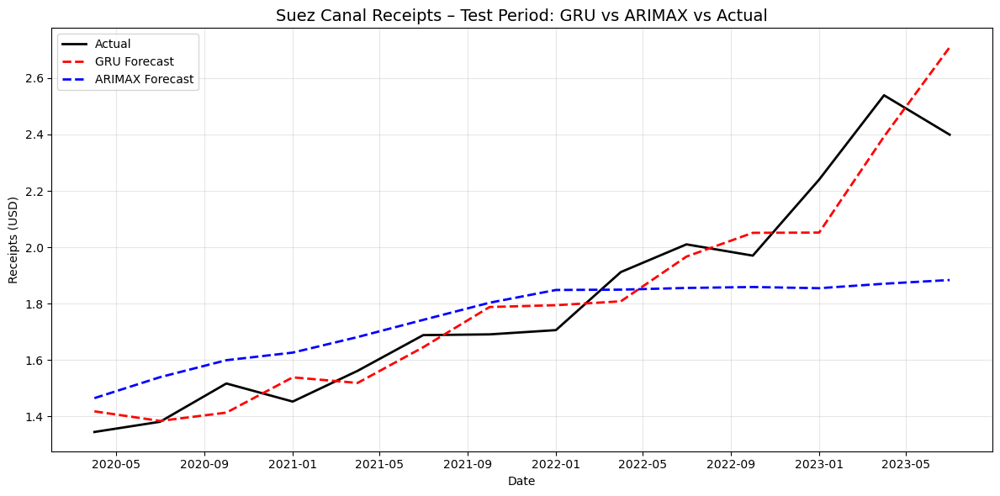

In [530]:
import matplotlib.pyplot as plt
import numpy as np

# === Load GRU test results from saved CSV ===
gru_results_path = r"C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Suez canal results\suez_gru_test_preds.csv"
gru_df = pd.read_csv(gru_results_path, parse_dates=["date"])
gru_df.set_index("date", inplace=True)

# Actual and predicted from GRU (already stored in file)
y_test_suez = np.log(gru_df["actual"])              # log scale actual
gru_test_pred_suez = np.log(gru_df["predicted"])    # log scale GRU preds

# ARIMAX test predictions (log scale, already from 'best')
arimax_test_pred_suez = best["test_pred"]

# === Align all three series on the same dates ===
common_idx = y_test_suez.index.intersection(arimax_test_pred_suez.index).intersection(gru_test_pred_suez.index)

y_test_aligned    = y_test_suez.loc[common_idx]
gru_preds_aligned = gru_test_pred_suez.loc[common_idx]
arima_preds_aligned = arimax_test_pred_suez.loc[common_idx]

# === Convert back to original USD scale ===
y_test_exp    = np.exp(y_test_aligned)
gru_preds_exp = np.exp(gru_preds_aligned)
arima_preds_exp = np.exp(arima_preds_aligned)

# === Plot Actual vs GRU vs ARIMAX ===
plt.figure(figsize=(12,6))
plt.plot(common_idx, y_test_exp, label="Actual", color="black", linewidth=2)
plt.plot(common_idx, gru_preds_exp, label="GRU Forecast", linestyle="--", color="red", linewidth=2)
plt.plot(common_idx, arima_preds_exp, label="ARIMAX Forecast", linestyle="--", color="blue", linewidth=2)

plt.title("Suez Canal Receipts – Test Period: GRU vs ARIMAX vs Actual", fontsize=14)
plt.xlabel("Date")
plt.ylabel("Receipts (USD)")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# Travel Reciepts

## OLS

                            OLS Regression Results                            
Dep. Variable:        Travel_reciepts   R-squared:                       0.478
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                     25.63
Date:                Tue, 26 Aug 2025   Prob (F-statistic):           4.32e-15
Time:                        11:04:58   Log-Likelihood:                -123.28
No. Observations:                 117   AIC:                             256.6
Df Residuals:                     112   BIC:                             270.4
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  -21.5693 

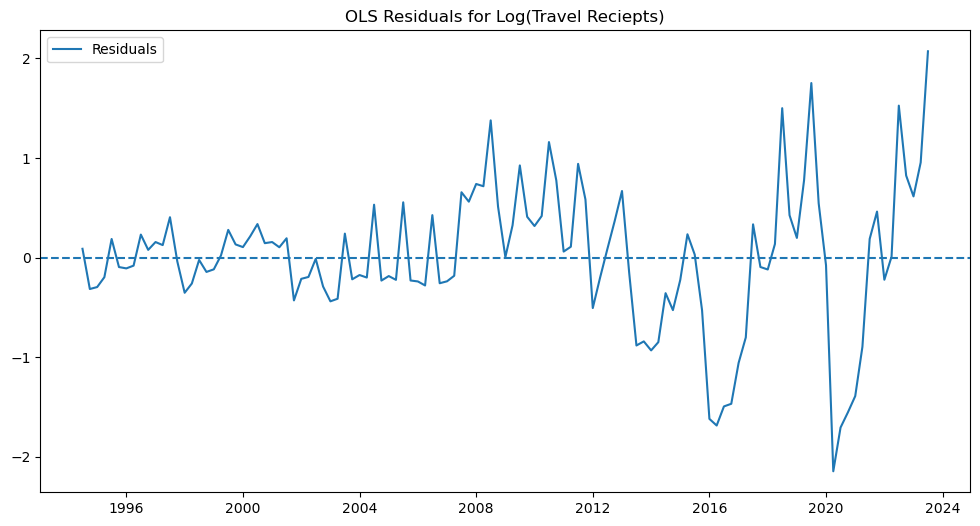

In [47]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ========================
# 0. DATA PREP
# ========================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index).sort_values()

# Target: log of Travel Reciepts (kept as in your script)
df1["Log_Travel"] = np.log(df1["Travel_reciepts"])

# ========================
# Domestic & International Shock Dummies
# ========================
# Domestic shocks: 2011 (revolution), 2013 (political transition), 2015 (Russian plane incident)
df1["Domestic_Shocks"] = df1.index.year.isin([2011, 2013, 2015]).astype(int)

# International shocks: 2008 (GFC), 2020 (COVID-19), 2022 (Russia–Ukraine war / global inflation)
df1["International_Shocks"] = df1.index.year.isin([2008, 2020, 2022]).astype(int)

# ========================
# 1. OLS MODEL
# ========================
exog_vars = ["Log_World_GDP", "Exchange_rate_EG_US", "Domestic_Shocks", "International_Shocks"]
X = sm.add_constant(df1[exog_vars])
y = df1["Travel_reciepts"]

ols_model = sm.OLS(y, X, missing="drop").fit()

print(ols_model.summary())

# ========================
# 2. Residual Diagnostics
# ========================
fig = plt.figure(figsize=(12,6))
plt.plot(ols_model.resid, label="Residuals")
plt.axhline(0, linestyle="--")
plt.title("OLS Residuals for Log(Travel Reciepts)")
plt.legend()
plt.show()


In [41]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ========================
# 0. MULTICOLLINEARITY (VIF)
# ========================
exog_vars = ["Log_World_GDP", "Exchange_rate_EG_US", 
             "Domestic_Shocks", "International_Shocks"]

X = sm.add_constant(df1[exog_vars])  # add constant for VIF as in regression

vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


               Variable          VIF
0                 const  2113.256057
1         Log_World_GDP     3.224530
2   Exchange_rate_EG_US     2.873955
3       Domestic_Shocks     1.282954
4  International_Shocks     1.153997


                            OLS Regression Results                            
Dep. Variable:             Log_Travel   R-squared:                       0.472
Model:                            OLS   Adj. R-squared:                  0.458
Method:                 Least Squares   F-statistic:                     33.67
Date:                Sun, 31 Aug 2025   Prob (F-statistic):           1.27e-15
Time:                        11:20:27   Log-Likelihood:                -67.442
No. Observations:                 117   AIC:                             142.9
Df Residuals:                     113   BIC:                             153.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  -11.5758 

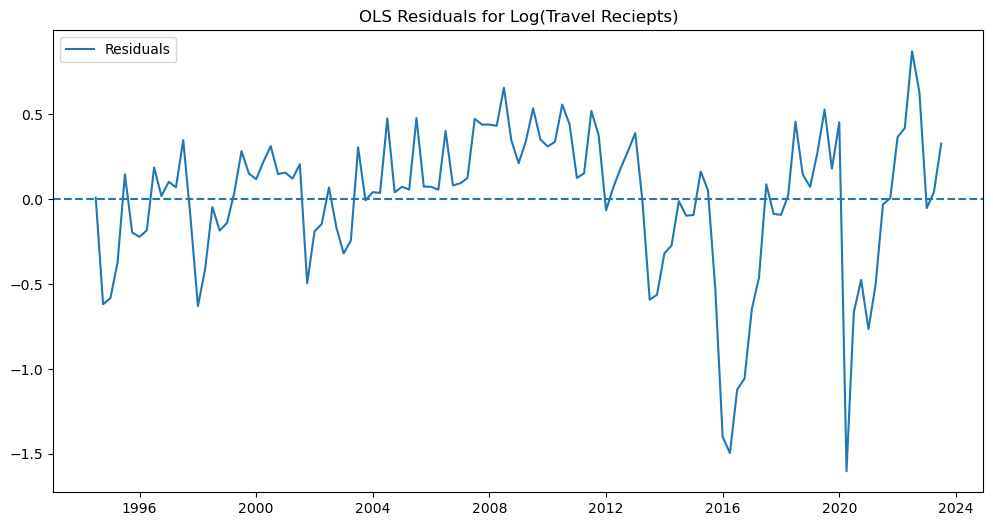

In [35]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ========================
# 0. DATA PREP
# ========================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index).sort_values()

# Target: log of Travel Reciepts 
df1["Log_Travel"] = np.log(df1["Travel_reciepts"])

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df1["Post2016"] = (df1.index >= "2016-11-01").astype(int)
df1["ER_Post2016"] = df1["Exchange_rate_EG_US"] * df1["Post2016"]

# ========================
# Domestic & International Shock Dummies
# ========================
# Domestic shocks: 2011 (revolution), 2013 (political transition), 2015 (Russian plane incident)
df1["Domestic_Shocks"] = df1.index.year.isin([2011, 2013,2015]).astype(int)

# International shocks: 2008 (GFC), 2020 (COVID-19), 2022 (Russia–Ukraine war / global inflation)
df1["International_Shocks"] = df1.index.year.isin([2020, 2022]).astype(int)

# ========================
# 1. OLS MODEL
# ========================
exog_vars = ["Log_World_GDP", "Domestic_Shocks", "International_Shocks"]
X = sm.add_constant(df1[exog_vars])
y = df1["Log_Travel"]

ols_model = sm.OLS(y, X, missing="drop").fit()

print(ols_model.summary())

# ========================
# 2. Residual Diagnostics
# ========================
fig = plt.figure(figsize=(12,6))
plt.plot(ols_model.resid, label="Residuals")
plt.axhline(0, linestyle="--")
plt.title("OLS Residuals for Log(Travel Reciepts)")
plt.legend()
plt.show()


In [59]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ========================
# 0. MULTICOLLINEARITY (VIF)
# ========================
exog_vars = ["Log_World_GDP", "ER_Post2016", 
             "Domestic_Shocks", "International_Shocks" ]

X = sm.add_constant(df1[exog_vars])  # add constant for VIF as in regression

vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


               Variable          VIF
0                 const  1486.188276
1         Log_World_GDP     2.153643
2           ER_Post2016     2.031805
3       Domestic_Shocks     1.309080
4  International_Shocks     1.152195


                            OLS Regression Results                            
Dep. Variable:        Travel_reciepts   R-squared:                       0.754
Model:                            OLS   Adj. R-squared:                  0.745
Method:                 Least Squares   F-statistic:                     84.85
Date:                Sun, 31 Aug 2025   Prob (F-statistic):           7.47e-33
Time:                        11:20:38   Log-Likelihood:                -78.697
No. Observations:                 116   AIC:                             167.4
Df Residuals:                     111   BIC:                             181.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -7.0361 

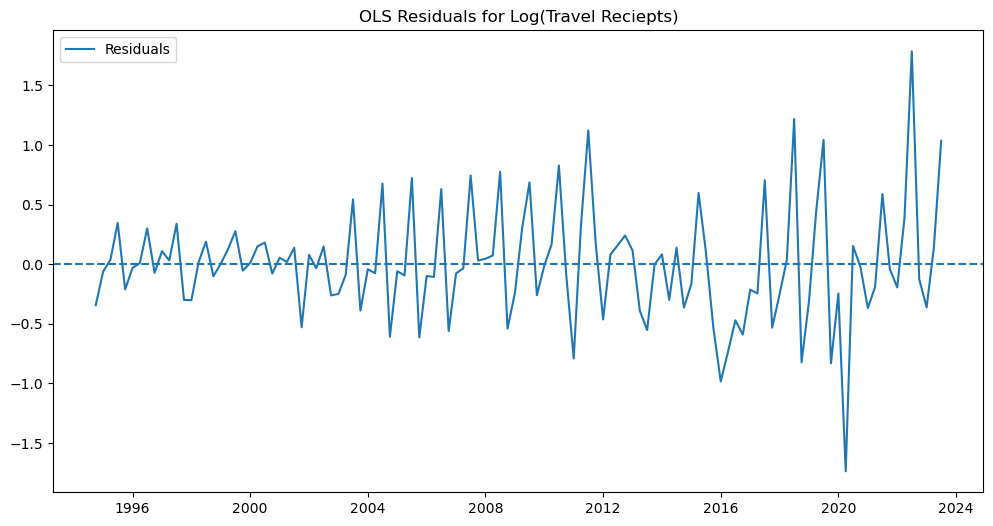

In [37]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ========================
# 0. DATA PREP
# ========================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index).sort_values()

# Target: log of Travel Reciepts 
df1["Log_Travel"] = np.log(df1["Travel_reciepts"])

# Optional: keep these ready if you want to add interaction later
df1["Post2016"] = (df1.index >= "2016-11-01").astype(int)
df1["ER_Post2016"] = df1["Exchange_rate_EG_US"] * df1["Post2016"]

# ========================
# Separate dummies for each incident (one dummy per event)
# ========================
# Domestic events
df1["D_2011"] = (df1.index.year == 2011).astype(int)
df1["D_2013"] = (df1.index.year == 2013).astype(int)
df1["D_2015"] = (df1.index.year == 2015).astype(int)

# International events
df1["D_2008"] = (df1.index.year == 2008).astype(int)  # GFC
df1["D_2020"] = (df1.index.year == 2020).astype(int)  # COVID-19
df1["D_2022"] = (df1.index.year == 2022).astype(int)  # Russia–Ukraine / global inflation


# Domestic shocks: 2011 (revolution), 2013 (political transition), 2015 (Russian plane incident)
df1["Domestic_Shocks"] = df1.index.year.isin([2011, 2013,2015]).astype(int)

# International shocks: 2008 (GFC), 2020 (COVID-19), 2022 (Russia–Ukraine war / global inflation)
df1["International_Shocks"] = df1.index.year.isin([2020, 2022]).astype(int)


# ========================
# Add lag of Travel Receipts (levels)
# ========================
df1["Travel_reciepts_lag1"] = df1["Travel_reciepts"].shift(1)

# ========================
# 1. OLS MODEL
# ========================
# Use Log_World_GDP + individual event dummies + lagged Travel Receipts
exog_vars = [
    "Log_World_GDP", "Domestic_Shocks", "International_Shocks", "Travel_reciepts_lag1"
]
X = sm.add_constant(df1[exog_vars])
y = df1["Travel_reciepts"]

ols_model = sm.OLS(y, X, missing="drop").fit()
print(ols_model.summary())

# ========================
# 2. Residual Diagnostics
# ========================
fig = plt.figure(figsize=(12,6))
plt.plot(ols_model.resid, label="Residuals")
plt.axhline(0, linestyle="--")
plt.title("OLS Residuals for Log(Travel Reciepts)")
plt.legend()
plt.show()

# ========================
# (Optional) If you prefer lagged log target instead of levels, uncomment:
# df1["Log_Travel_lag1"] = df1["Log_Travel"].shift(1)
# exog_vars_log = ["Log_World_GDP", "D_2013", "D_2015", "D_2020", "Log_Travel_lag1"]
# X_log = sm.add_constant(df1[exog_vars_log])
# y_log = df1["Log_Travel"]
# ols_log = sm.OLS(y_log, X_log, missing="drop").fit()
# print(ols_log.summary())


In [39]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ========================
# 0. MULTICOLLINEARITY (VIF)
# ========================
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define exogenous variables (with lag included)
exog_vars = ["Log_World_GDP", "Domestic_Shocks", "International_Shocks", "Travel_reciepts_lag1"]

# Drop rows with NaN caused by lagging
X = sm.add_constant(df1[exog_vars]).dropna()

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)



               Variable          VIF
0                 const  1353.289001
1         Log_World_GDP     2.039734
2       Domestic_Shocks     1.091912
3  International_Shocks     1.193137
4  Travel_reciepts_lag1     1.730941


## Arima X

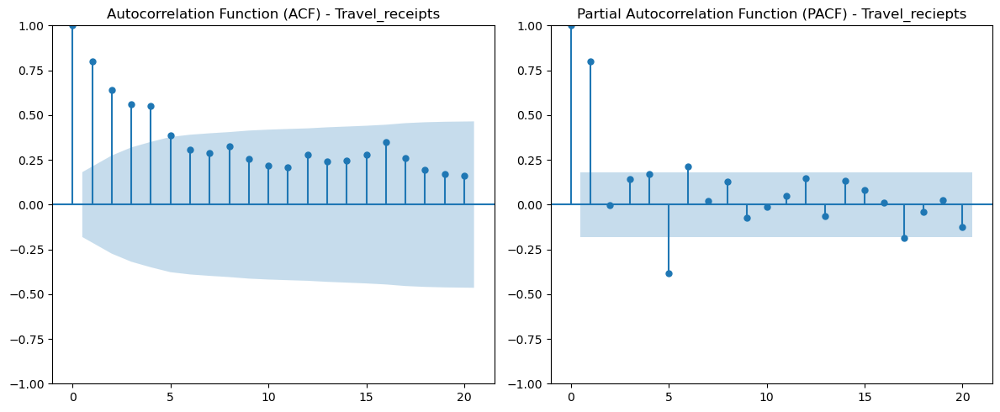

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Plot ACF and PACF for Imports (raw, untransformed)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(df['Travel_reciepts'].dropna(), lags=20, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF) - Travel_receipts')

plot_pacf(df['Travel_reciepts'].dropna(), lags=20, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF) - Travel_reciepts')

plt.tight_layout()
plt.show()


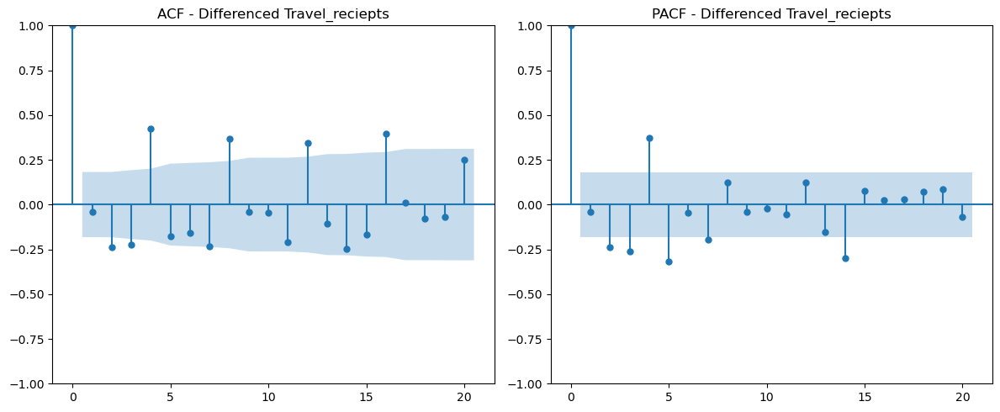

In [43]:
# Compute first difference and drop NaNs
diff_Travel_reciepts = df['Travel_reciepts'].diff().dropna()

# Plot ACF and PACF for differenced Travel_reciepts
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(diff_Travel_reciepts, lags=20, ax=ax[0], title='ACF - Differenced Travel_reciepts')
plot_pacf(diff_Travel_reciepts, lags=20, ax=ax[1], title='PACF - Differenced Travel_reciepts')

plt.tight_layout()
plt.show()

Train: 1994-07-01 00:00:00 → 2017-07-01 00:00:00  (n=93)
Test : 2017-10-01 00:00:00 → 2023-07-01 00:00:00  (n=24)
Running model grid search...
Completed 1/200 combinations
Completed 6/200 combinations
Completed 11/200 combinations
Completed 16/200 combinations
Completed 21/200 combinations
Completed 26/200 combinations
Completed 31/200 combinations
Completed 36/200 combinations
Completed 41/200 combinations
Completed 46/200 combinations
Completed 51/200 combinations
Completed 56/200 combinations
Completed 61/200 combinations
Completed 66/200 combinations
Completed 71/200 combinations
Completed 76/200 combinations
Completed 81/200 combinations
Completed 86/200 combinations
Completed 91/200 combinations
Completed 96/200 combinations
Completed 101/200 combinations
Completed 106/200 combinations
Completed 111/200 combinations
Completed 116/200 combinations
Completed 121/200 combinations
Completed 126/200 combinations
Completed 131/200 combinations
Completed 136/200 combinations
Completed 1

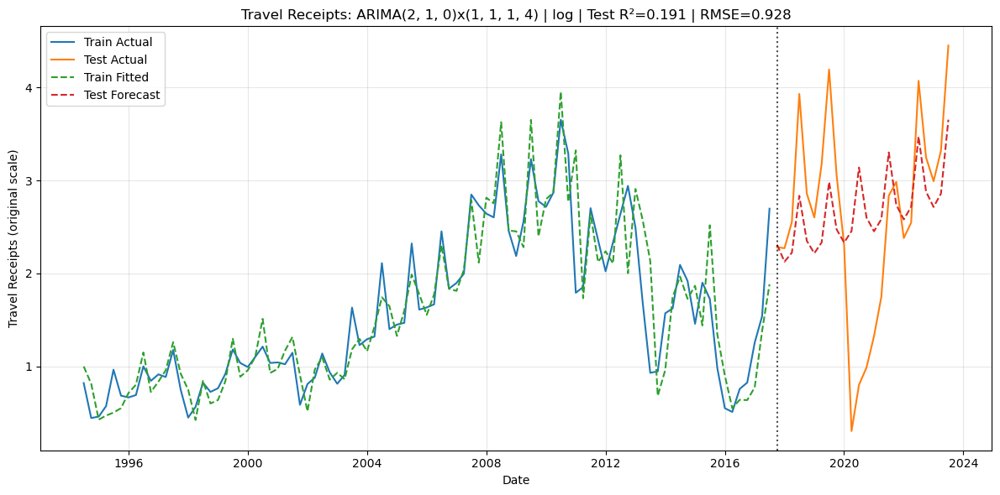


MODEL SUMMARY: ARIMA(2, 1, 0)x(1, 1, 1, 4)  |  Transform: log
                                      SARIMAX Results                                      
Dep. Variable:                          Log_Travel   No. Observations:                   93
Model:             SARIMAX(2, 1, 0)x(1, 1, [1], 4)   Log Likelihood                   2.211
Date:                             Tue, 26 Aug 2025   AIC                              5.579
Time:                                     17:25:26   BIC                             17.613
Sample:                                 07-01-1994   HQIC                            10.410
                                      - 07-01-2017                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1463      0.099      1.482

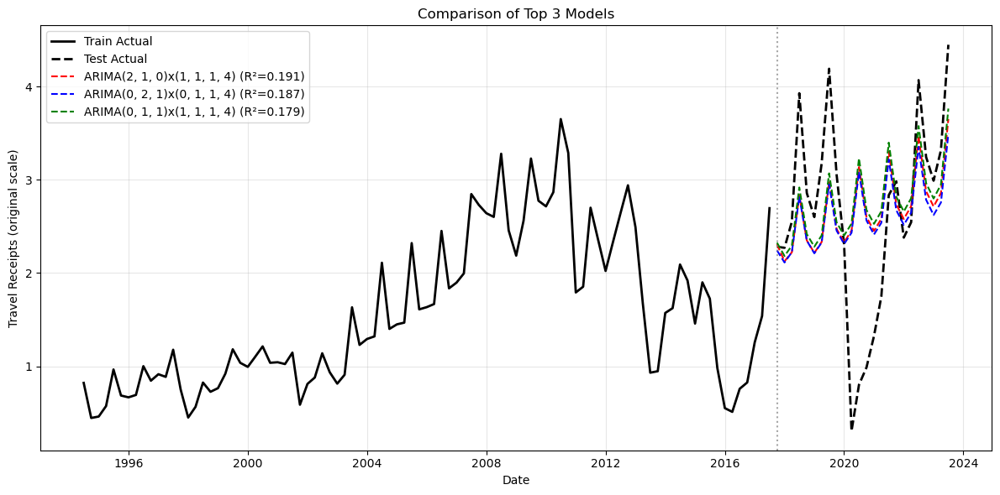

In [236]:
# ==========================================================
# Travel Receipts — ARIMA/ARIMAX with Internal/External Event Dummies
# - Separate dummies for internal vs external events
# - Time-coherent 80/20 split
# - Target transformation: log only (back-transform for plots/metrics)
# - Candidate (p,d,q) and seasonal (P,D,Q,4) models
# - With/without exogenous regressors
# - Prints ALL trials (AIC, R² train/test, RMSE, MAE, MAPE)
# - Selects best by Test R², then Train R², then AIC
# - Plots Actual vs Fitted/Forecast on ORIGINAL scale
# - Prints best model summary
# ==========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# -------------------------------
# 0) DATA PREP
# -------------------------------
df1 = df.copy()
df1.index = pd.to_datetime(df1.index)
df1 = df1.sort_index()

# Ensure strictly positive target for log
TARGET = "Travel_reciepts"
df1 = df1[df1[TARGET] > 0].copy()

# Log target (used for estimation)
df1["Log_Travel"] = np.log(df1[TARGET])

# --- SEPARATE DUMMIES FOR INTERNAL VS EXTERNAL EVENTS ---
# Internal events (domestic)
df1["Internal_Dummy"] = (
    (df1.index.year == 2011) |  # Domestic event 2011
    (df1.index.year == 2013) |  # Domestic event 2013  
    (df1.index.year == 2015)    # Domestic event 2015
).astype(int)

# External events (global)
df1["External_Dummy"] = (
    (df1.index.year == 2008) |  # Global Financial Crisis
    (df1.index.year == 2020) |  # COVID-19 pandemic
    (df1.index.year == 2022)    # Russia-Ukraine conflict
).astype(int)

# Additional focused COVID dummy for Q2 2020
df1["COVID_Q22020"] = ((df1.index >= pd.Timestamp("2020-04-01")) &
                       (df1.index <= pd.Timestamp("2020-06-30"))).astype(int)

# Exogenous set (include only those available)
exog_cols = []
if "Log_World_GDP" in df1.columns:
    exog_cols.append("Log_World_GDP")
    
# Add event dummies
for col in ["Internal_Dummy", "External_Dummy"]:
    if col in df1.columns:
        exog_cols.append(col)

# Add economic indicators if available
economic_indicators = ["Exchange_rate_EG_US", "Inflation_rate", "Unemployment_rate"]
for indicator in economic_indicators:
    if indicator in df1.columns:
        exog_cols.append(indicator)

y_all = df1["Log_Travel"].copy()
X_all = df1[exog_cols].copy() if exog_cols else None

# Align and drop NA jointly (no leakage)
data = pd.concat([y_all, X_all], axis=1) if X_all is not None else y_all.to_frame()
data = data.dropna()
y_all = data["Log_Travel"]
X_all = data[exog_cols] if exog_cols else None

# -------------------------------
# 1) TRAIN / TEST SPLIT (time-coherent 80/20)
# -------------------------------
split_idx = int(len(y_all) * 0.8)
y_train, y_test = y_all.iloc[:split_idx], y_all.iloc[split_idx:]
if X_all is not None:
    X_train, X_test = X_all.iloc[:split_idx], X_all.iloc[split_idx:]
else:
    X_train = X_test = None

print(f"Train: {y_train.index[0]} → {y_train.index[-1]}  (n={len(y_train)})")
print(f"Test : {y_test.index[0]} → {y_test.index[-1]}  (n={len(y_test)})")

# -------------------------------
# 2) Candidate orders
# -------------------------------
pdq_list = [
    (0,1,1), (1,1,0), (1,1,1), (0,1,2), (2,1,0), (2,1,1), (2,1,2),
    (0,0,1), (1,0,0), (1,0,1), (2,0,0), (2,0,1), (2,0,2),
    (0,2,1), (1,2,0), (1,2,1), (0,2,2), (2,2,0), (2,2,1), (2,2,2)
]

seasonal_list = [
    None, 
    (0,1,1,4), (1,1,0,4), (1,1,1,4),
    (0,0,1,4), (1,0,0,4), (1,0,1,4),
    (0,1,0,4), (1,1,0,4), (2,1,0,4)
]

# -------------------------------
# 3) Helper: fit/evaluate one model (estimation on LOG scale)
# -------------------------------
def eval_model(pdq, seas=None, use_exog=True):
    try:
        m = SARIMAX(
            endog=y_train,
            exog=(X_train if use_exog else None),
            order=pdq,
            seasonal_order=seas if seas is not None else (0,0,0,0),
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        res = m.fit(disp=False, maxiter=200)

        # Predictions on LOG scale
        if use_exog:
            yhat_tr_log = res.get_prediction(exog=X_train).predicted_mean
            yhat_te_log = res.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        else:
            yhat_tr_log = res.get_prediction().predicted_mean
            yhat_te_log = res.get_forecast(steps=len(y_test)).predicted_mean
            yhat_te_log.index = y_test.index

        # Back-transform to ORIGINAL scale for metrics/plot
        y_train_orig = np.exp(y_train)
        y_test_orig  = np.exp(y_test)
        yhat_tr      = np.exp(yhat_tr_log)
        yhat_te      = np.exp(yhat_te_log)

        # Metrics on ORIGINAL scale
        train_r2 = r2_score(y_train_orig, yhat_tr.loc[y_train.index])
        test_r2  = r2_score(y_test_orig,  yhat_te.loc[y_test.index])
        rmse     = np.sqrt(mean_squared_error(y_test_orig, yhat_te.loc[y_test.index]))
        mae      = mean_absolute_error(y_test_orig, yhat_te.loc[y_test.index])
        mape     = (np.abs((y_test_orig - yhat_te.loc[y_test.index]) / y_test_orig)
                    .replace([np.inf, -np.inf], np.nan)).dropna().mean() * 100

        return {
            "transform": "log",
            "use_exog": use_exog,
            "order": pdq,
            "seasonal_order": seas,
            "model_name": f"{'ARIMAX' if use_exog else 'ARIMA'}{pdq}" + (f"x{seas}" if seas else ""),
            "aic": res.aic,
            "train_r2": train_r2,
            "test_r2": test_r2,
            "rmse": rmse,
            "mae": mae,
            "mape": mape,
            "res": res,
            "train_pred_orig": yhat_tr,
            "test_pred_orig": yhat_te
        }
    except Exception as e:
        return {"transform": "log", "use_exog": use_exog, "order": pdq,
                "seasonal_order": seas, "error": str(e)}

# -------------------------------
# 4) Grid search
# -------------------------------
results = []
print("Running model grid search...")
for i, pdq in enumerate(pdq_list):
    for j, seas in enumerate(seasonal_list):
        # Try with exogenous variables
        result = eval_model(pdq, seas, use_exog=True)
        results.append(result)
        
        # Try without exogenous variables
        result = eval_model(pdq, seas, use_exog=False)
        results.append(result)
        
        # Print progress
        if (i * len(seasonal_list) + j) % 5 == 0:
            print(f"Completed {i * len(seasonal_list) + j + 1}/{len(pdq_list) * len(seasonal_list)} combinations")

# -------------------------------
# 5) Report ALL trials
# -------------------------------
ok   = [r for r in results if "error" not in r]
fail = [r for r in results if "error" in r]

if fail:
    print(f"\n{len(fail)} models failed:")
    for r in fail[:5]:  # Show first 5 failures only
        print(f"- {r['model_name'] if 'model_name' in r else ('ARIMAX' if r['use_exog'] else 'ARIMA')}{r['order']} x {r['seasonal_order']} -> {r['error']}")
    if len(fail) > 5:
        print(f"... and {len(fail)-5} more")

tbl = (pd.DataFrame([{
            "Transform": r["transform"],
            "Model": r["model_name"],
            "Use_Exog": r["use_exog"],
            "Order(p,d,q)": r["order"],
            "Seasonal(P,D,Q,m)": r["seasonal_order"],
            "AIC": r["aic"],
            "Train_R2": r["train_r2"],
            "Test_R2": r["test_r2"],
            "RMSE": r["rmse"],
            "MAE": r["mae"],
            "MAPE(%)": r["mape"]
        } for r in ok])
       .sort_values(by=["Test_R2", "Train_R2", "AIC"], ascending=[False, False, True])
       .reset_index(drop=True))

pd.set_option("display.float_format", lambda x: f"{x:,.4f}")
print("\n=== ALL MODELS TRIED (sorted by Test R², then Train R², then AIC) ===")
print(tbl.to_string(index=True, justify="left"))

# -------------------------------
# 6) Select best (Test R² priority, then Train R², then AIC)
# -------------------------------
def sort_key(r):
    return (-r["test_r2"], -r["train_r2"], r["aic"])

best = sorted(ok, key=sort_key)[0]

print("\n=== BEST MODEL (Test R² Priority) ===")
print(f"Transform = {best['transform']}")
print(f"Model     = {best['model_name']}")
print(f"AIC       = {best['aic']:.3f}")
print(f"Train R²  = {best['train_r2']:.3f}")
print(f"Test  R²  = {best['test_r2']:.3f}")
print(f"Test RMSE = {best['rmse']:.3f} | MAE = {best['mae']:.3f} | MAPE = {best['mape']:.2f}%")

# -------------------------------
# 7) Plot Actual vs Fitted/Forecast (ORIGINAL scale)
# -------------------------------
y_train_orig = np.exp(y_train)
y_test_orig  = np.exp(y_test)

plt.figure(figsize=(12,6))
plt.plot(y_train_orig.index, y_train_orig.values, label="Train Actual")
plt.plot(y_test_orig.index,  y_test_orig.values,  label="Test Actual")
plt.plot(best["train_pred_orig"].index, best["train_pred_orig"].values, linestyle="--", label="Train Fitted")
plt.plot(best["test_pred_orig"].index,  best["test_pred_orig"].values,  linestyle="--", label="Test Forecast")
plt.axvline(x=y_test.index[0], color="black", linestyle=":", alpha=0.7)

plt.title(f"Travel Receipts: {best['model_name']} | log | Test R²={best['test_r2']:.3f} | RMSE={best['rmse']:.3f}")
plt.xlabel("Date"); plt.ylabel("Travel Receipts (original scale)")
plt.legend(); plt.grid(True, alpha=0.3); plt.tight_layout()
plt.show()

# -------------------------------
# 8) Best model summary
# -------------------------------
print("\n" + "="*70)
print(f"MODEL SUMMARY: {best['model_name']}  |  Transform: log")
print("="*70)
print(best["res"].summary())

# -------------------------------
# 9) Compare top 3 models
# -------------------------------
top_models = sorted(ok, key=sort_key)[:3]

plt.figure(figsize=(12,6))
plt.plot(y_train_orig.index, y_train_orig.values, label="Train Actual", color='black', linewidth=2)
plt.plot(y_test_orig.index, y_test_orig.values, label="Test Actual", color='black', linestyle='--', linewidth=2)

colors = ['red', 'blue', 'green']
for i, model in enumerate(top_models):
    plt.plot(model["test_pred_orig"].index, model["test_pred_orig"].values, 
             color=colors[i], linestyle='--', 
             label=f"{model['model_name']} (R²={model['test_r2']:.3f})")

plt.axvline(x=y_test.index[0], color="gray", linestyle=":", alpha=0.7)
plt.title('Comparison of Top 3 Models')
plt.xlabel('Date')
plt.ylabel('Travel Receipts (original scale)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# -------------------------------
# 10) Model coefficients analysis
# -------------------------------
if best['use_exog']:
    print("\n=== EXOGENOUS VARIABLE COEFFICIENTS ===")
    coeff_df = pd.DataFrame({
        'Variable': X_train.columns,
        'Coefficient': best['res'].params[-len(X_train.columns):],
        'P-value': best['res'].pvalues[-len(X_train.columns):]
    })
    print(coeff_df.to_string(index=False))
    
    # Plot coefficients
    plt.figure(figsize=(10,5))
    colors = ['red' if p < 0.05 else 'blue' for p in coeff_df['P-value']]
    plt.bar(coeff_df['Variable'], coeff_df['Coefficient'], color=colors)
    plt.axhline(y=0, color='black', linestyle='-', alpha=0.3)
    plt.title('Exogenous Variable Coefficients (Red = Significant at p<0.05)')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Total number of parameter combinations: 512
Starting grid search for SARIMAX Travel prediction...
Testing combination 1/512: order=(0, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.5328 | Test R²: 0.1892
Testing combination 2/512: order=(0, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.5328 | Test R²: 0.1892
Testing combination 3/512: order=(0, 0, 1), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.5329 | Test R²: 0.1889
Testing combination 4/512: order=(0, 0, 1), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.5329 | Test R²: 0.1889
Testing combination 5/512: order=(0, 0, 2), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.5325 | Test R²: 0.1902
Testing combination 6/512: order=(0, 0, 2), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.5325 | Test R²: 0.1902
Testing combination 7/512: order=(0, 0, 3), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.5343 | Test R²: 0.1845
Testing combination 8/512: order=(0, 0, 3), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.5343 | Test R²: 0.1845
Testing combination 9/

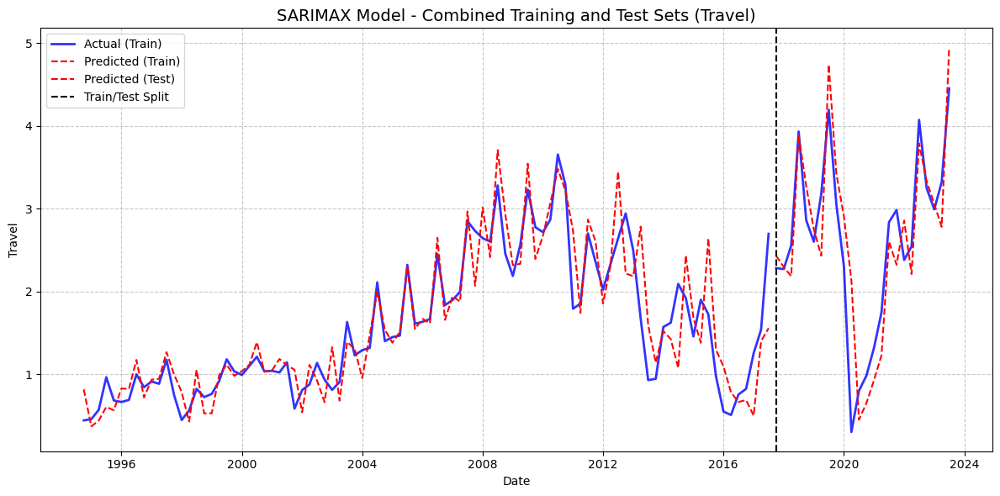


SARIMAX Model Performance (Original Scale - Travel):
Train RMSE: 0.2722 | Test RMSE: 0.4516
Train R²: 0.7458 | Test R²: 0.4175

Model comparison saved to 'travel_model_comparison.csv'


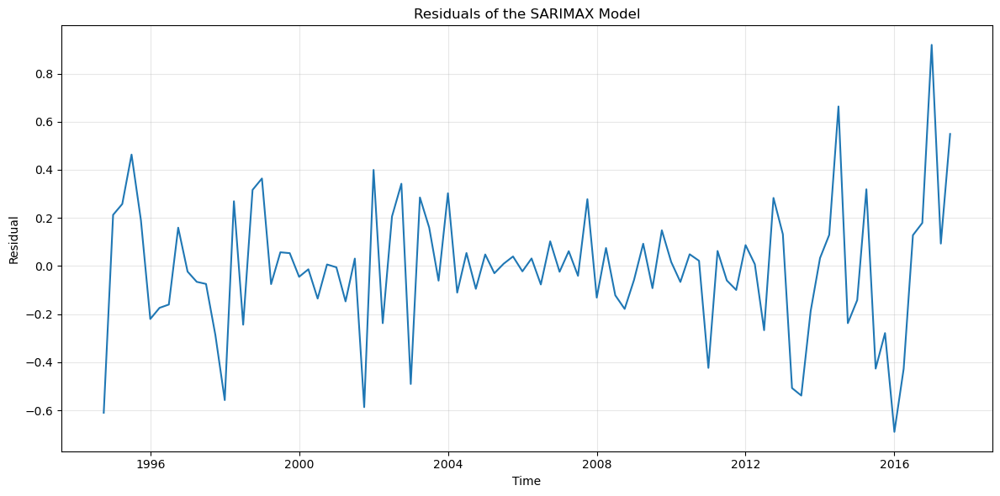

<Figure size 1200x600 with 0 Axes>

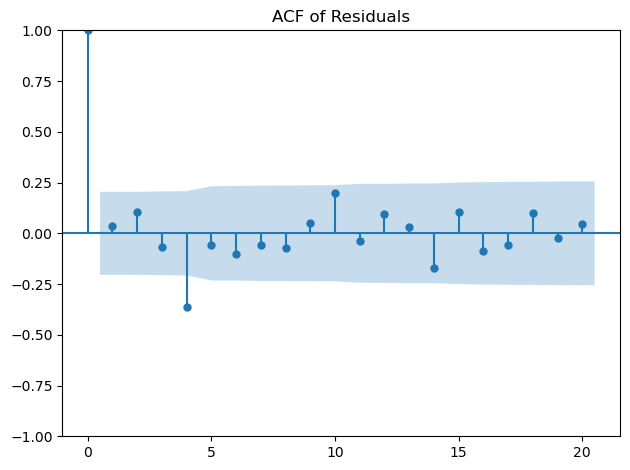


Travel prediction with SARIMAX completed successfully!

BEST SARIMAX MODEL SUMMARY
                                     SARIMAX Results                                      
Dep. Variable:                    Log_Travel_diff   No. Observations:                   92
Model:             SARIMAX(1, 0, 2)x(0, 1, [], 4)   Log Likelihood                  -8.305
Date:                            Sun, 31 Aug 2025   AIC                             30.610
Time:                                    11:58:08   BIC                             47.708
Sample:                                10-01-1994   HQIC                            37.487
                                     - 07-01-2017                                         
Covariance Type:                              opg                                         
                          coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------
Internal_Dum

In [49]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable (already done in your example)
df_model["Log_Travel"] = np.log(df_model ["Travel_reciepts"]) 

# --- SEPARATE DUMMIES FOR INTERNAL VS EXTERNAL EVENTS ---
# Internal events (domestic)
df_model["Internal_Dummy"] = (
    (df_model.index.year == 2011) |  # Domestic event 2011
    (df_model.index.year == 2013) |  # Domestic event 2013  
    (df_model.index.year == 2015)    # Domestic event 2015
).astype(int)

# External events (global)
df_model["External_Dummy"] = (
    (df_model.index.year == 2008) |  # Global Financial Crisis
    (df_model.index.year == 2020) |  # COVID-19 pandemic
    (df_model.index.year == 2022)    # Russia-Ukraine conflict
).astype(int)



# Define exogenous variables
exog_vars = ["Internal_Dummy", "External_Dummy", "Log_World_GDP"]
target = "Log_Travel"


# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables
for var in exog_vars:
    df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# =============== Helper Functions ====================
def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test):
    """Evaluate SARIMAX model with given parameters"""
    try:
        # Fit SARIMAX model
        model = SARIMAX(
            endog=y_train,
            exog=X_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        model_fit = model.fit(disp=False)
        
        # Get predictions
        y_train_pred = model_fit.fittedvalues
        y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        
        # Convert back to original scale
        y_train_hat = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat = inverse_differencing(original_target, y_test_pred, y_test.index)
        
        # Get actual values in original scale
        y_train_true = original_target.loc[y_train.index]
        y_test_true = original_target.loc[y_test.index]
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)
        
        return {
            'order': order,
            'seasonal_order': seasonal_order,
            'aic': model_fit.aic,
            'bic': model_fit.bic,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2, 3],
    'd': [0, 1],
    'q': [0, 1, 2, 3],
    'P': [0, 1],
    'D': [0, 1],
    'Q': [0, 1],
    's': [0, 4]  # seasonal period
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
results = []
best_test_rmse = float('inf')
best_result = None

print("Starting grid search for SARIMAX Travel prediction...")
for i, params in enumerate(all_params, start=1):
    order = (params['p'], params['d'], params['q'])
    seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
    
    print(f"Testing combination {i}/{len(all_params)}: order={order}, seasonal_order={seasonal_order}")
    
    # Evaluate model
    result = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test)
    
    if 'error' in result:
        print(f"  Error: {result['error']}")
        continue
    
    results.append(result)
    
    print(f"  Test RMSE: {result['test_rmse']:.4f} | Test R²: {result['test_r2']:.4f}")
    
    # Update best model if this one is better
    if result['test_rmse'] < best_test_rmse:
        best_test_rmse = result['test_rmse']
        best_result = result

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'aic': r.get('aic', None),
    'bic': r.get('bic', None),
    'train_rmse': r.get('train_rmse', None),
    'test_rmse': r.get('test_rmse', None),
    'train_r2': r.get('train_r2', None),
    'test_r2': r.get('test_r2', None),
    'error': r.get('error', None)
} for r in results])

results_df.to_csv('travel_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'travel_sarimax_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Travel prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Test R²: {best_result['test_r2']:.4f}")
print(f"Test RMSE: {best_result['test_rmse']:.4f}")

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("travel_sarimax_train_preds.csv", index=False)
test_df.to_csv("travel_sarimax_test_preds.csv", index=False)
all_preds.to_csv("travel_sarimax_predictions.csv", index=False)

# Save model summary
with open("travel_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'travel_sarimax_model_summary.txt'")

# =============== Combined Plot =================
plt.figure(figsize=(12, 6))
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', linewidth=2, alpha=0.8, color='blue')
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', linewidth=1.5, color='red', label='Predicted (Test)')
plt.axvline(x=yte_true.index[0], color='k', linestyle='--', label='Train/Test Split')
plt.title('SARIMAX Model - Combined Training and Test Sets (Travel)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Travel')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('travel_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nSARIMAX Model Performance (Original Scale - Travel):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('travel_model_comparison.csv', index=False)
print("\nModel comparison saved to 'travel_model_comparison.csv'")

# =============== Residual Analysis =================
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title("Residuals of the SARIMAX Model")
plt.xlabel("Time")
plt.ylabel("Residual")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('travel_sarimax_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

# ACF of residuals
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 6))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.savefig('travel_sarimax_acf.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nTravel prediction with SARIMAX completed successfully!")

# Print model summary
print("\n" + "="*50)
print("BEST SARIMAX MODEL SUMMARY")
print("="*50)
print(best_result['model_fit'].summary())

## Gru

Total number of parameter combinations: 128
Loaded 60 previous results from checkpoint
Starting grid search for Travel Receipts prediction...
Skipping combination 1/128 (already completed)
Skipping combination 2/128 (already completed)
Skipping combination 3/128 (already completed)
Skipping combination 4/128 (already completed)
Skipping combination 5/128 (already completed)
Skipping combination 6/128 (already completed)
Skipping combination 7/128 (already completed)
Skipping combination 8/128 (already completed)
Skipping combination 9/128 (already completed)
Skipping combination 10/128 (already completed)
Skipping combination 11/128 (already completed)
Skipping combination 12/128 (already completed)
Skipping combination 13/128 (already completed)
Skipping combination 14/128 (already completed)
Skipping combination 15/128 (already completed)
Skipping combination 16/128 (already completed)
Skipping combination 17/128 (already completed)
Skipping combination 18/128 (already completed)
Ski

Model saved as 'travel_gru_model.h5'


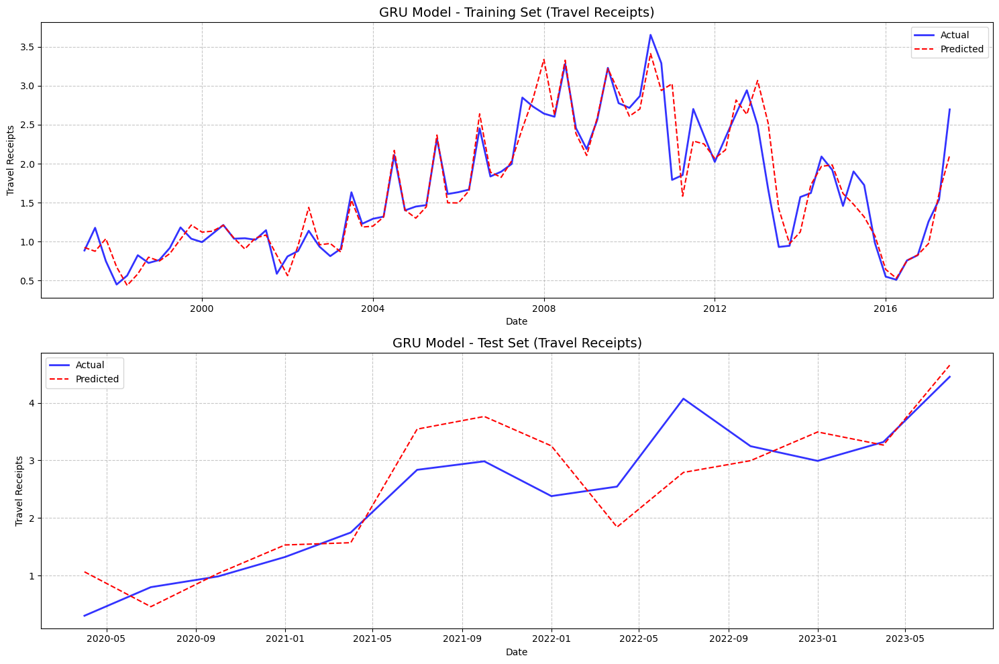


GRU Model Performance (Original Scale - Travel Receipts):
Train RMSE: 0.1676 | Test RMSE: 0.4128
Train R²: 0.8908 | Test R²: 0.6701

Model comparison saved to 'travel_model_comparison.csv'

Travel Receipts prediction completed successfully!


In [275]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import os, time, ast
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import ParameterGrid

# =============== Set Random Seeds for Reproducibility =================
SEED = 123
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["Log_Travel"] = np.log(df_model["Travel_reciepts"])

# --- SEPARATE DUMMIES FOR INTERNAL VS EXTERNAL EVENTS ---
# Internal events (domestic)
df_model["Internal_Dummy"] = (
    (df1.index.year == 2011) |  # Domestic event 2011
    (df1.index.year == 2013) |  # Domestic event 2013  
    (df1.index.year == 2015)    # Domestic event 2015
).astype(int)

# External events (global)
df_model["External_Dummy"] = (
    (df1.index.year == 2008) |  # Global Financial Crisis
    (df1.index.year == 2020) |  # COVID-19 pandemic
    (df1.index.year == 2022)    # Russia-Ukraine conflict
).astype(int)


# Define exogenous variables
exog_vars = ["Internal_Dummy", "External_Dummy", "Log_World_GDP"]
target = "Log_Travel"


# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables
for var in exog_vars:
    df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# Scale features using training data only
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# =============== Helper Functions ====================
def make_sequences(X_scaled, y_series, idx, timesteps):
    """Create sequences for RNN training"""
    X_seq, y_seq, idx_used = [], [], []
    for i in range(timesteps, len(X_scaled)):
        X_seq.append(X_scaled[i - timesteps:i])
        y_seq.append(y_series.iloc[i])
        idx_used.append(idx[i])
    return np.array(X_seq), np.array(y_seq), pd.Index(idx_used)

def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def build_model(params, input_dim, timesteps):
    """Build GRU model with specified parameters"""
    model = Sequential()
    return_sequences = params['layers'] > 1
    
    # First GRU layer
    model.add(GRU(params['units'], input_shape=(timesteps, input_dim),
                  return_sequences=return_sequences, activation='tanh'))
    
    # Add dropout if specified
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    
    # Add second GRU layer if specified
    if params['layers'] > 1:
        model.add(GRU(params['units'] // 2, return_sequences=False, activation='tanh'))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    
    # Output layer
    model.add(Dense(1))
    
    # Compile model
    opt = Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=opt, loss='mse')
    return model

def evaluate_on_both_scales(model, X_train_seq, y_train_seq, idx_train_used,
                            X_test_seq, y_test_seq, idx_test_used):
    """Evaluate model performance on both differenced and original scales"""
    # Predictions in differenced space
    ytr_pred_d = model.predict(X_train_seq, verbose=0).flatten()
    yte_pred_d = model.predict(X_test_seq, verbose=0).flatten()

    # Metrics for differenced data
    train_rmse_diff = np.sqrt(mean_squared_error(y_train_seq, ytr_pred_d))
    test_rmse_diff = np.sqrt(mean_squared_error(y_test_seq, yte_pred_d))
    train_mae_diff = mean_absolute_error(y_train_seq, ytr_pred_d)
    test_mae_diff = mean_absolute_error(y_test_seq, yte_pred_d)
    train_r2_diff = r2_score(y_train_seq, ytr_pred_d)
    test_r2_diff = r2_score(y_test_seq, yte_pred_d)

    # Convert back to original scale
    ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_train_used)
    yte_hat = inverse_differencing(original_target, yte_pred_d, idx_test_used)
    ytr_true = original_target.loc[idx_train_used]
    yte_true = original_target.loc[idx_test_used]

    # Metrics for original scale
    train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
    test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
    train_r2_orig = r2_score(ytr_true, ytr_hat)
    test_r2_orig = r2_score(yte_true, yte_hat)

    return {
        'train_rmse_diff': train_rmse_diff, 'test_rmse_diff': test_rmse_diff,
        'train_mae_diff': train_mae_diff, 'test_mae_diff': test_mae_diff,
        'train_r2_diff': train_r2_diff, 'test_r2_diff': test_r2_diff,
        'train_rmse_orig': train_rmse_orig, 'test_rmse_orig': test_rmse_orig,
        'train_r2_orig': train_r2_orig, 'test_r2_orig': test_r2_orig
    }

# =============== Hyperparameter Grid =======================
param_grid = {
    'rnn_type': ['GRU'],            # keep GRU only
    'units': [20, 40],
    'layers': [1, 2],
    'dropout': [0.0, 0.2],
    'timesteps': [5, 10],
    'batch_size': [8, 16],
    'learning_rate': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop']
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
checkpoint_file = 'travel_gru_grid_search_checkpoint.csv'
results = []

# Load previous results if available
if os.path.exists(checkpoint_file):
    try:
        checkpoint_df = pd.read_csv(checkpoint_file)
        if 'params' in checkpoint_df.columns:
            checkpoint_df['params'] = checkpoint_df['params'].apply(
                lambda x: ast.literal_eval(x) if isinstance(x, str) else x
            )
        results = checkpoint_df.to_dict('records')
        print(f"Loaded {len(results)} previous results from checkpoint")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")

def save_checkpoint_row(row):
    """Save a row of results to checkpoint file"""
    df_row = pd.DataFrame([row]).copy()
    if 'params' in df_row.columns:
        df_row['params'] = df_row['params'].astype(str)
    if not os.path.exists(checkpoint_file):
        df_row.to_csv(checkpoint_file, index=False)
    else:
        df_row.to_csv(checkpoint_file, mode='a', header=False, index=False)

# Track best model during grid search
BEST_WEIGHTS_PATH = 'best_gru_travel_model.weights.h5'
best_original_test_r2 = -np.inf
best_row = None

print("Starting grid search for Travel Receipts prediction...")
for i, params in enumerate(all_params, start=1):
    # Skip already completed parameter combinations
    if any(str(params) == str(r.get('params')) for r in results):
        print(f"Skipping combination {i}/{len(all_params)} (already completed)")
        continue

    print(f"Testing combination {i}/{len(all_params)}: {params}")
    timesteps = params['timesteps']

    # Create sequences
    Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
    Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled, y_test, test_indices, timesteps)

    # Build and train model
    model = build_model(params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
    
    # Callbacks
    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    tmp_ckpt = f"_tmp_travel_{i}.weights.h5"
    checkpoint = ModelCheckpoint(tmp_ckpt, monitor='val_loss', save_best_only=True, 
                                save_weights_only=True, verbose=0)

    # Train model
    t0 = time.time()
    history = model.fit(
        Xtr_seq, ytr_seq,
        validation_data=(Xte_seq, yte_seq),
        epochs=200,
        batch_size=params['batch_size'],
        callbacks=[early_stop, checkpoint],
        verbose=0
    )
    train_time = time.time() - t0
    
    # Load best weights for this parameter combination
    if os.path.exists(tmp_ckpt):
        model.load_weights(tmp_ckpt)

    # Calculate validation loss (average of last 5 epochs)
    val_loss = np.mean(history.history['val_loss'][-5:]) if len(history.history['val_loss']) >= 5 else history.history['val_loss'][-1]

    # Evaluate model
    metrics = evaluate_on_both_scales(model, Xtr_seq, ytr_seq, idx_tr_used, Xte_seq, yte_seq, idx_te_used)

    # Store results
    row = {
        'params': params,
        'val_loss': val_loss,
        'epochs_used': len(history.history['loss']),
        'training_time': train_time,
        **metrics
    }
    results.append(row)
    save_checkpoint_row(row)

    print(f"  Diff Test R²: {metrics['test_r2_diff']:.4f} | Orig Test R²: {metrics['test_r2_orig']:.4f}")

    # Update best model if this one is better
    if metrics['test_r2_orig'] > best_original_test_r2:
        best_original_test_r2 = metrics['test_r2_orig']
        best_row = row.copy()
        model.save_weights(BEST_WEIGHTS_PATH)
    
    # Clean up temporary checkpoint
    try:
        if os.path.exists(tmp_ckpt):
            os.remove(tmp_ckpt)
    except:
        pass

# Save full results
results_df = pd.DataFrame(results)
results_df.to_csv('travel_gru_grid_search_results.csv', index=False)
print("Grid search results saved to 'travel_gru_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_row is None:
    raise SystemExit("No valid results from grid search.")

best_params = best_row['params']
print("\nBest GRU model for Travel Receipts prediction:")
print("Parameters:", best_params)
print(f"Test R² (original): {best_row['test_r2_orig']:.4f}")

# Rebuild and evaluate the best model
timesteps = best_params['timesteps']
Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled, y_test, test_indices, timesteps)

model = build_model(best_params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
model.load_weights(BEST_WEIGHTS_PATH)

# Make predictions
ytr_pred_d = model.predict(Xtr_seq, verbose=0).flatten()
yte_pred_d = model.predict(Xte_seq, verbose=0).flatten()

# Convert back to original scale
ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_tr_used)
yte_hat = inverse_differencing(original_target, yte_pred_d, idx_te_used)
ytr_true = original_target.loc[idx_tr_used]
yte_true = original_target.loc[idx_te_used]

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("travel_gru_train_preds.csv", index=False)
test_df.to_csv("travel_gru_test_preds.csv", index=False)
all_preds.to_csv("travel_gru_predictions.csv", index=False)

# Save model
model.save("travel_gru_model.h5")
print("Model saved as 'travel_gru_model.h5'")

# =============== Plot Results =================
plt.figure(figsize=(15, 10))

# Training set
plt.subplot(2, 1, 1)
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted', linewidth=1.5)
plt.title('GRU Model - Training Set (Travel Receipts)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Travel Receipts')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Test set
plt.subplot(2, 1, 2)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', label='Predicted', linewidth=1.5)
plt.title('GRU Model - Test Set (Travel Receipts)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Travel Receipts')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('travel_gru_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nGRU Model Performance (Original Scale - Travel Receipts):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'GRU',
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'Parameters': str(best_params)
}])
comparison_df.to_csv('travel_model_comparison.csv', index=False)
print("\nModel comparison saved to 'travel_model_comparison.csv'")

print("\nTravel Receipts prediction completed successfully!")

Using ARIMA predictions: C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Travel results\arima\travel_sarimax_test_preds.csv
Using GRU predictions  : C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Travel results\travel_gru_test_preds.csv


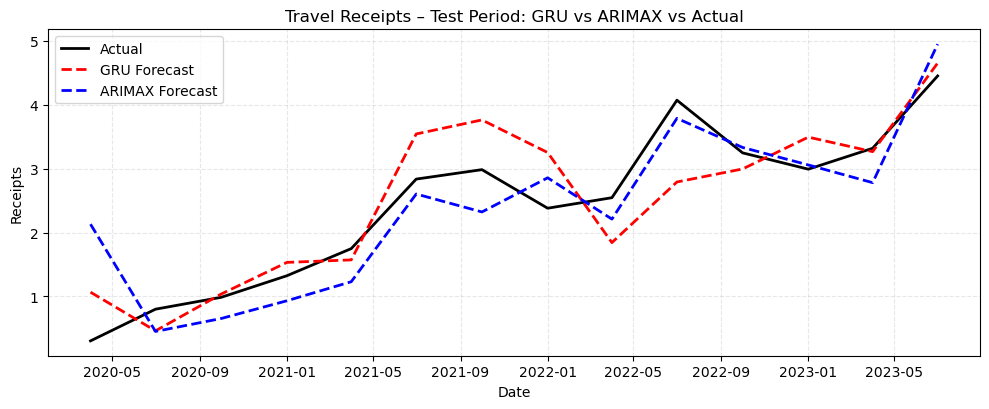

Figure saved to: C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Travel results\travel_test_gru_vs_arimax.png


In [53]:
# ===========================================
# Travel Receipts — Test Period: GRU vs ARIMAX vs Actual
# Reads CSVs saved by your training scripts and plots a
# comparison chart similar to the Suez Canal figure.
# ===========================================

import os
from pathlib import Path
import glob
import pandas as pd
import matplotlib.pyplot as plt

# ----------- 1) FILE LOCATIONS -------------
ARIMA_DIR = r"C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Travel results\arima"
GRU_DIR   = r"C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Travel results"

# If you know exact filenames, set them here (otherwise leave as None and the script will auto-discover)
ARIMA_FILE = None  # e.g., r"C:\...\Travel results\arima\travel_sarimax_test_preds.csv"
GRU_FILE   = None  # e.g., r"C:\...\Travel results\travel_gru_test_preds.csv"

# ----------- 2) HELPERS --------------------
def find_latest_csv(folder, patterns):
    """Return the most recent CSV in 'folder' matching any of 'patterns' (list of glob patterns)."""
    candidates = []
    for pat in patterns:
        candidates.extend(glob.glob(str(Path(folder) / pat)))
    if not candidates:
        return None
    # Pick the most recently modified
    candidates = sorted(candidates, key=os.path.getmtime, reverse=True)
    return candidates[0]

def load_preds(csv_path, model_name):
    """
    Load a predictions CSV with columns like: date, actual, predicted, split.
    Handles case-insensitive column names and optional 'split' column.
    Returns a DataFrame indexed by date with columns: ['Actual', f'{model_name}_Pred'] (test rows only).
    """
    df = pd.read_csv(csv_path)
    # Normalize column names
    df.columns = [c.strip().lower() for c in df.columns]
    # Parse date
    date_col = 'date' if 'date' in df.columns else df.columns[0]
    df[date_col] = pd.to_datetime(df[date_col])
    # Filter test split if available
    if 'split' in df.columns:
        df = df[df['split'].str.lower().eq('test')].copy()
    # Pick/rename columns
    actual_col = 'actual' if 'actual' in df.columns else None
    pred_col = 'predicted' if 'predicted' in df.columns else None
    if actual_col is None or pred_col is None:
        raise ValueError(f"Could not find 'actual'/'predicted' columns in {csv_path}. Found: {df.columns.tolist()}")
    out = df[[date_col, actual_col, pred_col]].copy()
    out.columns = ['Date', 'Actual', f'{model_name}_Pred']
    out = out.set_index('Date').sort_index()
    return out

# ----------- 3) DISCOVER FILES -------------
if ARIMA_FILE is None:
    ARIMA_FILE = find_latest_csv(
        ARIMA_DIR,
        patterns=[
            "*sarimax*test*pred*.csv",
            "*arimax*test*pred*.csv",
            "*arima*test*pred*.csv",
            "*test*pred*.csv"
        ],
    )
if GRU_FILE is None:
    GRU_FILE = find_latest_csv(
        GRU_DIR,
        patterns=[
            "*gru*test*pred*.csv",
            "travel_gru_test_preds.csv",
            "*test*pred*.csv"
        ],
    )

if ARIMA_FILE is None or GRU_FILE is None:
    raise FileNotFoundError(
        f"Could not locate the needed CSVs.\n"
        f"ARIMA path tried: {ARIMA_DIR}\nGRU path tried: {GRU_DIR}\n"
        f"Set ARIMA_FILE and GRU_FILE explicitly if needed."
    )

print(f"Using ARIMA predictions: {ARIMA_FILE}")
print(f"Using GRU predictions  : {GRU_FILE}")

# ----------- 4) LOAD & ALIGN ---------------
df_arima = load_preds(ARIMA_FILE, "ARIMAX")
df_gru   = load_preds(GRU_FILE, "GRU")

# Align on common test-period dates
df_plot = df_arima.join(df_gru, how="inner", lsuffix="_arima", rsuffix="_gru")
# If both have an 'Actual' column, keep one
if 'Actual_arima' in df_plot.columns and 'Actual_gru' in df_plot.columns:
    df_plot['Actual'] = df_plot['Actual_arima']
    df_plot = df_plot.drop(columns=['Actual_arima', 'Actual_gru'])
elif 'Actual_arima' in df_plot.columns:
    df_plot = df_plot.rename(columns={'Actual_arima': 'Actual'})
elif 'Actual_gru' in df_plot.columns:
    df_plot = df_plot.rename(columns={'Actual_gru': 'Actual'})

# ----------- 5) PLOT -----------------------
plt.figure(figsize=(10, 4.2))
plt.plot(df_plot.index, df_plot['Actual'], color='black', linewidth=2.0, label='Actual')
plt.plot(df_plot.index, df_plot['GRU_Pred'], color='red', linestyle='--', linewidth=2.0, label='GRU Forecast')
plt.plot(df_plot.index, df_plot['ARIMAX_Pred'], color='blue', linestyle='--', linewidth=2.0, label='ARIMAX Forecast')

plt.title("Travel Receipts – Test Period: GRU vs ARIMAX vs Actual")
plt.xlabel("Date")
plt.ylabel("Receipts")
plt.grid(True, alpha=0.3, linestyle='--')
plt.legend()
plt.tight_layout()

# Save and show
out_png = Path(GRU_DIR) / "travel_test_gru_vs_arimax.png"
plt.savefig(out_png, dpi=300, bbox_inches="tight")
plt.show()
print(f"Figure saved to: {out_png}")


# Remittence

                            OLS Regression Results                            
Dep. Variable:     Worker_Remittances   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.885
Method:                 Least Squares   F-statistic:                     128.2
Date:                Wed, 27 Aug 2025   Prob (F-statistic):           1.31e-49
Time:                        08:45:15   Log-Likelihood:                -140.46
No. Observations:                 117   AIC:                             296.9
Df Residuals:                     109   BIC:                             319.0
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

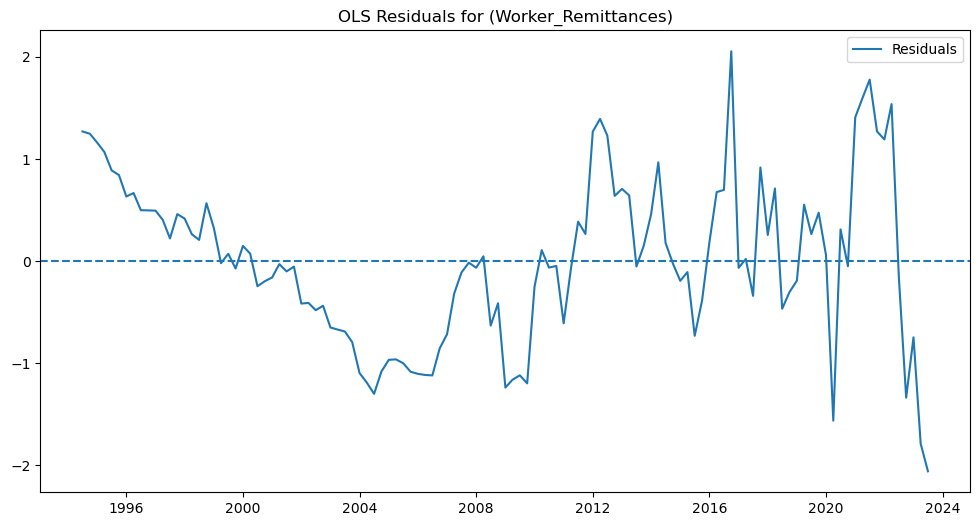

In [306]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ========================
# 0. DATA PREP
# ========================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index).sort_values()

# Target: log of Travel Reciepts 
df1["Log_Worker_Remittances"] = np.log(df1["Worker_Remittances"])

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df1["Post2016"] = (df1.index >= "2016-11-01").astype(int)
df1["ER_Post2016"] = df1["Exchange_rate_EG_US"] * df1["Post2016"]

# ========================
# Domestic & International Shock Dummies
# ========================
# Domestic shocks: 2011 (revolution), 2013 (political transition), 2015 (Russian plane incident)
df1["Domestic_Shocks"] = df1.index.year.isin([2011, 2013,2015]).astype(int)

# International shocks: 2008 (GFC), 2020 (COVID-19), 2022 (Russia–Ukraine war / global inflation)
df1["International_Shocks"] = df1.index.year.isin([2020, 2022]).astype(int)

# ========================
# 1. OLS MODEL
# ========================
exog_vars = ["LOG_GCC_GDP","ER_Post2016", "Domestic_Shocks", "International_Shocks", "Exchange_rate_EG_US", "CRUDE_OIL_PRICE_DOLLAR","EGYPT_INFLATION_PCHANGE"]
X = sm.add_constant(df1[exog_vars])
y = df1["Worker_Remittances"]

ols_model = sm.OLS(y, X, missing="drop").fit()

print(ols_model.summary())

# ========================
# 2. Residual Diagnostics
# ========================
fig = plt.figure(figsize=(12,6))
plt.plot(ols_model.resid, label="Residuals")
plt.axhline(0, linestyle="--")
plt.title("OLS Residuals for (Worker_Remittances)")
plt.legend()
plt.show()


In [304]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 117 entries, 1994-07-01 to 2023-07-01
Data columns (total 42 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   FY                              117 non-null    float64
 1   Quarters                        117 non-null    float64
 2   Trade_Balance                   117 non-null    float64
 3   Exports                         117 non-null    float64
 4   Petroleum-Exports               117 non-null    float64
 5   Other_Exports                   117 non-null    float64
 6   Imports                         117 non-null    float64
 7   Petroleum-Imports               117 non-null    float64
 8   Other_Imports                   117 non-null    float64
 9   Suez_Canal_dues                 117 non-null    float64
 10  Travel_reciepts                 117 non-null    float64
 11  Transportation_Payments         117 non-null    float64
 12  Travel_Payments  

In [308]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ========================
# 0. MULTICOLLINEARITY (VIF)
# ========================
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define exogenous variables (with lag included)
exog_vars = ["LOG_GCC_GDP","ER_Post2016", "Domestic_Shocks", "International_Shocks", "Exchange_rate_EG_US", "CRUDE_OIL_PRICE_DOLLAR","EGYPT_INFLATION_PCHANGE"]

# Drop rows with NaN caused by lagging
X = sm.add_constant(df1[exog_vars]).dropna()

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)



                  Variable        VIF
0                    const 2,399.2596
1              LOG_GCC_GDP    11.2860
2              ER_Post2016    10.7855
3          Domestic_Shocks     1.3616
4     International_Shocks     1.4323
5      Exchange_rate_EG_US    25.2939
6   CRUDE_OIL_PRICE_DOLLAR     4.7115
7  EGYPT_INFLATION_PCHANGE     3.4488


In [312]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# ========================
# 0. MULTICOLLINEARITY (VIF)
# ========================
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Define exogenous variables (with lag included)
exog_vars = ["LOG_GCC_GDP","ER_Post2016", "Domestic_Shocks", "International_Shocks", "EGYPT_INFLATION_PCHANGE"]

# Drop rows with NaN caused by lagging
X = sm.add_constant(df1[exog_vars]).dropna()

# Compute VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)



                  Variable      VIF
0                    const 677.0158
1              LOG_GCC_GDP   2.7198
2              ER_Post2016   2.1696
3          Domestic_Shocks   1.3559
4     International_Shocks   1.2442
5  EGYPT_INFLATION_PCHANGE   1.7492


                              OLS Regression Results                              
Dep. Variable:     Log_Worker_Remittances   R-squared:                       0.919
Model:                                OLS   Adj. R-squared:                  0.916
Method:                     Least Squares   F-statistic:                     424.7
Date:                    Wed, 27 Aug 2025   Prob (F-statistic):           2.41e-61
Time:                            08:49:55   Log-Likelihood:                -5.2991
No. Observations:                     117   AIC:                             18.60
Df Residuals:                         113   BIC:                             29.65
Df Model:                               3                                         
Covariance Type:                nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

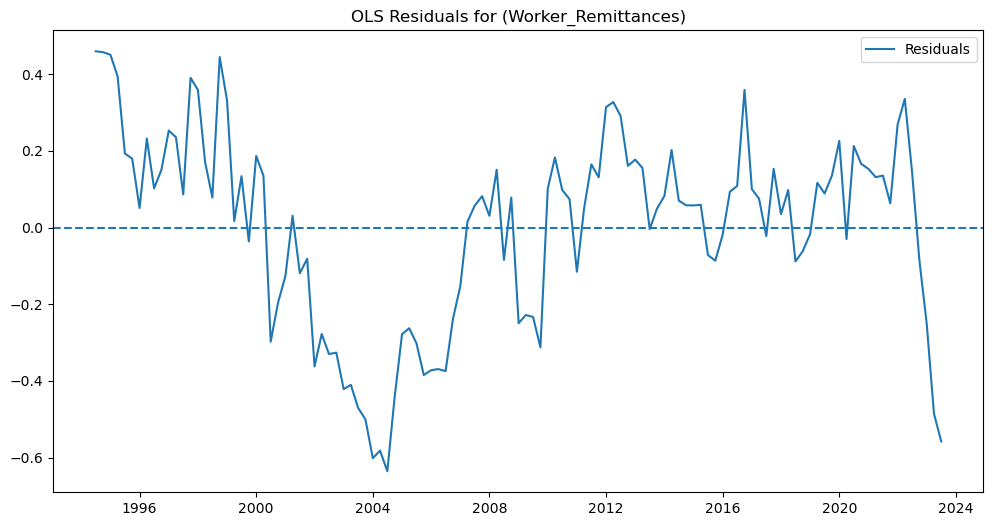

In [318]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt

# ========================
# 0. DATA PREP
# ========================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index).sort_values()

# Target: log of Travel Reciepts 
df1["Log_Worker_Remittances"] = np.log(df1["Worker_Remittances"])

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df1["Post2016"] = (df1.index >= "2016-11-01").astype(int)
df1["ER_Post2016"] = df1["Exchange_rate_EG_US"] * df1["Post2016"]

# ========================
# Domestic & International Shock Dummies
# ========================
# Domestic shocks: 2011 (revolution), 2013 (political transition), 2015 (Russian plane incident)
df1["Domestic_Shocks"] = df1.index.year.isin([2011, 2013,2015]).astype(int)

# International shocks: 2008 (GFC), 2020 (COVID-19), 2022 (Russia–Ukraine war / global inflation)
df1["International_Shocks"] = df1.index.year.isin([2020, 2022]).astype(int)

# ========================
# 1. OLS MODEL
# ========================
exog_vars = ["LOG_GCC_GDP","ER_Post2016", "EGYPT_INFLATION_PCHANGE"]
X = sm.add_constant(df1[exog_vars])
y = df1["Log_Worker_Remittances"]

ols_model = sm.OLS(y, X, missing="drop").fit()

print(ols_model.summary())

# ========================
# 2. Residual Diagnostics
# ========================
fig = plt.figure(figsize=(12,6))
plt.plot(ols_model.resid, label="Residuals")
plt.axhline(0, linestyle="--")
plt.title("OLS Residuals for (Worker_Remittances)")
plt.legend()
plt.show()


## Arima x

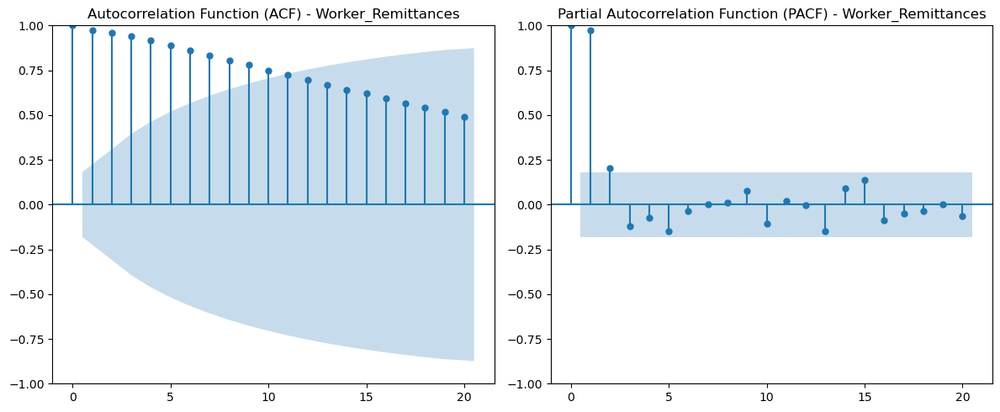

In [327]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


# Plot ACF and PACF for Imports (raw, untransformed)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(df['Worker_Remittances'].dropna(), lags=20, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF) - Worker_Remittances')

plot_pacf(df['Worker_Remittances'].dropna(), lags=20, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF) - Worker_Remittances')

plt.tight_layout()
plt.show()


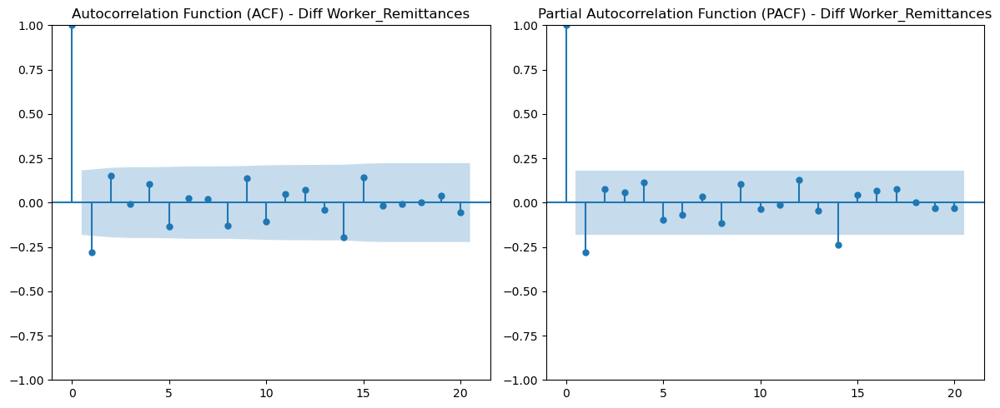

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

df["diff_Worker_Remittances"] = df["Worker_Remittances"].diff().dropna()

# Plot ACF and PACF for Imports (raw, untransformed)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

plot_acf(df['diff_Worker_Remittances'].dropna(), lags=20, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF) - Diff Worker_Remittances')

plot_pacf(df['diff_Worker_Remittances'].dropna(), lags=20, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF) - Diff Worker_Remittances')

plt.tight_layout()
plt.show()


                                     SARIMAX Results                                     
Dep. Variable:                   log_Remittances   No. Observations:                   93
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 4)   Log Likelihood                  54.012
Date:                           Wed, 27 Aug 2025   AIC                            -96.025
Time:                                   16:00:05   BIC                            -80.894
Sample:                               07-01-1994   HQIC                           -89.918
                                    - 07-01-2017                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0262      0.208     -4.922      0.000      -1.435      -0.618
ar.L2         -0.2183      0.113     -1.925

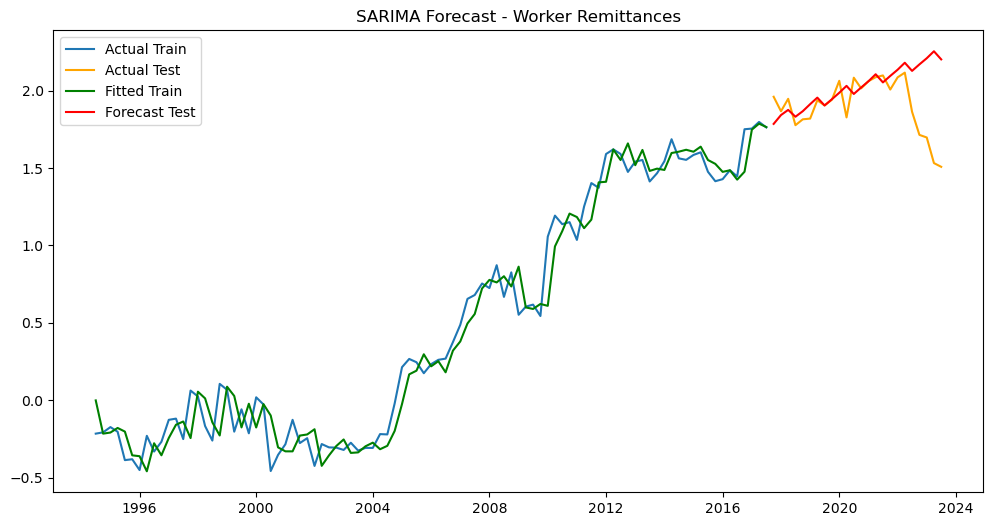

In [453]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# ======================
# 1. Prepare Data
# ======================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index)
df1 = df1.sort_index()
df1["log_Remittances"]=np.log(df["Worker_Remittances"])
target = "log_Remittances"
y = df1[target]

# ======================
# 2. Split Train/Test
# ======================
train_size = int(len(y) * 0.8)
train, test = y.iloc[:train_size], y.iloc[train_size:]

# ======================
# 3. Fit SARIMA
# ======================
# order = (p,d,q), seasonal_order = (P,D,Q,s)
# Example: yearly seasonality
model = SARIMAX(train, order=(2,1,1), seasonal_order=(1,0,1,4))
model_fit = model.fit()

print(model_fit.summary())

# ======================
# 4. Forecast
# ======================
fitted_train = model_fit.fittedvalues

forecast_test = model_fit.forecast(steps=len(test))
forecast_test = pd.Series(forecast_test, index=test.index)

# ======================
# 5. Evaluate
# ======================
# Train metrics
rmse_train = np.sqrt(mean_squared_error(train[1:], fitted_train[1:]))
mae_train = mean_absolute_error(train[1:], fitted_train[1:])
r2_train = r2_score(train[1:], fitted_train[1:])

# Test metrics
rmse_test = np.sqrt(mean_squared_error(test, forecast_test))
mae_test = mean_absolute_error(test, forecast_test)
r2_test = r2_score(test, forecast_test)

print(f"Train RMSE: {rmse_train:.4f}, Test RMSE: {rmse_test:.4f}")
print(f"Train MAE: {mae_train:.4f}, Test MAE: {mae_test:.4f}")
print(f"Train R²: {r2_train:.4f}, Test R²: {r2_test:.4f}")

# ======================
# 6. Plot Results
# ======================
plt.figure(figsize=(12,6))
plt.plot(train, label="Actual Train")
plt.plot(test, label="Actual Test", color="orange")
plt.plot(fitted_train, label="Fitted Train", color="green")
plt.plot(forecast_test, label="Forecast Test", color="red")
plt.title("SARIMA Forecast - Worker Remittances")
plt.legend()
plt.show()


                                     SARIMAX Results                                     
Dep. Variable:                   log_Remittances   No. Observations:                   93
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 4)   Log Likelihood                  54.012
Date:                           Wed, 27 Aug 2025   AIC                            -96.025
Time:                                   16:36:04   BIC                            -80.894
Sample:                               07-01-1994   HQIC                           -89.918
                                    - 07-01-2017                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0262      0.208     -4.922      0.000      -1.435      -0.618
ar.L2         -0.2183      0.113     -1.925

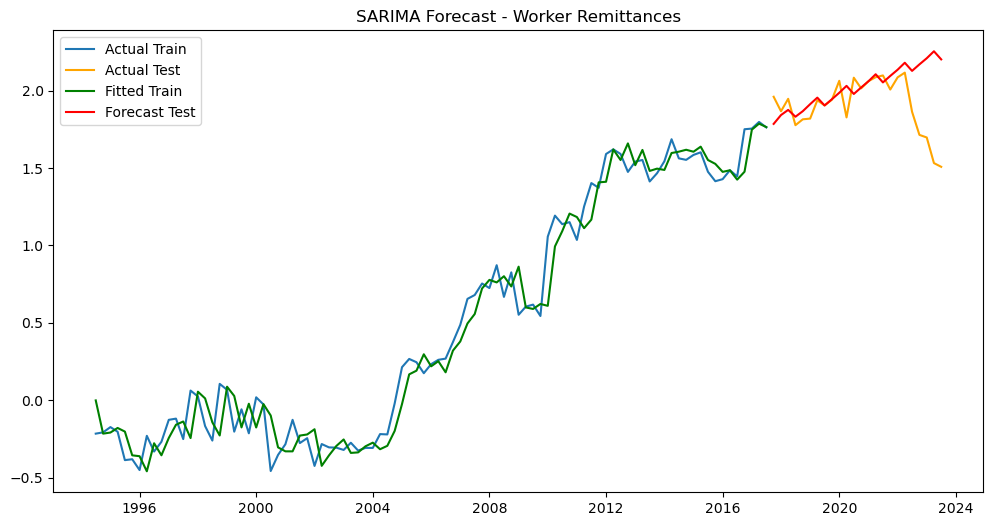

In [481]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import warnings
warnings.filterwarnings("ignore")

# ======================
# 1. Prepare Data
# ======================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index)
df1 = df1.sort_index()
df1["log_Remittances"]=np.log(df["Worker_Remittances"])
target = "log_Remittances"
y = df1[target]

# ======================
# 2. Split Train/Test
# ======================
train_size = int(len(y) * 0.8)
train, test = y.iloc[:train_size], y.iloc[train_size:]

# ======================
# 3. Fit SARIMA
# ======================
# order = (p,d,q), seasonal_order = (P,D,Q,s)
# Example: yearly seasonality
model = SARIMAX(train, order=(2,1,1), seasonal_order=(1,0,1,4))
model_fit = model.fit()

print(model_fit.summary())

# ======================
# 4. Forecast
# ======================
fitted_train = model_fit.fittedvalues

forecast_test = model_fit.forecast(steps=len(test))
forecast_test = pd.Series(forecast_test, index=test.index)

# ======================
# 5. Evaluate
# ======================
# Train metrics
rmse_train = np.sqrt(mean_squared_error(train[1:], fitted_train[1:]))
mae_train = mean_absolute_error(train[1:], fitted_train[1:])
r2_train = r2_score(train[1:], fitted_train[1:])

# Test metrics
rmse_test = np.sqrt(mean_squared_error(test, forecast_test))
mae_test = mean_absolute_error(test, forecast_test)
r2_test = r2_score(test, forecast_test)

print(f"Train RMSE: {rmse_train:.4f}, Test RMSE: {rmse_test:.4f}")
print(f"Train MAE: {mae_train:.4f}, Test MAE: {mae_test:.4f}")
print(f"Train R²: {r2_train:.4f}, Test R²: {r2_test:.4f}")

# ======================
# 6. Plot Results
# ======================
plt.figure(figsize=(12,6))
plt.plot(train, label="Actual Train")
plt.plot(test, label="Actual Test", color="orange")
plt.plot(fitted_train, label="Fitted Train", color="green")
plt.plot(forecast_test, label="Forecast Test", color="red")
plt.title("SARIMA Forecast - Worker Remittances")
plt.legend()
plt.show()


=== Top 5 by AIC ===
order=(1, 1, 1), seasonal=(0, 0, 0, 4), exog=[], AIC=-88.5, Test R² (log)=-0.716, Test RMSE (orig)=1.4515
order=(1, 1, 1), seasonal=(0, 0, 0, 4), exog=['d_Exchange_rate_EG_US'], AIC=-87.1, Test R² (log)=-0.737, Test RMSE (orig)=1.4563
order=(2, 1, 1), seasonal=(0, 0, 0, 4), exog=[], AIC=-86.8, Test R² (log)=-0.719, Test RMSE (orig)=1.4526
order=(1, 1, 1), seasonal=(0, 0, 0, 4), exog=['d_LOG_GCC_GDP'], AIC=-86.8, Test R² (log)=-0.670, Test RMSE (orig)=1.4322
order=(1, 1, 2), seasonal=(0, 0, 0, 4), exog=[], AIC=-86.3, Test R² (log)=-0.709, Test RMSE (orig)=1.4486

=== BEST MODEL (by AIC, then Test R²) ===
order=(1, 1, 1), seasonal=(0, 0, 0, 4), exog=[], AIC=-88.5, BIC=-81.0
[LOG]  Train R²=0.966, Test R²=-0.716, Test RMSE=0.2197, Test MAE=0.1920
[ORIG] Train R²=0.962, Test R²=-0.837, Test RMSE=1.4515, Test MAE=1.2438


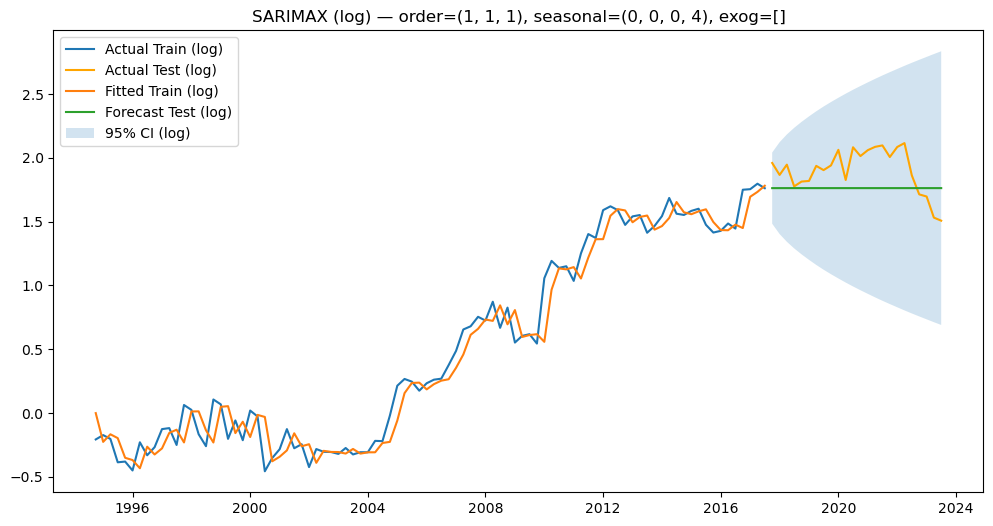

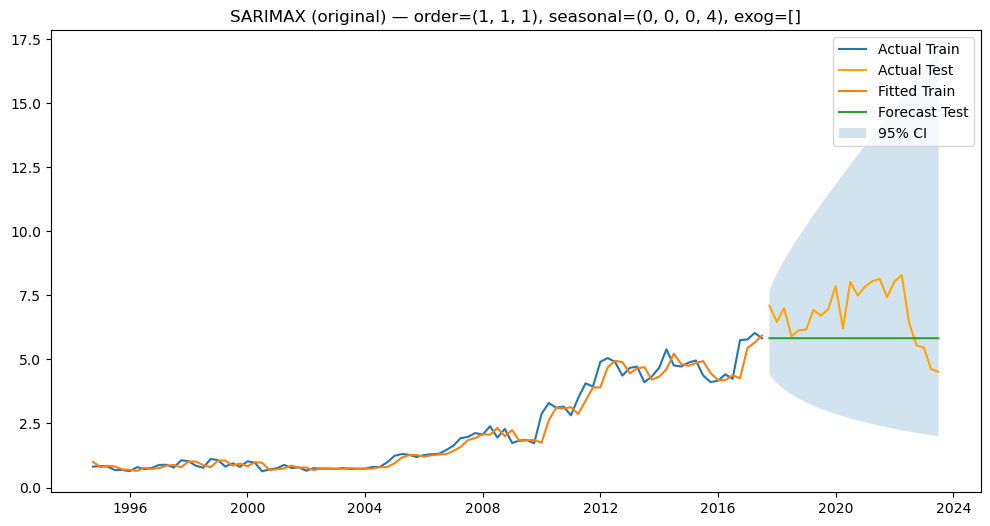

In [487]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import product, combinations
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import warnings
warnings.filterwarnings("ignore")

# ======================
# 1) Prepare Data
# ======================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index)
df1 = df1.sort_index()

# Target (log)
df1["log_Remittances"] = np.log(df1["Worker_Remittances"])

# Dummies (parallel market)
df1["Parallel_Market"] = 0
df1.loc[(df1.index >= "2016-01-01") & (df1.index < "2016-11-03"), "Parallel_Market"] = 1
df1.loc[(df1.index >= "2018-01-01") & (df1.index < "2018-05-15"), "Parallel_Market"] = 1
df1.loc[(df1.index >= "2022-04-01") & (df1.index < "2022-10-27"), "Parallel_Market"] = 1

# Exogenous (differenced)
df1["d_LOG_GCC_GDP"] = df1["LOG_GCC_GDP"].diff()
df1["d_Exchange_rate_EG_US"] = df1["Exchange_rate_EG_US"].diff()

# Keep needed cols and drop NA after differencing
cols_keep = ["log_Remittances", "d_LOG_GCC_GDP", "d_Exchange_rate_EG_US", "Parallel_Market"]
df1 = df1[cols_keep].dropna()

y = df1["log_Remittances"]

# Candidate exogenous sets
exog_candidates = [
    [],  # pure SARIMA
    ["d_LOG_GCC_GDP"],
    ["d_Exchange_rate_EG_US"],
    ["d_LOG_GCC_GDP", "d_Exchange_rate_EG_US"],
    ["d_LOG_GCC_GDP", "d_Exchange_rate_EG_US", "Parallel_Market"],
]

# Make a dict-of-frames for easy slicing later
def get_exog(df, cols):
    if not cols:
        return None
    return df[cols]

# ======================
# 2) Train/Test split
# ======================
train_size = int(len(y) * 0.8)
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
df_train, df_test = df1.iloc[:train_size], df1.iloc[train_size:]

# ======================
# 3) Grid of model orders
# ======================
orders = [(1,1,1), (2,1,1), (1,1,2), (2,1,2)]
seasonal_orders = [(0,0,0,4), (1,0,1,4), (1,1,1,4)]

results = []

def safe_metrics_log(train, fitted, test, forecast):
    # align & drop NaNs due to differencing
    tr = train.iloc[1:]
    ft = fitted.iloc[1:]
    # Log-scale metrics
    rmse_tr = np.sqrt(mean_squared_error(tr, ft))
    mae_tr = mean_absolute_error(tr, ft)
    r2_tr = r2_score(tr, ft)

    rmse_te = np.sqrt(mean_squared_error(test, forecast))
    mae_te = mean_absolute_error(test, forecast)
    r2_te = r2_score(test, forecast)
    return rmse_tr, mae_tr, r2_tr, rmse_te, mae_te, r2_te

def to_orig(x):  # simple back-transform
    return np.exp(x)

def safe_metrics_orig(train, fitted, test, forecast):
    tr_o = to_orig(train).iloc[1:]
    ft_o = to_orig(fitted).iloc[1:]
    te_o = to_orig(test)
    fc_o = to_orig(forecast)

    rmse_tr_o = np.sqrt(mean_squared_error(tr_o, ft_o))
    mae_tr_o = mean_absolute_error(tr_o, ft_o)
    r2_tr_o = r2_score(tr_o, ft_o)

    rmse_te_o = np.sqrt(mean_squared_error(te_o, fc_o))
    mae_te_o = mean_absolute_error(te_o, fc_o)
    r2_te_o = r2_score(te_o, fc_o)
    return rmse_tr_o, mae_tr_o, r2_tr_o, rmse_te_o, mae_te_o, r2_te_o

# ======================
# 4) Search loop
# ======================
for order, sorder in product(orders, seasonal_orders):
    for exog_cols in exog_candidates:
        try:
            X_train = get_exog(df_train, exog_cols)
            X_test = get_exog(df_test, exog_cols)

            model = SARIMAX(
                endog=y_train,
                exog=X_train,
                order=order,
                seasonal_order=sorder,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            fit = model.fit(disp=False)

            fitted_train = fit.fittedvalues
            fc_res = fit.get_forecast(steps=len(y_test), exog=X_test)
            fc_mean = fc_res.predicted_mean

            # metrics (log + original)
            rmse_tr, mae_tr, r2_tr, rmse_te, mae_te, r2_te = safe_metrics_log(y_train, fitted_train, y_test, fc_mean)
            rmse_tr_o, mae_tr_o, r2_tr_o, rmse_te_o, mae_te_o, r2_te_o = safe_metrics_orig(y_train, fitted_train, y_test, fc_mean)

            results.append({
                "order": order,
                "seasonal_order": sorder,
                "exog": exog_cols if exog_cols else [],
                "aic": fit.aic,
                "bic": fit.bic,
                "log_train_RMSE": rmse_tr, "log_train_MAE": mae_tr, "log_train_R2": r2_tr,
                "log_test_RMSE": rmse_te, "log_test_MAE": mae_te, "log_test_R2": r2_te,
                "orig_train_RMSE": rmse_tr_o, "orig_train_MAE": mae_tr_o, "orig_train_R2": r2_tr_o,
                "orig_test_RMSE": rmse_te_o, "orig_test_MAE": mae_te_o, "orig_test_R2": r2_te_o,
                "fit_obj": fit  # keep the fitted model to plot later
            })
        except Exception as e:
            # Skip combinations that fail to converge, but keep note if you want
            # print(f"Skipped {order} x {sorder} exog={exog_cols}: {e}")
            continue

# ======================
# 5) Pick best model
#    - Primary: lowest AIC
#    - Tiebreaker: highest log_test_R2
# ======================
if not results:
    raise RuntimeError("No model combinations converged. Try relaxing the grid or checking data.")

# sort by AIC then by test R² (log scale)
results_sorted = sorted(results, key=lambda d: (d["aic"], -d["log_test_R2"]))
best = results_sorted[0]
fit_best = best["fit_obj"]

print("=== Top 5 by AIC ===")
for row in results_sorted[:5]:
    print(f"order={row['order']}, seasonal={row['seasonal_order']}, exog={row['exog']}, "
          f"AIC={row['aic']:.1f}, Test R² (log)={row['log_test_R2']:.3f}, Test RMSE (orig)={row['orig_test_RMSE']:.4f}")

print("\n=== BEST MODEL (by AIC, then Test R²) ===")
print(f"order={best['order']}, seasonal={best['seasonal_order']}, exog={best['exog']}, "
      f"AIC={best['aic']:.1f}, BIC={best['bic']:.1f}")
print(f"[LOG]  Train R²={best['log_train_R2']:.3f}, Test R²={best['log_test_R2']:.3f}, "
      f"Test RMSE={best['log_test_RMSE']:.4f}, Test MAE={best['log_test_MAE']:.4f}")
print(f"[ORIG] Train R²={best['orig_train_R2']:.3f}, Test R²={best['orig_test_R2']:.3f}, "
      f"Test RMSE={best['orig_test_RMSE']:.4f}, Test MAE={best['orig_test_MAE']:.4f}")

# ======================
# 6) Plots for BEST model
# ======================
# Recompute key series for the best model
best_exog_cols = best["exog"]
X_train_best = get_exog(df_train, best_exog_cols)
X_test_best = get_exog(df_test, best_exog_cols)

fitted_train_best = fit_best.fittedvalues
fc_best = fit_best.get_forecast(steps=len(y_test), exog=X_test_best)
fc_mean_best = fc_best.predicted_mean
fc_ci_best = fc_best.conf_int(alpha=0.05)  # on log scale
fc_ci_best.index = y_test.index

# ---------- Plot on LOG scale ----------
plt.figure(figsize=(12,6))
plt.plot(y_train, label="Actual Train (log)")
plt.plot(y_test, label="Actual Test (log)", color="orange")
plt.plot(fitted_train_best, label="Fitted Train (log)")
plt.plot(fc_mean_best, label="Forecast Test (log)")

# CI as band
plt.fill_between(fc_ci_best.index, fc_ci_best.iloc[:,0], fc_ci_best.iloc[:,1], alpha=0.2, label="95% CI (log)")
plt.title(f"SARIMAX (log) — order={best['order']}, seasonal={best['seasonal_order']}, exog={best['exog']}")
plt.legend()
plt.show()

# ---------- Plot on ORIGINAL scale ----------
y_train_o = np.exp(y_train)
y_test_o = np.exp(y_test)
fitted_train_o = np.exp(fitted_train_best)
fc_mean_o = np.exp(fc_mean_best)

# CI back-transform (approx via exp of bounds)
fc_lower_o = np.exp(fc_ci_best.iloc[:,0])
fc_upper_o = np.exp(fc_ci_best.iloc[:,1])

plt.figure(figsize=(12,6))
plt.plot(y_train_o, label="Actual Train")
plt.plot(y_test_o, label="Actual Test", color="orange")
plt.plot(fitted_train_o, label="Fitted Train")
plt.plot(fc_mean_o, label="Forecast Test")
plt.fill_between(fc_ci_best.index, fc_lower_o, fc_upper_o, alpha=0.2, label="95% CI")
plt.title(f"SARIMAX (original) — order={best['order']}, seasonal={best['seasonal_order']}, exog={best['exog']}")
plt.legend()
plt.show()


                                     SARIMAX Results                                     
Dep. Variable:                   log_Remittances   No. Observations:                   92
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 4)   Log Likelihood                  47.257
Date:                           Wed, 27 Aug 2025   AIC                            -78.514
Time:                                   17:21:39   BIC                            -58.973
Sample:                               10-01-1994   HQIC                           -70.654
                                    - 07-01-2017                                         
Covariance Type:                             opg                                         
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
d_LOG_GCC_GDP               0.5652      1.143      0.494      0.621      -1.675       2.806
ER_P

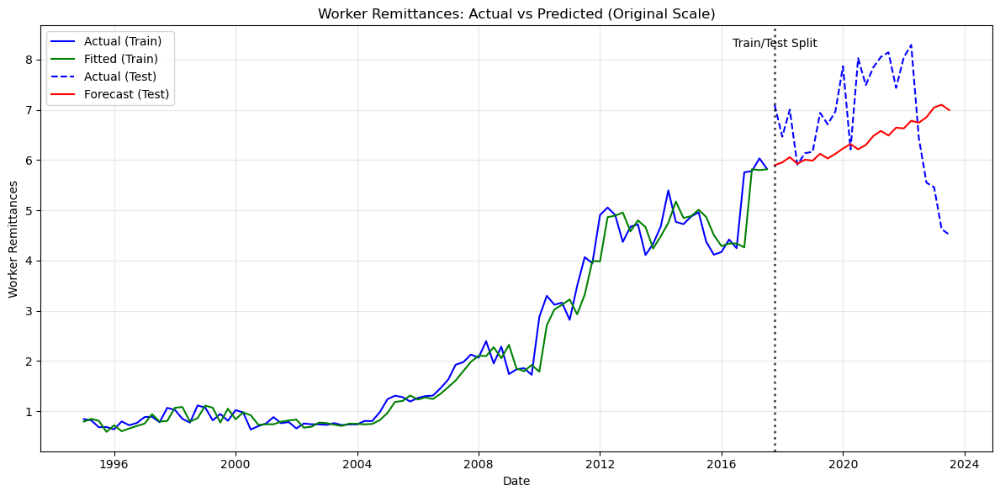

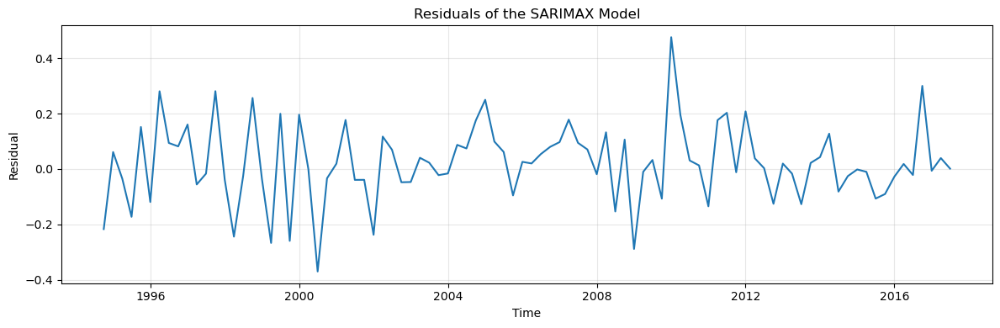

<Figure size 1200x400 with 0 Axes>

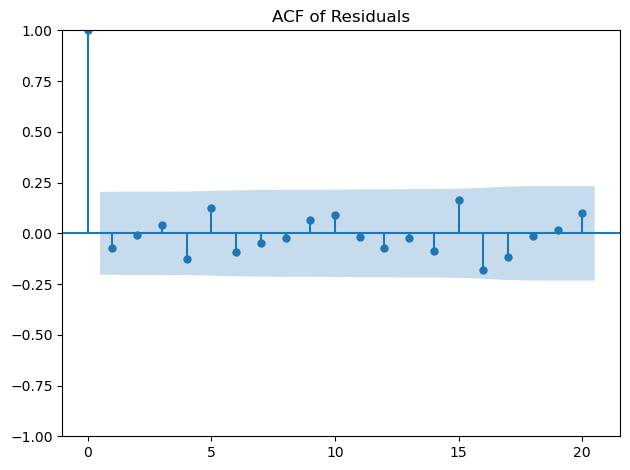

In [495]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

# ======================
# 1) Prepare Data
# ======================
df1 = df.copy()
df1.index = pd.to_datetime(df1.index)
df1 = df1.sort_index()

# Target (log)
df1["log_Remittances"] = np.log(df1["Worker_Remittances"])
df1["Parallel_Market"] = 0
df1.loc[(df1.index >= "2016-01-01") & (df1.index < "2016-11-03"), "Parallel_Market"] = 1
df1.loc[(df1.index >= "2018-01-01") & (df1.index < "2018-05-15"), "Parallel_Market"] = 1
df1.loc[(df1.index >= "2022-04-01") & (df1.index < "2022-10-27"), "Parallel_Market"] = 1

# ---- Exogenous: LOG_GCC_GDP differenced ----
df1["d_LOG_GCC_GDP"] = df1["LOG_GCC_GDP"].diff()
df1["d_Exchange_rate_EG_US"] = df1["Exchange_rate_EG_US"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df1["Post2016"] = (df1.index >= "2016-11-01").astype(int)
df1["ER_Post2016"] = df1["Exchange_rate_EG_US"] * df1["Post2016"]

# Keep rows where both target and exog are available
df1 = df1[["log_Remittances", "d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE"]].dropna()

target = "log_Remittances"
y = df1[target]
X = df1[["d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE"]]  # Fixed to include all exogenous variables

# ======================
# 2) Split Train/Test
# ======================
train_size = int(len(y) * 0.8)
train, test = y.iloc[:train_size], y.iloc[train_size:]
train_exog, test_exog = X.iloc[:train_size], X.iloc[train_size:]

# ======================
# 3) Fit SARIMAX (with differenced exog)
# ======================
model = SARIMAX(
    endog=train,
    exog=train_exog,
    order=(1,1,1),
    seasonal_order=(1,0,1,4),
    enforce_stationarity=False,
    enforce_invertibility=False
)
model_fit = model.fit(disp=False)

print(model_fit.summary())

# ======================
# 4) Fitted & Forecast
# ======================
fitted_train = model_fit.fittedvalues

fc_res = model_fit.get_forecast(steps=len(test), exog=test_exog)
forecast_test = fc_res.predicted_mean
forecast_test.index = test.index

# ======================
# 5) Evaluate (log + original scale)
# ======================
# Train
rmse_train = np.sqrt(mean_squared_error(train[1:], fitted_train[1:]))
mae_train = mean_absolute_error(train[1:], fitted_train[1:])
r2_train = r2_score(train[1:], fitted_train[1:])

# Test
rmse_test = np.sqrt(mean_squared_error(test, forecast_test))
mae_test = mean_absolute_error(test, forecast_test)
r2_test = r2_score(test, forecast_test)

print(f"[LOG] Train RMSE: {rmse_train:.4f}, Test RMSE: {rmse_test:.4f}")
print(f"[LOG] Train MAE : {mae_train:.4f}, Test MAE : {mae_test:.4f}")
print(f"[LOG] Train R²  : {r2_train:.4f}, Test R²  : {r2_test:.4f}")

# Back-transform
train_orig = np.exp(train)
fitted_train_orig = np.exp(fitted_train)
test_orig = np.exp(test)
forecast_test_orig = np.exp(forecast_test)

rmse_train_o = np.sqrt(mean_squared_error(train_orig[1:], fitted_train_orig[1:]))
mae_train_o  = mean_absolute_error(train_orig[1:], fitted_train_orig[1:])
r2_train_o   = r2_score(train_orig[1:], fitted_train_orig[1:])

rmse_test_o = np.sqrt(mean_squared_error(test_orig, forecast_test_orig))
mae_test_o  = mean_absolute_error(test_orig, forecast_test_orig)
r2_test_o   = r2_score(test_orig, forecast_test_orig)

print(f"[ORIG] Train RMSE: {rmse_train_o:.4f}, Test RMSE: {rmse_test_o:.4f}")
print(f"[ORIG] Train MAE : {mae_train_o:.4f}, Test MAE : {mae_test_o:.4f}")
print(f"[ORIG] Train R²  : {r2_train_o:.4f}, Test R²  : {r2_test_o:.4f}")

# ======================
# 6) Plot Results
# ======================
plt.figure(figsize=(12, 6))

# Plot training data
plt.plot(train_orig.index[1:], train_orig[1:], label="Actual (Train)", color='blue')
plt.plot(train_orig.index[1:], fitted_train_orig[1:], label="Fitted (Train)", color='green')

# Plot test data
plt.plot(test_orig.index, test_orig, label="Actual (Test)", color='blue', linestyle='--')
plt.plot(test_orig.index, forecast_test_orig, label="Forecast (Test)", color='red')

# Add vertical line to separate train and test
plt.axvline(x=test_orig.index[0], color="black", linestyle=":", alpha=0.7, linewidth=2)
plt.text(test_orig.index[0], plt.ylim()[1]*0.95, "Train/Test Split", ha="center")

plt.title("Worker Remittances: Actual vs Predicted (Original Scale)")
plt.xlabel("Date")
plt.ylabel("Worker Remittances")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ======================
# 7) Residual Analysis
# ======================
residuals = model_fit.resid
plt.figure(figsize=(12, 4))
plt.plot(residuals)
plt.title("Residuals of the SARIMAX Model")
plt.xlabel("Time")
plt.ylabel("Residual")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ACF of residuals
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 4))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.show()

Total number of parameter combinations: 288
Starting grid search for SARIMAX Remittances prediction...
Testing combination 1/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1267 | Test R²: 0.4296
Testing combination 2/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1267 | Test R²: 0.4296
Testing combination 3/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1313 | Test R²: 0.3877
Testing combination 4/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1313 | Test R²: 0.3877
Testing combination 5/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1312 | Test R²: 0.3879
Testing combination 6/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1312 | Test R²: 0.3879
Testing combination 7/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1301 | Test R²: 0.3982
Testing combination 8/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1301 | Test R²: 0.3982
Testing combinati

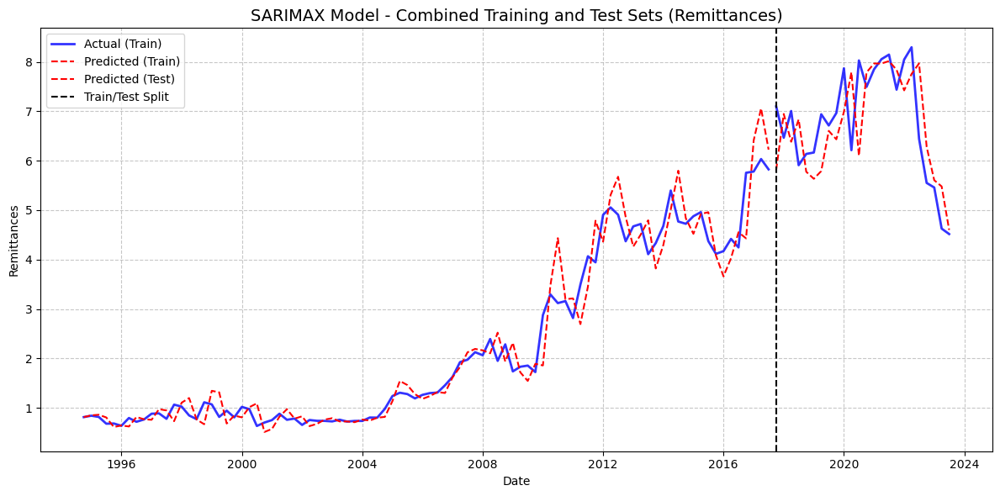


SARIMAX Model Performance (Original Scale - Remittances):
Train RMSE: 0.1789 | Test RMSE: 0.1247
Train R²: 0.9448 | Test R²: 0.4476

Model comparison saved to 'remittances_model_comparison.csv'


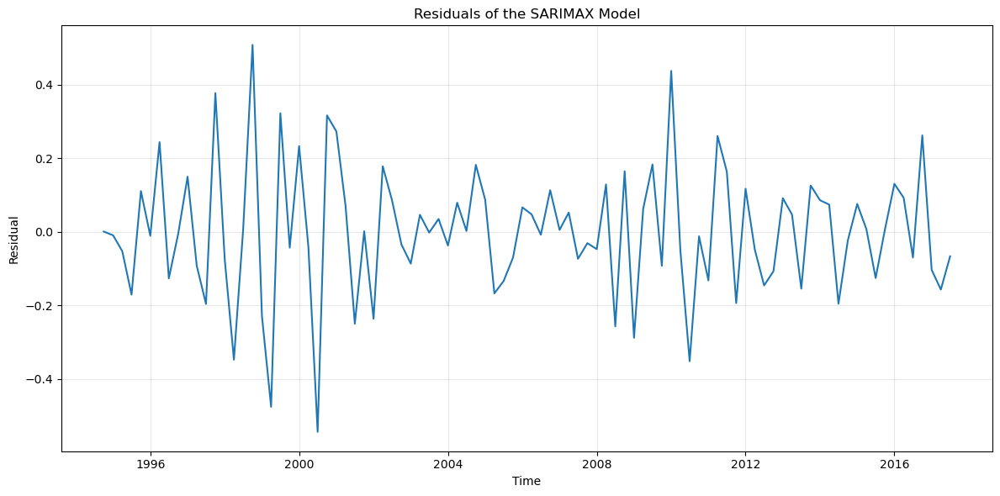

<Figure size 1200x600 with 0 Axes>

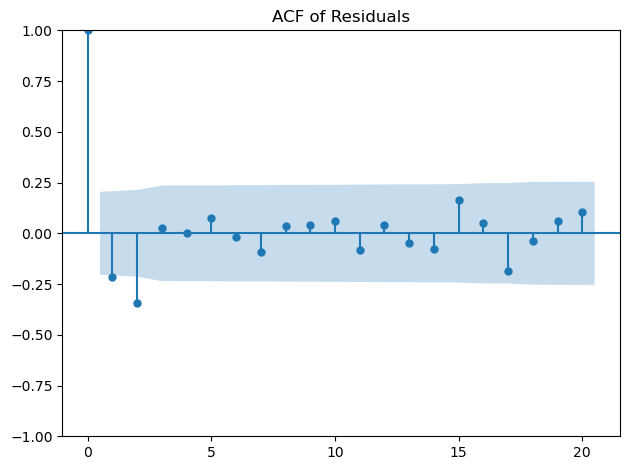


Remittances prediction with SARIMAX completed successfully!

BEST SARIMAX MODEL SUMMARY
                                     SARIMAX Results                                     
Dep. Variable:              log_Remittances_diff   No. Observations:                   92
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 4)   Log Likelihood                  23.709
Date:                           Mon, 01 Sep 2025   AIC                            -35.418
Time:                                   10:27:38   BIC                            -20.692
Sample:                               10-01-1994   HQIC                           -29.492
                                    - 07-01-2017                                         
Covariance Type:                             opg                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------

In [95]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# Create differenced version of LOG_GCC_GDP
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df_model["Post2016"] = (df_model.index >= "2016-11-01").astype(int)
df_model["ER_Post2016"] = df_model["Exchange_rate_EG_US"] * df_model["Post2016"]

# Define exogenous variables - use the differenced version of LOG_GCC_GDP
exog_vars = ["d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE"]
target = "log_Remittances"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables (except those already differenced)
for var in exog_vars:
    if var != "d_LOG_GCC_GDP":  # Skip if already differenced
        df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' if var != "d_LOG_GCC_GDP" else var for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# =============== Helper Functions ====================
def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test):
    """Evaluate SARIMAX model with given parameters"""
    try:
        # Fit SARIMAX model
        model = SARIMAX(
            endog=y_train,
            exog=X_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        model_fit = model.fit(disp=False)
        
        # Get predictions
        y_train_pred = model_fit.fittedvalues
        y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        
        # Convert back to original scale
        y_train_hat = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat = inverse_differencing(original_target, y_test_pred, y_test.index)
        
        # Get actual values in original scale
        y_train_true = original_target.loc[y_train.index]
        y_test_true = original_target.loc[y_test.index]
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)
        
        return {
            'order': order,
            'seasonal_order': seasonal_order,
            'aic': model_fit.aic,
            'bic': model_fit.bic,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2],
    'd': [0, 1],
    'q': [0, 1, 2],
    'P': [0, 1],
    'D': [0, 1],
    'Q': [0, 1],
    's': [0, 4]  # seasonal period
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
results = []
best_test_rmse = float('inf')
best_result = None

print("Starting grid search for SARIMAX Remittances prediction...")
for i, params in enumerate(all_params, start=1):
    order = (params['p'], params['d'], params['q'])
    seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
    
    print(f"Testing combination {i}/{len(all_params)}: order={order}, seasonal_order={seasonal_order}")
    
    # Evaluate model
    result = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test)
    
    if 'error' in result:
        print(f"  Error: {result['error']}")
        continue
    
    results.append(result)
    
    print(f"  Test RMSE: {result['test_rmse']:.4f} | Test R²: {result['test_r2']:.4f}")
    
    # Update best model if this one is better
    if result['test_rmse'] < best_test_rmse:
        best_test_rmse = result['test_rmse']
        best_result = result

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'aic': r.get('aic', None),
    'bic': r.get('bic', None),
    'train_rmse': r.get('train_rmse', None),
    'test_rmse': r.get('test_rmse', None),
    'train_r2': r.get('train_r2', None),
    'test_r2': r.get('test_r2', None),
    'error': r.get('error', None)
} for r in results])

results_df.to_csv('remittances_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_sarimax_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Test R²: {best_result['test_r2']:.4f}")
print(f"Test RMSE: {best_result['test_rmse']:.4f}")

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Save model summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# =============== Combined Plot =================
plt.figure(figsize=(12, 6))
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', linewidth=2, alpha=0.8, color='blue')
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', linewidth=1.5, color='red', label='Predicted (Test)')
plt.axvline(x=yte_true.index[0], color='k', linestyle='--', label='Train/Test Split')
plt.title('SARIMAX Model - Combined Training and Test Sets (Remittances)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('remittances_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nSARIMAX Model Performance (Original Scale - Remittances):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")

# =============== Residual Analysis =================
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title("Residuals of the SARIMAX Model")
plt.xlabel("Time")
plt.ylabel("Residual")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('remittances_sarimax_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

# ACF of residuals
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 6))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.savefig('remittances_sarimax_acf.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nRemittances prediction with SARIMAX completed successfully!")

# Print model summary
print("\n" + "="*50)
print("BEST SARIMAX MODEL SUMMARY")
print("="*50)
print(best_result['model_fit'].summary())

Total number of parameter combinations: 288
Starting grid search for SARIMAX Remittances prediction...
Testing combination 1/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1267 | Test R²: 0.4296
Testing combination 2/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1267 | Test R²: 0.4296
Testing combination 3/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1313 | Test R²: 0.3877
Testing combination 4/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1313 | Test R²: 0.3877
Testing combination 5/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1312 | Test R²: 0.3879
Testing combination 6/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1312 | Test R²: 0.3879
Testing combination 7/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1301 | Test R²: 0.3982
Testing combination 8/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1301 | Test R²: 0.3982
Testing combinati

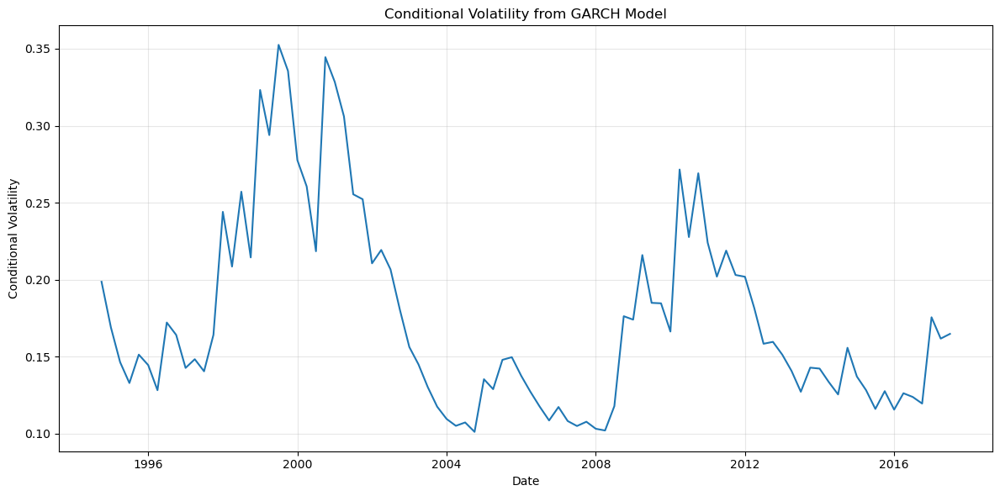

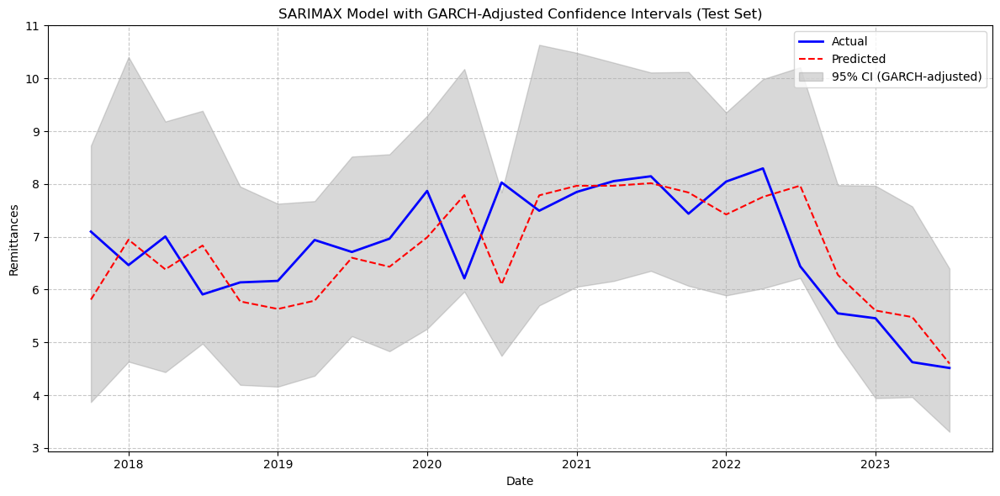

GARCH-adjusted predictions saved to 'remittances_sarimax_garch_adjusted.csv'
Model summary saved as 'remittances_sarimax_model_summary.txt'


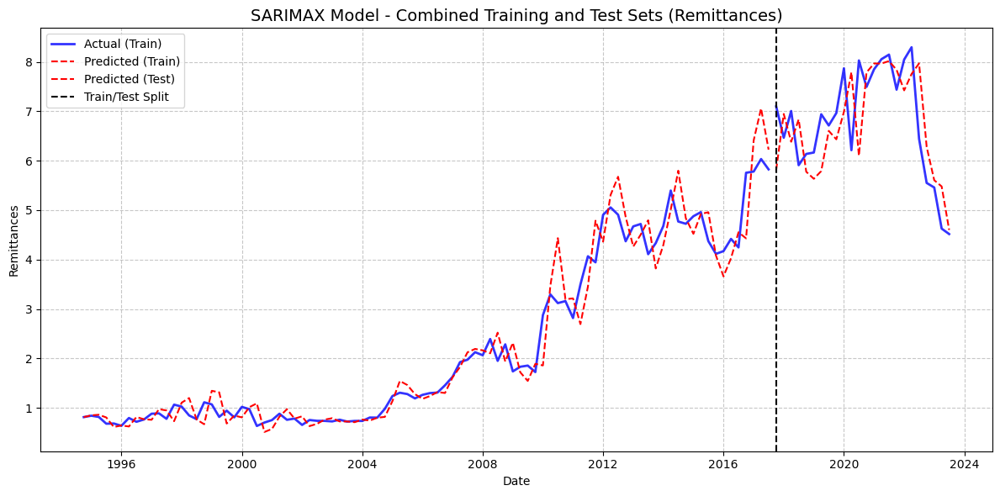


SARIMAX Model Performance (Original Scale - Remittances):
Train RMSE: 0.4055 | Test RMSE: 0.8349
Train R²: 0.9431 | Test R²: 0.3921

Model comparison saved to 'remittances_model_comparison.csv'


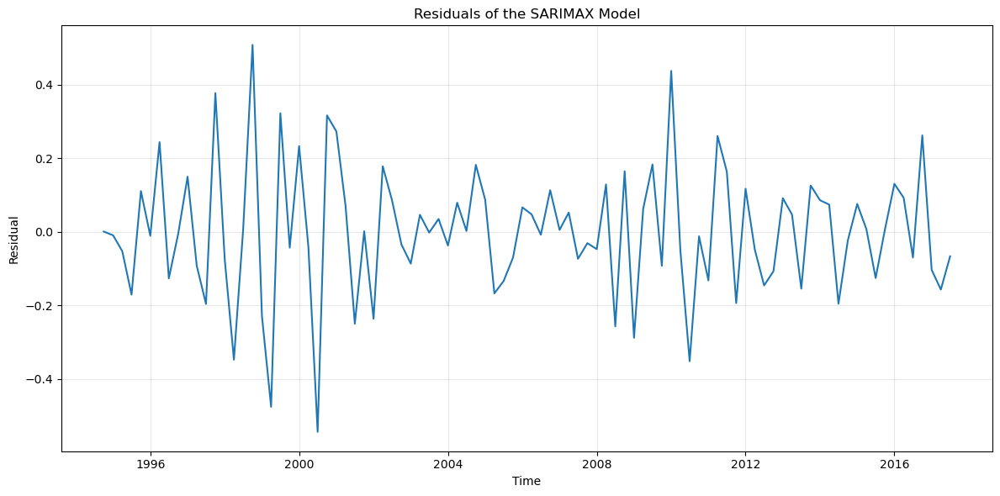

<Figure size 1200x600 with 0 Axes>

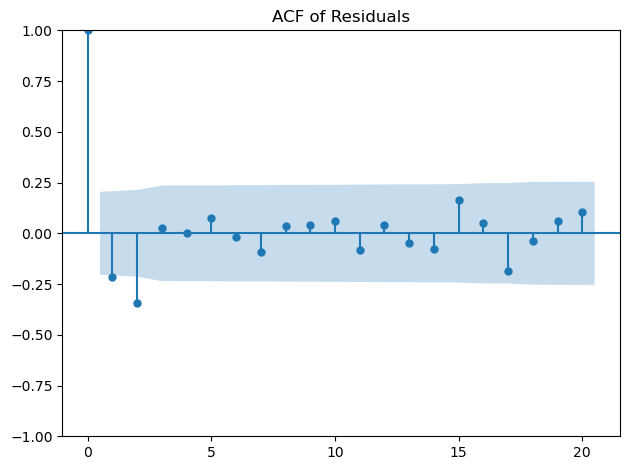


Remittances prediction with SARIMAX completed successfully!

BEST SARIMAX MODEL SUMMARY
                                     SARIMAX Results                                     
Dep. Variable:              log_Remittances_diff   No. Observations:                   92
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 4)   Log Likelihood                  23.709
Date:                           Mon, 01 Sep 2025   AIC                            -35.418
Time:                                   10:42:52   BIC                            -20.692
Sample:                               10-01-1994   HQIC                           -29.492
                                    - 07-01-2017                                         
Covariance Type:                             opg                                         
                                   coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------

In [99]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid
from arch import arch_model

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# Create differenced version of LOG_GCC_GDP
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df_model["Post2016"] = (df_model.index >= "2016-11-01").astype(int)
df_model["ER_Post2016"] = df_model["Exchange_rate_EG_US"] * df_model["Post2016"]

# Define exogenous variables - use the differenced version of LOG_GCC_GDP
exog_vars = ["d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE"]
target = "log_Remittances"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables (except those already differenced)
for var in exog_vars:
    if var != "d_LOG_GCC_GDP":  # Skip if already differenced
        df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' if var != "d_LOG_GCC_GDP" else var for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# =============== Helper Functions ====================
def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test):
    """Evaluate SARIMAX model with given parameters"""
    try:
        # Fit SARIMAX model
        model = SARIMAX(
            endog=y_train,
            exog=X_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        model_fit = model.fit(disp=False)
        
        # Get predictions
        y_train_pred = model_fit.fittedvalues
        y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        
        # Convert back to original scale
        y_train_hat = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat = inverse_differencing(original_target, y_test_pred, y_test.index)
        
        # Get actual values in original scale
        y_train_true = original_target.loc[y_train.index]
        y_test_true = original_target.loc[y_test.index]
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)
        
        return {
            'order': order,
            'seasonal_order': seasonal_order,
            'aic': model_fit.aic,
            'bic': model_fit.bic,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true,
            'residuals': model_fit.resid
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2],
    'd': [0, 1],
    'q': [0, 1, 2],
    'P': [0, 1],
    'D': [0, 1],
    'Q': [0, 1],
    's': [0, 4]  # seasonal period
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
results = []
best_test_rmse = float('inf')
best_result = None

print("Starting grid search for SARIMAX Remittances prediction...")
for i, params in enumerate(all_params, start=1):
    order = (params['p'], params['d'], params['q'])
    seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
    
    print(f"Testing combination {i}/{len(all_params)}: order={order}, seasonal_order={seasonal_order}")
    
    # Evaluate model
    result = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test)
    
    if 'error' in result:
        print(f"  Error: {result['error']}")
        continue
    
    results.append(result)
    
    print(f"  Test RMSE: {result['test_rmse']:.4f} | Test R²: {result['test_r2']:.4f}")
    
    # Update best model if this one is better
    if result['test_rmse'] < best_test_rmse:
        best_test_rmse = result['test_rmse']
        best_result = result

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'aic': r.get('aic', None),
    'bic': r.get('bic', None),
    'train_rmse': r.get('train_rmse', None),
    'test_rmse': r.get('test_rmse', None),
    'train_r2': r.get('train_r2', None),
    'test_r2': r.get('test_r2', None),
    'error': r.get('error', None)
} for r in results])

results_df.to_csv('remittances_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_sarimax_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Test R²: {best_result['test_r2']:.4f}")
print(f"Test RMSE: {best_result['test_rmse']:.4f}")

# =============== GARCH Modeling for Residuals =================
print("\nFitting GARCH model for residual volatility...")

# Extract residuals from the best model
residuals = best_result['residuals']

# Check for ARCH effects (heteroscedasticity)
from statsmodels.stats.diagnostic import het_arch
arch_test = het_arch(residuals)
print(f"ARCH test p-value: {arch_test[1]:.4f}")

if arch_test[1] < 0.05:
    print("Significant ARCH effects detected. Fitting GARCH model.")
    
    # Fit GARCH model to residuals
    garch_model = arch_model(residuals, vol='Garch', p=1, q=1)
    garch_fit = garch_model.fit(disp='off')
    
    print("\nGARCH Model Summary:")
    print(garch_fit.summary())
    
    # Get conditional volatility
    conditional_volatility = garch_fit.conditional_volatility
    
    # Plot conditional volatility
    plt.figure(figsize=(12, 6))
    plt.plot(residuals.index, conditional_volatility)
    plt.title('Conditional Volatility from GARCH Model')
    plt.xlabel('Date')
    plt.ylabel('Conditional Volatility')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig('remittances_garch_volatility.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Adjust predictions based on GARCH volatility
    # This is a simplified approach - in practice, you might want to refit the SARIMAX model
    # with GARCH errors or use a different modeling approach
    
    # Calculate volatility-adjusted confidence intervals
    z_score = 1.96  # For 95% confidence interval
    volatility_factor = conditional_volatility / conditional_volatility.mean()
    
    # Adjust test predictions
    y_test_pred_adj = best_result['test_pred'].copy()
    y_test_pred_adj_upper = y_test_pred_adj + z_score * volatility_factor[-len(y_test_pred_adj):].values * np.std(residuals)
    y_test_pred_adj_lower = y_test_pred_adj - z_score * volatility_factor[-len(y_test_pred_adj):].values * np.std(residuals)
    
    # Convert to original scale
    y_test_pred_adj_orig = np.exp(y_test_pred_adj)
    y_test_pred_adj_upper_orig = np.exp(y_test_pred_adj_upper)
    y_test_pred_adj_lower_orig = np.exp(y_test_pred_adj_lower)
    
    # Plot with GARCH-adjusted confidence intervals
    yte_true_orig = np.exp(best_result['test_actual'])
    
    plt.figure(figsize=(12, 6))
    plt.plot(yte_true_orig.index, yte_true_orig, 'b-', label='Actual', linewidth=2)
    plt.plot(y_test_pred_adj_orig.index, y_test_pred_adj_orig, 'r--', label='Predicted', linewidth=1.5)
    plt.fill_between(y_test_pred_adj_orig.index, 
                    y_test_pred_adj_lower_orig, 
                    y_test_pred_adj_upper_orig, 
                    color='gray', alpha=0.3, label='95% CI (GARCH-adjusted)')
    plt.title('SARIMAX Model with GARCH-Adjusted Confidence Intervals (Test Set)')
    plt.xlabel('Date')
    plt.ylabel('Remittances')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig('remittances_sarimax_garch_adjusted.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # Save GARCH-adjusted predictions
    garch_adj_df = pd.DataFrame({
        'date': y_test_pred_adj_orig.index,
        'actual': yte_true_orig.values,
        'predicted': y_test_pred_adj_orig.values,
        'lower_ci': y_test_pred_adj_lower_orig.values,
        'upper_ci': y_test_pred_adj_upper_orig.values
    })
    garch_adj_df.to_csv('remittances_sarimax_garch_adjusted.csv', index=False)
    print("GARCH-adjusted predictions saved to 'remittances_sarimax_garch_adjusted.csv'")
else:
    print("No significant ARCH effects detected. Proceeding without GARCH adjustment.")

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(np.exp(ytr_true), np.exp(ytr_hat)))
test_rmse_orig = np.sqrt(mean_squared_error(np.exp(yte_true), np.exp(yte_hat)))
train_r2_orig = r2_score(np.exp(ytr_true), np.exp(ytr_hat))
test_r2_orig = r2_score(np.exp(yte_true), np.exp(yte_hat))

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Save model summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# =============== Combined Plot =================
plt.figure(figsize=(12, 6))
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', linewidth=2, alpha=0.8, color='blue')
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', linewidth=1.5, color='red', label='Predicted (Test)')
plt.axvline(x=yte_true.index[0], color='k', linestyle='--', label='Train/Test Split')
plt.title('SARIMAX Model - Combined Training and Test Sets (Remittances)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('remittances_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nSARIMAX Model Performance (Original Scale - Remittances):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'AIC': best_result['aic'],
    'BIC': best_result['bic'],
    'ARCH_Test_pvalue': arch_test[1] if 'arch_test' in locals() else None
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")

# =============== Residual Analysis =================
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title("Residuals of the SARIMAX Model")
plt.xlabel("Time")
plt.ylabel("Residual")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('remittances_sarimax_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

# ACF of residuals
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 6))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.savefig('remittances_sarimax_acf.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nRemittances prediction with SARIMAX completed successfully!")

# Print model summary
print("\n" + "="*50)
print("BEST SARIMAX MODEL SUMMARY")
print("="*50)
print(best_result['model_fit'].summary())

Total number of parameter combinations: 288
Starting grid search for SARIMAX Remittances prediction...
Testing combination 1/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1281 | Test R²: 0.4170
Testing combination 2/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1281 | Test R²: 0.4170
Testing combination 3/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1281 | Test R²: 0.4170
Testing combination 4/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1281 | Test R²: 0.4170
Testing combination 5/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1288 | Test R²: 0.4107
Testing combination 6/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1288 | Test R²: 0.4107
Testing combination 7/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 0)
  Test RMSE: 0.1279 | Test R²: 0.4183
Testing combination 8/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 4)
  Test RMSE: 0.1279 | Test R²: 0.4183
Testing combinati

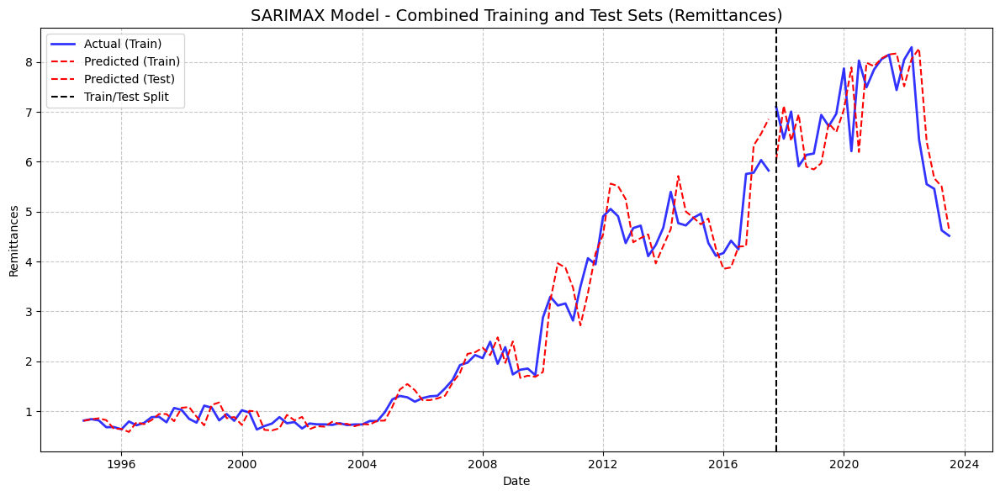


SARIMAX Model Performance (Original Scale - Remittances):
Train RMSE: 0.1653 | Test RMSE: 0.1241
Train R²: 0.9529 | Test R²: 0.4526

Model comparison saved to 'remittances_model_comparison.csv'


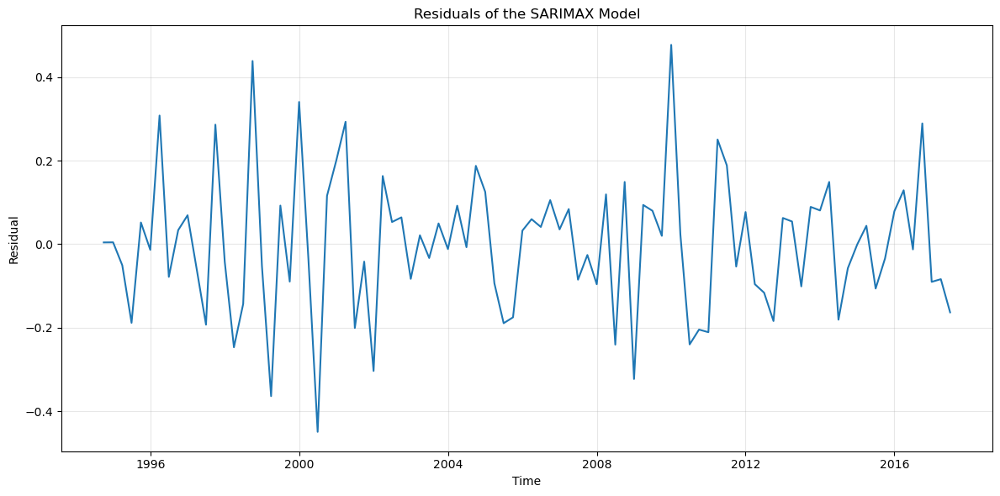

<Figure size 1200x600 with 0 Axes>

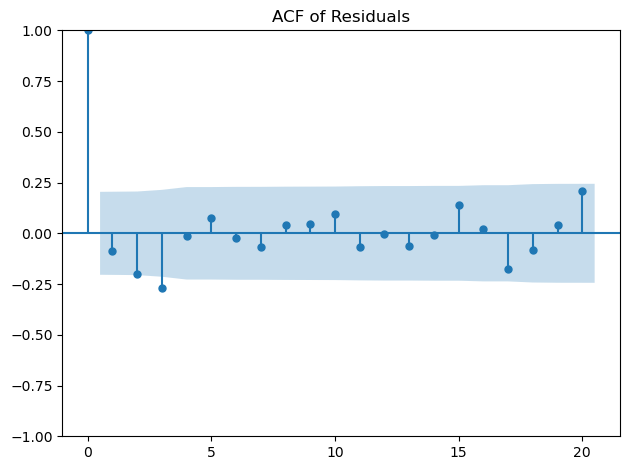


Remittances prediction with SARIMAX completed successfully!

BEST SARIMAX MODEL SUMMARY
                                      SARIMAX Results                                      
Dep. Variable:                log_Remittances_diff   No. Observations:                   92
Model:             SARIMAX(2, 1, 0)x(1, 0, [1], 4)   Log Likelihood                  31.370
Date:                             Mon, 01 Sep 2025   AIC                            -50.740
Time:                                     10:01:44   BIC                            -36.084
Sample:                                 10-01-1994   HQIC                           -44.845
                                      - 07-01-2017                                         
Covariance Type:                               opg                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
d_LOG_GCC_G

In [87]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# Create differenced version of LOG_GCC_GDP
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df_model["Post2016"] = (df_model.index >= "2016-11-01").astype(int)
df_model["ER_Post2016"] = df_model["Exchange_rate_EG_US"] * df_model["Post2016"]

# Define exogenous variables - use the differenced version of LOG_GCC_GDP
exog_vars = ["d_LOG_GCC_GDP"]
target = "log_Remittances"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables (except those already differenced)
for var in exog_vars:
    if var != "d_LOG_GCC_GDP":  # Skip if already differenced
        df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' if var != "d_LOG_GCC_GDP" else var for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# =============== Helper Functions ====================
def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test):
    """Evaluate SARIMAX model with given parameters"""
    try:
        # Fit SARIMAX model
        model = SARIMAX(
            endog=y_train,
            exog=X_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        model_fit = model.fit(disp=False)
        
        # Get predictions
        y_train_pred = model_fit.fittedvalues
        y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        
        # Convert back to original scale
        y_train_hat = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat = inverse_differencing(original_target, y_test_pred, y_test.index)
        
        # Get actual values in original scale
        y_train_true = original_target.loc[y_train.index]
        y_test_true = original_target.loc[y_test.index]
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)
        
        return {
            'order': order,
            'seasonal_order': seasonal_order,
            'aic': model_fit.aic,
            'bic': model_fit.bic,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2],
    'd': [0, 1],
    'q': [0, 1, 2],
    'P': [0, 1],
    'D': [0, 1],
    'Q': [0, 1],
    's': [0, 4]  # seasonal period
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
results = []
best_test_rmse = float('inf')
best_result = None

print("Starting grid search for SARIMAX Remittances prediction...")
for i, params in enumerate(all_params, start=1):
    order = (params['p'], params['d'], params['q'])
    seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
    
    print(f"Testing combination {i}/{len(all_params)}: order={order}, seasonal_order={seasonal_order}")
    
    # Evaluate model
    result = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test)
    
    if 'error' in result:
        print(f"  Error: {result['error']}")
        continue
    
    results.append(result)
    
    print(f"  Test RMSE: {result['test_rmse']:.4f} | Test R²: {result['test_r2']:.4f}")
    
    # Update best model if this one is better
    if result['test_rmse'] < best_test_rmse:
        best_test_rmse = result['test_rmse']
        best_result = result

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'aic': r.get('aic', None),
    'bic': r.get('bic', None),
    'train_rmse': r.get('train_rmse', None),
    'test_rmse': r.get('test_rmse', None),
    'train_r2': r.get('train_r2', None),
    'test_r2': r.get('test_r2', None),
    'error': r.get('error', None)
} for r in results])

results_df.to_csv('remittances_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_sarimax_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Test R²: {best_result['test_r2']:.4f}")
print(f"Test RMSE: {best_result['test_rmse']:.4f}")

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Save model summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# =============== Combined Plot =================
plt.figure(figsize=(12, 6))
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', linewidth=2, alpha=0.8, color='blue')
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', linewidth=1.5, color='red', label='Predicted (Test)')
plt.axvline(x=yte_true.index[0], color='k', linestyle='--', label='Train/Test Split')
plt.title('SARIMAX Model - Combined Training and Test Sets (Remittances)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('remittances_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nSARIMAX Model Performance (Original Scale - Remittances):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")

# =============== Residual Analysis =================
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title("Residuals of the SARIMAX Model")
plt.xlabel("Time")
plt.ylabel("Residual")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('remittances_sarimax_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

# ACF of residuals
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 6))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.savefig('remittances_sarimax_acf.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nRemittances prediction with SARIMAX completed successfully!")

# Print model summary
print("\n" + "="*50)
print("BEST SARIMAX MODEL SUMMARY")
print("="*50)
print(best_result['model_fit'].summary())

Total number of parameter combinations: 288

Running grid search with exogenous features: True
Testing combination 1/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 0), use_exog=True
  Test RMSE: 0.1267 | Test R²: 0.4296
Testing combination 2/288: order=(0, 0, 0), seasonal_order=(0, 0, 0, 4), use_exog=True
  Test RMSE: 0.1267 | Test R²: 0.4296
Testing combination 3/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 0), use_exog=True
  Test RMSE: 0.1313 | Test R²: 0.3877
Testing combination 4/288: order=(0, 0, 1), seasonal_order=(0, 0, 0, 4), use_exog=True
  Test RMSE: 0.1313 | Test R²: 0.3877
Testing combination 5/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 0), use_exog=True
  Test RMSE: 0.1312 | Test R²: 0.3879
Testing combination 6/288: order=(0, 0, 2), seasonal_order=(0, 0, 0, 4), use_exog=True
  Test RMSE: 0.1312 | Test R²: 0.3879
Testing combination 7/288: order=(1, 0, 0), seasonal_order=(0, 0, 0, 0), use_exog=True
  Test RMSE: 0.1301 | Test R²: 0.3982
Testing combination 8/288: ord

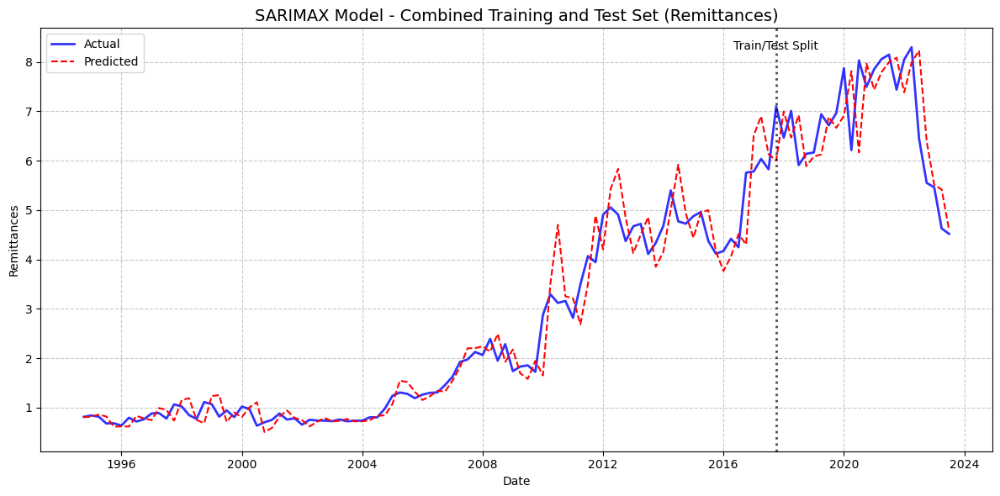


SARIMAX Model Performance (Original Scale - Remittances):
Train RMSE: 0.1817 | Test RMSE: 0.1215
Train R²: 0.9430 | Test R²: 0.4757

Model comparison saved to 'remittances_model_comparison.csv'


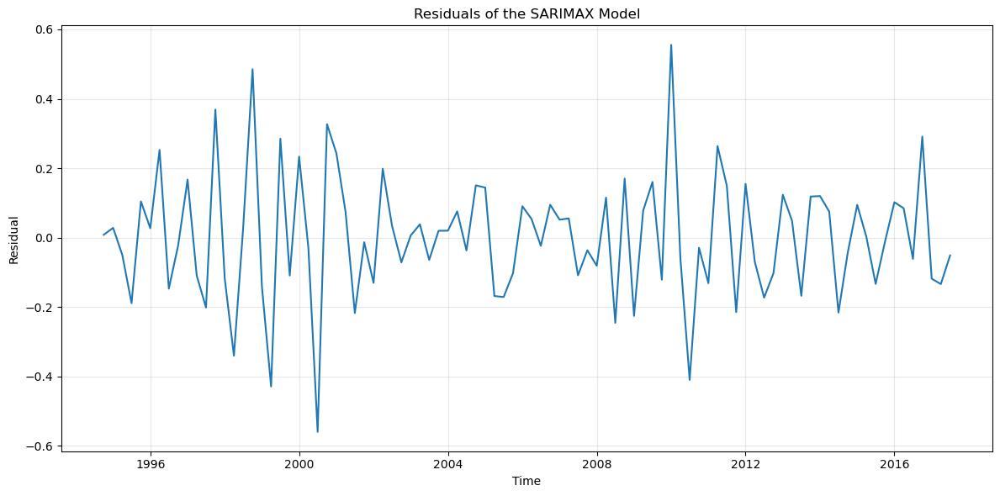

<Figure size 1200x600 with 0 Axes>

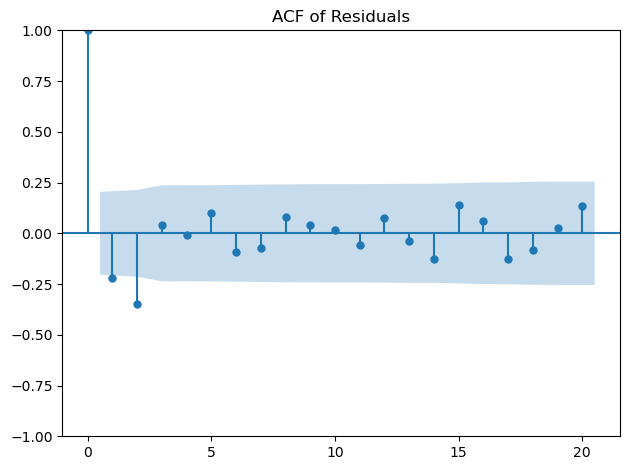


Remittances prediction with SARIMAX completed successfully!


In [63]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# Create differenced version of LOG_GCC_GDP
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df_model["Post2016"] = (df_model.index >= "2016-11-01").astype(int)
df_model["ER_Post2016"] = df_model["Exchange_rate_EG_US"] * df_model["Post2016"]

# Define exogenous variables - use the differenced version of LOG_GCC_GDP
exog_vars = ["d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE"]
target = "log_Remittances"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables (except those already differenced)
for var in exog_vars:
    if var != "d_LOG_GCC_GDP":  # Skip if already differenced
        df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' if var != "d_LOG_GCC_GDP" else var for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# =============== Helper Functions ====================
def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test, use_exog=True):
    """Evaluate SARIMAX model with given parameters"""
    try:
        # Fit SARIMAX model
        if use_exog:
            model = SARIMAX(
                endog=y_train,
                exog=X_train,
                order=order,
                seasonal_order=seasonal_order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
        else:
            model = SARIMAX(
                endog=y_train,
                order=order,
                seasonal_order=seasonal_order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            
        model_fit = model.fit(disp=False)
        
        # Get predictions
        y_train_pred = model_fit.fittedvalues
        
        if use_exog:
            y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        else:
            y_test_pred = model_fit.get_forecast(steps=len(y_test)).predicted_mean
        
        # Convert back to original scale
        y_train_hat = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat = inverse_differencing(original_target, y_test_pred, y_test.index)
        
        # Get actual values in original scale
        y_train_true = original_target.loc[y_train.index]
        y_test_true = original_target.loc[y_test.index]
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)
        
        return {
            'order': order,
            'seasonal_order': seasonal_order,
            'use_exog': use_exog,
            'aic': model_fit.aic,
            'bic': model_fit.bic,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'use_exog': use_exog, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2],
    'd': [0, 1],
    'q': [0, 1, 2],
    'P': [0, 1],
    'D': [0, 1],
    'Q': [0, 1],
    's': [0, 4]  # seasonal period
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
results = []
best_test_rmse = float('inf')
best_result = None

# Try both with and without exogenous features
for use_exog in [True, False]:
    print(f"\n{'='*50}")
    print(f"Running grid search with exogenous features: {use_exog}")
    print(f"{'='*50}")
    
    for i, params in enumerate(all_params, start=1):
        order = (params['p'], params['d'], params['q'])
        seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
        
        print(f"Testing combination {i}/{len(all_params)}: order={order}, seasonal_order={seasonal_order}, use_exog={use_exog}")
        
        # Evaluate model
        result = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test, use_exog)
        
        if 'error' in result:
            print(f"  Error: {result['error']}")
            continue
        
        results.append(result)
        
        print(f"  Test RMSE: {result['test_rmse']:.4f} | Test R²: {result['test_r2']:.4f}")
        
        # Update best model if this one is better
        if result['test_rmse'] < best_test_rmse:
            best_test_rmse = result['test_rmse']
            best_result = result

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'use_exog': r.get('use_exog', None),
    'aic': r.get('aic', None),
    'bic': r.get('bic', None),
    'train_rmse': r.get('train_rmse', None),
    'test_rmse': r.get('test_rmse', None),
    'train_r2': r.get('train_r2', None),
    'test_r2': r.get('test_r2', None),
    'error': r.get('error', None)
} for r in results])

results_df.to_csv('remittances_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_sarimax_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Uses exogenous features: {best_result['use_exog']}")
print(f"Test R²: {best_result['test_r2']:.4f}")
print(f"Test RMSE: {best_result['test_rmse']:.4f}")

# Print model summary
print("\n" + "="*60)
print("MODEL SUMMARY:")
print("="*60)
print(best_result['model_fit'].summary())

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Save model summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# =============== Combined Plot Results =================
plt.figure(figsize=(12, 6))

# Combine all data for plotting
all_actual = pd.concat([ytr_true, yte_true])
all_pred = pd.concat([ytr_hat, yte_hat])

# Convert back to original scale for plotting
all_actual_orig = np.exp(all_actual)
all_pred_orig = np.exp(all_pred)

# Plot all data
plt.plot(all_actual_orig.index, all_actual_orig, 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(all_pred_orig.index, all_pred_orig, 'r--', label='Predicted', linewidth=1.5)

# Add vertical line to separate train and test
plt.axvline(x=yte_true.index[0], color="black", linestyle=":", alpha=0.7, linewidth=2)
plt.text(yte_true.index[0], plt.ylim()[1]*0.95, "Train/Test Split", ha="center")

plt.title('SARIMAX Model - Combined Training and Test Set (Remittances)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('remittances_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nSARIMAX Model Performance (Original Scale - Remittances):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Uses_Exogenous': best_result['use_exog'],
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")

# =============== Residual Analysis =================
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 6))
plt.plot(residuals)
plt.title("Residuals of the SARIMAX Model")
plt.xlabel("Time")
plt.ylabel("Residual")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('remittances_sarimax_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

# ACF of residuals
from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 6))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.savefig('remittances_sarimax_acf.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nRemittances prediction with SARIMAX completed successfully!")

Optimal lags for target: [1]
Optimal lags for d_LOG_GCC_GDP: [1, 4, 5]
Optimal lags for ER_Post2016: [1, 2]
Optimal lags for EGYPT_INFLATION_PCHANGE: [1, 2, 3, 4, 5]
Optimal lags for Exchange_rate_EG_US: [5]
Optimal lags for LOG_GCC_GDP: [1, 4, 5]
Optimal lags for Post2016: [1, 2, 3, 4, 5, 6]
Total number of feature combinations: 27895
Total number of parameter combinations: 8
Starting feature selection with lagged variables...


Feature sets: 100%|██████████| 27895/27895 [3:14:53<00:00,  2.39it/s]      


Best feature set: ['log_Remittances_diff_lag1', 'd_LOG_GCC_GDP_lag4', 'EGYPT_INFLATION_PCHANGE_diff_lag2', 'EGYPT_INFLATION_PCHANGE_diff_lag4', 'Exchange_rate_EG_US_diff_lag5']
Test RMSE with best features: 0.1173

Starting hyperparameter tuning with best features...


Parameter tuning: 100%|██████████| 8/8 [00:02<00:00,  3.81it/s]


Feature selection results saved to 'remittances_sarimax_lagged_features_results.csv'

Best SARIMAX model for Remittances prediction:
Features: ['log_Remittances_diff_lag1', 'd_LOG_GCC_GDP_lag4', 'EGYPT_INFLATION_PCHANGE_diff_lag2', 'EGYPT_INFLATION_PCHANGE_diff_lag4', 'Exchange_rate_EG_US_diff_lag5']
Order: (1, 0, 1)
Seasonal Order: (0, 0, 0, 4)
Test R²: 0.5467
Test RMSE: 0.1151
Model summary saved as 'remittances_sarimax_model_summary.txt'
Feature importance saved to 'remittances_sarimax_feature_importance.csv'


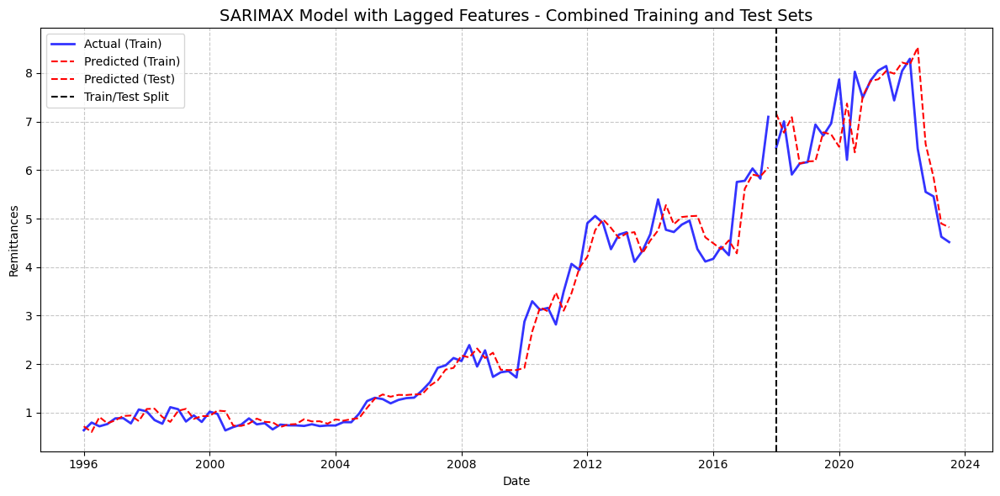


SARIMAX Model Performance with Lagged Features (Original Scale - Remittances):
Train RMSE: 0.1399 | Test RMSE: 0.1151
Train R²: 0.9669 | Test R²: 0.5467

Model comparison saved to 'remittances_model_comparison_lagged.csv'

Remittances prediction with SARIMAX and lagged features completed successfully!


In [67]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid
import itertools
from tqdm import tqdm
from statsmodels.tsa.stattools import acf, pacf

# =============== Data Preparation with Lags ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# Create differenced version of LOG_GCC_GDP
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df_model["Post2016"] = (df_model.index >= "2016-11-01").astype(int)
df_model["ER_Post2016"] = df_model["Exchange_rate_EG_US"] * df_model["Post2016"]

# Define all potential exogenous variables
potential_exog_vars = ["d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE", 
                       "Exchange_rate_EG_US", "LOG_GCC_GDP", "Post2016"]
target = "log_Remittances"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables (except those already differenced)
for var in potential_exog_vars:
    if var != "d_LOG_GCC_GDP" and var != "Post2016":  # Skip if already differenced or dummy
        df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# =============== Create Lagged Features ================
# Determine optimal lags using ACF and PACF
def determine_optimal_lags(series, max_lags=6):
    """Determine optimal lag order using ACF and PACF"""
    acf_values = acf(series.dropna(), nlags=max_lags)
    pacf_values = pacf(series.dropna(), nlags=max_lags)
    
    # Find significant lags (outside 95% confidence interval)
    conf_int = 1.96 / np.sqrt(len(series.dropna()))
    sig_acf_lags = [i for i in range(1, len(acf_values)) if abs(acf_values[i]) > conf_int]
    sig_pacf_lags = [i for i in range(1, len(pacf_values)) if abs(pacf_values[i]) > conf_int]
    
    # Return union of significant lags
    optimal_lags = list(set(sig_acf_lags + sig_pacf_lags))
    return sorted(optimal_lags) if optimal_lags else [1, 2]  # Default to 1 and 2 if none found

# Determine optimal lags for target variable
target_lags = determine_optimal_lags(df_model[target + "_diff"])
print(f"Optimal lags for target: {target_lags}")

# Create lagged versions of the target variable
for lag in target_lags:
    df_model[f'{target}_diff_lag{lag}'] = df_model[target + "_diff"].shift(lag)

# Create lagged versions of exogenous variables (differenced)
lagged_exog_vars = []
for var in potential_exog_vars:
    if var != "d_LOG_GCC_GDP" and var != "Post2016":
        diff_var = f'{var}_diff'
        var_lags = determine_optimal_lags(df_model[diff_var])
        print(f"Optimal lags for {var}: {var_lags}")
        
        for lag in var_lags:
            lagged_var_name = f'{diff_var}_lag{lag}'
            df_model[lagged_var_name] = df_model[diff_var].shift(lag)
            lagged_exog_vars.append(lagged_var_name)
    else:
        # For variables that are already differenced or dummy variables
        var_lags = determine_optimal_lags(df_model[var])
        print(f"Optimal lags for {var}: {var_lags}")
        
        for lag in var_lags:
            lagged_var_name = f'{var}_lag{lag}'
            df_model[lagged_var_name] = df_model[var].shift(lag)
            lagged_exog_vars.append(lagged_var_name)

# Remove rows with NaN values (created by differencing and lagging)
df_diff = df_model.dropna().copy()

# All potential features including lags
all_potential_features = [f'{target}_diff_lag{lag}' for lag in target_lags] + lagged_exog_vars

# Time-based train/test split (80/20)
train_size = int(len(df_diff) * 0.8)
train_indices = df_diff.index[:train_size]
test_indices = df_diff.index[train_size:]

# =============== Feature Selection Functions ====================
def generate_feature_combinations(variables, max_features=5):
    """Generate all possible combinations of features with a maximum number of features"""
    combinations = []
    for r in range(1, min(max_features + 1, len(variables) + 1)):
        combinations.extend(list(itertools.combinations(variables, r)))
    return [list(comb) for comb in combinations]

def evaluate_sarimax_model_with_features(feature_set, order, seasonal_order, df_diff, train_indices, test_indices, original_target):
    """Evaluate SARIMAX model with given features and parameters"""
    try:
        # Prepare data
        X = df_diff[feature_set]
        y = df_diff[f'{target}_diff']
        
        X_train, X_test = X.loc[train_indices], X.loc[test_indices]
        y_train, y_test = y.loc[train_indices], y.loc[test_indices]
        
        # Fit SARIMAX model
        model = SARIMAX(
            endog=y_train,
            exog=X_train,
            order=order,
            seasonal_order=seasonal_order,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        model_fit = model.fit(disp=False, maxiter=200)
        
        # Get predictions
        y_train_pred = model_fit.fittedvalues
        y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        
        # Convert back to original scale
        y_train_hat = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat = inverse_differencing(original_target, y_test_pred, y_test.index)
        
        # Get actual values in original scale
        y_train_true = original_target.loc[y_train.index]
        y_test_true = original_target.loc[y_test.index]
        
        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)
        
        return {
            'feature_set': feature_set,
            'order': order,
            'seasonal_order': seasonal_order,
            'aic': model_fit.aic,
            'bic': model_fit.bic,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'train_r2': train_r2,
            'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true
        }
    except Exception as e:
        return {'feature_set': feature_set, 'order': order, 'seasonal_order': seasonal_order, 'error': str(e)}

def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        # Handle first observation case
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[0]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

# =============== Feature Selection with Lags =======================
# Generate all possible feature combinations (limit to avoid combinatorial explosion)
feature_combinations = generate_feature_combinations(all_potential_features, max_features=5)
print(f"Total number of feature combinations: {len(feature_combinations)}")

# Define SARIMAX parameter grid
param_grid = {
    'p': [0, 1],
    'd': [0, 1],
    'q': [0, 1],
    'P': [0],
    'D': [0],
    'Q': [0],
    's': [4]  # seasonal period (4 for quarterly data)
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Feature Selection Grid Search =======================
results = []
best_test_rmse = float('inf')
best_result = None

print("Starting feature selection with lagged variables...")

# First pass: Find best feature set with simplified parameters
for i, feature_set in enumerate(tqdm(feature_combinations, desc="Feature sets")):
    # Use a simple SARIMAX configuration for feature selection
    order = (1, 1, 1)
    seasonal_order = (0, 0, 0, 0)
    
    # Evaluate model with this feature set
    result = evaluate_sarimax_model_with_features(
        feature_set, order, seasonal_order, df_diff, 
        train_indices, test_indices, original_target
    )
    
    if 'error' in result:
        continue
    
    results.append(result)
    
    # Update best feature set if this one is better
    if result['test_rmse'] < best_test_rmse:
        best_test_rmse = result['test_rmse']
        best_feature_set = feature_set
        best_result_feature = result

print(f"Best feature set: {best_feature_set}")
print(f"Test RMSE with best features: {best_test_rmse:.4f}")

# =============== Hyperparameter Tuning with Best Features =======================
print("\nStarting hyperparameter tuning with best features...")
results_params = []

for i, params in enumerate(tqdm(all_params, desc="Parameter tuning")):
    order = (params['p'], params['d'], params['q'])
    seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
    
    # Evaluate model with best feature set
    result = evaluate_sarimax_model_with_features(
        best_feature_set, order, seasonal_order, df_diff, 
        train_indices, test_indices, original_target
    )
    
    if 'error' in result:
        continue
    
    results_params.append(result)
    
    # Update best model if this one is better
    if result['test_rmse'] < best_test_rmse:
        best_test_rmse = result['test_rmse']
        best_result = result

# Save full results
results_df = pd.DataFrame([{
    'feature_set': r.get('feature_set', None),
    'order': r.get('order', None),
    'seasonal_order': r.get('seasonal_order', None),
    'aic': r.get('aic', None),
    'bic': r.get('bic', None),
    'train_rmse': r.get('train_rmse', None),
    'test_rmse': r.get('test_rmse', None),
    'train_r2': r.get('train_r2', None),
    'test_r2': r.get('test_r2', None),
    'error': r.get('error', None)
} for r in results + results_params])

results_df.to_csv('remittances_sarimax_lagged_features_results.csv', index=False)
print("Feature selection results saved to 'remittances_sarimax_lagged_features_results.csv'")

# =============== Final Evaluation =================
if best_result is None:
    raise SystemExit("No valid results from feature selection.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Features: {best_result['feature_set']}")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Test R²: {best_result['test_r2']:.4f}")
print(f"Test RMSE: {best_result['test_rmse']:.4f}")

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Save model summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# =============== Feature Importance Analysis =================
# For SARIMAX, we can examine the coefficients and their significance
coeff_summary = pd.DataFrame({
    'feature': best_result['feature_set'],
    'coefficient': best_result['model_fit'].params[-len(best_result['feature_set']):],
    'p_value': best_result['model_fit'].pvalues[-len(best_result['feature_set']):]
})
coeff_summary.to_csv('remittances_sarimax_feature_importance.csv', index=False)
print("Feature importance saved to 'remittances_sarimax_feature_importance.csv'")

# =============== Combined Plot =================
plt.figure(figsize=(12, 6))
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', linewidth=2, alpha=0.8, color='blue')
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', linewidth=1.5, color='red', label='Predicted (Test)')
plt.axvline(x=yte_true.index[0], color='k', linestyle='--', label='Train/Test Split')
plt.title('SARIMAX Model with Lagged Features - Combined Training and Test Sets', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('remittances_sarimax_lagged_features_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nSARIMAX Model Performance with Lagged Features (Original Scale - Remittances):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX with Lagged Features',
    'Features': str(best_result['feature_set']),
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('remittances_model_comparison_lagged.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison_lagged.csv'")

print("\nRemittances prediction with SARIMAX and lagged features completed successfully!")


Grid search with exogenous features: True
1/1152 (0, 0, 0)x(0, 0, 0, 0) exog=True | Test RMSE=0.8088 | Test R²=0.4515
2/1152 (0, 0, 0)x(0, 0, 0, 4) exog=True | Test RMSE=0.8088 | Test R²=0.4515
3/1152 (0, 0, 1)x(0, 0, 0, 0) exog=True | Test RMSE=0.8455 | Test R²=0.4006
4/1152 (0, 0, 1)x(0, 0, 0, 4) exog=True | Test RMSE=0.8455 | Test R²=0.4006
5/1152 (0, 0, 2)x(0, 0, 0, 0) exog=True | Test RMSE=0.8381 | Test R²=0.4110
6/1152 (0, 0, 2)x(0, 0, 0, 4) exog=True | Test RMSE=0.8381 | Test R²=0.4110
7/1152 (0, 0, 3)x(0, 0, 0, 0) exog=True | Test RMSE=0.8154 | Test R²=0.4425
8/1152 (0, 0, 3)x(0, 0, 0, 4) exog=True | Test RMSE=0.8154 | Test R²=0.4425
9/1152 (1, 0, 0)x(0, 0, 0, 0) exog=True | Test RMSE=0.8173 | Test R²=0.4399
10/1152 (1, 0, 0)x(0, 0, 0, 4) exog=True | Test RMSE=0.8173 | Test R²=0.4399
11/1152 (1, 0, 1)x(0, 0, 0, 0) exog=True | Test RMSE=0.7982 | Test R²=0.4658
12/1152 (1, 0, 1)x(0, 0, 0, 4) exog=True | Test RMSE=0.7982 | Test R²=0.4658
13/1152 (1, 0, 2)x(0, 0, 0, 0) exog=True |

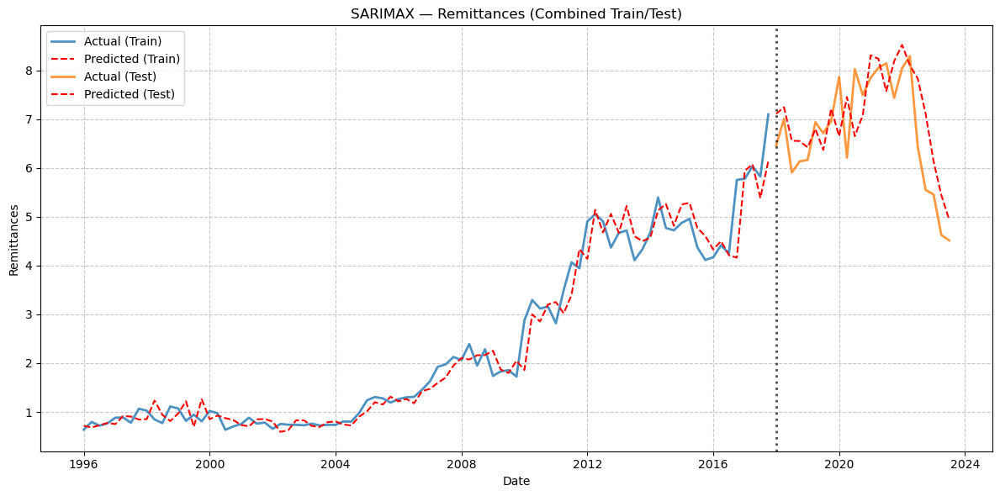

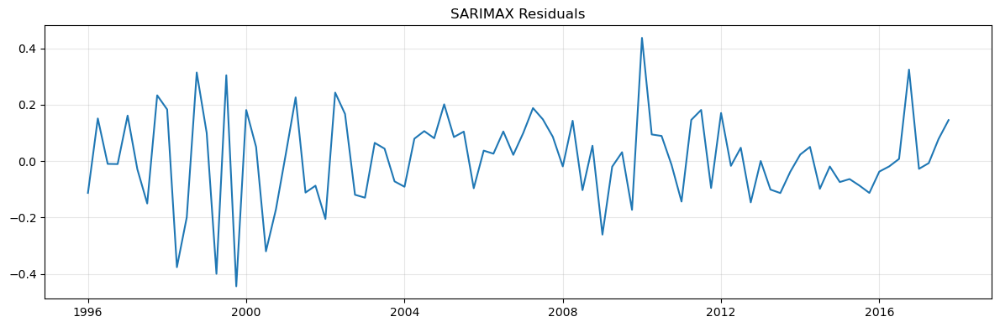

<Figure size 1200x400 with 0 Axes>

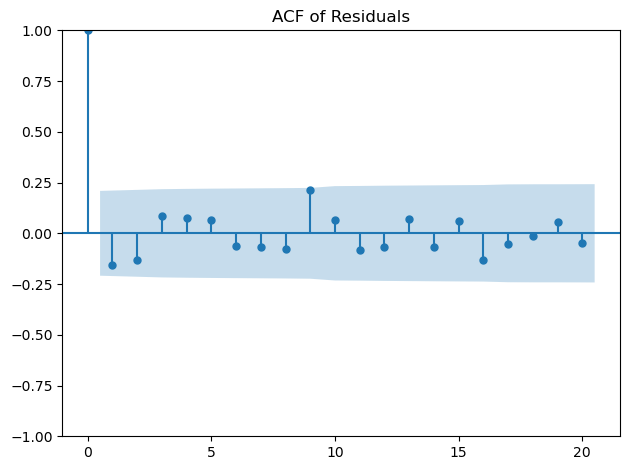


Model comparison saved to 'remittances_model_comparison.csv'

Remittances prediction with SARIMAX completed successfully!


In [79]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid

# =============== Data Preparation ================
df_model = df.copy()
df_model.index = pd.to_datetime(df_model.index)
df_model = df_model.sort_index()

# Target on log scale
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# ---- Build differenced + lagged exogenous series (ΔX then lag k) ----
# 1) ΔLOG_GCC_GDP with lag 4
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()
df_model["d_LOG_GCC_GDP_lag4"] = df_model["d_LOG_GCC_GDP"].shift(4)

# 2) ΔInflation with lags 2 and 4
df_model["EGYPT_INFLATION_PCHANGE_diff"] = df_model["EGYPT_INFLATION_PCHANGE"].diff()
df_model["EGYPT_INFLATION_PCHANGE_diff_lag2"] = df_model["EGYPT_INFLATION_PCHANGE_diff"].shift(2)
df_model["EGYPT_INFLATION_PCHANGE_diff_lag4"] = df_model["EGYPT_INFLATION_PCHANGE_diff"].shift(4)

# 3) ΔExchange rate with lag 5
df_model["Exchange_rate_EG_US_diff"] = df_model["Exchange_rate_EG_US"].diff()
df_model["Exchange_rate_EG_US_diff_lag5"] = df_model["Exchange_rate_EG_US_diff"].shift(5)


# Target differenced (for ARIMA d=1 on the mean equation in changes of log)
df_model["log_Remittances_diff"] = df_model["log_Remittances"].diff()
df_model["log_Remittances_diff_lag1"] = df_model["log_Remittances_diff"].shift(1)


# Final exogenous set (already differenced + lagged)
exog_vars =  ['log_Remittances_diff_lag1', 'd_LOG_GCC_GDP_lag4', 'EGYPT_INFLATION_PCHANGE_diff_lag2', 'EGYPT_INFLATION_PCHANGE_diff_lag4', 'Exchange_rate_EG_US_diff_lag5']


# Drop NA introduced by differencing and lagging
df_diff = df_model.dropna().copy()

# Construct X and y
X = df_diff[exog_vars].copy()
y = df_diff["log_Remittances_diff"].copy()

# Keep original (log) target to invert differencing later
original_target = df_model["log_Remittances"].copy()

# Train/test split (time-coherent)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

# =============== Helper Functions ====================
def inverse_differencing(original_series, diff_predictions, indices):
    """
    y_hat_t (log scale) = y_{t-1, actual (log)} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test, use_exog=True):
    try:
        if use_exog:
            model = SARIMAX(endog=y_train, exog=X_train,
                            order=order, seasonal_order=seasonal_order,
                            enforce_stationarity=False, enforce_invertibility=False)
        else:
            model = SARIMAX(endog=y_train,
                            order=order, seasonal_order=seasonal_order,
                            enforce_stationarity=False, enforce_invertibility=False)

        model_fit = model.fit(disp=False)

        # In-sample fitted (diff scale)
        y_train_pred = model_fit.fittedvalues

        # Forecast (diff scale)
        if use_exog:
            y_test_pred = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        else:
            y_test_pred = model_fit.get_forecast(steps=len(y_test)).predicted_mean

        # Back to log level via inverse differencing
        y_train_hat_log = inverse_differencing(original_target, y_train_pred, y_train.index)
        y_test_hat_log  = inverse_differencing(original_target, y_test_pred,  y_test.index)

        # Actual log levels at the same timestamps
        y_train_true_log = original_target.loc[y_train.index]
        y_test_true_log  = original_target.loc[y_test.index]

        # Metrics on ORIGINAL (level) scale
        y_train_true = np.exp(y_train_true_log.values)
        y_test_true  = np.exp(y_test_true_log.values)
        y_train_hat  = np.exp(y_train_hat_log.values)
        y_test_hat   = np.exp(y_test_hat_log.values)

        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse  = np.sqrt(mean_squared_error(y_test_true,  y_test_hat))
        train_r2   = r2_score(y_train_true, y_train_hat)
        test_r2    = r2_score(y_test_true,  y_test_hat)

        return {
            'order': order, 'seasonal_order': seasonal_order, 'use_exog': use_exog,
            'aic': model_fit.aic, 'bic': model_fit.bic,
            'train_rmse': train_rmse, 'test_rmse': test_rmse,
            'train_r2': train_r2, 'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': pd.Series(y_train_hat, index=y_train.index),
            'test_pred':  pd.Series(y_test_hat,  index=y_test.index),
            'train_actual': pd.Series(y_train_true, index=y_train.index),
            'test_actual':  pd.Series(y_test_true,  index=y_test.index)
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'use_exog': use_exog, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2,3],
    'd': [0, 1],
    'q': [0, 1, 2,3],
    'P': [0, 1,2],
    'D': [0, 1],
    'Q': [0, 1,2],
    's': [0, 4]  # quarterly seasonality
}
all_params = list(ParameterGrid(param_grid))

# =============== Grid Search (with & without exog) =======================
results = []
best_test_rmse = float('inf')
best_result = None

for use_exog in [True, False]:
    print("\n" + "="*52)
    print(f"Grid search with exogenous features: {use_exog}")
    print("="*52)
    for i, params in enumerate(all_params, start=1):
        order = (params['p'], params['d'], params['q'])
        seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
        res = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test, use_exog)
        if 'error' in res:
            print(f"{i}/{len(all_params)} {order}x{seasonal_order} exog={use_exog} -> ERROR: {res['error']}")
            continue
        results.append(res)
        print(f"{i}/{len(all_params)} {order}x{seasonal_order} exog={use_exog} | Test RMSE={res['test_rmse']:.4f} | Test R²={res['test_r2']:.4f}")
        if res['test_rmse'] < best_test_rmse:
            best_test_rmse = res['test_rmse']
            best_result = res

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'use_exog': r['use_exog'],
    'aic': r['aic'], 'bic': r['bic'],
    'train_rmse': r['train_rmse'], 'test_rmse': r['test_rmse'],
    'train_r2': r['train_r2'], 'test_r2': r['test_r2']
} for r in results])
results_df.to_csv('remittances_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_sarimax_grid_search_results.csv'")

# =============== Final Evaluation & Plots =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Uses exogenous features: {best_result['use_exog']}")
print(f"Test RMSE: {best_result['test_rmse']:.4f} | Test R²: {best_result['test_r2']:.4f}")

# Export summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# Predictions already on original scale in best_result
ytr_true = best_result['train_actual']; ytr_hat = best_result['train_pred']
yte_true = best_result['test_actual'];  yte_hat = best_result['test_pred']

# Save predictions
train_df = pd.DataFrame({'date': ytr_true.index, 'actual': ytr_true.values, 'predicted': ytr_hat.values, 'split': 'train'})
test_df  = pd.DataFrame({'date': yte_true.index, 'actual': yte_true.values, 'predicted': yte_hat.values, 'split': 'test'})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Combined plot
plt.figure(figsize=(12, 6))
plt.plot(pd.to_datetime(train_df['date']), train_df['actual'], label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(pd.to_datetime(train_df['date']), train_df['predicted'], 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(pd.to_datetime(test_df['date']),  test_df['actual'],  label='Actual (Test)', linewidth=2, alpha=0.8)
plt.plot(pd.to_datetime(test_df['date']),  test_df['predicted'], 'r--', label='Predicted (Test)', linewidth=1.5)
plt.axvline(x=pd.to_datetime(test_df['date'].iloc[0]), color='k', linestyle=':', linewidth=2, alpha=0.7)
plt.title('SARIMAX — Remittances (Combined Train/Test)')
plt.xlabel('Date'); plt.ylabel('Remittances'); plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('remittances_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Residual analysis
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 4)); plt.plot(residuals); plt.title("SARIMAX Residuals"); plt.grid(alpha=0.3); plt.tight_layout()
plt.savefig('remittances_sarimax_residuals.png', dpi=300, bbox_inches='tight'); plt.show()

from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 4)); plot_acf(residuals.dropna(), lags=20, alpha=0.05); plt.title("ACF of Residuals")
plt.tight_layout(); plt.savefig('remittances_sarimax_acf.png', dpi=300, bbox_inches='tight'); plt.show()

# Comparison row
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Uses_Exogenous': best_result['use_exog'],
    'Train RMSE': best_result['train_rmse'],
    'Test RMSE': best_result['test_rmse'],
    'Train R²': best_result['train_r2'],
    'Test R²': best_result['test_r2'],
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")
print("\nRemittances prediction with SARIMAX completed successfully!")



Grid search with exogenous features: True
1/1152 (0, 0, 0)x(0, 0, 0, 0) exog=True | Test RMSE=5.6254 | Test R²=-25.5325
2/1152 (0, 0, 0)x(0, 0, 0, 4) exog=True | Test RMSE=5.6254 | Test R²=-25.5325
3/1152 (0, 0, 1)x(0, 0, 0, 0) exog=True | Test RMSE=5.8365 | Test R²=-27.5612
4/1152 (0, 0, 1)x(0, 0, 0, 4) exog=True | Test RMSE=5.8365 | Test R²=-27.5612
5/1152 (0, 0, 2)x(0, 0, 0, 0) exog=True | Test RMSE=5.6683 | Test R²=-25.9394
6/1152 (0, 0, 2)x(0, 0, 0, 4) exog=True | Test RMSE=5.6683 | Test R²=-25.9394
7/1152 (0, 0, 3)x(0, 0, 0, 0) exog=True | Test RMSE=5.6789 | Test R²=-26.0397
8/1152 (0, 0, 3)x(0, 0, 0, 4) exog=True | Test RMSE=5.6789 | Test R²=-26.0397
9/1152 (1, 0, 0)x(0, 0, 0, 0) exog=True | Test RMSE=2.1378 | Test R²=-2.8319
10/1152 (1, 0, 0)x(0, 0, 0, 4) exog=True | Test RMSE=2.1378 | Test R²=-2.8319
11/1152 (1, 0, 1)x(0, 0, 0, 0) exog=True | Test RMSE=4.5584 | Test R²=-16.4224
12/1152 (1, 0, 1)x(0, 0, 0, 4) exog=True | Test RMSE=4.5584 | Test R²=-16.4224
13/1152 (1, 0, 2)x(0

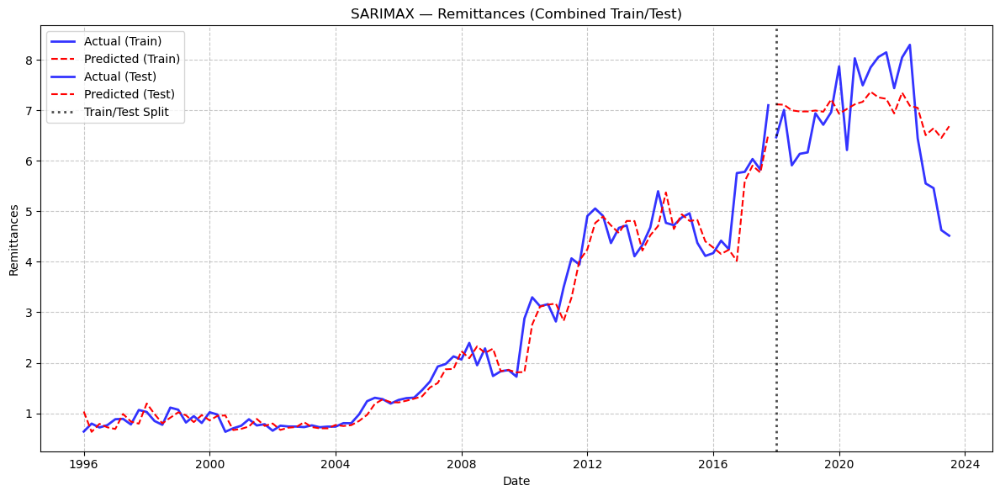

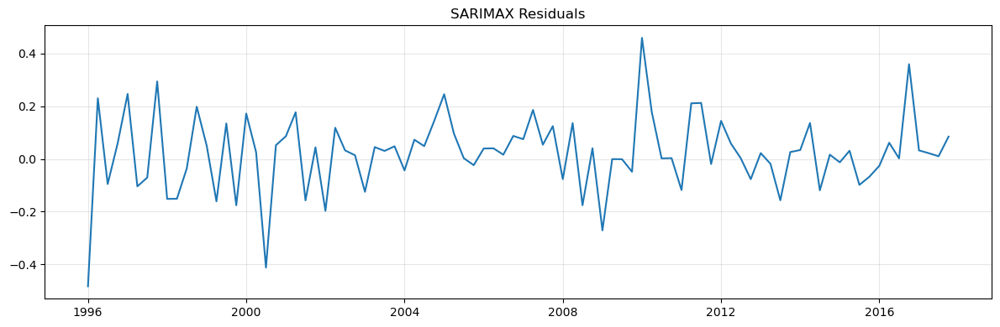

<Figure size 1200x400 with 0 Axes>

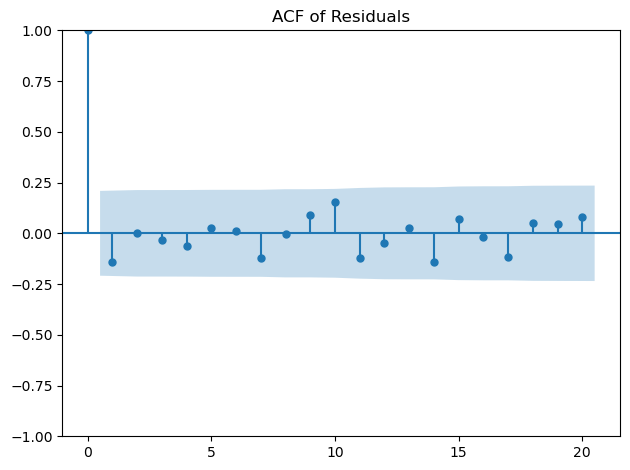


Model comparison saved to 'remittances_model_comparison.csv'

Remittances prediction with SARIMAX completed successfully!


In [73]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import ParameterGrid

# =============== Data Preparation ================
df_model = df.copy()
df_model.index = pd.to_datetime(df_model.index)
df_model = df_model.sort_index()

# Target on log scale
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# ---- Build differenced + lagged exogenous series (ΔX then lag k) ----
# 1) ΔLOG_GCC_GDP with lag 4
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()
df_model["d_LOG_GCC_GDP_lag4"] = df_model["d_LOG_GCC_GDP"].shift(4)

# 2) ΔInflation with lags 2 and 4
df_model["EGYPT_INFLATION_PCHANGE_diff"] = df_model["EGYPT_INFLATION_PCHANGE"].diff()
df_model["EGYPT_INFLATION_PCHANGE_diff_lag2"] = df_model["EGYPT_INFLATION_PCHANGE_diff"].shift(2)
df_model["EGYPT_INFLATION_PCHANGE_diff_lag4"] = df_model["EGYPT_INFLATION_PCHANGE_diff"].shift(4)

# 3) ΔExchange rate with lag 5
df_model["Exchange_rate_EG_US_diff"] = df_model["Exchange_rate_EG_US"].diff()
df_model["Exchange_rate_EG_US_diff_lag5"] = df_model["Exchange_rate_EG_US_diff"].shift(5)

# Final exogenous set (already differenced + lagged)
exog_vars = ['d_LOG_GCC_GDP_lag4',
             'EGYPT_INFLATION_PCHANGE_diff_lag2',
             'EGYPT_INFLATION_PCHANGE_diff_lag4',
             'Exchange_rate_EG_US_diff_lag5']

# Use the original log target (not differenced)
y = df_model["log_Remittances"].copy()

# Drop NA introduced by differencing and lagging in exogenous variables
df_clean = df_model.dropna(subset=exog_vars).copy()
X = df_clean[exog_vars].copy()
y = y.loc[df_clean.index]  # Align y with X

# Train/test split (time-coherent)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

# =============== Helper Functions ====================
def evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test, use_exog=True):
    try:
        if use_exog:
            model = SARIMAX(endog=y_train, exog=X_train,
                            order=order, seasonal_order=seasonal_order,
                            enforce_stationarity=False, enforce_invertibility=False)
        else:
            model = SARIMAX(endog=y_train,
                            order=order, seasonal_order=seasonal_order,
                            enforce_stationarity=False, enforce_invertibility=False)

        model_fit = model.fit(disp=False)

        # In-sample fitted (log scale)
        y_train_pred_log = model_fit.fittedvalues

        # Forecast (log scale)
        if use_exog:
            y_test_pred_log = model_fit.get_forecast(steps=len(y_test), exog=X_test).predicted_mean
        else:
            y_test_pred_log = model_fit.get_forecast(steps=len(y_test)).predicted_mean

        # Convert to original scale by exponentiating
        y_train_hat = np.exp(y_train_pred_log)
        y_test_hat = np.exp(y_test_pred_log)
        
        # Actual values in original scale
        y_train_true = np.exp(y_train)
        y_test_true = np.exp(y_test)

        # Calculate metrics
        train_rmse = np.sqrt(mean_squared_error(y_train_true, y_train_hat))
        test_rmse = np.sqrt(mean_squared_error(y_test_true, y_test_hat))
        train_r2 = r2_score(y_train_true, y_train_hat)
        test_r2 = r2_score(y_test_true, y_test_hat)

        return {
            'order': order, 'seasonal_order': seasonal_order, 'use_exog': use_exog,
            'aic': model_fit.aic, 'bic': model_fit.bic,
            'train_rmse': train_rmse, 'test_rmse': test_rmse,
            'train_r2': train_r2, 'test_r2': test_r2,
            'model_fit': model_fit,
            'train_pred': y_train_hat,
            'test_pred': y_test_hat,
            'train_actual': y_train_true,
            'test_actual': y_test_true
        }
    except Exception as e:
        return {'order': order, 'seasonal_order': seasonal_order, 'use_exog': use_exog, 'error': str(e)}

# =============== Hyperparameter Grid =======================
param_grid = {
    'p': [0, 1, 2, 3],
    'd': [0, 1],
    'q': [0, 1, 2, 3],
    'P': [0, 1, 2],
    'D': [0, 1],
    'Q': [0, 1, 2],
    's': [0, 4]  # quarterly seasonality
}
all_params = list(ParameterGrid(param_grid))

# =============== Grid Search (with & without exog) =======================
results = []
best_test_rmse = float('inf')
best_result = None

for use_exog in [True, False]:
    print("\n" + "="*52)
    print(f"Grid search with exogenous features: {use_exog}")
    print("="*52)
    for i, params in enumerate(all_params, start=1):
        order = (params['p'], params['d'], params['q'])
        seasonal_order = (params['P'], params['D'], params['Q'], params['s'])
        res = evaluate_sarimax_model(order, seasonal_order, X_train, y_train, X_test, y_test, use_exog)
        if 'error' in res:
            print(f"{i}/{len(all_params)} {order}x{seasonal_order} exog={use_exog} -> ERROR: {res['error']}")
            continue
        results.append(res)
        print(f"{i}/{len(all_params)} {order}x{seasonal_order} exog={use_exog} | Test RMSE={res['test_rmse']:.4f} | Test R²={res['test_r2']:.4f}")
        if res['test_rmse'] < best_test_rmse:
            best_test_rmse = res['test_rmse']
            best_result = res

# Save full results
results_df = pd.DataFrame([{
    'order': r['order'],
    'seasonal_order': r['seasonal_order'],
    'use_exog': r['use_exog'],
    'aic': r['aic'], 'bic': r['bic'],
    'train_rmse': r['train_rmse'], 'test_rmse': r['test_rmse'],
    'train_r2': r['train_r2'], 'test_r2': r['test_r2']
} for r in results])
results_df.to_csv('remittances_sarimax_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_sarimax_grid_search_results.csv'")

# =============== Final Evaluation & Plots =================
if best_result is None:
    raise SystemExit("No valid results from grid search.")

print("\nBest SARIMAX model for Remittances prediction:")
print(f"Order: {best_result['order']}")
print(f"Seasonal Order: {best_result['seasonal_order']}")
print(f"Uses exogenous features: {best_result['use_exog']}")
print(f"Test RMSE: {best_result['test_rmse']:.4f} | Test R²: {best_result['test_r2']:.4f}")

# Export summary
with open("remittances_sarimax_model_summary.txt", "w") as f:
    f.write(str(best_result['model_fit'].summary()))
print("Model summary saved as 'remittances_sarimax_model_summary.txt'")

# Get predictions from best model
ytr_hat = best_result['train_pred']
yte_hat = best_result['test_pred']
ytr_true = best_result['train_actual']
yte_true = best_result['test_actual']

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': ytr_true.values, 
    'predicted': ytr_hat.values, 
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': yte_true.values, 
    'predicted': yte_hat.values, 
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_sarimax_train_preds.csv", index=False)
test_df.to_csv("remittances_sarimax_test_preds.csv", index=False)
all_preds.to_csv("remittances_sarimax_predictions.csv", index=False)

# Combined plot
plt.figure(figsize=(12, 6))
plt.plot(ytr_true.index, ytr_true, 'b-', label='Actual (Train)', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, ytr_hat, 'r--', label='Predicted (Train)', linewidth=1.5)
plt.plot(yte_true.index, yte_true, 'b-', linewidth=2, alpha=0.8, color='blue', label='Actual (Test)')
plt.plot(yte_true.index, yte_hat, 'r--', linewidth=1.5, color='red', label='Predicted (Test)')
plt.axvline(x=yte_true.index[0], color='k', linestyle=':', linewidth=2, alpha=0.7, label='Train/Test Split')
plt.title('SARIMAX — Remittances (Combined Train/Test)')
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('remittances_sarimax_combined_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Residual analysis
residuals = best_result['model_fit'].resid
plt.figure(figsize=(12, 4))
plt.plot(residuals)
plt.title("SARIMAX Residuals")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('remittances_sarimax_residuals.png', dpi=300, bbox_inches='tight')
plt.show()

from statsmodels.graphics.tsaplots import plot_acf
plt.figure(figsize=(12, 4))
plot_acf(residuals.dropna(), lags=20, alpha=0.05)
plt.title("ACF of Residuals")
plt.tight_layout()
plt.savefig('remittances_sarimax_acf.png', dpi=300, bbox_inches='tight')
plt.show()

# Comparison row
comparison_df = pd.DataFrame([{
    'Model': 'SARIMAX',
    'Order': str(best_result['order']),
    'Seasonal_Order': str(best_result['seasonal_order']),
    'Uses_Exogenous': best_result['use_exog'],
    'Train RMSE': best_result['train_rmse'],
    'Test RMSE': best_result['test_rmse'],
    'Train R²': best_result['train_r2'],
    'Test R²': best_result['test_r2'],
    'AIC': best_result['aic'],
    'BIC': best_result['bic']
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")
print("\nRemittances prediction with SARIMAX completed successfully!")

## Gru

Total number of parameter combinations: 128
Starting grid search for Remittances prediction...
Testing combination 1/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 5, 'units': 20}
  Diff Test R²: -0.3714 | Orig Test R²: 0.3913
Testing combination 2/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 5, 'units': 40}
  Diff Test R²: -0.4949 | Orig Test R²: 0.3364
Testing combination 3/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 10, 'units': 20}
  Diff Test R²: -1.0230 | Orig Test R²: 0.2136
Testing combination 4/128: {'batch_size': 8, 'dropout': 0.0, 'layers': 1, 'learning_rate': 0.01, 'optimizer': 'adam', 'rnn_type': 'GRU', 'timesteps': 10, 'units': 40}
  Diff Test R²: -0.1588 | Orig Test R²: 0.5496
Testing combination 5/128: {'batch_size': 8, 'dropo

Model saved as 'remittances_gru_model.h5'


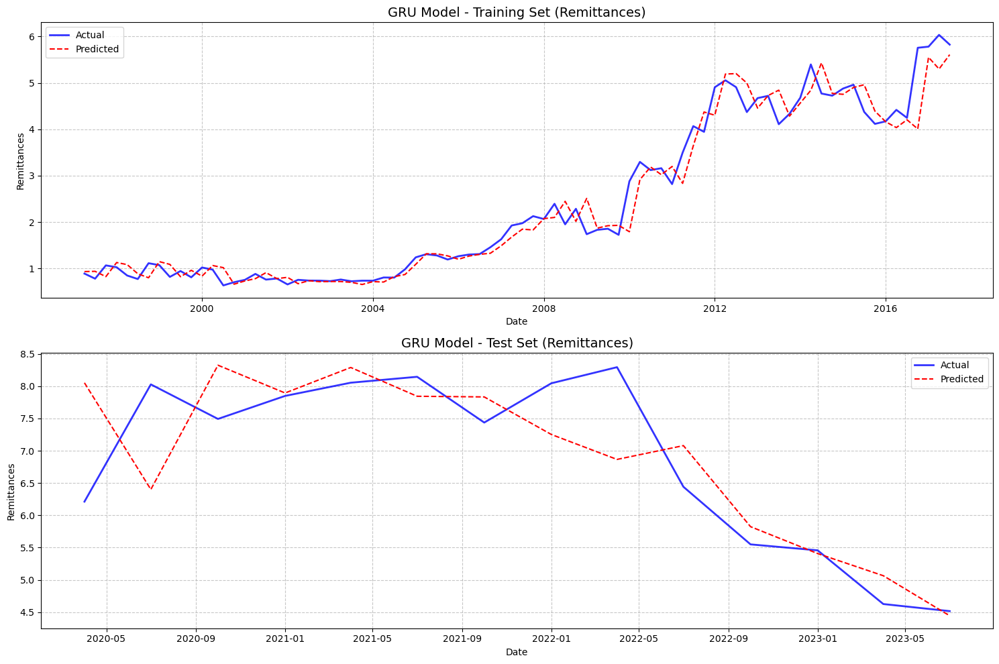


GRU Model Performance (Original Scale - Remittances):
Train RMSE: 0.1479 | Test RMSE: 0.1198
Train R²: 0.9613 | Test R²: 0.6703

Model comparison saved to 'remittances_model_comparison.csv'

Remittances prediction completed successfully!


In [498]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import matplotlib.pyplot as plt
import tensorflow as tf
import random
import os, time, ast
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import ParameterGrid

# =============== Set Random Seeds for Reproducibility =================
SEED = 123
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# =============== Data Preparation ================
# Create a copy of the dataframe
df_model = df.copy()

# Log transform target variable
df_model["log_Remittances"] = np.log(df_model["Worker_Remittances"])

# Create differenced version of LOG_GCC_GDP
df_model["d_LOG_GCC_GDP"] = df_model["LOG_GCC_GDP"].diff()

# Post-float dummy (from November 2016) and interaction with Exchange Rate (EGP per USD)
df_model["Post2016"] = (df_model.index >= "2016-11-01").astype(int)
df_model["ER_Post2016"] = df_model["Exchange_rate_EG_US"] * df_model["Post2016"]

# Define exogenous variables - use the differenced version of LOG_GCC_GDP
exog_vars = ["d_LOG_GCC_GDP", "ER_Post2016", "EGYPT_INFLATION_PCHANGE"]
target = "log_Remittances"

# Store original target for later inverse transformation
original_target = df_model[target].copy()

# Create first differences for all variables (except those already differenced)
for var in exog_vars:
    if var != "d_LOG_GCC_GDP":  # Skip if already differenced
        df_model[f'{var}_diff'] = df_model[var].diff()
df_model[target + "_diff"] = df_model[target].diff()

# Remove rows with NaN values (created by differencing)
df_diff = df_model.dropna().copy()
exog_vars_diff = [f'{var}_diff' if var != "d_LOG_GCC_GDP" else var for var in exog_vars]
X = df_diff[exog_vars_diff]
y = df_diff[f'{target}_diff']

# Time-based train/test split (80/20)
train_size = int(len(X) * 0.8)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
train_indices, test_indices = X_train.index, X_test.index

# Scale features using training data only
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# =============== Helper Functions ====================
def make_sequences(X_scaled, y_series, idx, timesteps):
    """Create sequences for RNN training"""
    X_seq, y_seq, idx_used = [], [], []
    for i in range(timesteps, len(X_scaled)):
        X_seq.append(X_scaled[i - timesteps:i])
        y_seq.append(y_series.iloc[i])
        idx_used.append(idx[i])
    return np.array(X_seq), np.array(y_seq), pd.Index(idx_used)

def inverse_differencing(original_series, diff_predictions, indices):
    """
    Convert differenced predictions back to original scale
    y_t_hat = y_{t-1, actual} + diff_hat_t
    """
    out = []
    for i, idx in enumerate(indices):
        pos = original_series.index.get_loc(idx)
        prev_val = original_series.iloc[pos - 1] if pos > 0 else original_series.iloc[pos]
        out.append(prev_val + diff_predictions[i])
    return pd.Series(out, index=indices)

def build_model(params, input_dim, timesteps):
    """Build GRU model with specified parameters"""
    model = Sequential()
    return_sequences = params['layers'] > 1
    
    # First GRU layer
    model.add(GRU(params['units'], input_shape=(timesteps, input_dim),
                  return_sequences=return_sequences, activation='tanh'))
    
    # Add dropout if specified
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    
    # Add second GRU layer if specified
    if params['layers'] > 1:
        model.add(GRU(params['units'] // 2, return_sequences=False, activation='tanh'))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    
    # Output layer
    model.add(Dense(1))
    
    # Compile model
    opt = Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=opt, loss='mse')
    return model

def evaluate_on_both_scales(model, X_train_seq, y_train_seq, idx_train_used,
                            X_test_seq, y_test_seq, idx_test_used):
    """Evaluate model performance on both differenced and original scales"""
    # Predictions in differenced space
    ytr_pred_d = model.predict(X_train_seq, verbose=0).flatten()
    yte_pred_d = model.predict(X_test_seq, verbose=0).flatten()

    # Metrics for differenced data
    train_rmse_diff = np.sqrt(mean_squared_error(y_train_seq, ytr_pred_d))
    test_rmse_diff = np.sqrt(mean_squared_error(y_test_seq, yte_pred_d))
    train_mae_diff = mean_absolute_error(y_train_seq, ytr_pred_d)
    test_mae_diff = mean_absolute_error(y_test_seq, yte_pred_d)
    train_r2_diff = r2_score(y_train_seq, ytr_pred_d)
    test_r2_diff = r2_score(y_test_seq, yte_pred_d)

    # Convert back to original scale
    ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_train_used)
    yte_hat = inverse_differencing(original_target, yte_pred_d, idx_test_used)
    ytr_true = original_target.loc[idx_train_used]
    yte_true = original_target.loc[idx_test_used]

    # Metrics for original scale
    train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
    test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
    train_r2_orig = r2_score(ytr_true, ytr_hat)
    test_r2_orig = r2_score(yte_true, yte_hat)

    return {
        'train_rmse_diff': train_rmse_diff, 'test_rmse_diff': test_rmse_diff,
        'train_mae_diff': train_mae_diff, 'test_mae_diff': test_mae_diff,
        'train_r2_diff': train_r2_diff, 'test_r2_diff': test_r2_diff,
        'train_rmse_orig': train_rmse_orig, 'test_rmse_orig': test_rmse_orig,
        'train_r2_orig': train_r2_orig, 'test_r2_orig': test_r2_orig
    }

# =============== Hyperparameter Grid =======================
param_grid = {
    'rnn_type': ['GRU'],            # keep GRU only
    'units': [20, 40],
    'layers': [1, 2],
    'dropout': [0.0, 0.2],
    'timesteps': [5, 10],
    'batch_size': [8, 16],
    'learning_rate': [0.01, 0.001],
    'optimizer': ['adam', 'rmsprop']
}

all_params = list(ParameterGrid(param_grid))
print(f"Total number of parameter combinations: {len(all_params)}")

# =============== Grid Search =======================
checkpoint_file = 'remittances_gru_grid_search_checkpoint.csv'
results = []

# Load previous results if available
if os.path.exists(checkpoint_file):
    try:
        checkpoint_df = pd.read_csv(checkpoint_file)
        if 'params' in checkpoint_df.columns:
            checkpoint_df['params'] = checkpoint_df['params'].apply(
                lambda x: ast.literal_eval(x) if isinstance(x, str) else x
            )
        results = checkpoint_df.to_dict('records')
        print(f"Loaded {len(results)} previous results from checkpoint")
    except Exception as e:
        print(f"Error loading checkpoint: {e}")

def save_checkpoint_row(row):
    """Save a row of results to checkpoint file"""
    df_row = pd.DataFrame([row]).copy()
    if 'params' in df_row.columns:
        df_row['params'] = df_row['params'].astype(str)
    if not os.path.exists(checkpoint_file):
        df_row.to_csv(checkpoint_file, index=False)
    else:
        df_row.to_csv(checkpoint_file, mode='a', header=False, index=False)

# Track best model during grid search
BEST_WEIGHTS_PATH = 'best_gru_remittances_model.weights.h5'
best_original_test_r2 = -np.inf
best_row = None

print("Starting grid search for Remittances prediction...")
for i, params in enumerate(all_params, start=1):
    # Skip already completed parameter combinations
    if any(str(params) == str(r.get('params')) for r in results):
        print(f"Skipping combination {i}/{len(all_params)} (already completed)")
        continue

    print(f"Testing combination {i}/{len(all_params)}: {params}")
    timesteps = params['timesteps']

    # Create sequences
    Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
    Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled, y_test, test_indices, timesteps)

    # Build and train model
    model = build_model(params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
    
    # Callbacks
    early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
    tmp_ckpt = f"_tmp_remittances_{i}.weights.h5"
    checkpoint = ModelCheckpoint(tmp_ckpt, monitor='val_loss', save_best_only=True, 
                                save_weights_only=True, verbose=0)

    # Train model
    t0 = time.time()
    history = model.fit(
        Xtr_seq, ytr_seq,
        validation_data=(Xte_seq, yte_seq),
        epochs=200,
        batch_size=params['batch_size'],
        callbacks=[early_stop, checkpoint],
        verbose=0
    )
    train_time = time.time() - t0
    
    # Load best weights for this parameter combination
    if os.path.exists(tmp_ckpt):
        model.load_weights(tmp_ckpt)

    # Calculate validation loss (average of last 5 epochs)
    val_loss = np.mean(history.history['val_loss'][-5:]) if len(history.history['val_loss']) >= 5 else history.history['val_loss'][-1]

    # Evaluate model
    metrics = evaluate_on_both_scales(model, Xtr_seq, ytr_seq, idx_tr_used, Xte_seq, yte_seq, idx_te_used)

    # Store results
    row = {
        'params': params,
        'val_loss': val_loss,
        'epochs_used': len(history.history['loss']),
        'training_time': train_time,
        **metrics
    }
    results.append(row)
    save_checkpoint_row(row)

    print(f"  Diff Test R²: {metrics['test_r2_diff']:.4f} | Orig Test R²: {metrics['test_r2_orig']:.4f}")

    # Update best model if this one is better
    if metrics['test_r2_orig'] > best_original_test_r2:
        best_original_test_r2 = metrics['test_r2_orig']
        best_row = row.copy()
        model.save_weights(BEST_WEIGHTS_PATH)
    
    # Clean up temporary checkpoint
    try:
        if os.path.exists(tmp_ckpt):
            os.remove(tmp_ckpt)
    except:
        pass

# Save full results
results_df = pd.DataFrame(results)
results_df.to_csv('remittances_gru_grid_search_results.csv', index=False)
print("Grid search results saved to 'remittances_gru_grid_search_results.csv'")

# =============== Final Evaluation =================
if best_row is None:
    raise SystemExit("No valid results from grid search.")

best_params = best_row['params']
print("\nBest GRU model for Remittances prediction:")
print("Parameters:", best_params)
print(f"Test R² (original): {best_row['test_r2_orig']:.4f}")

# Rebuild and evaluate the best model
timesteps = best_params['timesteps']
Xtr_seq, ytr_seq, idx_tr_used = make_sequences(X_train_scaled, y_train, train_indices, timesteps)
Xte_seq, yte_seq, idx_te_used = make_sequences(X_test_scaled, y_test, test_indices, timesteps)

model = build_model(best_params, input_dim=Xtr_seq.shape[2], timesteps=timesteps)
model.load_weights(BEST_WEIGHTS_PATH)

# Make predictions
ytr_pred_d = model.predict(Xtr_seq, verbose=0).flatten()
yte_pred_d = model.predict(Xte_seq, verbose=0).flatten()

# Convert back to original scale
ytr_hat = inverse_differencing(original_target, ytr_pred_d, idx_tr_used)
yte_hat = inverse_differencing(original_target, yte_pred_d, idx_te_used)
ytr_true = original_target.loc[idx_tr_used]
yte_true = original_target.loc[idx_te_used]

# Calculate final metrics
train_rmse_orig = np.sqrt(mean_squared_error(ytr_true, ytr_hat))
test_rmse_orig = np.sqrt(mean_squared_error(yte_true, yte_hat))
train_r2_orig = r2_score(ytr_true, ytr_hat)
test_r2_orig = r2_score(yte_true, yte_hat)

# Save predictions
train_df = pd.DataFrame({
    'date': ytr_true.index, 
    'actual': np.exp(ytr_true.values),  # Convert back from log scale
    'predicted': np.exp(ytr_hat.values),
    'split': 'train'
})
test_df = pd.DataFrame({
    'date': yte_true.index, 
    'actual': np.exp(yte_true.values),  # Convert back from log scale
    'predicted': np.exp(yte_hat.values),
    'split': 'test'
})
all_preds = pd.concat([train_df, test_df])
train_df.to_csv("remittances_gru_train_preds.csv", index=False)
test_df.to_csv("remittances_gru_test_preds.csv", index=False)
all_preds.to_csv("remittances_gru_predictions.csv", index=False)

# Save model
model.save("remittances_gru_model.h5")
print("Model saved as 'remittances_gru_model.h5'")

# =============== Plot Results =================
plt.figure(figsize=(15, 10))

# Training set
plt.subplot(2, 1, 1)
plt.plot(ytr_true.index, np.exp(ytr_true), 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(ytr_true.index, np.exp(ytr_hat), 'r--', label='Predicted', linewidth=1.5)
plt.title('GRU Model - Training Set (Remittances)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Test set
plt.subplot(2, 1, 2)
plt.plot(yte_true.index, np.exp(yte_true), 'b-', label='Actual', linewidth=2, alpha=0.8)
plt.plot(yte_true.index, np.exp(yte_hat), 'r--', label='Predicted', linewidth=1.5)
plt.title('GRU Model - Test Set (Remittances)', fontsize=14)
plt.xlabel('Date')
plt.ylabel('Remittances')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('remittances_gru_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Print final performance
print("\nGRU Model Performance (Original Scale - Remittances):")
print(f"Train RMSE: {train_rmse_orig:.4f} | Test RMSE: {test_rmse_orig:.4f}")
print(f"Train R²: {train_r2_orig:.4f} | Test R²: {test_r2_orig:.4f}")

# Save comparison table
comparison_df = pd.DataFrame([{
    'Model': 'GRU',
    'Train RMSE': train_rmse_orig,
    'Test RMSE': test_rmse_orig,
    'Train R²': train_r2_orig,
    'Test R²': test_r2_orig,
    'Parameters': str(best_params)
}])
comparison_df.to_csv('remittances_model_comparison.csv', index=False)
print("\nModel comparison saved to 'remittances_model_comparison.csv'")

print("\nRemittances prediction completed successfully!")

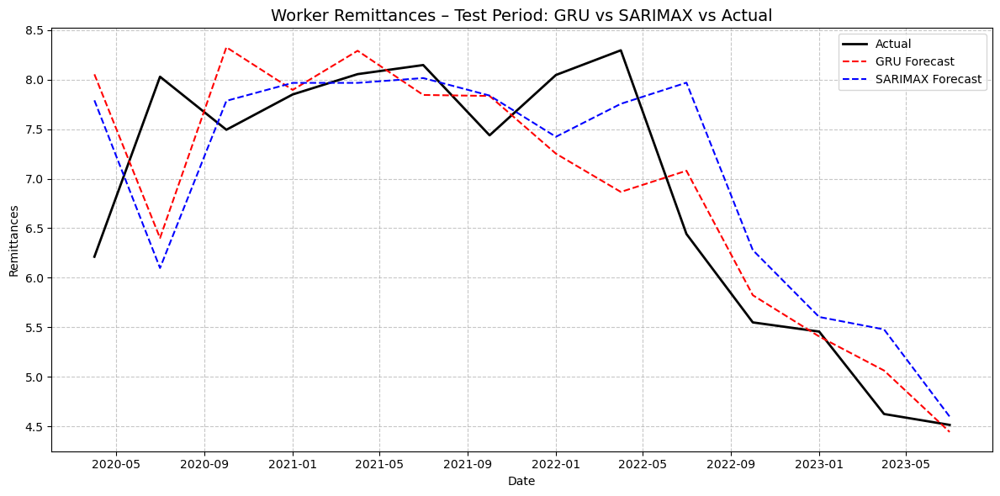

In [101]:
import pandas as pd
import matplotlib.pyplot as plt

# =======================
# Load saved results
# =======================
# Update with your actual file names if different
gru_file = r"C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Remittences results\remittances_gru_test_preds.csv"
arima_file = r"C:\Users\dinat\OneDrive\Data science deploma\project - Current account proj\Remittences results\Arima final\remittances_sarimax_test_preds.csv"

# Load GRU predictions
gru_df = pd.read_csv(gru_file, parse_dates=['date'])
gru_df.set_index('date', inplace=True)

# Load ARIMA predictions
arima_df = pd.read_csv(arima_file, parse_dates=['date'])
arima_df.set_index('date', inplace=True)

# Ensure same date alignment
common_index = gru_df.index.intersection(arima_df.index)
gru_df = gru_df.loc[common_index]
arima_df = arima_df.loc[common_index]

# =======================
# Plot results
# =======================
plt.figure(figsize=(12,6))
plt.plot(gru_df.index, gru_df['actual'], 'k-', label='Actual', linewidth=2)
plt.plot(gru_df.index, gru_df['predicted'], 'r--', label='GRU Forecast', linewidth=1.5)
plt.plot(arima_df.index, arima_df['predicted'], 'b--', label='SARIMAX Forecast', linewidth=1.5)

plt.title("Worker Remittances – Test Period: GRU vs SARIMAX vs Actual", fontsize=14)
plt.xlabel("Date")
plt.ylabel("Remittances")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.7)
plt.tight_layout()
plt.savefig("remittances_gru_vs_arima_test.png", dpi=300, bbox_inches="tight")
plt.show()
